## ResNet50

In [1]:
%load_ext autoreload
%autoreload 2
import torch
import torch.nn as nn
from torchvision import transforms
from torch.utils.data import DataLoader
from dl_utils.utils.dataset import viz_dataloader, split_train_valid, hdf5_dataset
from dl_utils.training.build_model import resnet50_, fpn_resnet50_classification
from dl_utils.training.trainer import Trainer, accuracy
from dl_utils.packed_functions import benchmark_task

ds_path_info = {'imagenet': '../../datasets/imagenet_v5_rot_10m_fix_vector.h5',
                'noise': '../../datasets/noise_v5_rot_1m_fix_vector.h5',
                'atom': '../../datasets/atom_v5_rot_1m_fix_vector.h5',
                'viz_dataloader': False}

training_specs = {'batch_size': 1800, 
                  'num_workers': 12, 
                  'device_ids': [3,5,6], 
                  'shuffle': True,
                  'learning_rate': 1e-3,
                  'epochs': 1000,
                  'validation_times': 200,
                  'training_image_count': 10000000*20, # 20 epochs of 10 million images of full imagenet dataset
                  'efficient_print': True,
                  'model_path': '../../models/ResNet50/',
}

config = {'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
    
wandb_specs = {'config': config,
                'project': 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning',
                'entity': 'yig319',
                'group': 'benchmark',
                'save_code': True,
                'resume': 'allow'}

model = resnet50_(in_channels=3, n_classes=17)
task_name = '03132025-ResNet50-benchmark'

/mnt/scratch/home/yichen/anaconda3/envs/symmetry/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### full size dataset - 10 million

In [ ]:
model.load_state_dict(torch.load('../../models/ResNet50/09112024-resnet50-dataset_v5_size-10m/model_epoch_20.pth', weights_only=True, map_location=torch.device('cpu')))

training_specs['epoch_start'] = 15
training_specs['ds_size'] = 10000000
training_specs['folder_name'] = '09112024-resnet50-dataset_v5_size-10m'

model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: yig319 to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


[15, 16, 17, 18, 19, 20, 21, 22, 23]
Epoch: 16/24


Train: 100%|██████████| 4522/4522 [1:47:18<00:00,  1.42s/it]


train_loss: 0.0434, train_accuracy: 98.56%


Valid: 100%|██████████| 1131/1131 [17:12<00:00,  1.10it/s]


valid_loss: 0.0430, valid_accuracy: 98.47%
Model saved at epoch 15
Saved new best model at epoch 15 with valid dataset


Valid: 100%|██████████| 557/557 [08:07<00:00,  1.14it/s]


noise_loss: 0.1400, noise_accuracy: 94.77%


Valid: 100%|██████████| 557/557 [07:57<00:00,  1.17it/s]


atom_loss: 0.6912, atom_accuracy: 84.88%
Model saved at epoch 16
Epoch: 17/24


Train: 100%|██████████| 4522/4522 [1:48:29<00:00,  1.44s/it]


train_loss: 0.0487, train_accuracy: 98.37%


Valid: 100%|██████████| 1131/1131 [17:43<00:00,  1.06it/s]


valid_loss: 0.0483, valid_accuracy: 98.28%


Valid: 100%|██████████| 557/557 [08:41<00:00,  1.07it/s]


noise_loss: 0.1848, noise_accuracy: 93.07%


Valid: 100%|██████████| 557/557 [08:34<00:00,  1.08it/s]


atom_loss: 0.7380, atom_accuracy: 83.46%
Model saved at epoch 17
Epoch: 18/24


Train: 100%|██████████| 4522/4522 [1:47:18<00:00,  1.42s/it]


train_loss: 0.0506, train_accuracy: 98.29%


Valid: 100%|██████████| 1131/1131 [16:39<00:00,  1.13it/s]


valid_loss: 0.0482, valid_accuracy: 98.30%


Valid: 100%|██████████| 557/557 [08:15<00:00,  1.12it/s]


noise_loss: 0.1707, noise_accuracy: 93.66%


Valid: 100%|██████████| 557/557 [08:19<00:00,  1.11it/s]


atom_loss: 1.0097, atom_accuracy: 79.46%
Model saved at epoch 18
Epoch: 19/24


Train: 100%|██████████| 4522/4522 [1:46:29<00:00,  1.41s/it]


train_loss: 0.0470, train_accuracy: 98.39%


Valid: 100%|██████████| 1131/1131 [16:57<00:00,  1.11it/s]


valid_loss: 0.0432, valid_accuracy: 98.45%


Valid: 100%|██████████| 557/557 [08:14<00:00,  1.13it/s]


noise_loss: 0.1613, noise_accuracy: 94.21%


Valid: 100%|██████████| 557/557 [08:15<00:00,  1.12it/s]


atom_loss: 0.6173, atom_accuracy: 84.71%
Model saved at epoch 19
Epoch: 20/24


Train: 100%|██████████| 4522/4522 [1:47:43<00:00,  1.43s/it]


train_loss: 0.0434, train_accuracy: 98.49%


Valid: 100%|██████████| 1131/1131 [16:49<00:00,  1.12it/s]


valid_loss: 0.0411, valid_accuracy: 98.51%
Model saved at epoch 19
Saved new best model at epoch 19 with valid dataset


Valid: 100%|██████████| 557/557 [08:13<00:00,  1.13it/s]


noise_loss: 0.1240, noise_accuracy: 95.47%


Valid: 100%|██████████| 557/557 [08:20<00:00,  1.11it/s]


atom_loss: 0.9196, atom_accuracy: 84.98%
Model saved at epoch 20
Epoch: 21/24


Train: 100%|██████████| 4522/4522 [1:47:46<00:00,  1.43s/it]


train_loss: 0.0400, train_accuracy: 98.59%


Valid: 100%|██████████| 1131/1131 [17:07<00:00,  1.10it/s]


valid_loss: 0.0393, valid_accuracy: 98.57%
Model saved at epoch 20
Saved new best model at epoch 20 with valid dataset


Valid: 100%|██████████| 557/557 [08:30<00:00,  1.09it/s]


noise_loss: 0.1300, noise_accuracy: 95.49%


Valid: 100%|██████████| 557/557 [08:37<00:00,  1.08it/s]


atom_loss: 0.8409, atom_accuracy: 87.20%
Model saved at epoch 21
Epoch: 22/24


Train: 100%|██████████| 4522/4522 [1:50:15<00:00,  1.46s/it]


train_loss: 0.0371, train_accuracy: 98.67%


Valid: 100%|██████████| 1131/1131 [17:39<00:00,  1.07it/s]


valid_loss: 0.0374, valid_accuracy: 98.64%
Model saved at epoch 21
Saved new best model at epoch 21 with valid dataset


Valid: 100%|██████████| 557/557 [08:25<00:00,  1.10it/s]


noise_loss: 0.1149, noise_accuracy: 96.25%


Valid: 100%|██████████| 557/557 [08:27<00:00,  1.10it/s]


atom_loss: 0.9669, atom_accuracy: 86.31%
Model saved at epoch 22
Epoch: 23/24


Train: 100%|██████████| 4522/4522 [1:46:11<00:00,  1.41s/it]


train_loss: 0.0349, train_accuracy: 98.74%


Valid: 100%|██████████| 1131/1131 [17:04<00:00,  1.10it/s]


valid_loss: 0.0368, valid_accuracy: 98.67%
Model saved at epoch 22
Saved new best model at epoch 22 with valid dataset


Valid: 100%|██████████| 557/557 [08:01<00:00,  1.16it/s]


noise_loss: 0.1342, noise_accuracy: 96.19%


Valid: 100%|██████████| 557/557 [07:45<00:00,  1.20it/s]


atom_loss: 0.9798, atom_accuracy: 88.38%
Model saved at epoch 23
Epoch: 24/24


Train:  30%|██▉       | 1345/4522 [31:29<1:14:22,  1.40s/it]


KeyboardInterrupt: 

Error in callback <bound method _WandbInit._pause_backend of <wandb.sdk.wandb_init._WandbInit object at 0x7f2283fe9950>> (for post_run_cell), with arguments args (<ExecutionResult object at 7f2287838dd0, execution_count=2 error_before_exec=None error_in_exec= info=<ExecutionInfo object at 7f2289766ed0, raw_cell="model.load_state_dict(torch.load('../../models/Res.." store_history=True silent=False shell_futures=True cell_id=vscode-notebook-cell://ssh-remote%2Bm3kube.urcf.drexel.edu/mnt/scratch/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/notebooks/benchmark/ResNet50-training.ipynb#W2sdnNjb2RlLXJlbW90ZQ%3D%3D> result=None>,),kwargs {}:


MailboxClosedError: 

In [ ]:
training_specs['ds_size'] = 10000000
training_specs['folder_name'] = task_name + '-10m'
model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: yig319 to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
Epoch: 1/24


Train:   2%|▏         | 70/4522 [01:42<1:43:49,  1.40s/it]

### 1K training dataset size 

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: yig319 to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


[0, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000, 11000, 12000, 13000, 14000, 15000, 16000, 17000, 18000, 19000, 20000, 21000, 22000, 23000, 24000, 25000, 26000, 27000, 28000, 29000, 30000, 31000, 32000, 33000, 34000, 35000, 36000, 37000, 38000, 39000, 40000, 41000, 42000, 43000, 44000, 45000, 46000, 47000, 48000, 49000, 50000, 51000, 52000, 53000, 54000, 55000, 56000, 57000, 58000, 59000, 60000, 61000, 62000, 63000, 64000, 65000, 66000, 67000, 68000, 69000, 70000, 71000, 72000, 73000, 74000, 75000, 76000, 77000, 78000, 79000, 80000, 81000, 82000, 83000, 84000, 85000, 86000, 87000, 88000, 89000, 90000, 91000, 92000, 93000, 94000, 95000, 96000, 97000, 98000, 99000, 100000, 101000, 102000, 103000, 104000, 105000, 106000, 107000, 108000, 109000, 110000, 111000, 112000, 113000, 114000, 115000, 116000, 117000, 118000, 119000, 120000, 121000, 122000, 123000, 124000, 125000, 126000, 127000, 128000, 129000, 130000, 131000, 132000, 133000, 134000, 135000, 136000, 137000, 138000, 

Train: 100%|██████████| 1/1 [00:03<00:00,  3.92s/it]


train_loss: 3.1383, train_accuracy: 5.50%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


valid_loss: 2.8343, valid_accuracy: 6.00%
Model saved at epoch 0
Saved new best model at epoch 0 with valid dataset


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.11s/it]


noise_loss: 2.8374, noise_accuracy: 5.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


atom_loss: 2.8363, atom_accuracy: 6.80%
Model saved at epoch 1000
Epoch: 1001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.2248, train_accuracy: 98.50%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.29it/s]


valid_loss: 3.0891, valid_accuracy: 10.40%
Model saved at epoch 1000
Saved new best model at epoch 1000 with valid dataset


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.90s/it]


noise_loss: 3.1853, noise_accuracy: 6.10%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


atom_loss: 3.1805, atom_accuracy: 5.90%
Model saved at epoch 2000
Epoch: 2001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 0.1048, train_accuracy: 98.30%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


valid_loss: 3.3774, valid_accuracy: 10.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


noise_loss: 3.4784, noise_accuracy: 5.50%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.84s/it]


atom_loss: 3.4969, atom_accuracy: 5.60%
Model saved at epoch 3000
Epoch: 3001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0735, train_accuracy: 98.50%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.20it/s]


valid_loss: 3.7491, valid_accuracy: 8.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


noise_loss: 3.9273, noise_accuracy: 4.50%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


atom_loss: 3.5734, atom_accuracy: 6.70%
Model saved at epoch 4000
Epoch: 4001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


train_loss: 0.1220, train_accuracy: 96.50%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


valid_loss: 4.2441, valid_accuracy: 10.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


noise_loss: 4.7244, noise_accuracy: 4.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


atom_loss: 3.9848, atom_accuracy: 7.70%
Model saved at epoch 5000
Epoch: 5001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


train_loss: 0.0470, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.27it/s]


valid_loss: 4.6658, valid_accuracy: 9.60%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.86s/it]


noise_loss: 4.7961, noise_accuracy: 6.40%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.87s/it]


atom_loss: 3.9983, atom_accuracy: 6.20%
Model saved at epoch 6000
Epoch: 6001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0469, train_accuracy: 98.50%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.30it/s]


valid_loss: 4.9800, valid_accuracy: 9.60%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]


noise_loss: 4.8567, noise_accuracy: 6.20%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.88s/it]


atom_loss: 4.8110, atom_accuracy: 6.40%
Model saved at epoch 7000
Epoch: 7001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


train_loss: 0.0403, train_accuracy: 98.70%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


valid_loss: 5.4223, valid_accuracy: 10.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


noise_loss: 5.3580, noise_accuracy: 7.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


atom_loss: 4.8440, atom_accuracy: 5.50%
Model saved at epoch 8000
Epoch: 8001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


train_loss: 0.0414, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


valid_loss: 5.8735, valid_accuracy: 9.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


noise_loss: 8.5436, noise_accuracy: 6.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


atom_loss: 5.4195, atom_accuracy: 8.30%
Model saved at epoch 9000
Epoch: 9001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.58s/it]


train_loss: 0.0604, train_accuracy: 98.20%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


valid_loss: 6.1608, valid_accuracy: 7.60%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.93s/it]


noise_loss: 6.4148, noise_accuracy: 5.40%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.91s/it]


atom_loss: 6.0120, atom_accuracy: 6.30%
Model saved at epoch 10000
Epoch: 10001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


train_loss: 0.0336, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.11it/s]


valid_loss: 5.3402, valid_accuracy: 10.80%
Model saved at epoch 10000
Saved new best model at epoch 10000 with valid dataset


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.96s/it]


noise_loss: 6.0566, noise_accuracy: 5.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


atom_loss: 4.8660, atom_accuracy: 7.60%
Model saved at epoch 11000
Epoch: 11001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.61s/it]


train_loss: 0.0370, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


valid_loss: 6.2443, valid_accuracy: 8.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


noise_loss: 7.9132, noise_accuracy: 4.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


atom_loss: 5.6299, atom_accuracy: 8.80%
Model saved at epoch 12000
Epoch: 12001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0359, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


valid_loss: 6.3797, valid_accuracy: 8.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


noise_loss: 9.0742, noise_accuracy: 6.50%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


atom_loss: 6.8911, atom_accuracy: 8.50%
Model saved at epoch 13000
Epoch: 13001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


train_loss: 0.0312, train_accuracy: 98.70%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.18it/s]


valid_loss: 6.0314, valid_accuracy: 10.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.99s/it]


noise_loss: 8.3633, noise_accuracy: 6.20%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.97s/it]


atom_loss: 5.8357, atom_accuracy: 7.80%
Model saved at epoch 14000
Epoch: 14001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.64s/it]


train_loss: 0.0328, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


valid_loss: 6.3434, valid_accuracy: 7.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


noise_loss: 8.0189, noise_accuracy: 6.10%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


atom_loss: 6.0917, atom_accuracy: 7.90%
Model saved at epoch 15000
Epoch: 15001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.59s/it]


train_loss: 0.0684, train_accuracy: 97.80%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


valid_loss: 6.9781, valid_accuracy: 8.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


noise_loss: 7.8513, noise_accuracy: 5.10%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


atom_loss: 6.3585, atom_accuracy: 8.90%
Model saved at epoch 16000
Epoch: 16001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.65s/it]


train_loss: 0.0307, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.17it/s]


valid_loss: 6.4129, valid_accuracy: 8.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.93s/it]


noise_loss: 7.8336, noise_accuracy: 5.20%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.98s/it]


atom_loss: 5.7923, atom_accuracy: 9.00%
Model saved at epoch 17000
Epoch: 17001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.63s/it]


train_loss: 0.0313, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


valid_loss: 6.0210, valid_accuracy: 10.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


noise_loss: 7.6391, noise_accuracy: 5.30%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


atom_loss: 5.5399, atom_accuracy: 8.80%
Model saved at epoch 18000
Epoch: 18001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.63s/it]


train_loss: 0.0335, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.16it/s]


valid_loss: 6.4734, valid_accuracy: 9.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


noise_loss: 9.3119, noise_accuracy: 4.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


atom_loss: 6.6299, atom_accuracy: 9.60%
Model saved at epoch 19000
Epoch: 19001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


train_loss: 0.0310, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


valid_loss: 6.4727, valid_accuracy: 8.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


noise_loss: 10.1643, noise_accuracy: 5.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


atom_loss: 6.4947, atom_accuracy: 9.10%
Model saved at epoch 20000
Epoch: 20001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.62s/it]


train_loss: 0.1464, train_accuracy: 96.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


valid_loss: 7.8489, valid_accuracy: 6.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


noise_loss: 8.7960, noise_accuracy: 5.90%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


atom_loss: 7.6176, atom_accuracy: 9.00%
Model saved at epoch 21000
Epoch: 21001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.64s/it]


train_loss: 0.0303, train_accuracy: 98.60%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


valid_loss: 6.2144, valid_accuracy: 12.80%
Model saved at epoch 21000
Saved new best model at epoch 21000 with valid dataset


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


noise_loss: 8.4060, noise_accuracy: 5.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


atom_loss: 6.2533, atom_accuracy: 9.30%
Model saved at epoch 22000
Epoch: 22001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0324, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.10it/s]


valid_loss: 5.9451, valid_accuracy: 14.00%
Model saved at epoch 22000
Saved new best model at epoch 22000 with valid dataset


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


noise_loss: 9.8776, noise_accuracy: 5.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


atom_loss: 6.0488, atom_accuracy: 9.70%
Model saved at epoch 23000
Epoch: 23001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


train_loss: 0.0325, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.12it/s]


valid_loss: 6.2893, valid_accuracy: 12.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.01s/it]


noise_loss: 8.1015, noise_accuracy: 6.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.01s/it]


atom_loss: 6.6806, atom_accuracy: 8.40%
Model saved at epoch 24000
Epoch: 24001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0306, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


valid_loss: 6.1183, valid_accuracy: 11.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.02s/it]


noise_loss: 7.9936, noise_accuracy: 6.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.01s/it]


atom_loss: 6.5602, atom_accuracy: 9.20%
Model saved at epoch 25000
Epoch: 25001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


train_loss: 0.0329, train_accuracy: 98.70%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.09it/s]


valid_loss: 6.7475, valid_accuracy: 9.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.03s/it]


noise_loss: 7.7498, noise_accuracy: 6.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.02s/it]


atom_loss: 7.1546, atom_accuracy: 9.80%
Model saved at epoch 26000
Epoch: 26001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.67s/it]


train_loss: 0.0310, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


valid_loss: 6.2040, valid_accuracy: 9.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.58s/it]


noise_loss: 7.8650, noise_accuracy: 6.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.61s/it]


atom_loss: 6.7778, atom_accuracy: 11.10%
Model saved at epoch 27000
Epoch: 27001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.66s/it]


train_loss: 0.0334, train_accuracy: 98.70%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


valid_loss: 6.8166, valid_accuracy: 9.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


noise_loss: 7.7872, noise_accuracy: 5.50%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


atom_loss: 7.3112, atom_accuracy: 9.70%
Model saved at epoch 28000
Epoch: 28001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0311, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


valid_loss: 6.4893, valid_accuracy: 9.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.04s/it]


noise_loss: 7.9306, noise_accuracy: 5.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.03s/it]


atom_loss: 6.9319, atom_accuracy: 9.20%
Model saved at epoch 29000
Epoch: 29001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0299, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


valid_loss: 6.3877, valid_accuracy: 7.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.05s/it]


noise_loss: 8.1979, noise_accuracy: 5.30%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.02s/it]


atom_loss: 7.1130, atom_accuracy: 9.80%
Model saved at epoch 30000
Epoch: 30001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0335, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


valid_loss: 6.2311, valid_accuracy: 12.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.07s/it]


noise_loss: 7.5803, noise_accuracy: 6.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.05s/it]


atom_loss: 6.8200, atom_accuracy: 8.90%
Model saved at epoch 31000
Epoch: 31001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0341, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


valid_loss: 6.6790, valid_accuracy: 12.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


noise_loss: 7.2815, noise_accuracy: 8.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


atom_loss: 7.1673, atom_accuracy: 9.00%
Model saved at epoch 32000
Epoch: 32001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.76s/it]


train_loss: 0.0306, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


valid_loss: 6.5673, valid_accuracy: 12.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


noise_loss: 7.3076, noise_accuracy: 6.90%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.08s/it]


atom_loss: 6.7230, atom_accuracy: 10.00%
Model saved at epoch 33000
Epoch: 33001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.84s/it]


train_loss: 0.0336, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


valid_loss: 6.6318, valid_accuracy: 10.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


noise_loss: 7.4654, noise_accuracy: 7.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


atom_loss: 6.8324, atom_accuracy: 8.10%
Model saved at epoch 34000
Epoch: 34001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.71s/it]


train_loss: 0.0301, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


valid_loss: 6.6568, valid_accuracy: 12.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


noise_loss: 7.7613, noise_accuracy: 7.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


atom_loss: 6.9017, atom_accuracy: 8.10%
Model saved at epoch 35000
Epoch: 35001/200000


Train: 100%|██████████| 1/1 [00:03<00:00,  3.11s/it]


train_loss: 0.1094, train_accuracy: 97.10%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


valid_loss: 8.1063, valid_accuracy: 7.60%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.24s/it]


noise_loss: 9.5009, noise_accuracy: 4.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.66s/it]


atom_loss: 7.5490, atom_accuracy: 7.50%
Model saved at epoch 36000
Epoch: 36001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0327, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


valid_loss: 6.7152, valid_accuracy: 13.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


noise_loss: 7.3791, noise_accuracy: 6.50%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


atom_loss: 7.4057, atom_accuracy: 8.60%
Model saved at epoch 37000
Epoch: 37001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.72s/it]


train_loss: 0.0292, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


valid_loss: 6.8586, valid_accuracy: 13.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


noise_loss: 7.8216, noise_accuracy: 7.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


atom_loss: 7.2415, atom_accuracy: 10.30%
Model saved at epoch 38000
Epoch: 38001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.77s/it]


train_loss: 0.0301, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


valid_loss: 6.7342, valid_accuracy: 16.40%
Model saved at epoch 38000
Saved new best model at epoch 38000 with valid dataset


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


noise_loss: 7.6511, noise_accuracy: 7.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


atom_loss: 7.0559, atom_accuracy: 10.40%
Model saved at epoch 39000
Epoch: 39001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.75s/it]


train_loss: 0.0324, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


valid_loss: 6.8893, valid_accuracy: 16.80%
Model saved at epoch 39000
Saved new best model at epoch 39000 with valid dataset


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


noise_loss: 7.6969, noise_accuracy: 8.30%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.76s/it]


atom_loss: 7.1157, atom_accuracy: 9.10%
Model saved at epoch 40000
Epoch: 40001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.78s/it]


train_loss: 0.0294, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


valid_loss: 6.9777, valid_accuracy: 12.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


noise_loss: 8.2070, noise_accuracy: 6.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


atom_loss: 7.1514, atom_accuracy: 10.60%
Model saved at epoch 41000
Epoch: 41001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.74s/it]


train_loss: 0.0302, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


valid_loss: 6.3070, valid_accuracy: 13.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


noise_loss: 8.0566, noise_accuracy: 7.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


atom_loss: 7.3594, atom_accuracy: 10.20%
Model saved at epoch 42000
Epoch: 42001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.78s/it]


train_loss: 0.0310, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


valid_loss: 6.5945, valid_accuracy: 14.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


noise_loss: 7.8508, noise_accuracy: 7.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


atom_loss: 6.9552, atom_accuracy: 10.30%
Model saved at epoch 43000
Epoch: 43001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.75s/it]


train_loss: 0.0288, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


valid_loss: 7.0561, valid_accuracy: 14.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


noise_loss: 6.8620, noise_accuracy: 9.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


atom_loss: 7.3696, atom_accuracy: 11.40%
Model saved at epoch 44000
Epoch: 44001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.76s/it]


train_loss: 0.0319, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


valid_loss: 6.6557, valid_accuracy: 14.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


noise_loss: 6.8780, noise_accuracy: 9.10%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


atom_loss: 7.1337, atom_accuracy: 11.60%
Model saved at epoch 45000
Epoch: 45001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.78s/it]


train_loss: 0.0330, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


valid_loss: 6.5476, valid_accuracy: 13.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


noise_loss: 8.0398, noise_accuracy: 7.10%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


atom_loss: 7.0562, atom_accuracy: 10.90%
Model saved at epoch 46000
Epoch: 46001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.83s/it]


train_loss: 0.0302, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


valid_loss: 7.1683, valid_accuracy: 15.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.72s/it]


noise_loss: 8.3114, noise_accuracy: 5.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.74s/it]


atom_loss: 7.8149, atom_accuracy: 10.70%
Model saved at epoch 47000
Epoch: 47001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.76s/it]


train_loss: 0.0420, train_accuracy: 98.70%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


valid_loss: 8.5742, valid_accuracy: 12.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


noise_loss: 7.9528, noise_accuracy: 7.30%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


atom_loss: 7.8464, atom_accuracy: 11.40%
Model saved at epoch 48000
Epoch: 48001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.91s/it]


train_loss: 0.0277, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


valid_loss: 6.8491, valid_accuracy: 11.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.60s/it]


noise_loss: 7.9697, noise_accuracy: 5.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.60s/it]


atom_loss: 7.2350, atom_accuracy: 9.40%
Model saved at epoch 49000
Epoch: 49001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.77s/it]


train_loss: 0.0250, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


valid_loss: 7.1296, valid_accuracy: 15.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


noise_loss: 7.5960, noise_accuracy: 7.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


atom_loss: 6.9825, atom_accuracy: 12.10%
Model saved at epoch 50000
Epoch: 50001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 0.0306, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid_loss: 7.0038, valid_accuracy: 17.20%
Model saved at epoch 50000
Saved new best model at epoch 50000 with valid dataset


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


noise_loss: 8.3611, noise_accuracy: 7.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


atom_loss: 7.7003, atom_accuracy: 10.20%
Model saved at epoch 51000
Epoch: 51001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.39s/it]


train_loss: 0.0294, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


valid_loss: 7.0406, valid_accuracy: 15.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


noise_loss: 7.7770, noise_accuracy: 7.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


atom_loss: 7.9825, atom_accuracy: 9.70%
Model saved at epoch 52000
Epoch: 52001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 0.0306, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


valid_loss: 7.1915, valid_accuracy: 16.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


noise_loss: 8.1636, noise_accuracy: 6.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


atom_loss: 7.7520, atom_accuracy: 10.40%
Model saved at epoch 53000
Epoch: 53001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.40s/it]


train_loss: 0.0276, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


valid_loss: 8.1721, valid_accuracy: 12.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


noise_loss: 7.8361, noise_accuracy: 8.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


atom_loss: 7.7314, atom_accuracy: 12.40%
Model saved at epoch 54000
Epoch: 54001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0253, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


valid_loss: 6.9735, valid_accuracy: 18.00%
Model saved at epoch 54000
Saved new best model at epoch 54000 with valid dataset


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


noise_loss: 7.4668, noise_accuracy: 7.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.31s/it]


atom_loss: 7.2260, atom_accuracy: 10.40%
Model saved at epoch 55000
Epoch: 55001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0264, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid_loss: 7.2876, valid_accuracy: 14.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


noise_loss: 7.7103, noise_accuracy: 8.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


atom_loss: 7.3063, atom_accuracy: 13.20%
Model saved at epoch 56000
Epoch: 56001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 0.0248, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


valid_loss: 7.2998, valid_accuracy: 10.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


noise_loss: 7.7622, noise_accuracy: 8.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


atom_loss: 7.4764, atom_accuracy: 12.40%
Model saved at epoch 57000
Epoch: 57001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 0.0484, train_accuracy: 98.60%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


valid_loss: 7.4030, valid_accuracy: 18.80%
Model saved at epoch 57000
Saved new best model at epoch 57000 with valid dataset


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


noise_loss: 8.7809, noise_accuracy: 6.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


atom_loss: 7.5393, atom_accuracy: 11.90%
Model saved at epoch 58000
Epoch: 58001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


train_loss: 0.0356, train_accuracy: 98.70%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


valid_loss: 7.2584, valid_accuracy: 13.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


noise_loss: 9.7072, noise_accuracy: 5.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


atom_loss: 8.0334, atom_accuracy: 11.20%
Model saved at epoch 59000
Epoch: 59001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0232, train_accuracy: 99.20%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


valid_loss: 6.8356, valid_accuracy: 15.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


noise_loss: 8.3246, noise_accuracy: 7.30%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


atom_loss: 7.6999, atom_accuracy: 11.10%
Model saved at epoch 60000
Epoch: 60001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 0.0243, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.02s/it]


valid_loss: 7.2163, valid_accuracy: 16.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


noise_loss: 9.7250, noise_accuracy: 7.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


atom_loss: 7.2512, atom_accuracy: 11.80%
Model saved at epoch 61000
Epoch: 61001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.81s/it]


train_loss: 0.0227, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid_loss: 6.5381, valid_accuracy: 17.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


noise_loss: 7.7761, noise_accuracy: 7.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


atom_loss: 7.9293, atom_accuracy: 9.50%
Model saved at epoch 62000
Epoch: 62001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0246, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


valid_loss: 7.0580, valid_accuracy: 17.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


noise_loss: 7.9954, noise_accuracy: 7.90%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


atom_loss: 7.6412, atom_accuracy: 10.90%
Model saved at epoch 63000
Epoch: 63001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0305, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


valid_loss: 7.9667, valid_accuracy: 16.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


noise_loss: 7.9709, noise_accuracy: 7.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


atom_loss: 8.3485, atom_accuracy: 11.50%
Model saved at epoch 64000
Epoch: 64001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0259, train_accuracy: 98.70%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 7.6883, valid_accuracy: 14.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


noise_loss: 8.2378, noise_accuracy: 8.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


atom_loss: 7.5559, atom_accuracy: 13.00%
Model saved at epoch 65000
Epoch: 65001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 0.0245, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


valid_loss: 7.3843, valid_accuracy: 18.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


noise_loss: 8.1596, noise_accuracy: 8.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


atom_loss: 8.4672, atom_accuracy: 9.80%
Model saved at epoch 66000
Epoch: 66001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.75s/it]


train_loss: 0.0254, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


valid_loss: 7.3702, valid_accuracy: 17.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


noise_loss: 7.9231, noise_accuracy: 6.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


atom_loss: 8.7081, atom_accuracy: 9.70%
Model saved at epoch 67000
Epoch: 67001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 0.0258, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


valid_loss: 7.6456, valid_accuracy: 17.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


noise_loss: 8.3513, noise_accuracy: 7.30%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


atom_loss: 8.6600, atom_accuracy: 9.80%
Model saved at epoch 68000
Epoch: 68001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 0.0229, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid_loss: 6.7466, valid_accuracy: 18.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


noise_loss: 8.0110, noise_accuracy: 6.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


atom_loss: 8.3655, atom_accuracy: 7.70%
Model saved at epoch 69000
Epoch: 69001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0241, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid_loss: 7.4679, valid_accuracy: 17.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


noise_loss: 7.8539, noise_accuracy: 9.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


atom_loss: 8.2658, atom_accuracy: 11.00%
Model saved at epoch 70000
Epoch: 70001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.72s/it]


train_loss: 0.0311, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.03s/it]


valid_loss: 6.6937, valid_accuracy: 18.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


noise_loss: 7.4858, noise_accuracy: 7.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


atom_loss: 7.5950, atom_accuracy: 11.70%
Model saved at epoch 71000
Epoch: 71001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.36s/it]


train_loss: 0.0294, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


valid_loss: 6.7070, valid_accuracy: 16.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


noise_loss: 7.7307, noise_accuracy: 7.30%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]


atom_loss: 7.7124, atom_accuracy: 11.00%
Model saved at epoch 72000
Epoch: 72001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0301, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.07it/s]


valid_loss: 6.9461, valid_accuracy: 18.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.07s/it]


noise_loss: 8.2962, noise_accuracy: 7.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


atom_loss: 8.3367, atom_accuracy: 11.80%
Model saved at epoch 73000
Epoch: 73001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


train_loss: 0.0293, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.08it/s]


valid_loss: 6.9300, valid_accuracy: 20.80%
Model saved at epoch 73000
Saved new best model at epoch 73000 with valid dataset


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


noise_loss: 8.4879, noise_accuracy: 6.90%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


atom_loss: 8.1886, atom_accuracy: 12.10%
Model saved at epoch 74000
Epoch: 74001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


train_loss: 0.0262, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


valid_loss: 7.6181, valid_accuracy: 14.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]


noise_loss: 8.5264, noise_accuracy: 7.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


atom_loss: 8.5167, atom_accuracy: 10.70%
Model saved at epoch 75000
Epoch: 75001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 0.0257, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


valid_loss: 7.9373, valid_accuracy: 18.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.10s/it]


noise_loss: 8.7355, noise_accuracy: 9.50%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


atom_loss: 8.7755, atom_accuracy: 11.20%
Model saved at epoch 76000
Epoch: 76001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 0.0246, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


valid_loss: 8.6585, valid_accuracy: 12.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


noise_loss: 10.1379, noise_accuracy: 6.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


atom_loss: 8.7746, atom_accuracy: 9.20%
Model saved at epoch 77000
Epoch: 77001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.99s/it]


train_loss: 0.0226, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


valid_loss: 8.8694, valid_accuracy: 13.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


noise_loss: 10.6453, noise_accuracy: 6.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


atom_loss: 8.7329, atom_accuracy: 9.50%
Model saved at epoch 78000
Epoch: 78001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0226, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


valid_loss: 7.7516, valid_accuracy: 19.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


noise_loss: 9.3960, noise_accuracy: 7.50%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


atom_loss: 8.5923, atom_accuracy: 11.80%
Model saved at epoch 79000
Epoch: 79001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.79s/it]


train_loss: 0.0238, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


valid_loss: 7.9450, valid_accuracy: 18.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


noise_loss: 8.4542, noise_accuracy: 8.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.09s/it]


atom_loss: 10.1309, atom_accuracy: 10.90%
Model saved at epoch 80000
Epoch: 80001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0243, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


valid_loss: 8.4142, valid_accuracy: 18.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


noise_loss: 8.8934, noise_accuracy: 7.30%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


atom_loss: 9.3863, atom_accuracy: 10.90%
Model saved at epoch 81000
Epoch: 81001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0243, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


valid_loss: 8.4226, valid_accuracy: 17.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


noise_loss: 9.1081, noise_accuracy: 8.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


atom_loss: 9.3731, atom_accuracy: 10.30%
Model saved at epoch 82000
Epoch: 82001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0252, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


valid_loss: 8.3944, valid_accuracy: 17.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


noise_loss: 8.7428, noise_accuracy: 8.30%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


atom_loss: 9.2214, atom_accuracy: 10.20%
Model saved at epoch 83000
Epoch: 83001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0301, train_accuracy: 98.60%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


valid_loss: 8.7807, valid_accuracy: 16.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


noise_loss: 8.9455, noise_accuracy: 6.90%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.32s/it]


atom_loss: 10.0478, atom_accuracy: 10.50%
Model saved at epoch 84000
Epoch: 84001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 0.0235, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid_loss: 7.9474, valid_accuracy: 13.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


noise_loss: 8.4329, noise_accuracy: 8.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


atom_loss: 9.0527, atom_accuracy: 9.30%
Model saved at epoch 85000
Epoch: 85001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0261, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 8.2834, valid_accuracy: 14.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


noise_loss: 8.4710, noise_accuracy: 7.90%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


atom_loss: 8.2471, atom_accuracy: 12.90%
Model saved at epoch 86000
Epoch: 86001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 0.0242, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


valid_loss: 8.1864, valid_accuracy: 14.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


noise_loss: 8.7936, noise_accuracy: 8.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


atom_loss: 8.8140, atom_accuracy: 11.90%
Model saved at epoch 87000
Epoch: 87001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 0.0221, train_accuracy: 99.20%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


valid_loss: 8.8019, valid_accuracy: 14.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


noise_loss: 8.9765, noise_accuracy: 8.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


atom_loss: 8.5067, atom_accuracy: 11.80%
Model saved at epoch 88000
Epoch: 88001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0225, train_accuracy: 99.20%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


valid_loss: 8.8711, valid_accuracy: 14.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


noise_loss: 8.8055, noise_accuracy: 7.30%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


atom_loss: 8.9868, atom_accuracy: 11.20%
Model saved at epoch 89000
Epoch: 89001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.85s/it]


train_loss: 0.0238, train_accuracy: 99.20%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


valid_loss: 8.9102, valid_accuracy: 12.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


noise_loss: 8.6668, noise_accuracy: 7.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


atom_loss: 8.8760, atom_accuracy: 10.50%
Model saved at epoch 90000
Epoch: 90001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0228, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


valid_loss: 8.0967, valid_accuracy: 15.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


noise_loss: 8.8144, noise_accuracy: 6.90%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


atom_loss: 8.7027, atom_accuracy: 11.70%
Model saved at epoch 91000
Epoch: 91001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0239, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


valid_loss: 8.2395, valid_accuracy: 14.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


noise_loss: 9.0141, noise_accuracy: 6.90%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


atom_loss: 8.6499, atom_accuracy: 10.40%
Model saved at epoch 92000
Epoch: 92001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.82s/it]


train_loss: 0.0247, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid_loss: 7.9371, valid_accuracy: 17.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


noise_loss: 9.1990, noise_accuracy: 7.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


atom_loss: 9.0122, atom_accuracy: 11.70%
Model saved at epoch 93000
Epoch: 93001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0230, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


valid_loss: 8.2814, valid_accuracy: 13.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


noise_loss: 9.0084, noise_accuracy: 6.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


atom_loss: 8.4021, atom_accuracy: 11.60%
Model saved at epoch 94000
Epoch: 94001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0231, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 7.9255, valid_accuracy: 17.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


noise_loss: 9.0377, noise_accuracy: 8.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


atom_loss: 8.7874, atom_accuracy: 10.20%
Model saved at epoch 95000
Epoch: 95001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0242, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


valid_loss: 7.6184, valid_accuracy: 18.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


noise_loss: 8.9764, noise_accuracy: 7.90%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


atom_loss: 8.5568, atom_accuracy: 9.20%
Model saved at epoch 96000
Epoch: 96001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0231, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid_loss: 8.4503, valid_accuracy: 18.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


noise_loss: 8.8206, noise_accuracy: 7.90%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


atom_loss: 8.9292, atom_accuracy: 10.60%
Model saved at epoch 97000
Epoch: 97001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0220, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid_loss: 8.1954, valid_accuracy: 18.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


noise_loss: 8.4768, noise_accuracy: 9.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


atom_loss: 9.0262, atom_accuracy: 10.60%
Model saved at epoch 98000
Epoch: 98001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0230, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid_loss: 7.8109, valid_accuracy: 18.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


noise_loss: 7.8909, noise_accuracy: 8.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


atom_loss: 9.3178, atom_accuracy: 9.00%
Model saved at epoch 99000
Epoch: 99001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


train_loss: 0.0228, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


valid_loss: 7.7805, valid_accuracy: 17.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


noise_loss: 8.0112, noise_accuracy: 9.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


atom_loss: 9.2310, atom_accuracy: 8.80%
Model saved at epoch 100000
Epoch: 100001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.83s/it]


train_loss: 0.0239, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


valid_loss: 8.7617, valid_accuracy: 16.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


noise_loss: 9.1450, noise_accuracy: 8.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


atom_loss: 8.7441, atom_accuracy: 12.20%
Model saved at epoch 101000
Epoch: 101001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 0.0239, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


valid_loss: 8.7106, valid_accuracy: 15.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


noise_loss: 8.9939, noise_accuracy: 8.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


atom_loss: 8.4951, atom_accuracy: 11.50%
Model saved at epoch 102000
Epoch: 102001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0256, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid_loss: 8.6446, valid_accuracy: 16.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


noise_loss: 9.1849, noise_accuracy: 8.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


atom_loss: 9.1160, atom_accuracy: 11.00%
Model saved at epoch 103000
Epoch: 103001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0234, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid_loss: 8.6205, valid_accuracy: 16.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


noise_loss: 9.0579, noise_accuracy: 8.90%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


atom_loss: 9.4239, atom_accuracy: 9.60%
Model saved at epoch 104000
Epoch: 104001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0238, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid_loss: 8.5821, valid_accuracy: 18.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


noise_loss: 8.6464, noise_accuracy: 9.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


atom_loss: 9.0393, atom_accuracy: 11.80%
Model saved at epoch 105000
Epoch: 105001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


train_loss: 0.0230, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid_loss: 8.3463, valid_accuracy: 18.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


noise_loss: 9.0018, noise_accuracy: 9.50%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


atom_loss: 9.2220, atom_accuracy: 11.20%
Model saved at epoch 106000
Epoch: 106001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


train_loss: 0.0235, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid_loss: 8.2053, valid_accuracy: 21.20%
Model saved at epoch 106000
Saved new best model at epoch 106000 with valid dataset


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


noise_loss: 9.0135, noise_accuracy: 9.50%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


atom_loss: 9.1210, atom_accuracy: 10.90%
Model saved at epoch 107000
Epoch: 107001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0292, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


valid_loss: 7.8522, valid_accuracy: 18.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


noise_loss: 8.2226, noise_accuracy: 8.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


atom_loss: 9.2753, atom_accuracy: 9.20%
Model saved at epoch 108000
Epoch: 108001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0332, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid_loss: 7.7374, valid_accuracy: 18.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


noise_loss: 8.0001, noise_accuracy: 8.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


atom_loss: 8.9257, atom_accuracy: 10.40%
Model saved at epoch 109000
Epoch: 109001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 0.0307, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


valid_loss: 8.6289, valid_accuracy: 14.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


noise_loss: 8.8895, noise_accuracy: 8.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


atom_loss: 9.3161, atom_accuracy: 10.80%
Model saved at epoch 110000
Epoch: 110001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0299, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


valid_loss: 8.4668, valid_accuracy: 17.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


noise_loss: 9.3841, noise_accuracy: 6.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


atom_loss: 9.6630, atom_accuracy: 9.60%
Model saved at epoch 111000
Epoch: 111001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


train_loss: 0.0295, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


valid_loss: 8.8355, valid_accuracy: 15.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


noise_loss: 9.6911, noise_accuracy: 7.30%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


atom_loss: 10.5230, atom_accuracy: 10.00%
Model saved at epoch 112000
Epoch: 112001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0239, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 8.8979, valid_accuracy: 19.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


noise_loss: 10.0173, noise_accuracy: 6.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


atom_loss: 9.9640, atom_accuracy: 10.80%
Model saved at epoch 113000
Epoch: 113001/200000


Train: 100%|██████████| 1/1 [00:03<00:00,  3.02s/it]


train_loss: 0.0214, train_accuracy: 99.20%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


valid_loss: 8.7552, valid_accuracy: 17.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


noise_loss: 10.1835, noise_accuracy: 7.90%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


atom_loss: 9.7885, atom_accuracy: 10.70%
Model saved at epoch 114000
Epoch: 114001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


train_loss: 0.0258, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


valid_loss: 8.9718, valid_accuracy: 18.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.57s/it]


noise_loss: 10.1894, noise_accuracy: 6.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


atom_loss: 9.9803, atom_accuracy: 10.10%
Model saved at epoch 115000
Epoch: 115001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.89s/it]


train_loss: 0.0238, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid_loss: 8.5115, valid_accuracy: 21.60%
Model saved at epoch 115000
Saved new best model at epoch 115000 with valid dataset


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


noise_loss: 9.5237, noise_accuracy: 7.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.11s/it]


atom_loss: 9.7252, atom_accuracy: 11.40%
Model saved at epoch 116000
Epoch: 116001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.81s/it]


train_loss: 0.0231, train_accuracy: 99.20%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


valid_loss: 9.0653, valid_accuracy: 18.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


noise_loss: 10.0433, noise_accuracy: 7.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


atom_loss: 9.8399, atom_accuracy: 12.60%
Model saved at epoch 117000
Epoch: 117001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.76s/it]


train_loss: 0.0244, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


valid_loss: 10.3112, valid_accuracy: 17.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


noise_loss: 9.6142, noise_accuracy: 8.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


atom_loss: 9.5859, atom_accuracy: 12.20%
Model saved at epoch 118000
Epoch: 118001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.77s/it]


train_loss: 0.0234, train_accuracy: 98.70%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


valid_loss: 9.0297, valid_accuracy: 19.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


noise_loss: 9.9862, noise_accuracy: 8.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.12s/it]


atom_loss: 10.9167, atom_accuracy: 11.20%
Model saved at epoch 119000
Epoch: 119001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.86s/it]


train_loss: 0.0225, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


valid_loss: 8.9924, valid_accuracy: 19.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


noise_loss: 10.1252, noise_accuracy: 7.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


atom_loss: 10.8976, atom_accuracy: 11.50%
Model saved at epoch 120000
Epoch: 120001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.90s/it]


train_loss: 0.0240, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


valid_loss: 9.5328, valid_accuracy: 21.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


noise_loss: 10.0856, noise_accuracy: 8.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


atom_loss: 10.8796, atom_accuracy: 10.40%
Model saved at epoch 121000
Epoch: 121001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.80s/it]


train_loss: 0.0231, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid_loss: 9.3662, valid_accuracy: 19.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


noise_loss: 10.1174, noise_accuracy: 9.10%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


atom_loss: 10.6453, atom_accuracy: 11.80%
Model saved at epoch 122000
Epoch: 122001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.90s/it]


train_loss: 0.0243, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


valid_loss: 9.2625, valid_accuracy: 18.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.62s/it]


noise_loss: 9.9111, noise_accuracy: 9.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.61s/it]


atom_loss: 9.9378, atom_accuracy: 12.20%
Model saved at epoch 123000
Epoch: 123001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0242, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.05it/s]


valid_loss: 9.8000, valid_accuracy: 18.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


noise_loss: 10.3180, noise_accuracy: 8.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


atom_loss: 10.5165, atom_accuracy: 10.80%
Model saved at epoch 124000
Epoch: 124001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.93s/it]


train_loss: 0.0242, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


valid_loss: 9.3338, valid_accuracy: 19.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


noise_loss: 10.3187, noise_accuracy: 8.30%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.58s/it]


atom_loss: 9.8659, atom_accuracy: 11.50%
Model saved at epoch 125000
Epoch: 125001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.71s/it]


train_loss: 0.0245, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


valid_loss: 9.5965, valid_accuracy: 18.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.06s/it]


noise_loss: 10.4795, noise_accuracy: 7.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.05s/it]


atom_loss: 10.6537, atom_accuracy: 11.00%
Model saved at epoch 126000
Epoch: 126001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.74s/it]


train_loss: 0.0227, train_accuracy: 99.20%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.04s/it]


valid_loss: 9.1088, valid_accuracy: 20.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.43s/it]


noise_loss: 10.2241, noise_accuracy: 7.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.42s/it]


atom_loss: 10.4845, atom_accuracy: 10.10%
Model saved at epoch 127000
Epoch: 127001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.85s/it]


train_loss: 0.0240, train_accuracy: 98.70%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid_loss: 9.0252, valid_accuracy: 22.80%
Model saved at epoch 127000
Saved new best model at epoch 127000 with valid dataset


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


noise_loss: 9.8150, noise_accuracy: 8.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


atom_loss: 10.0919, atom_accuracy: 10.80%
Model saved at epoch 128000
Epoch: 128001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0246, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.06it/s]


valid_loss: 9.1367, valid_accuracy: 20.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


noise_loss: 9.9602, noise_accuracy: 8.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


atom_loss: 10.4024, atom_accuracy: 9.30%
Model saved at epoch 129000
Epoch: 129001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.91s/it]


train_loss: 0.0248, train_accuracy: 98.70%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


valid_loss: 9.4789, valid_accuracy: 21.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


noise_loss: 10.2290, noise_accuracy: 7.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.33s/it]


atom_loss: 11.9598, atom_accuracy: 10.20%
Model saved at epoch 130000
Epoch: 130001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.85s/it]


train_loss: 0.0237, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


valid_loss: 9.3598, valid_accuracy: 19.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.57s/it]


noise_loss: 10.2086, noise_accuracy: 8.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


atom_loss: 11.4093, atom_accuracy: 10.50%
Model saved at epoch 131000
Epoch: 131001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.84s/it]


train_loss: 0.0242, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


valid_loss: 8.8019, valid_accuracy: 17.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


noise_loss: 10.3638, noise_accuracy: 9.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


atom_loss: 11.1756, atom_accuracy: 11.10%
Model saved at epoch 132000
Epoch: 132001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.87s/it]


train_loss: 0.0230, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


valid_loss: 8.7050, valid_accuracy: 22.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


noise_loss: 10.2248, noise_accuracy: 8.30%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


atom_loss: 10.6671, atom_accuracy: 11.10%
Model saved at epoch 133000
Epoch: 133001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.71s/it]


train_loss: 0.0236, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


valid_loss: 9.2632, valid_accuracy: 19.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.44s/it]


noise_loss: 10.5948, noise_accuracy: 8.90%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


atom_loss: 10.3655, atom_accuracy: 12.20%
Model saved at epoch 134000
Epoch: 134001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.84s/it]


train_loss: 0.0238, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 9.3004, valid_accuracy: 21.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


noise_loss: 10.4556, noise_accuracy: 8.10%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


atom_loss: 10.2138, atom_accuracy: 11.80%
Model saved at epoch 135000
Epoch: 135001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.89s/it]


train_loss: 0.0245, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


valid_loss: 8.9982, valid_accuracy: 18.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.67s/it]


noise_loss: 10.5656, noise_accuracy: 7.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.59s/it]


atom_loss: 10.0171, atom_accuracy: 13.10%
Model saved at epoch 136000
Epoch: 136001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.89s/it]


train_loss: 0.0250, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


valid_loss: 9.1450, valid_accuracy: 20.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.67s/it]


noise_loss: 10.1773, noise_accuracy: 8.30%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.58s/it]


atom_loss: 10.4329, atom_accuracy: 13.00%
Model saved at epoch 137000
Epoch: 137001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.95s/it]


train_loss: 0.0239, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


valid_loss: 9.0405, valid_accuracy: 21.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.60s/it]


noise_loss: 10.2115, noise_accuracy: 8.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.59s/it]


atom_loss: 10.2546, atom_accuracy: 12.60%
Model saved at epoch 138000
Epoch: 138001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.82s/it]


train_loss: 0.0225, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


valid_loss: 9.2125, valid_accuracy: 16.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


noise_loss: 10.1149, noise_accuracy: 8.50%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.71s/it]


atom_loss: 10.3903, atom_accuracy: 11.20%
Model saved at epoch 139000
Epoch: 139001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.90s/it]


train_loss: 0.0237, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


valid_loss: 9.1505, valid_accuracy: 18.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.60s/it]


noise_loss: 10.1336, noise_accuracy: 8.50%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.58s/it]


atom_loss: 10.6987, atom_accuracy: 11.80%
Model saved at epoch 140000
Epoch: 140001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.82s/it]


train_loss: 0.0235, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


valid_loss: 9.8599, valid_accuracy: 16.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


noise_loss: 10.5243, noise_accuracy: 8.90%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


atom_loss: 11.2618, atom_accuracy: 11.70%
Model saved at epoch 141000
Epoch: 141001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0227, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


valid_loss: 9.2348, valid_accuracy: 17.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.57s/it]


noise_loss: 10.4090, noise_accuracy: 8.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


atom_loss: 10.4878, atom_accuracy: 12.60%
Model saved at epoch 142000
Epoch: 142001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.78s/it]


train_loss: 0.0227, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


valid_loss: 9.1954, valid_accuracy: 20.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


noise_loss: 11.3379, noise_accuracy: 6.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


atom_loss: 10.4310, atom_accuracy: 13.00%
Model saved at epoch 143000
Epoch: 143001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0237, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.59s/it]


valid_loss: 9.3869, valid_accuracy: 17.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


noise_loss: 11.1968, noise_accuracy: 7.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


atom_loss: 11.2532, atom_accuracy: 12.60%
Model saved at epoch 144000
Epoch: 144001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0242, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 9.1257, valid_accuracy: 21.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


noise_loss: 10.9023, noise_accuracy: 6.90%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


atom_loss: 10.5248, atom_accuracy: 13.30%
Model saved at epoch 145000
Epoch: 145001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


train_loss: 0.0243, train_accuracy: 99.20%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 9.1869, valid_accuracy: 19.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.27s/it]


noise_loss: 10.7003, noise_accuracy: 7.50%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


atom_loss: 9.7546, atom_accuracy: 12.80%
Model saved at epoch 146000
Epoch: 146001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0238, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


valid_loss: 8.8951, valid_accuracy: 20.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


noise_loss: 10.5022, noise_accuracy: 6.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


atom_loss: 9.5655, atom_accuracy: 12.60%
Model saved at epoch 147000
Epoch: 147001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0225, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


valid_loss: 8.8151, valid_accuracy: 18.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


noise_loss: 10.1921, noise_accuracy: 8.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.34s/it]


atom_loss: 9.8824, atom_accuracy: 12.90%
Model saved at epoch 148000
Epoch: 148001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


train_loss: 0.0234, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


valid_loss: 9.2223, valid_accuracy: 20.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


noise_loss: 10.1476, noise_accuracy: 7.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


atom_loss: 10.1780, atom_accuracy: 13.20%
Model saved at epoch 149000
Epoch: 149001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


train_loss: 0.0223, train_accuracy: 99.30%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 9.1474, valid_accuracy: 20.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


noise_loss: 10.0949, noise_accuracy: 8.50%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


atom_loss: 9.9690, atom_accuracy: 13.80%
Model saved at epoch 150000
Epoch: 150001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0239, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


valid_loss: 9.5039, valid_accuracy: 20.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


noise_loss: 10.2473, noise_accuracy: 8.10%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


atom_loss: 10.1874, atom_accuracy: 13.30%
Model saved at epoch 151000
Epoch: 151001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0241, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


valid_loss: 9.6377, valid_accuracy: 20.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


noise_loss: 10.3834, noise_accuracy: 7.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


atom_loss: 9.8698, atom_accuracy: 13.20%
Model saved at epoch 152000
Epoch: 152001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0230, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


valid_loss: 9.5863, valid_accuracy: 16.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


noise_loss: 10.3641, noise_accuracy: 7.50%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


atom_loss: 9.6014, atom_accuracy: 13.80%
Model saved at epoch 153000
Epoch: 153001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0239, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 9.5529, valid_accuracy: 20.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


noise_loss: 10.4804, noise_accuracy: 6.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


atom_loss: 10.0137, atom_accuracy: 12.60%
Model saved at epoch 154000
Epoch: 154001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0224, train_accuracy: 99.30%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


valid_loss: 9.6645, valid_accuracy: 17.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


noise_loss: 10.2035, noise_accuracy: 6.90%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


atom_loss: 9.7826, atom_accuracy: 12.80%
Model saved at epoch 155000
Epoch: 155001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0239, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


valid_loss: 9.6171, valid_accuracy: 19.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.26s/it]


noise_loss: 10.0701, noise_accuracy: 7.10%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


atom_loss: 9.5479, atom_accuracy: 12.40%
Model saved at epoch 156000
Epoch: 156001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0237, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 9.5889, valid_accuracy: 17.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


noise_loss: 10.4743, noise_accuracy: 7.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


atom_loss: 9.6519, atom_accuracy: 12.10%
Model saved at epoch 157000
Epoch: 157001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.60s/it]


train_loss: 0.0229, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 9.2914, valid_accuracy: 17.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


noise_loss: 10.1256, noise_accuracy: 7.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


atom_loss: 9.8479, atom_accuracy: 11.90%
Model saved at epoch 158000
Epoch: 158001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


train_loss: 0.0225, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 9.2350, valid_accuracy: 18.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


noise_loss: 10.1230, noise_accuracy: 7.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.38s/it]


atom_loss: 9.8241, atom_accuracy: 12.30%
Model saved at epoch 159000
Epoch: 159001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0228, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


valid_loss: 9.2322, valid_accuracy: 18.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.23s/it]


noise_loss: 10.0276, noise_accuracy: 7.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


atom_loss: 9.8738, atom_accuracy: 12.40%
Model saved at epoch 160000
Epoch: 160001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0233, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 9.1311, valid_accuracy: 19.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


noise_loss: 10.0414, noise_accuracy: 7.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


atom_loss: 9.6221, atom_accuracy: 12.80%
Model saved at epoch 161000
Epoch: 161001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.91s/it]


train_loss: 0.0230, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


valid_loss: 9.1045, valid_accuracy: 18.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.63s/it]


noise_loss: 9.9788, noise_accuracy: 7.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.60s/it]


atom_loss: 9.5709, atom_accuracy: 12.50%
Model saved at epoch 162000
Epoch: 162001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0236, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


valid_loss: 9.0889, valid_accuracy: 21.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.59s/it]


noise_loss: 10.0931, noise_accuracy: 7.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


atom_loss: 9.8329, atom_accuracy: 12.90%
Model saved at epoch 163000
Epoch: 163001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.86s/it]


train_loss: 0.0239, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


valid_loss: 9.0138, valid_accuracy: 20.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


noise_loss: 10.0979, noise_accuracy: 7.10%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


atom_loss: 9.7730, atom_accuracy: 13.00%
Model saved at epoch 164000
Epoch: 164001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.89s/it]


train_loss: 0.0236, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


valid_loss: 9.1255, valid_accuracy: 20.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.59s/it]


noise_loss: 10.0896, noise_accuracy: 7.50%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.58s/it]


atom_loss: 9.8896, atom_accuracy: 12.20%
Model saved at epoch 165000
Epoch: 165001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.89s/it]


train_loss: 0.0243, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.09s/it]


valid_loss: 8.9486, valid_accuracy: 22.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.62s/it]


noise_loss: 9.9462, noise_accuracy: 7.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.77s/it]


atom_loss: 10.0025, atom_accuracy: 12.20%
Model saved at epoch 166000
Epoch: 166001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0229, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


valid_loss: 9.2828, valid_accuracy: 22.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.61s/it]


noise_loss: 10.0297, noise_accuracy: 8.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.61s/it]


atom_loss: 10.2789, atom_accuracy: 11.90%
Model saved at epoch 167000
Epoch: 167001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.75s/it]


train_loss: 0.0230, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


valid_loss: 9.1725, valid_accuracy: 21.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


noise_loss: 10.1374, noise_accuracy: 7.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


atom_loss: 9.6678, atom_accuracy: 12.60%
Model saved at epoch 168000
Epoch: 168001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.89s/it]


train_loss: 0.0236, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


valid_loss: 9.0546, valid_accuracy: 21.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.59s/it]


noise_loss: 10.0356, noise_accuracy: 6.50%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.56s/it]


atom_loss: 9.7348, atom_accuracy: 12.60%
Model saved at epoch 169000
Epoch: 169001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.82s/it]


train_loss: 0.0242, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


valid_loss: 9.0760, valid_accuracy: 22.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.63s/it]


noise_loss: 10.1576, noise_accuracy: 7.30%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


atom_loss: 9.7266, atom_accuracy: 11.90%
Model saved at epoch 170000
Epoch: 170001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.88s/it]


train_loss: 0.0238, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


valid_loss: 9.1664, valid_accuracy: 22.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.67s/it]


noise_loss: 9.8768, noise_accuracy: 7.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.60s/it]


atom_loss: 9.7255, atom_accuracy: 12.60%
Model saved at epoch 171000
Epoch: 171001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.89s/it]


train_loss: 0.0235, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


valid_loss: 9.0938, valid_accuracy: 22.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.62s/it]


noise_loss: 9.9313, noise_accuracy: 7.10%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.61s/it]


atom_loss: 9.7668, atom_accuracy: 12.20%
Model saved at epoch 172000
Epoch: 172001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.88s/it]


train_loss: 0.0233, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


valid_loss: 9.0301, valid_accuracy: 21.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.57s/it]


noise_loss: 9.8243, noise_accuracy: 7.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.58s/it]


atom_loss: 9.4076, atom_accuracy: 12.60%
Model saved at epoch 173000
Epoch: 173001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.88s/it]


train_loss: 0.0234, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


valid_loss: 8.8398, valid_accuracy: 22.00%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.20s/it]


noise_loss: 9.7889, noise_accuracy: 6.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.56s/it]


atom_loss: 9.3608, atom_accuracy: 12.90%
Model saved at epoch 174000
Epoch: 174001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.88s/it]


train_loss: 0.0230, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


valid_loss: 9.0287, valid_accuracy: 22.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.63s/it]


noise_loss: 9.9728, noise_accuracy: 7.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.80s/it]


atom_loss: 9.7381, atom_accuracy: 12.50%
Model saved at epoch 175000
Epoch: 175001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.89s/it]


train_loss: 0.0228, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.06s/it]


valid_loss: 9.0010, valid_accuracy: 22.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


noise_loss: 9.9243, noise_accuracy: 7.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.57s/it]


atom_loss: 9.7593, atom_accuracy: 13.00%
Model saved at epoch 176000
Epoch: 176001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.48s/it]


train_loss: 0.0244, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


valid_loss: 8.7975, valid_accuracy: 21.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


noise_loss: 9.8254, noise_accuracy: 7.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


atom_loss: 9.4830, atom_accuracy: 12.20%
Model saved at epoch 177000
Epoch: 177001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.92s/it]


train_loss: 0.0229, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


valid_loss: 8.8690, valid_accuracy: 22.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.71s/it]


noise_loss: 9.9524, noise_accuracy: 7.50%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.61s/it]


atom_loss: 9.4760, atom_accuracy: 12.90%
Model saved at epoch 178000
Epoch: 178001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.85s/it]


train_loss: 0.0237, train_accuracy: 98.70%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


valid_loss: 8.8791, valid_accuracy: 22.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


noise_loss: 9.8718, noise_accuracy: 7.50%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


atom_loss: 9.4747, atom_accuracy: 12.70%
Model saved at epoch 179000
Epoch: 179001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.92s/it]


train_loss: 0.0222, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


valid_loss: 8.8244, valid_accuracy: 22.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.61s/it]


noise_loss: 9.8099, noise_accuracy: 7.50%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.59s/it]


atom_loss: 9.3245, atom_accuracy: 12.80%
Model saved at epoch 180000
Epoch: 180001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.88s/it]


train_loss: 0.0237, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


valid_loss: 8.8345, valid_accuracy: 23.60%
Model saved at epoch 180000
Saved new best model at epoch 180000 with valid dataset


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


noise_loss: 9.8770, noise_accuracy: 7.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


atom_loss: 9.5427, atom_accuracy: 13.20%
Model saved at epoch 181000
Epoch: 181001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0234, train_accuracy: 99.20%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 8.8535, valid_accuracy: 24.40%
Model saved at epoch 181000
Saved new best model at epoch 181000 with valid dataset


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


noise_loss: 9.8850, noise_accuracy: 7.10%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


atom_loss: 9.5766, atom_accuracy: 12.70%
Model saved at epoch 182000
Epoch: 182001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.55s/it]


train_loss: 0.0227, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 8.9324, valid_accuracy: 23.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


noise_loss: 10.0635, noise_accuracy: 6.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.25s/it]


atom_loss: 9.9525, atom_accuracy: 12.90%
Model saved at epoch 183000
Epoch: 183001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0222, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 8.7967, valid_accuracy: 23.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


noise_loss: 9.8498, noise_accuracy: 7.10%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


atom_loss: 9.5626, atom_accuracy: 12.90%
Model saved at epoch 184000
Epoch: 184001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.53s/it]


train_loss: 0.0225, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


valid_loss: 8.8723, valid_accuracy: 22.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


noise_loss: 9.9839, noise_accuracy: 7.30%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


atom_loss: 9.7735, atom_accuracy: 12.70%
Model saved at epoch 185000
Epoch: 185001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.45s/it]


train_loss: 0.0236, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 8.7283, valid_accuracy: 24.80%
Model saved at epoch 185000
Saved new best model at epoch 185000 with valid dataset


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


noise_loss: 9.7604, noise_accuracy: 7.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.14s/it]


atom_loss: 9.6100, atom_accuracy: 12.70%
Model saved at epoch 186000
Epoch: 186001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0219, train_accuracy: 99.20%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.00it/s]


valid_loss: 8.7752, valid_accuracy: 24.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.29s/it]


noise_loss: 9.7581, noise_accuracy: 7.30%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


atom_loss: 9.4406, atom_accuracy: 12.90%
Model saved at epoch 187000
Epoch: 187001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0230, train_accuracy: 99.20%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 8.8248, valid_accuracy: 23.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.16s/it]


noise_loss: 9.8409, noise_accuracy: 7.70%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


atom_loss: 9.6122, atom_accuracy: 12.80%
Model saved at epoch 188000
Epoch: 188001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0228, train_accuracy: 99.20%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 8.7210, valid_accuracy: 24.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


noise_loss: 9.7785, noise_accuracy: 7.30%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.15s/it]


atom_loss: 9.5909, atom_accuracy: 12.10%
Model saved at epoch 189000
Epoch: 189001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.41s/it]


train_loss: 0.0230, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.04it/s]


valid_loss: 8.7846, valid_accuracy: 23.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


noise_loss: 9.8610, noise_accuracy: 7.30%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.13s/it]


atom_loss: 9.6158, atom_accuracy: 12.50%
Model saved at epoch 190000
Epoch: 190001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0228, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


valid_loss: 8.8380, valid_accuracy: 23.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


noise_loss: 9.8430, noise_accuracy: 7.10%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


atom_loss: 9.8428, atom_accuracy: 12.70%
Model saved at epoch 191000
Epoch: 191001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.54s/it]


train_loss: 0.0231, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:01<00:00,  1.01s/it]


valid_loss: 8.6861, valid_accuracy: 23.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


noise_loss: 9.6441, noise_accuracy: 7.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.37s/it]


atom_loss: 9.7132, atom_accuracy: 12.50%
Model saved at epoch 192000
Epoch: 192001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.47s/it]


train_loss: 0.0234, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 8.8017, valid_accuracy: 22.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


noise_loss: 9.7373, noise_accuracy: 7.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.19s/it]


atom_loss: 9.7024, atom_accuracy: 12.60%
Model saved at epoch 193000
Epoch: 193001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.51s/it]


train_loss: 0.0229, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 8.7595, valid_accuracy: 23.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.22s/it]


noise_loss: 9.7186, noise_accuracy: 7.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


atom_loss: 9.6374, atom_accuracy: 12.20%
Model saved at epoch 194000
Epoch: 194001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.46s/it]


train_loss: 0.0232, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.01it/s]


valid_loss: 8.7784, valid_accuracy: 22.40%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.35s/it]


noise_loss: 9.7978, noise_accuracy: 7.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


atom_loss: 9.8067, atom_accuracy: 12.30%
Model saved at epoch 195000
Epoch: 195001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


train_loss: 0.0230, train_accuracy: 99.20%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 8.7910, valid_accuracy: 22.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


noise_loss: 9.7938, noise_accuracy: 7.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.17s/it]


atom_loss: 9.8517, atom_accuracy: 12.60%
Model saved at epoch 196000
Epoch: 196001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.49s/it]


train_loss: 0.0252, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.02it/s]


valid_loss: 8.7737, valid_accuracy: 23.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.18s/it]


noise_loss: 9.7628, noise_accuracy: 7.20%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.24s/it]


atom_loss: 9.6743, atom_accuracy: 12.40%
Model saved at epoch 197000
Epoch: 197001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


train_loss: 0.0235, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


valid_loss: 8.6685, valid_accuracy: 22.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.30s/it]


noise_loss: 9.7411, noise_accuracy: 7.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


atom_loss: 9.8411, atom_accuracy: 12.40%
Model saved at epoch 198000
Epoch: 198001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.52s/it]


train_loss: 0.0235, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


valid_loss: 8.6766, valid_accuracy: 23.60%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


noise_loss: 9.6445, noise_accuracy: 7.50%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.20s/it]


atom_loss: 9.5426, atom_accuracy: 12.60%
Model saved at epoch 199000
Epoch: 199001/200000


Train: 100%|██████████| 1/1 [00:02<00:00,  2.50s/it]


train_loss: 0.0235, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:00<00:00,  1.03it/s]


valid_loss: 8.7077, valid_accuracy: 22.80%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


noise_loss: 9.7102, noise_accuracy: 7.90%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.21s/it]


atom_loss: 9.6073, atom_accuracy: 12.40%
Model saved at epoch 200000


atom_accuracy,▂▁▂▃▂▃▂▂▅▃▇▃▅▃▄▂▂▅▅▅▅▆▅▅▃▇▇▇█▆▇▆▆▆▆▇▇▇▆▆
atom_loss,▁▂▄▄▄▄▄▄▅▄▄▅▆▆▆▆▅▅▆▆▆▅▆▇█▇▇▇▆▆▆▆▆▆▆▆▆▆▆▆
epoch,▁▁▁▂▂▃▃▃▃▃▃▃▃▃▃▄▄▄▄▄▄▅▅▅▆▆▆▆▆▆▇▇▇▇▇█████
noise_accuracy,▃▂▁▃▂▁▃▂▂▅▃▅▄▇▃▄▄▄██▆▄▅▅▄▆▅▇▆▅▆▅▄▄▆▄▄▄▅▅
noise_loss,▁▁▂▆▄███▆▅▆▅▆▆▇▆▆▅▆█▆▇▇▆▆▇▇█▇█████▇█▇█▇▇
records,▁▁▁▁▂▂▂▂▂▂▃▃▃▃▃▃▃▃▃▄▄▄▄▄▄▅▆▆▆▆▆▇▇▇▇▇▇███
train_accuracy,▄▄▂▆▆▃▇▆▆▃▅▆▅▅▇▆▆▁▇▆▆▇▅▇▇▆█▆▆█▇█▆▇▆▆▇▅▆▅
train_loss,█▆▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▂▂▂▁▁▂▃▄▃▄▄▂▆▅▄▄▄▅▆▅▄▅▆▅▆▆▇▅▅▅▆▅▆▇▇█▇███
valid_loss,▁▁▁▂▄▆▄▅▄▅▇▅▅▆▆▅▅▅▆▆▇▆▆▆▆▇▇█▇▇█▇█▇▇▇▇▇▇▇
atom_accuracy,0.124


{'epoch': [1, 1, 1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218

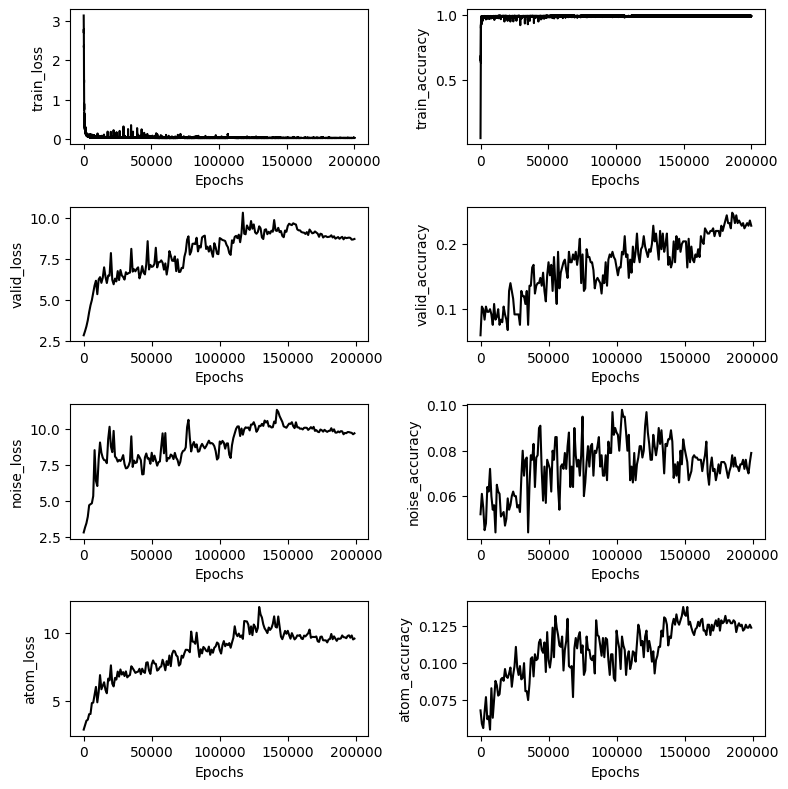

In [2]:
training_specs['ds_size'] = 1000
training_specs['folder_name'] = task_name + '-1k'
model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

### 5k dataset

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: yig319 to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


[0, 200, 400, 600, 800, 1000, 1200, 1400, 1600, 1800, 2000, 2200, 2400, 2600, 2800, 3000, 3200, 3400, 3600, 3800, 4000, 4200, 4400, 4600, 4800, 5000, 5200, 5400, 5600, 5800, 6000, 6200, 6400, 6600, 6800, 7000, 7200, 7400, 7600, 7800, 8000, 8200, 8400, 8600, 8800, 9000, 9200, 9400, 9600, 9800, 10000, 10200, 10400, 10600, 10800, 11000, 11200, 11400, 11600, 11800, 12000, 12200, 12400, 12600, 12800, 13000, 13200, 13400, 13600, 13800, 14000, 14200, 14400, 14600, 14800, 15000, 15200, 15400, 15600, 15800, 16000, 16200, 16400, 16600, 16800, 17000, 17200, 17400, 17600, 17800, 18000, 18200, 18400, 18600, 18800, 19000, 19200, 19400, 19600, 19800, 20000, 20200, 20400, 20600, 20800, 21000, 21200, 21400, 21600, 21800, 22000, 22200, 22400, 22600, 22800, 23000, 23200, 23400, 23600, 23800, 24000, 24200, 24400, 24600, 24800, 25000, 25200, 25400, 25600, 25800, 26000, 26200, 26400, 26600, 26800, 27000, 27200, 27400, 27600, 27800, 28000, 28200, 28400, 28600, 28800, 29000, 29200, 29400, 29600, 29800, 30000,

Train: 100%|██████████| 3/3 [00:08<00:00,  2.85s/it]


train_loss: 3.1001, train_accuracy: 5.88%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.42s/it]


valid_loss: 2.8357, valid_accuracy: 7.12%
Model saved at epoch 0
Saved new best model at epoch 0 with valid dataset


Valid: 100%|██████████| 3/3 [00:06<00:00,  2.24s/it]


noise_loss: 2.8338, noise_accuracy: 6.52%


Valid: 100%|██████████| 3/3 [00:06<00:00,  2.02s/it]


atom_loss: 2.8373, atom_accuracy: 6.18%
Model saved at epoch 200
Epoch: 201/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.32s/it]


train_loss: 1.3662, train_accuracy: 68.10%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.19s/it]


valid_loss: 3.1642, valid_accuracy: 6.88%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


noise_loss: 2.9702, noise_accuracy: 6.44%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


atom_loss: 3.1935, atom_accuracy: 6.72%
Model saved at epoch 400
Epoch: 401/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.34s/it]


train_loss: 0.3198, train_accuracy: 97.78%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.12s/it]


valid_loss: 3.4074, valid_accuracy: 6.64%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


noise_loss: 3.7610, noise_accuracy: 4.12%


Valid: 100%|██████████| 3/3 [00:06<00:00,  2.06s/it]


atom_loss: 3.3266, atom_accuracy: 6.18%
Model saved at epoch 600
Epoch: 601/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.35s/it]


train_loss: 0.1804, train_accuracy: 98.08%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.11s/it]


valid_loss: 3.6740, valid_accuracy: 8.00%
Model saved at epoch 600
Saved new best model at epoch 600 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.84s/it]


noise_loss: 3.7589, noise_accuracy: 5.00%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]


atom_loss: 3.5735, atom_accuracy: 6.68%
Model saved at epoch 800
Epoch: 801/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.39s/it]


train_loss: 0.1079, train_accuracy: 98.50%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.22s/it]


valid_loss: 3.8731, valid_accuracy: 7.68%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


noise_loss: 4.0731, noise_accuracy: 4.28%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


atom_loss: 3.7376, atom_accuracy: 6.04%
Model saved at epoch 1000
Epoch: 1001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.37s/it]


train_loss: 0.1012, train_accuracy: 98.20%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.15s/it]


valid_loss: 4.2464, valid_accuracy: 8.00%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.85s/it]


noise_loss: 4.0704, noise_accuracy: 6.66%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.94s/it]


atom_loss: 4.0474, atom_accuracy: 6.38%
Model saved at epoch 1200
Epoch: 1201/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.45s/it]


train_loss: 0.0790, train_accuracy: 98.28%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.19s/it]


valid_loss: 4.6939, valid_accuracy: 9.28%
Model saved at epoch 1200
Saved new best model at epoch 1200 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.93s/it]


noise_loss: 5.2622, noise_accuracy: 6.06%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]


atom_loss: 4.4529, atom_accuracy: 6.90%
Model saved at epoch 1400
Epoch: 1401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.16s/it]


train_loss: 0.0607, train_accuracy: 98.54%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.64s/it]


valid_loss: 4.8415, valid_accuracy: 7.76%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.65s/it]


noise_loss: 5.7260, noise_accuracy: 7.50%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.67s/it]


atom_loss: 4.7415, atom_accuracy: 7.06%
Model saved at epoch 1600
Epoch: 1601/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.34s/it]


train_loss: 0.0479, train_accuracy: 98.86%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.16s/it]


valid_loss: 5.0098, valid_accuracy: 8.56%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.81s/it]


noise_loss: 5.9485, noise_accuracy: 7.00%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.81s/it]


atom_loss: 5.0167, atom_accuracy: 7.70%
Model saved at epoch 1800
Epoch: 1801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.31s/it]


train_loss: 0.0764, train_accuracy: 97.86%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.12s/it]


valid_loss: 5.4886, valid_accuracy: 7.76%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.85s/it]


noise_loss: 6.8656, noise_accuracy: 6.66%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


atom_loss: 5.2020, atom_accuracy: 8.18%
Model saved at epoch 2000
Epoch: 2001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.36s/it]


train_loss: 0.0454, train_accuracy: 98.72%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.63s/it]


valid_loss: 5.3659, valid_accuracy: 9.44%
Model saved at epoch 2000
Saved new best model at epoch 2000 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.82s/it]


noise_loss: 5.7671, noise_accuracy: 5.98%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.92s/it]


atom_loss: 5.4006, atom_accuracy: 7.28%
Model saved at epoch 2200
Epoch: 2201/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.12s/it]


train_loss: 0.0549, train_accuracy: 98.48%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.66s/it]


valid_loss: 5.5879, valid_accuracy: 8.56%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


noise_loss: 5.9266, noise_accuracy: 3.98%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.60s/it]


atom_loss: 5.7335, atom_accuracy: 6.92%
Model saved at epoch 2400
Epoch: 2401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.08s/it]


train_loss: 0.0495, train_accuracy: 98.64%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.61s/it]


valid_loss: 5.8508, valid_accuracy: 8.40%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.64s/it]


noise_loss: 5.9091, noise_accuracy: 5.20%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.64s/it]


atom_loss: 5.7944, atom_accuracy: 7.54%
Model saved at epoch 2600
Epoch: 2601/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]


train_loss: 0.0420, train_accuracy: 98.84%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.62s/it]


valid_loss: 6.0695, valid_accuracy: 8.72%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


noise_loss: 6.7300, noise_accuracy: 6.52%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.68s/it]


atom_loss: 5.6897, atom_accuracy: 7.46%
Model saved at epoch 2800
Epoch: 2801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]


train_loss: 0.0452, train_accuracy: 98.68%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.07s/it]


valid_loss: 6.0856, valid_accuracy: 7.68%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


noise_loss: 7.5679, noise_accuracy: 6.26%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.60s/it]


atom_loss: 6.1485, atom_accuracy: 7.70%
Model saved at epoch 3000
Epoch: 3001/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.12s/it]


train_loss: 0.0413, train_accuracy: 98.74%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.64s/it]


valid_loss: 6.2361, valid_accuracy: 9.68%
Model saved at epoch 3000
Saved new best model at epoch 3000 with valid dataset


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.59s/it]


noise_loss: 7.6309, noise_accuracy: 4.88%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.60s/it]


atom_loss: 5.9359, atom_accuracy: 9.50%
Model saved at epoch 3200
Epoch: 3201/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.15s/it]


train_loss: 0.0431, train_accuracy: 98.66%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.74s/it]


valid_loss: 6.3706, valid_accuracy: 10.16%
Model saved at epoch 3200
Saved new best model at epoch 3200 with valid dataset


Valid: 100%|██████████| 3/3 [00:06<00:00,  2.06s/it]


noise_loss: 7.2181, noise_accuracy: 7.06%


Valid: 100%|██████████| 3/3 [00:06<00:00,  2.11s/it]


atom_loss: 6.1277, atom_accuracy: 8.90%
Model saved at epoch 3400
Epoch: 3401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.17s/it]


train_loss: 0.0379, train_accuracy: 98.84%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.70s/it]


valid_loss: 5.9361, valid_accuracy: 11.44%
Model saved at epoch 3400
Saved new best model at epoch 3400 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.90s/it]


noise_loss: 6.5275, noise_accuracy: 5.86%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.92s/it]


atom_loss: 6.2959, atom_accuracy: 9.62%
Model saved at epoch 3600
Epoch: 3601/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.18s/it]


train_loss: 0.0415, train_accuracy: 98.74%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.68s/it]


valid_loss: 6.2122, valid_accuracy: 11.60%
Model saved at epoch 3600
Saved new best model at epoch 3600 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]


noise_loss: 6.8656, noise_accuracy: 5.20%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.91s/it]


atom_loss: 6.2648, atom_accuracy: 10.00%
Model saved at epoch 3800
Epoch: 3801/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.35s/it]


train_loss: 0.0321, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.11s/it]


valid_loss: 5.5359, valid_accuracy: 14.96%
Model saved at epoch 3800
Saved new best model at epoch 3800 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.93s/it]


noise_loss: 6.2814, noise_accuracy: 7.32%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.87s/it]


atom_loss: 6.4873, atom_accuracy: 11.60%
Model saved at epoch 4000
Epoch: 4001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.39s/it]


train_loss: 0.0348, train_accuracy: 98.88%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.13s/it]


valid_loss: 5.2204, valid_accuracy: 20.72%
Model saved at epoch 4000
Saved new best model at epoch 4000 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


noise_loss: 6.5265, noise_accuracy: 8.22%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


atom_loss: 5.9590, atom_accuracy: 14.98%
Model saved at epoch 4200
Epoch: 4201/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.42s/it]


train_loss: 0.0317, train_accuracy: 98.88%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.10s/it]


valid_loss: 5.1256, valid_accuracy: 25.92%
Model saved at epoch 4200
Saved new best model at epoch 4200 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


noise_loss: 6.6904, noise_accuracy: 8.08%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.87s/it]


atom_loss: 5.8474, atom_accuracy: 16.78%
Model saved at epoch 4400
Epoch: 4401/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.39s/it]


train_loss: 0.0438, train_accuracy: 98.78%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.15s/it]


valid_loss: 4.9658, valid_accuracy: 27.84%
Model saved at epoch 4400
Saved new best model at epoch 4400 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.95s/it]


noise_loss: 6.8250, noise_accuracy: 9.02%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.84s/it]


atom_loss: 6.3841, atom_accuracy: 16.90%
Model saved at epoch 4600
Epoch: 4601/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.20s/it]


train_loss: 0.0373, train_accuracy: 98.86%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.67s/it]


valid_loss: 4.4573, valid_accuracy: 32.40%
Model saved at epoch 4600
Saved new best model at epoch 4600 with valid dataset


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


noise_loss: 6.9018, noise_accuracy: 8.72%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


atom_loss: 5.8876, atom_accuracy: 21.12%
Model saved at epoch 4800
Epoch: 4801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.11s/it]


train_loss: 0.0317, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.09s/it]


valid_loss: 4.4007, valid_accuracy: 32.88%
Model saved at epoch 4800
Saved new best model at epoch 4800 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.91s/it]


noise_loss: 5.9877, noise_accuracy: 11.48%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


atom_loss: 5.7014, atom_accuracy: 22.06%
Model saved at epoch 5000
Epoch: 5001/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]


train_loss: 0.0297, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.63s/it]


valid_loss: 4.0658, valid_accuracy: 34.56%
Model saved at epoch 5000
Saved new best model at epoch 5000 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  2.00s/it]


noise_loss: 5.6528, noise_accuracy: 11.48%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


atom_loss: 5.4666, atom_accuracy: 22.38%
Model saved at epoch 5200
Epoch: 5201/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.35s/it]


train_loss: 0.0329, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.18s/it]


valid_loss: 3.3803, valid_accuracy: 38.56%
Model saved at epoch 5200
Saved new best model at epoch 5200 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


noise_loss: 4.8557, noise_accuracy: 14.34%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.92s/it]


atom_loss: 4.6484, atom_accuracy: 26.22%
Model saved at epoch 5400
Epoch: 5401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.16s/it]


train_loss: 0.0302, train_accuracy: 99.02%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.11s/it]


valid_loss: 3.7135, valid_accuracy: 39.60%
Model saved at epoch 5400
Saved new best model at epoch 5400 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.85s/it]


noise_loss: 5.1141, noise_accuracy: 13.44%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


atom_loss: 5.0069, atom_accuracy: 26.08%
Model saved at epoch 5600
Epoch: 5601/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.36s/it]


train_loss: 0.0313, train_accuracy: 98.94%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.32s/it]


valid_loss: 3.5968, valid_accuracy: 41.76%
Model saved at epoch 5600
Saved new best model at epoch 5600 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.81s/it]


noise_loss: 5.3799, noise_accuracy: 12.84%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.92s/it]


atom_loss: 5.3029, atom_accuracy: 27.04%
Model saved at epoch 5800
Epoch: 5801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.11s/it]


train_loss: 0.0321, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.15s/it]


valid_loss: 3.7923, valid_accuracy: 43.20%
Model saved at epoch 5800
Saved new best model at epoch 5800 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.84s/it]


noise_loss: 5.2180, noise_accuracy: 15.74%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


atom_loss: 5.0941, atom_accuracy: 28.76%
Model saved at epoch 6000
Epoch: 6001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.36s/it]


train_loss: 0.0365, train_accuracy: 98.82%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.13s/it]


valid_loss: 3.4502, valid_accuracy: 41.36%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.82s/it]


noise_loss: 5.0658, noise_accuracy: 14.80%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.81s/it]


atom_loss: 5.0920, atom_accuracy: 27.06%
Model saved at epoch 6200
Epoch: 6201/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.35s/it]


train_loss: 0.0294, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.16s/it]


valid_loss: 3.2597, valid_accuracy: 44.32%
Model saved at epoch 6200
Saved new best model at epoch 6200 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.83s/it]


noise_loss: 5.0261, noise_accuracy: 14.10%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.82s/it]


atom_loss: 5.3093, atom_accuracy: 28.36%
Model saved at epoch 6400
Epoch: 6401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.10s/it]


train_loss: 0.0312, train_accuracy: 98.94%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.65s/it]


valid_loss: 3.3864, valid_accuracy: 46.24%
Model saved at epoch 6400
Saved new best model at epoch 6400 with valid dataset


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.60s/it]


noise_loss: 5.1707, noise_accuracy: 13.92%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


atom_loss: 4.8625, atom_accuracy: 30.18%
Model saved at epoch 6600
Epoch: 6601/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.44s/it]


train_loss: 0.0313, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.13s/it]


valid_loss: 3.2797, valid_accuracy: 47.44%
Model saved at epoch 6600
Saved new best model at epoch 6600 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.93s/it]


noise_loss: 4.7586, noise_accuracy: 17.20%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.83s/it]


atom_loss: 4.9901, atom_accuracy: 30.30%
Model saved at epoch 6800
Epoch: 6801/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.39s/it]


train_loss: 0.0377, train_accuracy: 98.80%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.13s/it]


valid_loss: 3.4880, valid_accuracy: 43.92%


Valid: 100%|██████████| 3/3 [00:06<00:00,  2.01s/it]


noise_loss: 5.3939, noise_accuracy: 15.26%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.85s/it]


atom_loss: 5.3765, atom_accuracy: 26.42%
Model saved at epoch 7000
Epoch: 7001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.36s/it]


train_loss: 0.0302, train_accuracy: 99.02%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.19s/it]


valid_loss: 3.6821, valid_accuracy: 47.44%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.96s/it]


noise_loss: 5.6657, noise_accuracy: 16.06%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]


atom_loss: 5.3729, atom_accuracy: 30.36%
Model saved at epoch 7200
Epoch: 7201/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.42s/it]


train_loss: 0.0313, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.23s/it]


valid_loss: 3.4107, valid_accuracy: 47.20%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.90s/it]


noise_loss: 5.1742, noise_accuracy: 18.22%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.91s/it]


atom_loss: 5.2557, atom_accuracy: 29.16%
Model saved at epoch 7400
Epoch: 7401/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.40s/it]


train_loss: 0.0307, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.75s/it]


valid_loss: 3.1768, valid_accuracy: 49.20%
Model saved at epoch 7400
Saved new best model at epoch 7400 with valid dataset


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.63s/it]


noise_loss: 5.0397, noise_accuracy: 18.10%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.73s/it]


atom_loss: 4.7295, atom_accuracy: 30.78%
Model saved at epoch 7600
Epoch: 7601/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.13s/it]


train_loss: 0.0312, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.66s/it]


valid_loss: 3.2073, valid_accuracy: 49.92%
Model saved at epoch 7600
Saved new best model at epoch 7600 with valid dataset


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.63s/it]


noise_loss: 5.0186, noise_accuracy: 18.20%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.65s/it]


atom_loss: 4.8012, atom_accuracy: 30.62%
Model saved at epoch 7800
Epoch: 7801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.16s/it]


train_loss: 0.0303, train_accuracy: 98.94%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.64s/it]


valid_loss: 3.4953, valid_accuracy: 49.68%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.66s/it]


noise_loss: 5.2391, noise_accuracy: 19.40%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.68s/it]


atom_loss: 4.9918, atom_accuracy: 28.74%
Model saved at epoch 8000
Epoch: 8001/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.10s/it]


train_loss: 0.0304, train_accuracy: 98.92%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.64s/it]


valid_loss: 3.1775, valid_accuracy: 50.40%
Model saved at epoch 8000
Saved new best model at epoch 8000 with valid dataset


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


noise_loss: 4.5855, noise_accuracy: 21.82%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.63s/it]


atom_loss: 4.8514, atom_accuracy: 33.02%
Model saved at epoch 8200
Epoch: 8201/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.08s/it]


train_loss: 0.0296, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.65s/it]


valid_loss: 3.0991, valid_accuracy: 51.20%
Model saved at epoch 8200
Saved new best model at epoch 8200 with valid dataset


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.59s/it]


noise_loss: 4.3698, noise_accuracy: 25.94%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


atom_loss: 5.1368, atom_accuracy: 31.38%
Model saved at epoch 8400
Epoch: 8401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.08s/it]


train_loss: 0.0303, train_accuracy: 99.02%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.68s/it]


valid_loss: 3.2335, valid_accuracy: 51.20%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.60s/it]


noise_loss: 4.5553, noise_accuracy: 24.82%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.60s/it]


atom_loss: 5.3953, atom_accuracy: 30.92%
Model saved at epoch 8600
Epoch: 8601/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.44s/it]


train_loss: 0.0307, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.15s/it]


valid_loss: 2.7793, valid_accuracy: 51.04%
Model saved at epoch 8600
Saved new best model at epoch 8600 with valid dataset


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


noise_loss: 3.9037, noise_accuracy: 26.68%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.69s/it]


atom_loss: 4.1821, atom_accuracy: 36.26%
Model saved at epoch 8800
Epoch: 8801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.10s/it]


train_loss: 0.0294, train_accuracy: 99.02%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.65s/it]


valid_loss: 3.1266, valid_accuracy: 50.32%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.58s/it]


noise_loss: 4.1172, noise_accuracy: 26.86%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.58s/it]


atom_loss: 4.8350, atom_accuracy: 34.60%
Model saved at epoch 9000
Epoch: 9001/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.11s/it]


train_loss: 0.0348, train_accuracy: 98.84%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.70s/it]


valid_loss: 2.9760, valid_accuracy: 49.12%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.60s/it]


noise_loss: 4.0863, noise_accuracy: 26.18%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


atom_loss: 4.9611, atom_accuracy: 29.72%
Model saved at epoch 9200
Epoch: 9201/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]


train_loss: 0.0300, train_accuracy: 98.94%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.68s/it]


valid_loss: 3.1664, valid_accuracy: 51.76%
Model saved at epoch 9200
Saved new best model at epoch 9200 with valid dataset


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.60s/it]


noise_loss: 4.4191, noise_accuracy: 26.30%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


atom_loss: 5.3130, atom_accuracy: 29.76%
Model saved at epoch 9400
Epoch: 9401/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.34s/it]


train_loss: 0.0293, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.19s/it]


valid_loss: 3.1403, valid_accuracy: 53.04%
Model saved at epoch 9400
Saved new best model at epoch 9400 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.87s/it]


noise_loss: 4.3393, noise_accuracy: 26.98%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.92s/it]


atom_loss: 5.4235, atom_accuracy: 29.68%
Model saved at epoch 9600
Epoch: 9601/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.36s/it]


train_loss: 0.0302, train_accuracy: 99.06%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.14s/it]


valid_loss: 2.7464, valid_accuracy: 52.40%
Model saved at epoch 9600
Saved new best model at epoch 9600 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.83s/it]


noise_loss: 3.6796, noise_accuracy: 27.94%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.84s/it]


atom_loss: 4.9290, atom_accuracy: 29.48%
Model saved at epoch 9800
Epoch: 9801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.33s/it]


train_loss: 0.0295, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.16s/it]


valid_loss: 2.9681, valid_accuracy: 52.80%


Valid: 100%|██████████| 3/3 [00:06<00:00,  2.01s/it]


noise_loss: 3.9339, noise_accuracy: 28.62%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.90s/it]


atom_loss: 5.2902, atom_accuracy: 29.92%
Model saved at epoch 10000
Epoch: 10001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.35s/it]


train_loss: 0.0307, train_accuracy: 98.92%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.14s/it]


valid_loss: 3.2554, valid_accuracy: 51.84%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.87s/it]


noise_loss: 4.4948, noise_accuracy: 25.76%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


atom_loss: 5.2869, atom_accuracy: 32.68%
Model saved at epoch 10200
Epoch: 10201/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.35s/it]


train_loss: 0.0300, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.13s/it]


valid_loss: 3.0375, valid_accuracy: 53.20%
Model saved at epoch 10200
Saved new best model at epoch 10200 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


noise_loss: 4.1754, noise_accuracy: 28.38%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


atom_loss: 5.0873, atom_accuracy: 33.86%
Model saved at epoch 10400
Epoch: 10401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.33s/it]


train_loss: 0.0303, train_accuracy: 98.92%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.18s/it]


valid_loss: 3.1824, valid_accuracy: 51.52%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.85s/it]


noise_loss: 4.3326, noise_accuracy: 28.12%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.82s/it]


atom_loss: 5.4837, atom_accuracy: 31.26%
Model saved at epoch 10600
Epoch: 10601/40000


Train: 100%|██████████| 3/3 [00:08<00:00,  2.83s/it]


train_loss: 0.0302, train_accuracy: 98.94%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.20s/it]


valid_loss: 2.8396, valid_accuracy: 52.32%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]


noise_loss: 4.1174, noise_accuracy: 25.38%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.91s/it]


atom_loss: 5.0038, atom_accuracy: 31.62%
Model saved at epoch 10800
Epoch: 10801/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.38s/it]


train_loss: 0.0296, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.24s/it]


valid_loss: 3.3233, valid_accuracy: 52.08%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


noise_loss: 4.3494, noise_accuracy: 27.88%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.84s/it]


atom_loss: 5.4268, atom_accuracy: 31.82%
Model saved at epoch 11000
Epoch: 11001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.36s/it]


train_loss: 0.0309, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.17s/it]


valid_loss: 3.1002, valid_accuracy: 50.24%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.87s/it]


noise_loss: 4.0999, noise_accuracy: 29.08%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


atom_loss: 4.9368, atom_accuracy: 32.24%
Model saved at epoch 11200
Epoch: 11201/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.48s/it]


train_loss: 0.0299, train_accuracy: 98.92%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.18s/it]


valid_loss: 3.2840, valid_accuracy: 52.00%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


noise_loss: 4.3110, noise_accuracy: 29.26%


Valid: 100%|██████████| 3/3 [00:05<00:00,  2.00s/it]


atom_loss: 5.2678, atom_accuracy: 32.90%
Model saved at epoch 11400
Epoch: 11401/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.34s/it]


train_loss: 0.0299, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.20s/it]


valid_loss: 3.3382, valid_accuracy: 52.64%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]


noise_loss: 4.3428, noise_accuracy: 27.72%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


atom_loss: 5.6525, atom_accuracy: 28.68%
Model saved at epoch 11600
Epoch: 11601/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.36s/it]


train_loss: 0.0295, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.21s/it]


valid_loss: 3.3644, valid_accuracy: 52.72%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.84s/it]


noise_loss: 4.2682, noise_accuracy: 27.78%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.87s/it]


atom_loss: 5.6924, atom_accuracy: 28.70%
Model saved at epoch 11800
Epoch: 11801/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.35s/it]


train_loss: 0.0297, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.36s/it]


valid_loss: 3.3102, valid_accuracy: 51.44%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]


noise_loss: 4.2374, noise_accuracy: 29.58%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


atom_loss: 4.9799, atom_accuracy: 33.62%
Model saved at epoch 12000
Epoch: 12001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.34s/it]


train_loss: 0.0293, train_accuracy: 99.02%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.12s/it]


valid_loss: 3.3511, valid_accuracy: 51.60%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]


noise_loss: 4.3742, noise_accuracy: 29.60%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


atom_loss: 5.2978, atom_accuracy: 32.58%
Model saved at epoch 12200
Epoch: 12201/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.33s/it]


train_loss: 0.0307, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.13s/it]


valid_loss: 3.4333, valid_accuracy: 51.52%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.84s/it]


noise_loss: 4.2586, noise_accuracy: 30.16%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]


atom_loss: 5.3905, atom_accuracy: 32.64%
Model saved at epoch 12400
Epoch: 12401/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.39s/it]


train_loss: 0.0294, train_accuracy: 98.92%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.14s/it]


valid_loss: 3.4460, valid_accuracy: 52.08%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.81s/it]


noise_loss: 4.4121, noise_accuracy: 29.76%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.82s/it]


atom_loss: 5.5389, atom_accuracy: 32.08%
Model saved at epoch 12600
Epoch: 12601/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.35s/it]


train_loss: 0.2379, train_accuracy: 93.70%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.12s/it]


valid_loss: 4.3656, valid_accuracy: 38.16%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.90s/it]


noise_loss: 4.9607, noise_accuracy: 18.42%


Valid: 100%|██████████| 3/3 [00:06<00:00,  2.01s/it]


atom_loss: 6.8620, atom_accuracy: 21.80%
Model saved at epoch 12800
Epoch: 12801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.33s/it]


train_loss: 0.0287, train_accuracy: 98.94%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.17s/it]


valid_loss: 3.2593, valid_accuracy: 53.52%
Model saved at epoch 12800
Saved new best model at epoch 12800 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]


noise_loss: 4.1445, noise_accuracy: 28.34%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.83s/it]


atom_loss: 5.6857, atom_accuracy: 29.80%
Model saved at epoch 13000
Epoch: 13001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.42s/it]


train_loss: 0.0463, train_accuracy: 98.50%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.27s/it]


valid_loss: 3.8448, valid_accuracy: 46.80%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.91s/it]


noise_loss: 5.2222, noise_accuracy: 24.56%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.90s/it]


atom_loss: 6.4965, atom_accuracy: 22.46%
Model saved at epoch 13200
Epoch: 13201/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.34s/it]


train_loss: 0.0299, train_accuracy: 99.02%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.24s/it]


valid_loss: 3.3991, valid_accuracy: 52.80%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.90s/it]


noise_loss: 4.3366, noise_accuracy: 29.40%


Valid: 100%|██████████| 3/3 [00:06<00:00,  2.01s/it]


atom_loss: 5.6562, atom_accuracy: 31.82%
Model saved at epoch 13400
Epoch: 13401/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.41s/it]


train_loss: 0.0299, train_accuracy: 98.94%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.27s/it]


valid_loss: 3.3269, valid_accuracy: 52.80%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.85s/it]


noise_loss: 4.2675, noise_accuracy: 30.36%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.91s/it]


atom_loss: 5.7185, atom_accuracy: 31.48%
Model saved at epoch 13600
Epoch: 13601/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.17s/it]


train_loss: 0.0283, train_accuracy: 99.02%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.73s/it]


valid_loss: 3.4940, valid_accuracy: 51.68%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.65s/it]


noise_loss: 4.2525, noise_accuracy: 30.96%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.68s/it]


atom_loss: 5.5158, atom_accuracy: 32.02%
Model saved at epoch 13800
Epoch: 13801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.24s/it]


train_loss: 0.0287, train_accuracy: 98.94%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.67s/it]


valid_loss: 3.1377, valid_accuracy: 53.20%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.69s/it]


noise_loss: 4.2583, noise_accuracy: 28.46%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.64s/it]


atom_loss: 6.1210, atom_accuracy: 28.72%
Model saved at epoch 14000
Epoch: 14001/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.14s/it]


train_loss: 0.0285, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.63s/it]


valid_loss: 3.2808, valid_accuracy: 53.04%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.60s/it]


noise_loss: 4.3008, noise_accuracy: 30.08%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.60s/it]


atom_loss: 6.0854, atom_accuracy: 29.88%
Model saved at epoch 14200
Epoch: 14201/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.36s/it]


train_loss: 0.0294, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.15s/it]


valid_loss: 3.3574, valid_accuracy: 53.60%
Model saved at epoch 14200
Saved new best model at epoch 14200 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


noise_loss: 4.3051, noise_accuracy: 30.24%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


atom_loss: 6.1503, atom_accuracy: 30.08%
Model saved at epoch 14400
Epoch: 14401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.32s/it]


train_loss: 0.0293, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.15s/it]


valid_loss: 3.3164, valid_accuracy: 54.40%
Model saved at epoch 14400
Saved new best model at epoch 14400 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.87s/it]


noise_loss: 4.4673, noise_accuracy: 29.78%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.85s/it]


atom_loss: 6.0961, atom_accuracy: 30.98%
Model saved at epoch 14600
Epoch: 14601/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.36s/it]


train_loss: 0.0287, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.14s/it]


valid_loss: 3.0985, valid_accuracy: 52.24%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]


noise_loss: 4.1501, noise_accuracy: 27.10%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.93s/it]


atom_loss: 4.8867, atom_accuracy: 30.32%
Model saved at epoch 14800
Epoch: 14801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.10s/it]


train_loss: 0.0278, train_accuracy: 99.08%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.62s/it]


valid_loss: 3.3138, valid_accuracy: 53.20%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.65s/it]


noise_loss: 4.4138, noise_accuracy: 27.02%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.63s/it]


atom_loss: 5.1469, atom_accuracy: 31.68%
Model saved at epoch 15000
Epoch: 15001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.39s/it]


train_loss: 0.0294, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.32s/it]


valid_loss: 3.5936, valid_accuracy: 52.80%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


noise_loss: 4.4869, noise_accuracy: 30.12%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]


atom_loss: 5.7053, atom_accuracy: 29.76%
Model saved at epoch 15200
Epoch: 15201/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.35s/it]


train_loss: 0.0278, train_accuracy: 99.06%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.23s/it]


valid_loss: 3.6369, valid_accuracy: 52.80%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.91s/it]


noise_loss: 4.6255, noise_accuracy: 28.94%


Valid: 100%|██████████| 3/3 [00:06<00:00,  2.01s/it]


atom_loss: 6.0855, atom_accuracy: 27.96%
Model saved at epoch 15400
Epoch: 15401/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.35s/it]


train_loss: 0.0273, train_accuracy: 99.06%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.15s/it]


valid_loss: 3.4712, valid_accuracy: 54.00%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


noise_loss: 4.5317, noise_accuracy: 29.44%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.93s/it]


atom_loss: 6.2079, atom_accuracy: 28.58%
Model saved at epoch 15600
Epoch: 15601/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.34s/it]


train_loss: 0.0274, train_accuracy: 99.06%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.16s/it]


valid_loss: 3.3424, valid_accuracy: 52.48%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.90s/it]


noise_loss: 4.0792, noise_accuracy: 31.26%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.92s/it]


atom_loss: 5.4344, atom_accuracy: 32.94%
Model saved at epoch 15800
Epoch: 15801/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.53s/it]


train_loss: 0.0283, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.14s/it]


valid_loss: 3.4806, valid_accuracy: 53.28%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.83s/it]


noise_loss: 4.1810, noise_accuracy: 32.10%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


atom_loss: 5.5519, atom_accuracy: 33.00%
Model saved at epoch 16000
Epoch: 16001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.37s/it]


train_loss: 0.0303, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.11s/it]


valid_loss: 3.6102, valid_accuracy: 52.32%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


noise_loss: 4.5641, noise_accuracy: 28.34%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.91s/it]


atom_loss: 6.5562, atom_accuracy: 29.96%
Model saved at epoch 16200
Epoch: 16201/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.37s/it]


train_loss: 0.0291, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.16s/it]


valid_loss: 3.6665, valid_accuracy: 53.92%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


noise_loss: 4.7482, noise_accuracy: 28.80%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.84s/it]


atom_loss: 6.4189, atom_accuracy: 31.58%
Model saved at epoch 16400
Epoch: 16401/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.37s/it]


train_loss: 0.0303, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.15s/it]


valid_loss: 3.6443, valid_accuracy: 52.72%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.93s/it]


noise_loss: 4.6038, noise_accuracy: 29.04%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.85s/it]


atom_loss: 6.3276, atom_accuracy: 31.10%
Model saved at epoch 16600
Epoch: 16601/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.34s/it]


train_loss: 0.0297, train_accuracy: 98.92%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.16s/it]


valid_loss: 3.7361, valid_accuracy: 51.68%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


noise_loss: 4.9350, noise_accuracy: 29.08%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.84s/it]


atom_loss: 6.9140, atom_accuracy: 28.26%
Model saved at epoch 16800
Epoch: 16801/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.35s/it]


train_loss: 0.0303, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.11s/it]


valid_loss: 3.5406, valid_accuracy: 53.92%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]


noise_loss: 4.6567, noise_accuracy: 29.76%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.90s/it]


atom_loss: 6.8188, atom_accuracy: 28.80%
Model saved at epoch 17000
Epoch: 17001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.34s/it]


train_loss: 0.0295, train_accuracy: 98.88%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.21s/it]


valid_loss: 3.6627, valid_accuracy: 53.20%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.85s/it]


noise_loss: 4.5684, noise_accuracy: 29.98%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]


atom_loss: 6.5449, atom_accuracy: 29.20%
Model saved at epoch 17200
Epoch: 17201/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]


train_loss: 0.0280, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.66s/it]


valid_loss: 3.6513, valid_accuracy: 53.20%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.60s/it]


noise_loss: 4.6400, noise_accuracy: 30.38%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.60s/it]


atom_loss: 6.5452, atom_accuracy: 29.78%
Model saved at epoch 17400
Epoch: 17401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.12s/it]


train_loss: 0.0287, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.72s/it]


valid_loss: 3.6247, valid_accuracy: 53.76%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.57s/it]


noise_loss: 4.6316, noise_accuracy: 30.34%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.59s/it]


atom_loss: 6.4251, atom_accuracy: 30.26%
Model saved at epoch 17600
Epoch: 17601/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]


train_loss: 0.0272, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.70s/it]


valid_loss: 3.5858, valid_accuracy: 54.48%
Model saved at epoch 17600
Saved new best model at epoch 17600 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.95s/it]


noise_loss: 4.6729, noise_accuracy: 31.14%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]


atom_loss: 6.4817, atom_accuracy: 29.48%
Model saved at epoch 17800
Epoch: 17801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.08s/it]


train_loss: 0.0290, train_accuracy: 99.06%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.78s/it]


valid_loss: 3.4879, valid_accuracy: 54.88%
Model saved at epoch 17800
Saved new best model at epoch 17800 with valid dataset


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.59s/it]


noise_loss: 4.5198, noise_accuracy: 31.74%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.65s/it]


atom_loss: 6.7245, atom_accuracy: 29.84%
Model saved at epoch 18000
Epoch: 18001/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.08s/it]


train_loss: 0.0295, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.66s/it]


valid_loss: 3.3940, valid_accuracy: 55.84%
Model saved at epoch 18000
Saved new best model at epoch 18000 with valid dataset


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.60s/it]


noise_loss: 4.5288, noise_accuracy: 31.38%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.63s/it]


atom_loss: 6.3836, atom_accuracy: 31.16%
Model saved at epoch 18200
Epoch: 18201/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]


train_loss: 0.0297, train_accuracy: 98.92%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.65s/it]


valid_loss: 3.4986, valid_accuracy: 52.32%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


noise_loss: 4.1151, noise_accuracy: 33.08%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.60s/it]


atom_loss: 6.0794, atom_accuracy: 31.84%
Model saved at epoch 18400
Epoch: 18401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.14s/it]


train_loss: 0.0269, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.74s/it]


valid_loss: 3.7251, valid_accuracy: 53.44%


Valid: 100%|██████████| 3/3 [00:06<00:00,  2.03s/it]


noise_loss: 4.3867, noise_accuracy: 32.88%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.68s/it]


atom_loss: 6.5628, atom_accuracy: 32.14%
Model saved at epoch 18600
Epoch: 18601/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.11s/it]


train_loss: 0.0271, train_accuracy: 99.12%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.66s/it]


valid_loss: 3.8287, valid_accuracy: 54.32%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.64s/it]


noise_loss: 4.3650, noise_accuracy: 33.56%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.66s/it]


atom_loss: 6.6068, atom_accuracy: 32.44%
Model saved at epoch 18800
Epoch: 18801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.11s/it]


train_loss: 0.0271, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.66s/it]


valid_loss: 3.5384, valid_accuracy: 53.60%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.65s/it]


noise_loss: 4.5247, noise_accuracy: 33.28%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


atom_loss: 6.2826, atom_accuracy: 33.34%
Model saved at epoch 19000
Epoch: 19001/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.11s/it]


train_loss: 0.0270, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.73s/it]


valid_loss: 3.5487, valid_accuracy: 54.08%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


noise_loss: 4.4990, noise_accuracy: 34.68%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.74s/it]


atom_loss: 6.2845, atom_accuracy: 33.12%
Model saved at epoch 19200
Epoch: 19201/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.14s/it]


train_loss: 0.0293, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.72s/it]


valid_loss: 3.6004, valid_accuracy: 54.16%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.64s/it]


noise_loss: 4.5681, noise_accuracy: 34.18%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.67s/it]


atom_loss: 6.5083, atom_accuracy: 32.42%
Model saved at epoch 19400
Epoch: 19401/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.42s/it]


train_loss: 0.0291, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.67s/it]


valid_loss: 3.5606, valid_accuracy: 54.64%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.66s/it]


noise_loss: 4.4534, noise_accuracy: 35.22%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.66s/it]


atom_loss: 6.4396, atom_accuracy: 32.62%
Model saved at epoch 19600
Epoch: 19601/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.17s/it]


train_loss: 0.0296, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.72s/it]


valid_loss: 3.8914, valid_accuracy: 52.00%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.70s/it]


noise_loss: 5.0617, noise_accuracy: 30.00%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.69s/it]


atom_loss: 6.8714, atom_accuracy: 29.08%
Model saved at epoch 19800
Epoch: 19801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.19s/it]


train_loss: 0.0271, train_accuracy: 99.08%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.68s/it]


valid_loss: 3.8196, valid_accuracy: 52.88%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.63s/it]


noise_loss: 4.9402, noise_accuracy: 30.98%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.63s/it]


atom_loss: 6.8074, atom_accuracy: 29.48%
Model saved at epoch 20000
Epoch: 20001/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.17s/it]


train_loss: 0.0269, train_accuracy: 99.06%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.70s/it]


valid_loss: 3.8449, valid_accuracy: 53.76%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.60s/it]


noise_loss: 4.9356, noise_accuracy: 29.88%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.64s/it]


atom_loss: 7.2112, atom_accuracy: 28.40%
Model saved at epoch 20200
Epoch: 20201/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]


train_loss: 0.0291, train_accuracy: 98.92%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.66s/it]


valid_loss: 4.0745, valid_accuracy: 51.84%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


noise_loss: 4.7435, noise_accuracy: 32.70%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


atom_loss: 6.7366, atom_accuracy: 28.98%
Model saved at epoch 20400
Epoch: 20401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.12s/it]


train_loss: 0.0279, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.82s/it]


valid_loss: 3.6993, valid_accuracy: 53.76%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.67s/it]


noise_loss: 4.6323, noise_accuracy: 33.06%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.57s/it]


atom_loss: 6.8223, atom_accuracy: 28.22%
Model saved at epoch 20600
Epoch: 20601/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.07s/it]


train_loss: 0.0268, train_accuracy: 99.06%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.64s/it]


valid_loss: 3.8840, valid_accuracy: 52.40%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.60s/it]


noise_loss: 4.7718, noise_accuracy: 32.10%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.58s/it]


atom_loss: 6.7191, atom_accuracy: 29.08%
Model saved at epoch 20800
Epoch: 20801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.23s/it]


train_loss: 0.0301, train_accuracy: 98.92%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.65s/it]


valid_loss: 3.6484, valid_accuracy: 54.96%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.64s/it]


noise_loss: 4.6803, noise_accuracy: 32.70%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.59s/it]


atom_loss: 6.9775, atom_accuracy: 28.94%
Model saved at epoch 21000
Epoch: 21001/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.16s/it]


train_loss: 0.0286, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.74s/it]


valid_loss: 3.6131, valid_accuracy: 54.64%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.66s/it]


noise_loss: 4.6096, noise_accuracy: 33.20%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.71s/it]


atom_loss: 6.8392, atom_accuracy: 29.62%
Model saved at epoch 21200
Epoch: 21201/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.34s/it]


train_loss: 0.0291, train_accuracy: 98.92%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.63s/it]


valid_loss: 3.6800, valid_accuracy: 53.76%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.57s/it]


noise_loss: 4.6704, noise_accuracy: 33.30%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


atom_loss: 7.0191, atom_accuracy: 28.48%
Model saved at epoch 21400
Epoch: 21401/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.34s/it]


train_loss: 0.0279, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.14s/it]


valid_loss: 3.8401, valid_accuracy: 51.60%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.91s/it]


noise_loss: 4.8354, noise_accuracy: 30.74%


Valid: 100%|██████████| 3/3 [00:06<00:00,  2.14s/it]


atom_loss: 6.6269, atom_accuracy: 29.52%
Model saved at epoch 21600
Epoch: 21601/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.49s/it]


train_loss: 0.0297, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.15s/it]


valid_loss: 3.8484, valid_accuracy: 52.40%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.82s/it]


noise_loss: 4.8670, noise_accuracy: 31.36%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


atom_loss: 6.6350, atom_accuracy: 29.54%
Model saved at epoch 21800
Epoch: 21801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.15s/it]


train_loss: 0.0275, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.10s/it]


valid_loss: 3.8187, valid_accuracy: 52.64%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.84s/it]


noise_loss: 4.8263, noise_accuracy: 31.52%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


atom_loss: 6.6931, atom_accuracy: 29.44%
Model saved at epoch 22000
Epoch: 22001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.36s/it]


train_loss: 0.0275, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.16s/it]


valid_loss: 3.8845, valid_accuracy: 53.44%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]


noise_loss: 5.0178, noise_accuracy: 32.20%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.84s/it]


atom_loss: 6.4615, atom_accuracy: 31.08%
Model saved at epoch 22200
Epoch: 22201/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.31s/it]


train_loss: 0.0264, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.13s/it]


valid_loss: 3.8863, valid_accuracy: 53.76%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


noise_loss: 5.0877, noise_accuracy: 32.38%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.93s/it]


atom_loss: 6.7584, atom_accuracy: 31.36%
Model saved at epoch 22400
Epoch: 22401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.21s/it]


train_loss: 0.0277, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.13s/it]


valid_loss: 3.9614, valid_accuracy: 53.60%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.95s/it]


noise_loss: 5.0523, noise_accuracy: 32.12%


Valid: 100%|██████████| 3/3 [00:06<00:00,  2.07s/it]


atom_loss: 6.8044, atom_accuracy: 31.10%
Model saved at epoch 22600
Epoch: 22601/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.44s/it]


train_loss: 0.0271, train_accuracy: 98.92%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.14s/it]


valid_loss: 3.9200, valid_accuracy: 54.16%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.84s/it]


noise_loss: 5.0586, noise_accuracy: 32.14%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


atom_loss: 6.7145, atom_accuracy: 31.10%
Model saved at epoch 22800
Epoch: 22801/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.46s/it]


train_loss: 0.0286, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.13s/it]


valid_loss: 3.8757, valid_accuracy: 54.32%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.97s/it]


noise_loss: 5.0493, noise_accuracy: 31.52%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.96s/it]


atom_loss: 6.7969, atom_accuracy: 31.46%
Model saved at epoch 23000
Epoch: 23001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.44s/it]


train_loss: 0.0306, train_accuracy: 98.90%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.12s/it]


valid_loss: 4.5664, valid_accuracy: 48.00%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.97s/it]


noise_loss: 5.4156, noise_accuracy: 28.16%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.95s/it]


atom_loss: 8.4162, atom_accuracy: 25.92%
Model saved at epoch 23200
Epoch: 23201/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.44s/it]


train_loss: 0.0279, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.14s/it]


valid_loss: 4.1581, valid_accuracy: 52.96%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.95s/it]


noise_loss: 5.1549, noise_accuracy: 30.36%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.94s/it]


atom_loss: 7.4422, atom_accuracy: 30.02%
Model saved at epoch 23400
Epoch: 23401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.22s/it]


train_loss: 0.0273, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.11s/it]


valid_loss: 4.0807, valid_accuracy: 53.20%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.97s/it]


noise_loss: 5.0833, noise_accuracy: 30.54%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.97s/it]


atom_loss: 7.1983, atom_accuracy: 31.12%
Model saved at epoch 23600
Epoch: 23601/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.35s/it]


train_loss: 0.0274, train_accuracy: 99.02%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.08s/it]


valid_loss: 4.0138, valid_accuracy: 53.28%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.87s/it]


noise_loss: 5.1607, noise_accuracy: 30.76%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.87s/it]


atom_loss: 7.2166, atom_accuracy: 31.14%
Model saved at epoch 23800
Epoch: 23801/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.39s/it]


train_loss: 0.0271, train_accuracy: 99.02%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.10s/it]


valid_loss: 4.0141, valid_accuracy: 53.76%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.92s/it]


noise_loss: 5.2109, noise_accuracy: 29.70%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


atom_loss: 7.1451, atom_accuracy: 32.82%
Model saved at epoch 24000
Epoch: 24001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.35s/it]


train_loss: 0.0271, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.16s/it]


valid_loss: 4.0237, valid_accuracy: 54.24%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.87s/it]


noise_loss: 5.1168, noise_accuracy: 31.16%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.85s/it]


atom_loss: 7.3024, atom_accuracy: 32.00%
Model saved at epoch 24200
Epoch: 24201/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.12s/it]


train_loss: 0.0259, train_accuracy: 99.06%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.09s/it]


valid_loss: 4.0650, valid_accuracy: 52.32%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.93s/it]


noise_loss: 5.4769, noise_accuracy: 29.86%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.97s/it]


atom_loss: 7.4711, atom_accuracy: 28.78%
Model saved at epoch 24400
Epoch: 24401/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.39s/it]


train_loss: 0.0266, train_accuracy: 99.06%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.14s/it]


valid_loss: 4.0360, valid_accuracy: 52.48%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.92s/it]


noise_loss: 5.2124, noise_accuracy: 30.92%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.91s/it]


atom_loss: 7.1809, atom_accuracy: 29.92%
Model saved at epoch 24600
Epoch: 24601/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.12s/it]


train_loss: 0.0258, train_accuracy: 99.14%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.85s/it]


valid_loss: 3.9969, valid_accuracy: 53.20%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.75s/it]


noise_loss: 5.2744, noise_accuracy: 31.08%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


atom_loss: 7.1783, atom_accuracy: 30.70%
Model saved at epoch 24800
Epoch: 24801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.08s/it]


train_loss: 0.0270, train_accuracy: 99.06%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.21s/it]


valid_loss: 4.1995, valid_accuracy: 50.72%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.72s/it]


noise_loss: 5.4789, noise_accuracy: 30.48%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.57s/it]


atom_loss: 7.8909, atom_accuracy: 28.38%
Model saved at epoch 25000
Epoch: 25001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.43s/it]


train_loss: 0.0273, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.16s/it]


valid_loss: 4.1366, valid_accuracy: 53.20%


Valid: 100%|██████████| 3/3 [00:06<00:00,  2.02s/it]


noise_loss: 5.3458, noise_accuracy: 32.48%


Valid: 100%|██████████| 3/3 [00:06<00:00,  2.01s/it]


atom_loss: 6.9771, atom_accuracy: 30.36%
Model saved at epoch 25200
Epoch: 25201/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.35s/it]


train_loss: 0.0267, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.64s/it]


valid_loss: 4.1948, valid_accuracy: 52.80%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.67s/it]


noise_loss: 5.2368, noise_accuracy: 33.16%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.64s/it]


atom_loss: 6.6675, atom_accuracy: 32.18%
Model saved at epoch 25400
Epoch: 25401/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.39s/it]


train_loss: 0.0267, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.20s/it]


valid_loss: 4.0439, valid_accuracy: 53.04%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


noise_loss: 5.1283, noise_accuracy: 34.34%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


atom_loss: 6.8831, atom_accuracy: 30.66%
Model saved at epoch 25600
Epoch: 25601/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.35s/it]


train_loss: 0.0273, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.19s/it]


valid_loss: 3.9970, valid_accuracy: 53.44%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.63s/it]


noise_loss: 5.1131, noise_accuracy: 33.78%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.65s/it]


atom_loss: 6.6361, atom_accuracy: 32.74%
Model saved at epoch 25800
Epoch: 25801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.19s/it]


train_loss: 0.0265, train_accuracy: 99.06%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.19s/it]


valid_loss: 3.9695, valid_accuracy: 54.64%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.94s/it]


noise_loss: 5.1340, noise_accuracy: 33.34%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.80s/it]


atom_loss: 6.8649, atom_accuracy: 32.34%
Model saved at epoch 26000
Epoch: 26001/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.25s/it]


train_loss: 0.0271, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.71s/it]


valid_loss: 4.0957, valid_accuracy: 53.28%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.59s/it]


noise_loss: 5.2263, noise_accuracy: 33.00%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


atom_loss: 6.6253, atom_accuracy: 34.26%
Model saved at epoch 26200
Epoch: 26201/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.36s/it]


train_loss: 0.0268, train_accuracy: 99.08%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.20s/it]


valid_loss: 4.1695, valid_accuracy: 52.16%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.68s/it]


noise_loss: 5.5132, noise_accuracy: 29.92%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.80s/it]


atom_loss: 7.2723, atom_accuracy: 32.36%
Model saved at epoch 26400
Epoch: 26401/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.38s/it]


train_loss: 0.0271, train_accuracy: 98.94%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.15s/it]


valid_loss: 4.0236, valid_accuracy: 53.20%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.64s/it]


noise_loss: 5.4026, noise_accuracy: 31.02%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.65s/it]


atom_loss: 7.2129, atom_accuracy: 32.46%
Model saved at epoch 26600
Epoch: 26601/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.36s/it]


train_loss: 0.0272, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.87s/it]


valid_loss: 4.0127, valid_accuracy: 53.12%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


noise_loss: 5.3504, noise_accuracy: 32.44%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


atom_loss: 7.3144, atom_accuracy: 30.88%
Model saved at epoch 26800
Epoch: 26801/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.36s/it]


train_loss: 0.0269, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.18s/it]


valid_loss: 4.0361, valid_accuracy: 53.44%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.63s/it]


noise_loss: 5.3633, noise_accuracy: 32.80%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.60s/it]


atom_loss: 7.0779, atom_accuracy: 32.78%
Model saved at epoch 27000
Epoch: 27001/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.08s/it]


train_loss: 0.0270, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.69s/it]


valid_loss: 3.9737, valid_accuracy: 54.24%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.58s/it]


noise_loss: 5.2624, noise_accuracy: 32.72%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.60s/it]


atom_loss: 7.1729, atom_accuracy: 32.82%
Model saved at epoch 27200
Epoch: 27201/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.34s/it]


train_loss: 0.0263, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.15s/it]


valid_loss: 3.9747, valid_accuracy: 54.48%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.84s/it]


noise_loss: 5.3036, noise_accuracy: 32.38%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.97s/it]


atom_loss: 6.9373, atom_accuracy: 33.62%
Model saved at epoch 27400
Epoch: 27401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]


train_loss: 0.0267, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.86s/it]


valid_loss: 4.2274, valid_accuracy: 53.52%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.65s/it]


noise_loss: 5.4338, noise_accuracy: 32.06%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


atom_loss: 7.0279, atom_accuracy: 33.12%
Model saved at epoch 27600
Epoch: 27601/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.10s/it]


train_loss: 0.0266, train_accuracy: 99.06%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.63s/it]


valid_loss: 4.2098, valid_accuracy: 53.92%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.60s/it]


noise_loss: 5.3272, noise_accuracy: 33.50%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


atom_loss: 7.1780, atom_accuracy: 32.28%
Model saved at epoch 27800
Epoch: 27801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]


train_loss: 0.0270, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.66s/it]


valid_loss: 4.1516, valid_accuracy: 54.48%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.66s/it]


noise_loss: 5.4257, noise_accuracy: 33.06%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.73s/it]


atom_loss: 7.1093, atom_accuracy: 32.94%
Model saved at epoch 28000
Epoch: 28001/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.32s/it]


train_loss: 0.0275, train_accuracy: 99.02%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.65s/it]


valid_loss: 4.1189, valid_accuracy: 54.80%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.66s/it]


noise_loss: 5.3371, noise_accuracy: 33.12%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


atom_loss: 7.0696, atom_accuracy: 32.80%
Model saved at epoch 28200
Epoch: 28201/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.12s/it]


train_loss: 0.0269, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.64s/it]


valid_loss: 4.1068, valid_accuracy: 54.00%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.63s/it]


noise_loss: 5.3505, noise_accuracy: 32.74%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.59s/it]


atom_loss: 6.9750, atom_accuracy: 32.98%
Model saved at epoch 28400
Epoch: 28401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.24s/it]


train_loss: 0.0280, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.66s/it]


valid_loss: 4.3131, valid_accuracy: 53.12%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


noise_loss: 5.3628, noise_accuracy: 32.98%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


atom_loss: 7.6563, atom_accuracy: 32.06%
Model saved at epoch 28600
Epoch: 28601/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.23s/it]


train_loss: 0.0262, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.64s/it]


valid_loss: 4.0353, valid_accuracy: 54.48%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.66s/it]


noise_loss: 5.3213, noise_accuracy: 33.16%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.63s/it]


atom_loss: 7.5426, atom_accuracy: 32.54%
Model saved at epoch 28800
Epoch: 28801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.11s/it]


train_loss: 0.0263, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.80s/it]


valid_loss: 4.0609, valid_accuracy: 53.76%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.64s/it]


noise_loss: 5.2861, noise_accuracy: 33.66%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.65s/it]


atom_loss: 7.4751, atom_accuracy: 33.42%
Model saved at epoch 29000
Epoch: 29001/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.13s/it]


train_loss: 0.0270, train_accuracy: 99.08%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.65s/it]


valid_loss: 4.0711, valid_accuracy: 54.80%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.63s/it]


noise_loss: 5.3651, noise_accuracy: 34.00%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.66s/it]


atom_loss: 7.4573, atom_accuracy: 33.52%
Model saved at epoch 29200
Epoch: 29201/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]


train_loss: 0.0262, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.69s/it]


valid_loss: 4.0624, valid_accuracy: 54.56%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.65s/it]


noise_loss: 5.3086, noise_accuracy: 34.50%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.67s/it]


atom_loss: 7.5608, atom_accuracy: 33.46%
Model saved at epoch 29400
Epoch: 29401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.13s/it]


train_loss: 0.0273, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.65s/it]


valid_loss: 4.0945, valid_accuracy: 53.60%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


noise_loss: 5.3083, noise_accuracy: 33.98%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.63s/it]


atom_loss: 7.4461, atom_accuracy: 33.10%
Model saved at epoch 29600
Epoch: 29601/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.32s/it]


train_loss: 0.0274, train_accuracy: 98.94%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.87s/it]


valid_loss: 4.0499, valid_accuracy: 55.12%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.76s/it]


noise_loss: 5.3948, noise_accuracy: 33.04%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


atom_loss: 7.4025, atom_accuracy: 33.90%
Model saved at epoch 29800
Epoch: 29801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]


train_loss: 0.0267, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.63s/it]


valid_loss: 4.0845, valid_accuracy: 53.92%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.58s/it]


noise_loss: 5.3133, noise_accuracy: 32.62%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.75s/it]


atom_loss: 7.0752, atom_accuracy: 34.14%
Model saved at epoch 30000
Epoch: 30001/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.06s/it]


train_loss: 0.0267, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.63s/it]


valid_loss: 4.1508, valid_accuracy: 54.96%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.58s/it]


noise_loss: 5.2982, noise_accuracy: 32.92%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


atom_loss: 7.5037, atom_accuracy: 32.48%
Model saved at epoch 30200
Epoch: 30201/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.15s/it]


train_loss: 0.0267, train_accuracy: 99.02%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.69s/it]


valid_loss: 4.1105, valid_accuracy: 54.08%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.63s/it]


noise_loss: 5.1825, noise_accuracy: 32.94%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


atom_loss: 7.6560, atom_accuracy: 33.72%
Model saved at epoch 30400
Epoch: 30401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.19s/it]


train_loss: 0.0278, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.64s/it]


valid_loss: 4.1063, valid_accuracy: 53.52%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.71s/it]


noise_loss: 5.2074, noise_accuracy: 33.16%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.77s/it]


atom_loss: 7.4885, atom_accuracy: 33.54%
Model saved at epoch 30600
Epoch: 30601/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.11s/it]


train_loss: 0.0266, train_accuracy: 99.02%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.68s/it]


valid_loss: 4.0870, valid_accuracy: 54.16%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.63s/it]


noise_loss: 5.3805, noise_accuracy: 33.00%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.63s/it]


atom_loss: 7.6921, atom_accuracy: 32.16%
Model saved at epoch 30800
Epoch: 30801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.11s/it]


train_loss: 0.0269, train_accuracy: 98.94%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.66s/it]


valid_loss: 4.0776, valid_accuracy: 53.84%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


noise_loss: 5.3399, noise_accuracy: 32.78%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.64s/it]


atom_loss: 7.9696, atom_accuracy: 31.72%
Model saved at epoch 31000
Epoch: 31001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.42s/it]


train_loss: 0.0266, train_accuracy: 99.06%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.15s/it]


valid_loss: 4.1414, valid_accuracy: 53.60%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.84s/it]


noise_loss: 5.3608, noise_accuracy: 32.66%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.82s/it]


atom_loss: 7.4863, atom_accuracy: 32.90%
Model saved at epoch 31200
Epoch: 31201/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.37s/it]


train_loss: 0.0268, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.70s/it]


valid_loss: 4.1053, valid_accuracy: 53.44%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.63s/it]


noise_loss: 5.4303, noise_accuracy: 32.32%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.66s/it]


atom_loss: 7.6043, atom_accuracy: 32.50%
Model saved at epoch 31400
Epoch: 31401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.28s/it]


train_loss: 0.0262, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.02s/it]


valid_loss: 4.1017, valid_accuracy: 53.28%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.80s/it]


noise_loss: 5.1830, noise_accuracy: 34.08%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.79s/it]


atom_loss: 7.2402, atom_accuracy: 32.70%
Model saved at epoch 31600
Epoch: 31601/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.34s/it]


train_loss: 0.0266, train_accuracy: 99.02%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.15s/it]


valid_loss: 3.9990, valid_accuracy: 52.96%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.83s/it]


noise_loss: 5.1058, noise_accuracy: 33.90%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.83s/it]


atom_loss: 7.2439, atom_accuracy: 32.92%
Model saved at epoch 31800
Epoch: 31801/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.47s/it]


train_loss: 0.0270, train_accuracy: 99.06%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.35s/it]


valid_loss: 4.0071, valid_accuracy: 53.76%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.98s/it]


noise_loss: 5.0612, noise_accuracy: 34.70%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.65s/it]


atom_loss: 7.2749, atom_accuracy: 33.56%
Model saved at epoch 32000
Epoch: 32001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.36s/it]


train_loss: 0.0270, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.12s/it]


valid_loss: 3.9719, valid_accuracy: 54.32%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


noise_loss: 5.1527, noise_accuracy: 33.76%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


atom_loss: 6.8784, atom_accuracy: 35.16%
Model saved at epoch 32200
Epoch: 32201/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.39s/it]


train_loss: 0.0273, train_accuracy: 99.02%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.20s/it]


valid_loss: 4.0277, valid_accuracy: 53.92%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.91s/it]


noise_loss: 5.1004, noise_accuracy: 33.60%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.97s/it]


atom_loss: 6.9190, atom_accuracy: 35.16%
Model saved at epoch 32400
Epoch: 32401/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.58s/it]


train_loss: 0.0273, train_accuracy: 98.94%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.13s/it]


valid_loss: 4.1180, valid_accuracy: 54.96%


Valid: 100%|██████████| 3/3 [00:06<00:00,  2.18s/it]


noise_loss: 5.0941, noise_accuracy: 33.80%


Valid: 100%|██████████| 3/3 [00:06<00:00,  2.02s/it]


atom_loss: 6.8369, atom_accuracy: 36.30%
Model saved at epoch 32600
Epoch: 32601/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.33s/it]


train_loss: 0.0269, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.14s/it]


valid_loss: 3.9679, valid_accuracy: 54.80%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.91s/it]


noise_loss: 5.0586, noise_accuracy: 33.58%


Valid: 100%|██████████| 3/3 [00:06<00:00,  2.12s/it]


atom_loss: 7.0269, atom_accuracy: 35.28%
Model saved at epoch 32800
Epoch: 32801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.33s/it]


train_loss: 0.0266, train_accuracy: 99.10%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.24s/it]


valid_loss: 3.9331, valid_accuracy: 54.88%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


noise_loss: 5.0542, noise_accuracy: 33.74%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.93s/it]


atom_loss: 7.0555, atom_accuracy: 34.86%
Model saved at epoch 33000
Epoch: 33001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.43s/it]


train_loss: 0.0264, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.15s/it]


valid_loss: 3.9137, valid_accuracy: 54.96%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.83s/it]


noise_loss: 5.0638, noise_accuracy: 33.30%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.90s/it]


atom_loss: 7.1004, atom_accuracy: 35.18%
Model saved at epoch 33200
Epoch: 33201/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.37s/it]


train_loss: 0.0268, train_accuracy: 99.08%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.12s/it]


valid_loss: 3.8557, valid_accuracy: 54.96%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.85s/it]


noise_loss: 5.1624, noise_accuracy: 32.82%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.84s/it]


atom_loss: 7.2498, atom_accuracy: 35.16%
Model saved at epoch 33400
Epoch: 33401/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.35s/it]


train_loss: 0.0258, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.16s/it]


valid_loss: 3.8354, valid_accuracy: 55.68%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]


noise_loss: 5.1468, noise_accuracy: 33.90%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.85s/it]


atom_loss: 7.2313, atom_accuracy: 34.48%
Model saved at epoch 33600
Epoch: 33601/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.41s/it]


train_loss: 0.0266, train_accuracy: 99.06%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.17s/it]


valid_loss: 3.8948, valid_accuracy: 56.00%
Model saved at epoch 33600
Saved new best model at epoch 33600 with valid dataset


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]


noise_loss: 5.0882, noise_accuracy: 34.14%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.91s/it]


atom_loss: 7.3957, atom_accuracy: 34.08%
Model saved at epoch 33800
Epoch: 33801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.30s/it]


train_loss: 0.0267, train_accuracy: 99.06%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.13s/it]


valid_loss: 3.8984, valid_accuracy: 55.92%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.84s/it]


noise_loss: 5.1871, noise_accuracy: 33.46%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.85s/it]


atom_loss: 7.2905, atom_accuracy: 33.82%
Model saved at epoch 34000
Epoch: 34001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.38s/it]


train_loss: 0.0270, train_accuracy: 99.02%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.14s/it]


valid_loss: 3.9016, valid_accuracy: 55.12%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


noise_loss: 5.1620, noise_accuracy: 33.58%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.91s/it]


atom_loss: 7.1279, atom_accuracy: 34.82%
Model saved at epoch 34200
Epoch: 34201/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.38s/it]


train_loss: 0.0265, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.19s/it]


valid_loss: 3.8750, valid_accuracy: 55.84%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.87s/it]


noise_loss: 5.2588, noise_accuracy: 33.34%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.82s/it]


atom_loss: 7.0377, atom_accuracy: 35.38%
Model saved at epoch 34400
Epoch: 34401/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.36s/it]


train_loss: 0.0268, train_accuracy: 99.02%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.17s/it]


valid_loss: 3.9356, valid_accuracy: 55.92%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.84s/it]


noise_loss: 5.1285, noise_accuracy: 33.88%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


atom_loss: 7.0073, atom_accuracy: 35.86%
Model saved at epoch 34600
Epoch: 34601/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.35s/it]


train_loss: 0.0267, train_accuracy: 99.06%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.11s/it]


valid_loss: 3.9387, valid_accuracy: 55.76%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.89s/it]


noise_loss: 5.1024, noise_accuracy: 34.54%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.93s/it]


atom_loss: 7.0771, atom_accuracy: 35.34%
Model saved at epoch 34800
Epoch: 34801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.16s/it]


train_loss: 0.0263, train_accuracy: 99.12%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.65s/it]


valid_loss: 3.8916, valid_accuracy: 55.20%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.59s/it]


noise_loss: 5.0586, noise_accuracy: 34.52%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


atom_loss: 7.0376, atom_accuracy: 35.44%
Model saved at epoch 35000
Epoch: 35001/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]


train_loss: 0.0266, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.69s/it]


valid_loss: 3.9630, valid_accuracy: 54.88%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


noise_loss: 5.0110, noise_accuracy: 34.96%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.63s/it]


atom_loss: 7.1623, atom_accuracy: 34.80%
Model saved at epoch 35200
Epoch: 35201/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.10s/it]


train_loss: 0.0269, train_accuracy: 99.06%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.71s/it]


valid_loss: 3.9395, valid_accuracy: 55.36%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.64s/it]


noise_loss: 4.9554, noise_accuracy: 35.26%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.63s/it]


atom_loss: 7.3529, atom_accuracy: 34.68%
Model saved at epoch 35400
Epoch: 35401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.11s/it]


train_loss: 0.0265, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.64s/it]


valid_loss: 3.8683, valid_accuracy: 54.96%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


noise_loss: 4.9766, noise_accuracy: 35.38%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


atom_loss: 7.5024, atom_accuracy: 34.16%
Model saved at epoch 35600
Epoch: 35601/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.09s/it]


train_loss: 0.0268, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.67s/it]


valid_loss: 3.8689, valid_accuracy: 55.52%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.66s/it]


noise_loss: 4.9188, noise_accuracy: 35.62%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


atom_loss: 7.0973, atom_accuracy: 35.76%
Model saved at epoch 35800
Epoch: 35801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.21s/it]


train_loss: 0.0269, train_accuracy: 98.94%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.68s/it]


valid_loss: 3.8437, valid_accuracy: 55.68%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.73s/it]


noise_loss: 4.9294, noise_accuracy: 35.50%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.73s/it]


atom_loss: 7.2072, atom_accuracy: 35.36%
Model saved at epoch 36000
Epoch: 36001/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.21s/it]


train_loss: 0.0261, train_accuracy: 99.12%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.66s/it]


valid_loss: 3.8423, valid_accuracy: 55.20%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.72s/it]


noise_loss: 4.9152, noise_accuracy: 35.76%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.70s/it]


atom_loss: 7.2657, atom_accuracy: 34.84%
Model saved at epoch 36200
Epoch: 36201/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.16s/it]


train_loss: 0.0267, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.69s/it]


valid_loss: 3.8816, valid_accuracy: 55.60%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.67s/it]


noise_loss: 4.8794, noise_accuracy: 36.50%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.77s/it]


atom_loss: 7.0635, atom_accuracy: 35.90%
Model saved at epoch 36400
Epoch: 36401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.17s/it]


train_loss: 0.0268, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.68s/it]


valid_loss: 3.8784, valid_accuracy: 55.36%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.67s/it]


noise_loss: 4.9120, noise_accuracy: 36.10%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.67s/it]


atom_loss: 7.0349, atom_accuracy: 36.06%
Model saved at epoch 36600
Epoch: 36601/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.15s/it]


train_loss: 0.0263, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.71s/it]


valid_loss: 3.8864, valid_accuracy: 55.60%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.68s/it]


noise_loss: 4.9180, noise_accuracy: 36.20%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.69s/it]


atom_loss: 7.0876, atom_accuracy: 36.04%
Model saved at epoch 36800
Epoch: 36801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.14s/it]


train_loss: 0.0263, train_accuracy: 99.08%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.70s/it]


valid_loss: 3.8677, valid_accuracy: 55.60%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.65s/it]


noise_loss: 4.9483, noise_accuracy: 35.84%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.65s/it]


atom_loss: 7.1378, atom_accuracy: 35.62%
Model saved at epoch 37000
Epoch: 37001/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.14s/it]


train_loss: 0.0266, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.68s/it]


valid_loss: 3.8694, valid_accuracy: 55.68%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.66s/it]


noise_loss: 4.9097, noise_accuracy: 36.20%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.65s/it]


atom_loss: 7.1863, atom_accuracy: 35.54%
Model saved at epoch 37200
Epoch: 37201/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.14s/it]


train_loss: 0.0261, train_accuracy: 99.02%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.67s/it]


valid_loss: 3.8345, valid_accuracy: 56.16%
Model saved at epoch 37200
Saved new best model at epoch 37200 with valid dataset


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.63s/it]


noise_loss: 4.9549, noise_accuracy: 35.88%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.65s/it]


atom_loss: 7.0991, atom_accuracy: 36.34%
Model saved at epoch 37400
Epoch: 37401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.18s/it]


train_loss: 0.0269, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.65s/it]


valid_loss: 3.8583, valid_accuracy: 55.60%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.70s/it]


noise_loss: 4.9202, noise_accuracy: 36.22%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.69s/it]


atom_loss: 7.0494, atom_accuracy: 36.04%
Model saved at epoch 37600
Epoch: 37601/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.12s/it]


train_loss: 0.0270, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.66s/it]


valid_loss: 3.8665, valid_accuracy: 55.28%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.62s/it]


noise_loss: 4.9423, noise_accuracy: 35.68%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.61s/it]


atom_loss: 7.1642, atom_accuracy: 36.16%
Model saved at epoch 37800
Epoch: 37801/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.48s/it]


train_loss: 0.0262, train_accuracy: 99.02%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.65s/it]


valid_loss: 3.8669, valid_accuracy: 55.36%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.66s/it]


noise_loss: 4.9206, noise_accuracy: 35.94%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.67s/it]


atom_loss: 7.2462, atom_accuracy: 35.78%
Model saved at epoch 38000
Epoch: 38001/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.21s/it]


train_loss: 0.0264, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.67s/it]


valid_loss: 3.8869, valid_accuracy: 55.52%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.67s/it]


noise_loss: 4.9476, noise_accuracy: 35.92%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.72s/it]


atom_loss: 7.2164, atom_accuracy: 35.60%
Model saved at epoch 38200
Epoch: 38201/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.17s/it]


train_loss: 0.0261, train_accuracy: 99.06%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.77s/it]


valid_loss: 3.8708, valid_accuracy: 55.28%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.66s/it]


noise_loss: 4.9352, noise_accuracy: 35.90%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.67s/it]


atom_loss: 7.1786, atom_accuracy: 35.90%
Model saved at epoch 38400
Epoch: 38401/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.15s/it]


train_loss: 0.0263, train_accuracy: 98.98%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.71s/it]


valid_loss: 3.8402, valid_accuracy: 55.52%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.65s/it]


noise_loss: 4.9426, noise_accuracy: 35.98%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.64s/it]


atom_loss: 7.2777, atom_accuracy: 35.50%
Model saved at epoch 38600
Epoch: 38601/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.20s/it]


train_loss: 0.0269, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.76s/it]


valid_loss: 3.8648, valid_accuracy: 55.44%


Valid: 100%|██████████| 3/3 [00:04<00:00,  1.65s/it]


noise_loss: 4.9730, noise_accuracy: 35.78%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.74s/it]


atom_loss: 7.2239, atom_accuracy: 35.60%
Model saved at epoch 38800
Epoch: 38801/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.13s/it]


train_loss: 0.0268, train_accuracy: 99.00%


Valid: 100%|██████████| 1/1 [00:02<00:00,  2.65s/it]


valid_loss: 3.8526, valid_accuracy: 55.92%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.75s/it]


noise_loss: 4.8865, noise_accuracy: 35.94%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.83s/it]


atom_loss: 7.2278, atom_accuracy: 35.38%
Model saved at epoch 39000
Epoch: 39001/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.36s/it]


train_loss: 0.0263, train_accuracy: 99.04%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.17s/it]


valid_loss: 3.8583, valid_accuracy: 55.20%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.85s/it]


noise_loss: 4.8949, noise_accuracy: 35.94%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.90s/it]


atom_loss: 7.0739, atom_accuracy: 36.18%
Model saved at epoch 39200
Epoch: 39201/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.33s/it]


train_loss: 0.0261, train_accuracy: 99.08%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.21s/it]


valid_loss: 3.8753, valid_accuracy: 55.20%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.85s/it]


noise_loss: 4.9142, noise_accuracy: 35.90%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]


atom_loss: 7.3094, atom_accuracy: 35.32%
Model saved at epoch 39400
Epoch: 39401/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.36s/it]


train_loss: 0.0261, train_accuracy: 99.06%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.20s/it]


valid_loss: 3.8522, valid_accuracy: 55.28%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.91s/it]


noise_loss: 4.9084, noise_accuracy: 36.14%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.85s/it]


atom_loss: 7.2310, atom_accuracy: 35.56%
Model saved at epoch 39600
Epoch: 39601/40000


Train: 100%|██████████| 3/3 [00:06<00:00,  2.32s/it]


train_loss: 0.0267, train_accuracy: 99.02%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.17s/it]


valid_loss: 3.8436, valid_accuracy: 55.52%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.88s/it]


noise_loss: 4.9202, noise_accuracy: 35.92%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.85s/it]


atom_loss: 7.1565, atom_accuracy: 36.04%
Model saved at epoch 39800
Epoch: 39801/40000


Train: 100%|██████████| 3/3 [00:07<00:00,  2.38s/it]


train_loss: 0.0272, train_accuracy: 98.96%


Valid: 100%|██████████| 1/1 [00:03<00:00,  3.16s/it]


valid_loss: 3.8265, valid_accuracy: 55.28%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.99s/it]


noise_loss: 4.9120, noise_accuracy: 35.92%


Valid: 100%|██████████| 3/3 [00:05<00:00,  1.86s/it]


atom_loss: 7.1741, atom_accuracy: 35.94%
Model saved at epoch 40000


atom_accuracy,▁▁▁▂▆▆▆▆▆▆▇▇▆▆▇▆▇▇▆▆▆▇▇▇▆▇█▇▇▇▇▇▇▇▇▇██▇▇
atom_loss,▁▄▄▅▄▃▃▂▄▄▆▅▅▃▄▆▆▆▆▆▇▆▆▇▇▇█▇██▇▆▆▇▇▇▆▇▇▇
epoch,▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇███
noise_accuracy,▁▁▁▁▁▂▃▄▆▅▆▆▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇██▇▇█▇█▇█████
noise_loss,▄▇█▆▇▄▁▂▁▂▁▁▂▂▃▁▃▁▂▁▂▂▃▃▃▄▄▅▄▄▄▃▃▃▃▃▃▄▃▄
records,▁▁▂▂▂▂▂▃▃▃▃▃▃▃▄▄▄▅▅▅▅▅▅▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇██
train_accuracy,▂▄▅▁▃▂▄▆▆▄▅█▆▇▆▆▆▆▆▆▇▅▅▆▅▆▆█▆▅▆▇▇█▇▆▆▇▇▇
train_loss,█▆▅▃▂▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▂▁
valid_accuracy,▁▁▁▁▄▇▇▇▇▇██▇████▇▇█▇███▇███████████████
valid_loss,▃▅██▆▃▂▁▂▂▂▂▂▂▃▃▃▃▄▃▃▃▃▄▄▄▄▄▄▄▄▄▄▄▄▃▃▃▃▃
atom_accuracy,0.3594


{'epoch': [1, 1, 1, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 201, 201, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215

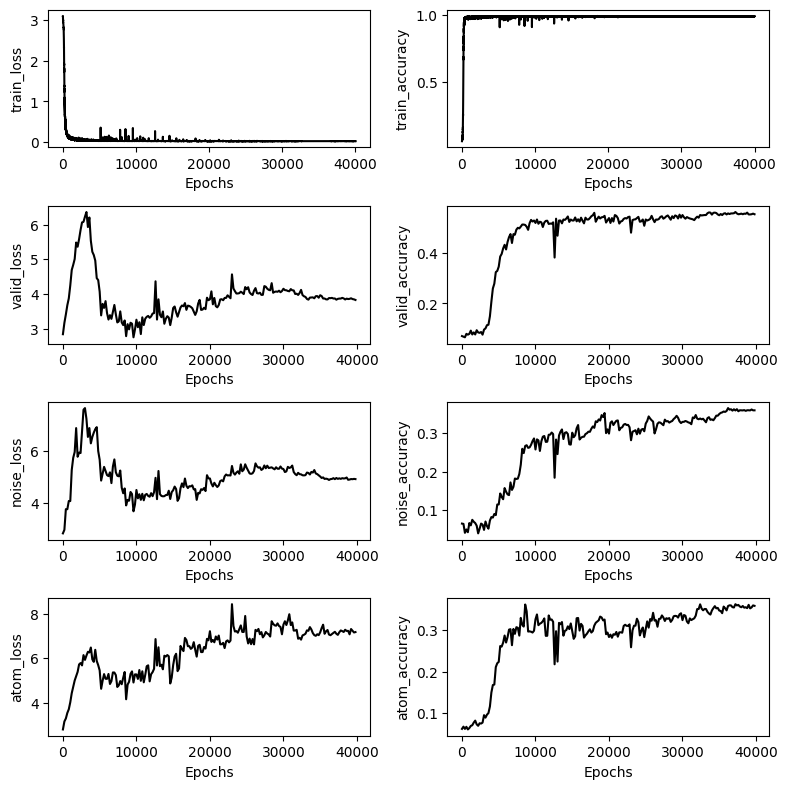

In [2]:
training_specs['ds_size'] = 5000
training_specs['folder_name'] = task_name + '-5k'
model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

### 10K dataset

In [ ]:
training_specs['ds_size'] = 10000
training_specs['folder_name'] = task_name + '-10k'
model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: yig319 to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


[0, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 1100, 1200, 1300, 1400, 1500, 1600, 1700, 1800, 1900, 2000, 2100, 2200, 2300, 2400, 2500, 2600, 2700, 2800, 2900, 3000, 3100, 3200, 3300, 3400, 3500, 3600, 3700, 3800, 3900, 4000, 4100, 4200, 4300, 4400, 4500, 4600, 4700, 4800, 4900, 5000, 5100, 5200, 5300, 5400, 5500, 5600, 5700, 5800, 5900, 6000, 6100, 6200, 6300, 6400, 6500, 6600, 6700, 6800, 6900, 7000, 7100, 7200, 7300, 7400, 7500, 7600, 7700, 7800, 7900, 8000, 8100, 8200, 8300, 8400, 8500, 8600, 8700, 8800, 8900, 9000, 9100, 9200, 9300, 9400, 9500, 9600, 9700, 9800, 9900, 10000, 10100, 10200, 10300, 10400, 10500, 10600, 10700, 10800, 10900, 11000, 11100, 11200, 11300, 11400, 11500, 11600, 11700, 11800, 11900, 12000, 12100, 12200, 12300, 12400, 12500, 12600, 12700, 12800, 12900, 13000, 13100, 13200, 13300, 13400, 13500, 13600, 13700, 13800, 13900, 14000, 14100, 14200, 14300, 14400, 14500, 14600, 14700, 14800, 14900, 15000, 15100, 15200, 15300, 15400, 15500, 15600, 15700, 15800

Train: 100%|██████████| 6/6 [00:11<00:00,  1.97s/it]


train_loss: 3.0990, train_accuracy: 5.90%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.56s/it]


valid_loss: 2.8358, valid_accuracy: 4.76%
Model saved at epoch 0
Saved new best model at epoch 0 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.39s/it]


noise_loss: 2.8351, noise_accuracy: 5.77%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


atom_loss: 2.8357, atom_accuracy: 6.33%
Model saved at epoch 100
Epoch: 101/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.85s/it]


train_loss: 2.6132, train_accuracy: 16.06%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.40s/it]


valid_loss: 2.8425, valid_accuracy: 8.60%
Model saved at epoch 100
Saved new best model at epoch 100 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.40s/it]


noise_loss: 2.8740, noise_accuracy: 6.66%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


atom_loss: 2.9217, atom_accuracy: 7.08%
Model saved at epoch 200
Epoch: 201/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.85s/it]


train_loss: 0.8642, train_accuracy: 84.21%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.38s/it]


valid_loss: 3.1642, valid_accuracy: 9.00%
Model saved at epoch 200
Saved new best model at epoch 200 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


noise_loss: 3.1118, noise_accuracy: 6.20%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


atom_loss: 3.4818, atom_accuracy: 6.39%
Model saved at epoch 300
Epoch: 301/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.84s/it]


train_loss: 0.3262, train_accuracy: 95.79%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.99s/it]


valid_loss: 3.4743, valid_accuracy: 10.04%
Model saved at epoch 300
Saved new best model at epoch 300 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


noise_loss: 3.6923, noise_accuracy: 6.56%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.39s/it]


atom_loss: 3.7098, atom_accuracy: 7.16%
Model saved at epoch 400
Epoch: 401/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.86s/it]


train_loss: 0.2152, train_accuracy: 96.24%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.39s/it]


valid_loss: 3.7173, valid_accuracy: 9.80%


Valid: 100%|██████████| 6/6 [00:09<00:00,  1.63s/it]


noise_loss: 4.6347, noise_accuracy: 5.45%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.39s/it]


atom_loss: 4.2078, atom_accuracy: 6.82%
Model saved at epoch 500
Epoch: 501/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.88s/it]


train_loss: 0.1451, train_accuracy: 97.10%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.05s/it]


valid_loss: 4.0508, valid_accuracy: 10.04%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 5.4846, noise_accuracy: 6.39%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 4.3998, atom_accuracy: 6.94%
Model saved at epoch 600
Epoch: 601/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.87s/it]


train_loss: 0.1104, train_accuracy: 97.52%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.38s/it]


valid_loss: 4.3720, valid_accuracy: 9.56%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


noise_loss: 6.1964, noise_accuracy: 5.92%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


atom_loss: 4.7592, atom_accuracy: 7.24%
Model saved at epoch 700
Epoch: 701/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.87s/it]


train_loss: 0.1202, train_accuracy: 97.14%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.38s/it]


valid_loss: 4.5915, valid_accuracy: 9.92%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.39s/it]


noise_loss: 5.0067, noise_accuracy: 6.75%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


atom_loss: 5.2378, atom_accuracy: 7.66%
Model saved at epoch 800
Epoch: 801/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.86s/it]


train_loss: 0.0935, train_accuracy: 97.49%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.39s/it]


valid_loss: 4.7439, valid_accuracy: 11.24%
Model saved at epoch 800
Saved new best model at epoch 800 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]


noise_loss: 4.9445, noise_accuracy: 6.58%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


atom_loss: 5.2784, atom_accuracy: 9.86%
Model saved at epoch 900
Epoch: 901/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.95s/it]


train_loss: 0.1349, train_accuracy: 96.38%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.51s/it]


valid_loss: 5.1785, valid_accuracy: 10.96%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


noise_loss: 8.3431, noise_accuracy: 6.00%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 6.2173, atom_accuracy: 8.86%
Model saved at epoch 1000
Epoch: 1001/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.87s/it]


train_loss: 0.1106, train_accuracy: 96.80%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.39s/it]


valid_loss: 4.9522, valid_accuracy: 12.60%
Model saved at epoch 1000
Saved new best model at epoch 1000 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.39s/it]


noise_loss: 5.7016, noise_accuracy: 7.30%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.39s/it]

atom_loss: 5.9240, atom_accuracy: 10.49%


Model saved at epoch 1100
Epoch: 1101/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.87s/it]


train_loss: 0.0865, train_accuracy: 97.40%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.39s/it]


valid_loss: 5.0494, valid_accuracy: 14.64%
Model saved at epoch 1100
Saved new best model at epoch 1100 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.44s/it]


noise_loss: 6.6201, noise_accuracy: 7.58%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.39s/it]


atom_loss: 5.7628, atom_accuracy: 13.09%
Model saved at epoch 1200
Epoch: 1201/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.86s/it]


train_loss: 0.0804, train_accuracy: 97.66%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.39s/it]


valid_loss: 4.9350, valid_accuracy: 16.88%
Model saved at epoch 1200
Saved new best model at epoch 1200 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


noise_loss: 6.3637, noise_accuracy: 7.95%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


atom_loss: 5.6308, atom_accuracy: 14.99%
Model saved at epoch 1300
Epoch: 1301/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.85s/it]


train_loss: 0.0673, train_accuracy: 98.07%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.38s/it]


valid_loss: 4.6823, valid_accuracy: 20.32%
Model saved at epoch 1300
Saved new best model at epoch 1300 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


noise_loss: 6.2722, noise_accuracy: 8.45%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


atom_loss: 5.0644, atom_accuracy: 17.04%
Model saved at epoch 1400
Epoch: 1401/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.86s/it]


train_loss: 0.0645, train_accuracy: 98.01%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.38s/it]


valid_loss: 4.7039, valid_accuracy: 23.36%
Model saved at epoch 1400
Saved new best model at epoch 1400 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


noise_loss: 7.5794, noise_accuracy: 6.65%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


atom_loss: 5.9995, atom_accuracy: 17.33%
Model saved at epoch 1500
Epoch: 1501/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.87s/it]


train_loss: 0.0608, train_accuracy: 98.17%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.39s/it]


valid_loss: 4.6504, valid_accuracy: 24.52%
Model saved at epoch 1500
Saved new best model at epoch 1500 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


noise_loss: 9.3594, noise_accuracy: 6.38%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


atom_loss: 5.9069, atom_accuracy: 18.15%
Model saved at epoch 1600
Epoch: 1601/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.86s/it]


train_loss: 0.0600, train_accuracy: 98.18%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.54s/it]


valid_loss: 4.3506, valid_accuracy: 28.16%
Model saved at epoch 1600
Saved new best model at epoch 1600 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


noise_loss: 6.5062, noise_accuracy: 8.80%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]


atom_loss: 4.7953, atom_accuracy: 24.50%
Model saved at epoch 1700
Epoch: 1701/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.86s/it]


train_loss: 0.0738, train_accuracy: 97.98%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.38s/it]


valid_loss: 4.4289, valid_accuracy: 30.80%
Model saved at epoch 1700
Saved new best model at epoch 1700 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


noise_loss: 9.4739, noise_accuracy: 8.01%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


atom_loss: 5.7284, atom_accuracy: 23.10%
Model saved at epoch 1800
Epoch: 1801/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.86s/it]


train_loss: 0.0544, train_accuracy: 98.28%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.40s/it]


valid_loss: 4.2565, valid_accuracy: 31.96%
Model saved at epoch 1800
Saved new best model at epoch 1800 with valid dataset


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 6.2113, noise_accuracy: 8.66%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.36s/it]


atom_loss: 5.1635, atom_accuracy: 24.30%
Model saved at epoch 1900
Epoch: 1901/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.73s/it]


train_loss: 0.0498, train_accuracy: 98.52%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.38s/it]


valid_loss: 3.9512, valid_accuracy: 33.76%
Model saved at epoch 1900
Saved new best model at epoch 1900 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]


noise_loss: 5.7997, noise_accuracy: 10.35%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]


atom_loss: 4.5233, atom_accuracy: 30.59%
Model saved at epoch 2000
Epoch: 2001/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.73s/it]


train_loss: 0.0611, train_accuracy: 98.13%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.37s/it]


valid_loss: 4.1512, valid_accuracy: 33.92%
Model saved at epoch 2000
Saved new best model at epoch 2000 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


noise_loss: 6.1057, noise_accuracy: 10.40%


Valid: 100%|██████████| 6/6 [00:09<00:00,  1.58s/it]


atom_loss: 4.7526, atom_accuracy: 30.30%
Model saved at epoch 2100
Epoch: 2101/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.87s/it]


train_loss: 0.0470, train_accuracy: 98.53%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.39s/it]


valid_loss: 3.9701, valid_accuracy: 37.88%
Model saved at epoch 2100
Saved new best model at epoch 2100 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.39s/it]


noise_loss: 5.9189, noise_accuracy: 9.47%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]


atom_loss: 4.7857, atom_accuracy: 31.95%
Model saved at epoch 2200
Epoch: 2201/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.85s/it]


train_loss: 0.0444, train_accuracy: 98.59%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.39s/it]


valid_loss: 3.9016, valid_accuracy: 40.36%
Model saved at epoch 2200
Saved new best model at epoch 2200 with valid dataset


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 5.9099, noise_accuracy: 11.80%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 4.4949, atom_accuracy: 35.70%
Model saved at epoch 2300
Epoch: 2301/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.86s/it]


train_loss: 0.0580, train_accuracy: 98.25%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.04s/it]


valid_loss: 3.7872, valid_accuracy: 42.04%
Model saved at epoch 2300
Saved new best model at epoch 2300 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.39s/it]


noise_loss: 6.3180, noise_accuracy: 11.53%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


atom_loss: 4.7123, atom_accuracy: 35.96%
Model saved at epoch 2400
Epoch: 2401/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.87s/it]


train_loss: 0.0369, train_accuracy: 98.79%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.38s/it]


valid_loss: 3.3487, valid_accuracy: 44.32%
Model saved at epoch 2400
Saved new best model at epoch 2400 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.40s/it]


noise_loss: 5.3247, noise_accuracy: 11.99%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


atom_loss: 4.5298, atom_accuracy: 35.54%
Model saved at epoch 2500
Epoch: 2501/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.86s/it]


train_loss: 0.0938, train_accuracy: 97.19%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.39s/it]


valid_loss: 3.6691, valid_accuracy: 42.20%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.39s/it]


noise_loss: 4.8900, noise_accuracy: 15.24%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


atom_loss: 4.8580, atom_accuracy: 34.94%
Model saved at epoch 2600
Epoch: 2601/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.87s/it]


train_loss: 0.0463, train_accuracy: 98.52%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.38s/it]


valid_loss: 3.5220, valid_accuracy: 46.60%
Model saved at epoch 2600
Saved new best model at epoch 2600 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.39s/it]


noise_loss: 5.5006, noise_accuracy: 14.24%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.31s/it]


atom_loss: 4.4276, atom_accuracy: 37.74%
Model saved at epoch 2700
Epoch: 2701/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.87s/it]


train_loss: 0.0323, train_accuracy: 98.90%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.38s/it]


valid_loss: 2.8834, valid_accuracy: 51.52%
Model saved at epoch 2700
Saved new best model at epoch 2700 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]


noise_loss: 5.0108, noise_accuracy: 13.97%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


atom_loss: 4.2910, atom_accuracy: 39.74%
Model saved at epoch 2800
Epoch: 2801/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.87s/it]


train_loss: 0.0322, train_accuracy: 98.90%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.39s/it]


valid_loss: 3.0018, valid_accuracy: 51.44%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


noise_loss: 5.0152, noise_accuracy: 14.68%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


atom_loss: 4.2370, atom_accuracy: 40.62%
Model saved at epoch 2900
Epoch: 2901/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.73s/it]


train_loss: 0.0321, train_accuracy: 98.90%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.04s/it]


valid_loss: 2.7461, valid_accuracy: 51.20%
Model saved at epoch 2900
Saved new best model at epoch 2900 with valid dataset


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 4.5096, noise_accuracy: 16.75%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


atom_loss: 3.9270, atom_accuracy: 39.58%
Model saved at epoch 3000
Epoch: 3001/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.84s/it]


train_loss: 0.0705, train_accuracy: 97.79%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.39s/it]


valid_loss: 2.6047, valid_accuracy: 49.52%
Model saved at epoch 3000
Saved new best model at epoch 3000 with valid dataset


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 4.5221, noise_accuracy: 15.34%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 3.7483, atom_accuracy: 41.31%
Model saved at epoch 3100
Epoch: 3101/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.94s/it]


train_loss: 0.0327, train_accuracy: 98.93%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.05s/it]


valid_loss: 2.7203, valid_accuracy: 53.64%
Model saved at epoch 3100
Saved new best model at epoch 3100 with valid dataset


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 4.7260, noise_accuracy: 17.47%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 3.9397, atom_accuracy: 42.98%
Model saved at epoch 3200
Epoch: 3201/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.87s/it]


train_loss: 0.0314, train_accuracy: 98.94%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.38s/it]


valid_loss: 2.7354, valid_accuracy: 52.08%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]


noise_loss: 4.6762, noise_accuracy: 18.48%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.36s/it]


atom_loss: 3.8404, atom_accuracy: 44.39%
Model saved at epoch 3300
Epoch: 3301/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.73s/it]


train_loss: 0.0465, train_accuracy: 98.57%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.04s/it]


valid_loss: 2.5100, valid_accuracy: 51.84%
Model saved at epoch 3300
Saved new best model at epoch 3300 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.35s/it]


noise_loss: 4.5056, noise_accuracy: 19.26%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 3.6016, atom_accuracy: 42.18%
Model saved at epoch 3400
Epoch: 3401/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.74s/it]


train_loss: 0.0343, train_accuracy: 98.80%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.05s/it]


valid_loss: 2.7828, valid_accuracy: 53.68%
Model saved at epoch 3400
Saved new best model at epoch 3400 with valid dataset


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 4.6030, noise_accuracy: 19.43%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 4.3531, atom_accuracy: 38.71%
Model saved at epoch 3500
Epoch: 3501/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.80s/it]


train_loss: 0.0372, train_accuracy: 98.80%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.39s/it]


valid_loss: 2.8153, valid_accuracy: 55.80%
Model saved at epoch 3500
Saved new best model at epoch 3500 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.34s/it]


noise_loss: 5.0495, noise_accuracy: 19.70%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.34s/it]


atom_loss: 4.2452, atom_accuracy: 42.24%
Model saved at epoch 3600
Epoch: 3601/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.79s/it]


train_loss: 0.0311, train_accuracy: 98.95%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.42s/it]


valid_loss: 2.6894, valid_accuracy: 57.52%
Model saved at epoch 3600
Saved new best model at epoch 3600 with valid dataset


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.31s/it]


noise_loss: 4.4849, noise_accuracy: 22.84%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.32s/it]


atom_loss: 4.2049, atom_accuracy: 43.60%
Model saved at epoch 3700
Epoch: 3701/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.86s/it]


train_loss: 0.0315, train_accuracy: 98.94%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.57s/it]


valid_loss: 2.5543, valid_accuracy: 56.92%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]


noise_loss: 4.3747, noise_accuracy: 21.23%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.38s/it]

atom_loss: 4.0558, atom_accuracy: 44.72%


Model saved at epoch 3800
Epoch: 3801/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.98s/it]


train_loss: 0.0311, train_accuracy: 98.91%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.52s/it]


valid_loss: 2.6465, valid_accuracy: 57.04%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.49s/it]


noise_loss: 4.5220, noise_accuracy: 21.44%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.47s/it]

atom_loss: 4.1181, atom_accuracy: 44.50%


Model saved at epoch 3900
Epoch: 3901/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.88s/it]


train_loss: 0.0316, train_accuracy: 98.96%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.56s/it]


valid_loss: 2.4549, valid_accuracy: 58.72%
Model saved at epoch 3900
Saved new best model at epoch 3900 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.40s/it]


noise_loss: 3.9887, noise_accuracy: 26.83%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.41s/it]

atom_loss: 4.1579, atom_accuracy: 41.54%


Model saved at epoch 4000
Epoch: 4001/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.91s/it]


train_loss: 0.0318, train_accuracy: 98.96%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.50s/it]


valid_loss: 2.5456, valid_accuracy: 57.52%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.40s/it]


noise_loss: 4.2589, noise_accuracy: 24.91%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.41s/it]


atom_loss: 4.0486, atom_accuracy: 42.90%
Model saved at epoch 4100
Epoch: 4101/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.90s/it]


train_loss: 0.0317, train_accuracy: 98.93%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.51s/it]


valid_loss: 2.3473, valid_accuracy: 59.16%
Model saved at epoch 4100
Saved new best model at epoch 4100 with valid dataset


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.41s/it]


noise_loss: 4.1253, noise_accuracy: 26.29%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.40s/it]


atom_loss: 3.8491, atom_accuracy: 45.07%
Model saved at epoch 4200
Epoch: 4201/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.78s/it]


train_loss: 0.0332, train_accuracy: 98.92%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 2.5851, valid_accuracy: 58.16%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.30s/it]


noise_loss: 4.4223, noise_accuracy: 26.18%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.28s/it]


atom_loss: 4.3064, atom_accuracy: 43.00%
Model saved at epoch 4300
Epoch: 4301/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.78s/it]


train_loss: 0.0312, train_accuracy: 98.93%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 2.4317, valid_accuracy: 58.96%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.28s/it]


noise_loss: 4.0375, noise_accuracy: 26.60%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.29s/it]


atom_loss: 3.9350, atom_accuracy: 45.05%
Model saved at epoch 4400
Epoch: 4401/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.77s/it]


train_loss: 0.0311, train_accuracy: 98.97%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 2.6214, valid_accuracy: 58.68%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.28s/it]


noise_loss: 4.1342, noise_accuracy: 27.67%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.28s/it]


atom_loss: 4.1943, atom_accuracy: 43.60%
Model saved at epoch 4500
Epoch: 4501/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.73s/it]


train_loss: 0.0313, train_accuracy: 98.94%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 2.4209, valid_accuracy: 59.40%
Model saved at epoch 4500
Saved new best model at epoch 4500 with valid dataset


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 3.8630, noise_accuracy: 30.16%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


atom_loss: 4.0592, atom_accuracy: 42.79%
Model saved at epoch 4600
Epoch: 4601/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0313, train_accuracy: 98.93%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 2.6074, valid_accuracy: 59.60%
Model saved at epoch 4600
Saved new best model at epoch 4600 with valid dataset


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


noise_loss: 4.1276, noise_accuracy: 29.77%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


atom_loss: 4.4802, atom_accuracy: 42.26%
Model saved at epoch 4700
Epoch: 4701/20000


Train: 100%|██████████| 6/6 [00:12<00:00,  2.10s/it]


train_loss: 0.0312, train_accuracy: 98.94%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.67s/it]


valid_loss: 2.3541, valid_accuracy: 59.36%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.34s/it]


noise_loss: 3.8159, noise_accuracy: 30.65%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.30s/it]


atom_loss: 4.0030, atom_accuracy: 44.77%
Model saved at epoch 4800
Epoch: 4801/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.84s/it]


train_loss: 0.0310, train_accuracy: 98.90%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 2.5553, valid_accuracy: 59.96%
Model saved at epoch 4800
Saved new best model at epoch 4800 with valid dataset


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.27s/it]


noise_loss: 4.0492, noise_accuracy: 30.41%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.28s/it]


atom_loss: 4.3149, atom_accuracy: 44.86%
Model saved at epoch 4900
Epoch: 4901/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.77s/it]


train_loss: 0.0317, train_accuracy: 98.95%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 2.5615, valid_accuracy: 58.80%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.27s/it]


noise_loss: 3.9986, noise_accuracy: 30.65%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.27s/it]


atom_loss: 4.4235, atom_accuracy: 42.91%
Model saved at epoch 5000
Epoch: 5001/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.76s/it]


train_loss: 0.0307, train_accuracy: 98.92%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.18s/it]


valid_loss: 2.7020, valid_accuracy: 59.00%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.27s/it]


noise_loss: 4.1350, noise_accuracy: 30.22%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.27s/it]


atom_loss: 4.4732, atom_accuracy: 43.79%
Model saved at epoch 5100
Epoch: 5101/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.76s/it]


train_loss: 0.0315, train_accuracy: 98.93%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.19s/it]


valid_loss: 2.4416, valid_accuracy: 60.32%
Model saved at epoch 5100
Saved new best model at epoch 5100 with valid dataset


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.29s/it]


noise_loss: 3.9136, noise_accuracy: 31.97%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.27s/it]


atom_loss: 3.8686, atom_accuracy: 46.16%
Model saved at epoch 5200
Epoch: 5201/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.75s/it]


train_loss: 0.0310, train_accuracy: 98.92%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 2.6055, valid_accuracy: 59.64%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.26s/it]


noise_loss: 4.1508, noise_accuracy: 31.33%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.26s/it]


atom_loss: 4.0223, atom_accuracy: 45.56%
Model saved at epoch 5300
Epoch: 5301/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.80s/it]


train_loss: 0.0314, train_accuracy: 98.91%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.14s/it]


valid_loss: 2.5947, valid_accuracy: 59.12%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.33s/it]


noise_loss: 3.8389, noise_accuracy: 32.33%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


atom_loss: 4.4145, atom_accuracy: 44.14%
Model saved at epoch 5400
Epoch: 5401/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.74s/it]


train_loss: 0.0307, train_accuracy: 99.00%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 2.7161, valid_accuracy: 59.48%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 3.9376, noise_accuracy: 34.17%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 4.6942, atom_accuracy: 43.28%
Model saved at epoch 5500
Epoch: 5501/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.71s/it]


train_loss: 0.0307, train_accuracy: 98.92%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.18s/it]


valid_loss: 2.8425, valid_accuracy: 59.64%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 3.9857, noise_accuracy: 34.98%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


atom_loss: 5.0326, atom_accuracy: 43.67%
Model saved at epoch 5600
Epoch: 5601/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.73s/it]


train_loss: 0.0307, train_accuracy: 98.91%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 2.4575, valid_accuracy: 60.88%
Model saved at epoch 5600
Saved new best model at epoch 5600 with valid dataset


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 3.7467, noise_accuracy: 33.28%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 4.1607, atom_accuracy: 46.60%
Model saved at epoch 5700
Epoch: 5701/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.74s/it]


train_loss: 0.0312, train_accuracy: 98.88%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 2.6258, valid_accuracy: 60.56%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 3.9656, noise_accuracy: 33.03%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 4.3981, atom_accuracy: 46.19%
Model saved at epoch 5800
Epoch: 5801/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.73s/it]


train_loss: 0.1621, train_accuracy: 95.06%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 2.8527, valid_accuracy: 51.96%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.33s/it]


noise_loss: 4.1884, noise_accuracy: 29.57%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 3.8896, atom_accuracy: 41.63%
Model saved at epoch 5900
Epoch: 5901/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.80s/it]


train_loss: 0.0302, train_accuracy: 98.98%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.53s/it]


valid_loss: 2.5670, valid_accuracy: 59.80%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.31s/it]


noise_loss: 3.7839, noise_accuracy: 32.76%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


atom_loss: 4.5391, atom_accuracy: 43.45%
Model saved at epoch 6000
Epoch: 6001/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.73s/it]


train_loss: 0.0305, train_accuracy: 99.00%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 2.5634, valid_accuracy: 60.84%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 3.8156, noise_accuracy: 33.45%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 4.0502, atom_accuracy: 44.93%
Model saved at epoch 6100
Epoch: 6101/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.71s/it]


train_loss: 0.0309, train_accuracy: 98.96%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 2.7194, valid_accuracy: 60.20%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


noise_loss: 4.0723, noise_accuracy: 32.26%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


atom_loss: 4.4974, atom_accuracy: 44.43%
Model saved at epoch 6200
Epoch: 6201/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.79s/it]


train_loss: 0.0319, train_accuracy: 98.91%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.55s/it]


valid_loss: 2.7707, valid_accuracy: 59.36%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.29s/it]


noise_loss: 3.9403, noise_accuracy: 33.05%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]

atom_loss: 4.8142, atom_accuracy: 41.11%


Model saved at epoch 6300
Epoch: 6301/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.79s/it]


train_loss: 0.0310, train_accuracy: 98.89%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.52s/it]


valid_loss: 2.8423, valid_accuracy: 58.20%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.30s/it]


noise_loss: 4.1320, noise_accuracy: 32.08%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.31s/it]

atom_loss: 5.3573, atom_accuracy: 40.10%


Model saved at epoch 6400
Epoch: 6401/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0307, train_accuracy: 98.92%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 2.8638, valid_accuracy: 59.20%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 4.1337, noise_accuracy: 33.26%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 5.1981, atom_accuracy: 42.43%
Model saved at epoch 6500
Epoch: 6501/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.71s/it]


train_loss: 0.0307, train_accuracy: 98.96%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 2.5242, valid_accuracy: 60.36%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


noise_loss: 3.7805, noise_accuracy: 33.58%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.22s/it]


atom_loss: 4.2796, atom_accuracy: 43.51%
Model saved at epoch 6600
Epoch: 6601/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.75s/it]


train_loss: 0.0313, train_accuracy: 98.98%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.18s/it]


valid_loss: 2.9636, valid_accuracy: 58.68%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.26s/it]


noise_loss: 4.3197, noise_accuracy: 32.56%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 5.0335, atom_accuracy: 39.80%
Model saved at epoch 6700
Epoch: 6701/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.73s/it]


train_loss: 0.0300, train_accuracy: 98.90%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.19s/it]


valid_loss: 2.9005, valid_accuracy: 59.60%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 4.2857, noise_accuracy: 33.62%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 4.9101, atom_accuracy: 42.00%
Model saved at epoch 6800
Epoch: 6801/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.73s/it]


train_loss: 0.0327, train_accuracy: 98.84%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 2.4901, valid_accuracy: 58.96%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 3.4697, noise_accuracy: 35.23%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 4.0338, atom_accuracy: 41.79%
Model saved at epoch 6900
Epoch: 6901/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.73s/it]


train_loss: 0.0302, train_accuracy: 98.95%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 2.8117, valid_accuracy: 59.92%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.29s/it]


noise_loss: 3.9076, noise_accuracy: 35.55%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 4.7852, atom_accuracy: 43.00%
Model saved at epoch 7000
Epoch: 7001/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0300, train_accuracy: 98.97%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 2.8249, valid_accuracy: 60.76%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


noise_loss: 3.9918, noise_accuracy: 35.40%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


atom_loss: 4.8794, atom_accuracy: 43.55%
Model saved at epoch 7100
Epoch: 7101/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0308, train_accuracy: 98.94%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 2.6484, valid_accuracy: 59.84%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


noise_loss: 3.7255, noise_accuracy: 35.18%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


atom_loss: 4.7215, atom_accuracy: 41.52%
Model saved at epoch 7200
Epoch: 7201/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0307, train_accuracy: 98.94%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 2.7772, valid_accuracy: 60.48%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


noise_loss: 3.9298, noise_accuracy: 35.68%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


atom_loss: 4.9619, atom_accuracy: 42.42%
Model saved at epoch 7300
Epoch: 7301/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0305, train_accuracy: 98.92%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 2.6644, valid_accuracy: 59.52%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


noise_loss: 3.7541, noise_accuracy: 36.85%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


atom_loss: 4.8785, atom_accuracy: 40.68%
Model saved at epoch 7400
Epoch: 7401/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0311, train_accuracy: 98.92%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 2.8870, valid_accuracy: 58.96%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 4.0016, noise_accuracy: 35.45%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


atom_loss: 5.2531, atom_accuracy: 40.79%
Model saved at epoch 7500
Epoch: 7501/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.79s/it]


train_loss: 0.0305, train_accuracy: 98.95%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.53s/it]


valid_loss: 2.8634, valid_accuracy: 60.72%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.30s/it]


noise_loss: 4.4713, noise_accuracy: 32.92%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.30s/it]

atom_loss: 5.2109, atom_accuracy: 41.29%


Model saved at epoch 7600
Epoch: 7601/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.78s/it]


train_loss: 0.0299, train_accuracy: 98.99%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.56s/it]


valid_loss: 2.9085, valid_accuracy: 60.36%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.30s/it]


noise_loss: 4.6517, noise_accuracy: 32.37%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


atom_loss: 5.4104, atom_accuracy: 40.90%
Model saved at epoch 7700
Epoch: 7701/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0303, train_accuracy: 98.89%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 2.7986, valid_accuracy: 60.24%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


noise_loss: 4.2713, noise_accuracy: 34.29%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


atom_loss: 5.1317, atom_accuracy: 42.18%
Model saved at epoch 7800
Epoch: 7801/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0304, train_accuracy: 98.97%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 2.8227, valid_accuracy: 60.84%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 4.3780, noise_accuracy: 34.26%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 5.1789, atom_accuracy: 42.85%
Model saved at epoch 7900
Epoch: 7901/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0301, train_accuracy: 98.98%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 2.8307, valid_accuracy: 60.84%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 4.0887, noise_accuracy: 35.63%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


atom_loss: 5.0574, atom_accuracy: 41.14%
Model saved at epoch 8000
Epoch: 8001/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.74s/it]


train_loss: 0.0303, train_accuracy: 98.89%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 2.9493, valid_accuracy: 60.28%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 4.1497, noise_accuracy: 35.71%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 5.2384, atom_accuracy: 41.72%
Model saved at epoch 8100
Epoch: 8101/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.82s/it]


train_loss: 0.0301, train_accuracy: 98.97%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.54s/it]


valid_loss: 2.9614, valid_accuracy: 60.84%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.34s/it]


noise_loss: 4.1975, noise_accuracy: 35.96%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.33s/it]

atom_loss: 5.2419, atom_accuracy: 41.82%


Model saved at epoch 8200
Epoch: 8201/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.74s/it]


train_loss: 0.0304, train_accuracy: 98.91%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 2.9429, valid_accuracy: 60.36%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.26s/it]


noise_loss: 4.1344, noise_accuracy: 36.29%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 5.2928, atom_accuracy: 42.24%
Model saved at epoch 8300
Epoch: 8301/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.80s/it]


train_loss: 0.0303, train_accuracy: 98.95%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.54s/it]


valid_loss: 2.7815, valid_accuracy: 59.68%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]


noise_loss: 4.2452, noise_accuracy: 34.75%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.32s/it]


atom_loss: 5.0525, atom_accuracy: 41.15%
Model saved at epoch 8400
Epoch: 8401/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.74s/it]


train_loss: 0.0307, train_accuracy: 98.93%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.18s/it]


valid_loss: 2.8589, valid_accuracy: 60.24%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 4.2965, noise_accuracy: 34.98%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 5.1642, atom_accuracy: 41.75%
Model saved at epoch 8500
Epoch: 8501/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.73s/it]


train_loss: 0.0303, train_accuracy: 98.96%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.15s/it]


valid_loss: 2.9002, valid_accuracy: 59.72%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 4.1939, noise_accuracy: 34.91%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 5.9561, atom_accuracy: 39.11%
Model saved at epoch 8600
Epoch: 8601/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.74s/it]


train_loss: 0.0307, train_accuracy: 98.94%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 2.9033, valid_accuracy: 59.84%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 4.2680, noise_accuracy: 34.88%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.32s/it]


atom_loss: 5.7204, atom_accuracy: 40.07%
Model saved at epoch 8700
Epoch: 8701/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.73s/it]


train_loss: 0.0306, train_accuracy: 98.92%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 2.9076, valid_accuracy: 59.64%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 4.2964, noise_accuracy: 34.75%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 5.7913, atom_accuracy: 40.19%
Model saved at epoch 8800
Epoch: 8801/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.73s/it]


train_loss: 0.0299, train_accuracy: 98.97%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 2.9611, valid_accuracy: 59.52%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 4.3932, noise_accuracy: 34.20%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 5.7016, atom_accuracy: 41.57%
Model saved at epoch 8900
Epoch: 8901/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.73s/it]


train_loss: 0.0306, train_accuracy: 98.98%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 2.7805, valid_accuracy: 61.04%
Model saved at epoch 8900
Saved new best model at epoch 8900 with valid dataset


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 3.9317, noise_accuracy: 36.55%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 6.6716, atom_accuracy: 35.71%
Model saved at epoch 9000
Epoch: 9001/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.73s/it]


train_loss: 0.0295, train_accuracy: 99.01%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 2.8819, valid_accuracy: 61.88%
Model saved at epoch 9000
Saved new best model at epoch 9000 with valid dataset


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 4.1337, noise_accuracy: 36.36%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 6.8258, atom_accuracy: 35.92%
Model saved at epoch 9100
Epoch: 9101/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0299, train_accuracy: 98.99%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 2.8606, valid_accuracy: 61.68%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 4.1374, noise_accuracy: 36.40%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 6.6152, atom_accuracy: 36.59%
Model saved at epoch 9200
Epoch: 9201/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.84s/it]


train_loss: 0.0303, train_accuracy: 98.94%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.54s/it]


valid_loss: 2.8453, valid_accuracy: 62.28%
Model saved at epoch 9200
Saved new best model at epoch 9200 with valid dataset


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.31s/it]


noise_loss: 4.1044, noise_accuracy: 36.76%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.31s/it]


atom_loss: 6.5448, atom_accuracy: 37.54%
Model saved at epoch 9300
Epoch: 9301/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.81s/it]


train_loss: 0.0296, train_accuracy: 98.95%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.52s/it]


valid_loss: 2.8375, valid_accuracy: 61.80%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.31s/it]


noise_loss: 4.1414, noise_accuracy: 36.55%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.31s/it]

atom_loss: 6.4975, atom_accuracy: 38.43%


Model saved at epoch 9400
Epoch: 9401/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0300, train_accuracy: 98.98%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 2.8091, valid_accuracy: 59.88%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 3.9919, noise_accuracy: 35.58%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 5.2563, atom_accuracy: 40.79%
Model saved at epoch 9500
Epoch: 9501/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.79s/it]


train_loss: 0.0299, train_accuracy: 98.93%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.54s/it]


valid_loss: 2.9524, valid_accuracy: 59.80%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.31s/it]


noise_loss: 4.1746, noise_accuracy: 35.99%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.31s/it]


atom_loss: 5.4669, atom_accuracy: 40.59%
Model saved at epoch 9600
Epoch: 9601/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0302, train_accuracy: 98.94%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 2.9825, valid_accuracy: 60.08%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 4.1603, noise_accuracy: 36.03%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 5.6858, atom_accuracy: 40.24%
Model saved at epoch 9700
Epoch: 9701/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.79s/it]


train_loss: 0.0304, train_accuracy: 98.94%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.54s/it]


valid_loss: 2.9888, valid_accuracy: 60.80%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.31s/it]


noise_loss: 4.2569, noise_accuracy: 36.53%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.30s/it]

atom_loss: 5.5338, atom_accuracy: 42.04%


Model saved at epoch 9800
Epoch: 9801/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.80s/it]


train_loss: 0.0305, train_accuracy: 98.98%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.55s/it]


valid_loss: 2.9597, valid_accuracy: 60.88%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.31s/it]


noise_loss: 4.2217, noise_accuracy: 37.17%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.32s/it]

atom_loss: 5.5284, atom_accuracy: 42.30%


Model saved at epoch 9900
Epoch: 9901/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0297, train_accuracy: 98.99%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.47s/it]


valid_loss: 3.2159, valid_accuracy: 59.16%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.22s/it]


noise_loss: 4.5134, noise_accuracy: 33.98%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.22s/it]


atom_loss: 5.4483, atom_accuracy: 41.80%
Model saved at epoch 10000
Epoch: 10001/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0294, train_accuracy: 98.96%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 3.1935, valid_accuracy: 60.76%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


noise_loss: 4.3872, noise_accuracy: 35.56%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


atom_loss: 5.4530, atom_accuracy: 41.99%
Model saved at epoch 10100
Epoch: 10101/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.83s/it]


train_loss: 0.0299, train_accuracy: 99.01%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.52s/it]


valid_loss: 3.1795, valid_accuracy: 60.80%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.28s/it]


noise_loss: 4.3640, noise_accuracy: 36.98%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.39s/it]

atom_loss: 5.7185, atom_accuracy: 41.33%


Model saved at epoch 10200
Epoch: 10201/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.78s/it]


train_loss: 0.0294, train_accuracy: 98.97%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.53s/it]


valid_loss: 3.0820, valid_accuracy: 61.40%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.31s/it]


noise_loss: 4.4034, noise_accuracy: 36.62%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.28s/it]


atom_loss: 5.6346, atom_accuracy: 41.01%
Model saved at epoch 10300
Epoch: 10301/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.79s/it]


train_loss: 0.0303, train_accuracy: 98.95%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.51s/it]


valid_loss: 3.1875, valid_accuracy: 59.68%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.29s/it]


noise_loss: 4.5786, noise_accuracy: 36.43%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.29s/it]

atom_loss: 6.0336, atom_accuracy: 40.33%


Model saved at epoch 10400
Epoch: 10401/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.71s/it]


train_loss: 0.0300, train_accuracy: 98.97%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 3.2305, valid_accuracy: 60.12%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.22s/it]


noise_loss: 4.4825, noise_accuracy: 36.17%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.22s/it]


atom_loss: 5.9436, atom_accuracy: 40.54%
Model saved at epoch 10500
Epoch: 10501/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.84s/it]


train_loss: 0.0300, train_accuracy: 98.99%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.51s/it]


valid_loss: 3.1846, valid_accuracy: 60.08%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.36s/it]


noise_loss: 4.4788, noise_accuracy: 36.08%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]

atom_loss: 5.7582, atom_accuracy: 40.56%


Model saved at epoch 10600
Epoch: 10601/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.85s/it]


train_loss: 0.0301, train_accuracy: 98.94%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.53s/it]


valid_loss: 3.0957, valid_accuracy: 61.00%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.35s/it]


noise_loss: 4.3679, noise_accuracy: 36.58%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]

atom_loss: 5.6979, atom_accuracy: 40.68%


Model saved at epoch 10700
Epoch: 10701/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.85s/it]


train_loss: 0.0296, train_accuracy: 98.92%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.55s/it]


valid_loss: 3.0780, valid_accuracy: 60.96%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.36s/it]


noise_loss: 4.3723, noise_accuracy: 36.46%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.35s/it]


atom_loss: 5.6421, atom_accuracy: 41.06%
Model saved at epoch 10800
Epoch: 10801/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.89s/it]


train_loss: 0.0301, train_accuracy: 98.89%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.55s/it]


valid_loss: 2.9274, valid_accuracy: 61.36%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.35s/it]


noise_loss: 4.1606, noise_accuracy: 38.21%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.35s/it]


atom_loss: 5.5314, atom_accuracy: 41.23%
Model saved at epoch 10900
Epoch: 10901/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.74s/it]


train_loss: 0.0295, train_accuracy: 98.95%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 2.9875, valid_accuracy: 61.64%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 4.2527, noise_accuracy: 38.27%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.26s/it]


atom_loss: 5.6726, atom_accuracy: 41.33%
Model saved at epoch 11000
Epoch: 11001/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.85s/it]


train_loss: 0.0321, train_accuracy: 98.87%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.52s/it]


valid_loss: 3.3722, valid_accuracy: 59.52%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.45s/it]


noise_loss: 5.0269, noise_accuracy: 35.69%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 6.0746, atom_accuracy: 39.68%
Model saved at epoch 11100
Epoch: 11101/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.74s/it]


train_loss: 0.0302, train_accuracy: 98.95%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 3.2227, valid_accuracy: 61.68%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 4.7372, noise_accuracy: 36.58%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 6.0112, atom_accuracy: 40.69%
Model saved at epoch 11200
Epoch: 11201/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.74s/it]


train_loss: 0.0298, train_accuracy: 98.97%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 3.1555, valid_accuracy: 61.84%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 4.5993, noise_accuracy: 37.58%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 5.8482, atom_accuracy: 40.74%
Model saved at epoch 11300
Epoch: 11301/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.73s/it]


train_loss: 0.0332, train_accuracy: 98.90%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 3.6025, valid_accuracy: 58.16%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 5.4015, noise_accuracy: 32.59%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.26s/it]


atom_loss: 6.3618, atom_accuracy: 36.58%
Model saved at epoch 11400
Epoch: 11401/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.85s/it]


train_loss: 0.0295, train_accuracy: 98.96%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.53s/it]


valid_loss: 3.2049, valid_accuracy: 61.12%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.36s/it]


noise_loss: 4.5131, noise_accuracy: 36.04%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.36s/it]


atom_loss: 5.6701, atom_accuracy: 40.64%
Model saved at epoch 11500
Epoch: 11501/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.84s/it]


train_loss: 0.0297, train_accuracy: 98.96%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.54s/it]


valid_loss: 3.2036, valid_accuracy: 61.64%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.36s/it]


noise_loss: 4.6072, noise_accuracy: 36.59%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.36s/it]


atom_loss: 5.6014, atom_accuracy: 41.02%
Model saved at epoch 11600
Epoch: 11601/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.73s/it]


train_loss: 0.0337, train_accuracy: 98.86%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.15s/it]


valid_loss: 3.5610, valid_accuracy: 57.80%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 4.5068, noise_accuracy: 36.63%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 5.9922, atom_accuracy: 37.50%
Model saved at epoch 11700
Epoch: 11701/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.74s/it]


train_loss: 0.0297, train_accuracy: 98.98%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 3.3523, valid_accuracy: 59.64%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 4.5318, noise_accuracy: 37.11%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 5.8512, atom_accuracy: 39.81%
Model saved at epoch 11800
Epoch: 11801/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.74s/it]


train_loss: 0.0305, train_accuracy: 98.89%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 3.2997, valid_accuracy: 60.12%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 4.5131, noise_accuracy: 37.97%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 5.8685, atom_accuracy: 39.78%
Model saved at epoch 11900
Epoch: 11901/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.79s/it]


train_loss: 0.0300, train_accuracy: 98.94%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.15s/it]


valid_loss: 3.4015, valid_accuracy: 59.68%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 4.7873, noise_accuracy: 35.49%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


atom_loss: 5.9821, atom_accuracy: 42.43%
Model saved at epoch 12000
Epoch: 12001/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.74s/it]


train_loss: 0.0301, train_accuracy: 98.93%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 3.3384, valid_accuracy: 60.24%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 4.6940, noise_accuracy: 35.84%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 5.9452, atom_accuracy: 42.78%
Model saved at epoch 12100
Epoch: 12101/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.73s/it]


train_loss: 0.0302, train_accuracy: 98.91%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 3.2970, valid_accuracy: 60.60%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 4.6649, noise_accuracy: 35.77%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 5.9652, atom_accuracy: 43.25%
Model saved at epoch 12200
Epoch: 12201/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.74s/it]


train_loss: 0.0303, train_accuracy: 98.96%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 3.4295, valid_accuracy: 58.76%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 4.7391, noise_accuracy: 36.56%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 5.9790, atom_accuracy: 43.64%
Model saved at epoch 12300
Epoch: 12301/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.83s/it]


train_loss: 0.0298, train_accuracy: 98.95%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.55s/it]


valid_loss: 3.3907, valid_accuracy: 59.76%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.35s/it]


noise_loss: 4.7444, noise_accuracy: 35.74%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.34s/it]


atom_loss: 5.4978, atom_accuracy: 45.03%
Model saved at epoch 12400
Epoch: 12401/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.74s/it]


train_loss: 0.0295, train_accuracy: 98.96%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 3.2965, valid_accuracy: 60.64%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 4.6870, noise_accuracy: 36.07%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 5.5397, atom_accuracy: 44.61%
Model saved at epoch 12500
Epoch: 12501/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.74s/it]


train_loss: 0.0304, train_accuracy: 98.92%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 3.2640, valid_accuracy: 60.80%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.31s/it]


noise_loss: 4.6739, noise_accuracy: 36.30%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 5.6193, atom_accuracy: 44.77%
Model saved at epoch 12600
Epoch: 12601/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0297, train_accuracy: 98.93%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.15s/it]


valid_loss: 3.2135, valid_accuracy: 61.32%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 4.6171, noise_accuracy: 36.48%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 5.7497, atom_accuracy: 44.07%
Model saved at epoch 12700
Epoch: 12701/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0300, train_accuracy: 98.96%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 3.3141, valid_accuracy: 60.16%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 4.6499, noise_accuracy: 36.89%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 5.9047, atom_accuracy: 41.48%
Model saved at epoch 12800
Epoch: 12801/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0300, train_accuracy: 99.00%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.15s/it]


valid_loss: 3.2930, valid_accuracy: 60.40%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


noise_loss: 4.6298, noise_accuracy: 37.18%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


atom_loss: 5.7935, atom_accuracy: 42.20%
Model saved at epoch 12900
Epoch: 12901/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0302, train_accuracy: 99.00%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 3.2662, valid_accuracy: 60.88%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 4.6563, noise_accuracy: 37.14%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


atom_loss: 5.8641, atom_accuracy: 42.63%
Model saved at epoch 13000
Epoch: 13001/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0300, train_accuracy: 98.98%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 3.2485, valid_accuracy: 60.92%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.29s/it]


noise_loss: 4.6415, noise_accuracy: 37.05%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 5.7892, atom_accuracy: 42.39%
Model saved at epoch 13100
Epoch: 13101/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0300, train_accuracy: 98.97%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 3.2643, valid_accuracy: 60.60%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 4.5508, noise_accuracy: 38.13%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


atom_loss: 5.8261, atom_accuracy: 41.78%
Model saved at epoch 13200
Epoch: 13201/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0294, train_accuracy: 99.00%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.18s/it]


valid_loss: 3.3497, valid_accuracy: 60.84%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


noise_loss: 4.8550, noise_accuracy: 36.02%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


atom_loss: 5.8954, atom_accuracy: 41.89%
Model saved at epoch 13300
Epoch: 13301/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.72s/it]


train_loss: 0.0296, train_accuracy: 99.00%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.17s/it]


valid_loss: 3.3157, valid_accuracy: 61.00%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.23s/it]


noise_loss: 4.8583, noise_accuracy: 36.37%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.24s/it]


atom_loss: 6.0101, atom_accuracy: 41.61%
Model saved at epoch 13400
Epoch: 13401/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.74s/it]


train_loss: 0.0298, train_accuracy: 98.94%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 3.2679, valid_accuracy: 61.08%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.30s/it]


noise_loss: 4.8096, noise_accuracy: 36.93%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.33s/it]


atom_loss: 6.0408, atom_accuracy: 40.84%
Model saved at epoch 13500
Epoch: 13501/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.95s/it]


train_loss: 0.0292, train_accuracy: 98.96%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.54s/it]


valid_loss: 3.2398, valid_accuracy: 61.28%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.36s/it]


noise_loss: 4.7567, noise_accuracy: 36.90%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]

atom_loss: 5.9857, atom_accuracy: 41.54%


Model saved at epoch 13600
Epoch: 13601/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.75s/it]


train_loss: 0.0295, train_accuracy: 98.93%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.14s/it]


valid_loss: 3.2631, valid_accuracy: 60.28%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.26s/it]


noise_loss: 4.8582, noise_accuracy: 37.11%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.25s/it]


atom_loss: 5.8367, atom_accuracy: 42.47%
Model saved at epoch 13700
Epoch: 13701/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.95s/it]


train_loss: 0.0296, train_accuracy: 98.95%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.51s/it]


valid_loss: 3.3556, valid_accuracy: 60.24%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]


noise_loss: 4.8779, noise_accuracy: 35.84%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.37s/it]

atom_loss: 5.7842, atom_accuracy: 42.62%


Model saved at epoch 13800
Epoch: 13801/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.75s/it]


train_loss: 0.0297, train_accuracy: 98.97%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.16s/it]


valid_loss: 3.3300, valid_accuracy: 61.28%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.27s/it]


noise_loss: 4.8676, noise_accuracy: 37.06%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.27s/it]


atom_loss: 5.9070, atom_accuracy: 42.20%
Model saved at epoch 13900
Epoch: 13901/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.84s/it]


train_loss: 0.0297, train_accuracy: 98.93%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.52s/it]


valid_loss: 3.3419, valid_accuracy: 60.44%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.35s/it]


noise_loss: 4.7303, noise_accuracy: 37.85%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.47s/it]

atom_loss: 6.0766, atom_accuracy: 41.35%


Model saved at epoch 14000
Epoch: 14001/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.75s/it]


train_loss: 0.0294, train_accuracy: 99.01%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.15s/it]


valid_loss: 3.2604, valid_accuracy: 61.00%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.26s/it]


noise_loss: 4.8609, noise_accuracy: 37.43%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.26s/it]


atom_loss: 6.1631, atom_accuracy: 42.70%
Model saved at epoch 14100
Epoch: 14101/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.85s/it]


train_loss: 0.0300, train_accuracy: 98.96%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.54s/it]


valid_loss: 3.2522, valid_accuracy: 61.28%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.36s/it]


noise_loss: 4.7662, noise_accuracy: 37.28%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.36s/it]


atom_loss: 5.8862, atom_accuracy: 42.19%
Model saved at epoch 14200
Epoch: 14201/20000


Train: 100%|██████████| 6/6 [00:10<00:00,  1.78s/it]


train_loss: 0.0301, train_accuracy: 98.98%


Valid: 100%|██████████| 2/2 [00:04<00:00,  2.15s/it]


valid_loss: 3.2636, valid_accuracy: 61.24%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.29s/it]


noise_loss: 5.0013, noise_accuracy: 36.22%


Valid: 100%|██████████| 6/6 [00:07<00:00,  1.28s/it]


atom_loss: 5.7248, atom_accuracy: 43.07%
Model saved at epoch 14300
Epoch: 14301/20000


Train: 100%|██████████| 6/6 [00:11<00:00,  1.92s/it]


train_loss: 0.0305, train_accuracy: 98.97%


Valid: 100%|██████████| 2/2 [00:05<00:00,  2.52s/it]


valid_loss: 3.3721, valid_accuracy: 61.88%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.43s/it]


noise_loss: 5.0048, noise_accuracy: 37.19%


Valid: 100%|██████████| 6/6 [00:08<00:00,  1.43s/it]


atom_loss: 6.7014, atom_accuracy: 39.59%


### 50k dataset

In [ ]:
training_specs['ds_size'] = 50000
training_specs['folder_name'] = task_name + '-50k'
model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: yig319 to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


[0, 20, 40, 60, 80, 100, 120, 140, 160, 180, 200, 220, 240, 260, 280, 300, 320, 340, 360, 380, 400, 420, 440, 460, 480, 500, 520, 540, 560, 580, 600, 620, 640, 660, 680, 700, 720, 740, 760, 780, 800, 820, 840, 860, 880, 900, 920, 940, 960, 980, 1000, 1020, 1040, 1060, 1080, 1100, 1120, 1140, 1160, 1180, 1200, 1220, 1240, 1260, 1280, 1300, 1320, 1340, 1360, 1380, 1400, 1420, 1440, 1460, 1480, 1500, 1520, 1540, 1560, 1580, 1600, 1620, 1640, 1660, 1680, 1700, 1720, 1740, 1760, 1780, 1800, 1820, 1840, 1860, 1880, 1900, 1920, 1940, 1960, 1980, 2000, 2020, 2040, 2060, 2080, 2100, 2120, 2140, 2160, 2180, 2200, 2220, 2240, 2260, 2280, 2300, 2320, 2340, 2360, 2380, 2400, 2420, 2440, 2460, 2480, 2500, 2520, 2540, 2560, 2580, 2600, 2620, 2640, 2660, 2680, 2700, 2720, 2740, 2760, 2780, 2800, 2820, 2840, 2860, 2880, 2900, 2920, 2940, 2960, 2980, 3000, 3020, 3040, 3060, 3080, 3100, 3120, 3140, 3160, 3180, 3200, 3220, 3240, 3260, 3280, 3300, 3320, 3340, 3360, 3380, 3400, 3420, 3440, 3460, 3480, 3500,

Train: 100%|██████████| 28/28 [00:38<00:00,  1.37s/it]


train_loss: 3.0780, train_accuracy: 6.00%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.22s/it]


valid_loss: 2.8571, valid_accuracy: 6.07%
Model saved at epoch 0
Saved new best model at epoch 0 with valid dataset


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.17it/s]


noise_loss: 2.8577, noise_accuracy: 5.71%


Valid: 100%|██████████| 28/28 [00:23<00:00,  1.17it/s]


atom_loss: 2.8591, atom_accuracy: 5.77%
Model saved at epoch 20
Epoch: 21/4000


Train: 100%|██████████| 28/28 [00:38<00:00,  1.38s/it]


train_loss: 2.8526, train_accuracy: 7.98%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.21s/it]


valid_loss: 2.8236, valid_accuracy: 8.44%
Model saved at epoch 20
Saved new best model at epoch 20 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 2.8506, noise_accuracy: 5.98%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


atom_loss: 2.7934, atom_accuracy: 6.50%
Model saved at epoch 40
Epoch: 41/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.42s/it]


train_loss: 2.4776, train_accuracy: 16.64%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.19s/it]


valid_loss: 2.4895, valid_accuracy: 19.70%
Model saved at epoch 40
Saved new best model at epoch 40 with valid dataset


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


noise_loss: 3.1376, noise_accuracy: 6.15%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


atom_loss: 2.8268, atom_accuracy: 13.30%
Model saved at epoch 60
Epoch: 61/4000


Train: 100%|██████████| 28/28 [00:38<00:00,  1.37s/it]


train_loss: 1.4038, train_accuracy: 52.39%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.20s/it]


valid_loss: 1.5520, valid_accuracy: 46.46%
Model saved at epoch 60
Saved new best model at epoch 60 with valid dataset


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


noise_loss: 3.6406, noise_accuracy: 8.21%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.15it/s]


atom_loss: 2.4425, atom_accuracy: 28.37%
Model saved at epoch 80
Epoch: 81/4000


Train: 100%|██████████| 28/28 [00:38<00:00,  1.38s/it]


train_loss: 0.6926, train_accuracy: 82.74%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.20s/it]


valid_loss: 1.4296, valid_accuracy: 50.86%
Model saved at epoch 80
Saved new best model at epoch 80 with valid dataset


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


noise_loss: 3.5797, noise_accuracy: 9.86%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.09it/s]


atom_loss: 2.3497, atom_accuracy: 34.29%
Model saved at epoch 100
Epoch: 101/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.3328, train_accuracy: 93.31%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.21s/it]


valid_loss: 1.5554, valid_accuracy: 52.47%
Model saved at epoch 100
Saved new best model at epoch 100 with valid dataset


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


noise_loss: 3.7560, noise_accuracy: 10.73%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


atom_loss: 2.9168, atom_accuracy: 31.60%
Model saved at epoch 120
Epoch: 121/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.2125, train_accuracy: 95.49%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.20s/it]


valid_loss: 1.7622, valid_accuracy: 51.22%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.15it/s]


noise_loss: 4.0156, noise_accuracy: 10.25%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


atom_loss: 3.4791, atom_accuracy: 30.58%
Model saved at epoch 140
Epoch: 141/4000


Train: 100%|██████████| 28/28 [00:38<00:00,  1.38s/it]


train_loss: 0.1700, train_accuracy: 95.84%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.21s/it]


valid_loss: 1.7956, valid_accuracy: 53.65%
Model saved at epoch 140
Saved new best model at epoch 140 with valid dataset


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


noise_loss: 4.2775, noise_accuracy: 11.00%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 3.5612, atom_accuracy: 32.15%
Model saved at epoch 160
Epoch: 161/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.1509, train_accuracy: 96.05%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.21s/it]


valid_loss: 2.1392, valid_accuracy: 52.54%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.15it/s]


noise_loss: 4.5027, noise_accuracy: 11.75%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


atom_loss: 4.0934, atom_accuracy: 31.96%
Model saved at epoch 180
Epoch: 181/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.43s/it]


train_loss: 0.1331, train_accuracy: 96.39%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.21s/it]


valid_loss: 1.9809, valid_accuracy: 54.82%
Model saved at epoch 180
Saved new best model at epoch 180 with valid dataset


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.15it/s]


noise_loss: 4.3735, noise_accuracy: 10.77%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


atom_loss: 3.8076, atom_accuracy: 36.15%
Model saved at epoch 200
Epoch: 201/4000


Train: 100%|██████████| 28/28 [00:38<00:00,  1.38s/it]


train_loss: 0.1253, train_accuracy: 96.34%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.20s/it]


valid_loss: 2.0196, valid_accuracy: 56.07%
Model saved at epoch 200
Saved new best model at epoch 200 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 4.3267, noise_accuracy: 13.23%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


atom_loss: 4.1075, atom_accuracy: 32.98%
Model saved at epoch 220
Epoch: 221/4000


Train: 100%|██████████| 28/28 [00:38<00:00,  1.38s/it]


train_loss: 0.1259, train_accuracy: 96.29%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.21s/it]


valid_loss: 2.0933, valid_accuracy: 57.02%
Model saved at epoch 220
Saved new best model at epoch 220 with valid dataset


Valid: 100%|██████████| 28/28 [00:23<00:00,  1.18it/s]


noise_loss: 4.9526, noise_accuracy: 12.23%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


atom_loss: 3.9369, atom_accuracy: 37.39%
Model saved at epoch 240
Epoch: 241/4000


Train: 100%|██████████| 28/28 [00:38<00:00,  1.38s/it]


train_loss: 0.1203, train_accuracy: 96.40%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.20s/it]


valid_loss: 2.0310, valid_accuracy: 58.54%
Model saved at epoch 240
Saved new best model at epoch 240 with valid dataset


Valid: 100%|██████████| 28/28 [00:23<00:00,  1.17it/s]


noise_loss: 6.6310, noise_accuracy: 9.57%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


atom_loss: 4.4866, atom_accuracy: 34.98%
Model saved at epoch 260
Epoch: 261/4000


Train: 100%|██████████| 28/28 [00:38<00:00,  1.38s/it]


train_loss: 0.0999, train_accuracy: 97.05%


Valid: 100%|██████████| 7/7 [00:07<00:00,  1.13s/it]


valid_loss: 2.2261, valid_accuracy: 57.30%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.15it/s]


noise_loss: 5.5287, noise_accuracy: 11.24%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.16it/s]


atom_loss: 4.3492, atom_accuracy: 37.98%
Model saved at epoch 280
Epoch: 281/4000


Train: 100%|██████████| 28/28 [00:38<00:00,  1.38s/it]


train_loss: 0.0982, train_accuracy: 97.08%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.23s/it]


valid_loss: 1.9700, valid_accuracy: 61.10%
Model saved at epoch 280
Saved new best model at epoch 280 with valid dataset


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


noise_loss: 5.5090, noise_accuracy: 11.28%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.15it/s]


atom_loss: 4.2180, atom_accuracy: 37.74%
Model saved at epoch 300
Epoch: 301/4000


Train: 100%|██████████| 28/28 [00:38<00:00,  1.38s/it]


train_loss: 0.1025, train_accuracy: 96.89%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.23s/it]


valid_loss: 1.9088, valid_accuracy: 61.37%
Model saved at epoch 300
Saved new best model at epoch 300 with valid dataset


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


noise_loss: 5.6179, noise_accuracy: 12.25%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


atom_loss: 4.2016, atom_accuracy: 39.11%
Model saved at epoch 320
Epoch: 321/4000


Train: 100%|██████████| 28/28 [00:38<00:00,  1.38s/it]


train_loss: 0.0819, train_accuracy: 97.56%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.23s/it]


valid_loss: 1.8918, valid_accuracy: 62.53%
Model saved at epoch 320
Saved new best model at epoch 320 with valid dataset


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


noise_loss: 5.4535, noise_accuracy: 13.32%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.15it/s]


atom_loss: 4.5399, atom_accuracy: 35.68%
Model saved at epoch 340
Epoch: 341/4000


Train: 100%|██████████| 28/28 [00:38<00:00,  1.37s/it]


train_loss: 0.0945, train_accuracy: 97.17%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.26s/it]


valid_loss: 2.0132, valid_accuracy: 62.50%


Valid: 100%|██████████| 28/28 [00:23<00:00,  1.20it/s]


noise_loss: 5.7295, noise_accuracy: 12.47%


Valid: 100%|██████████| 28/28 [00:23<00:00,  1.21it/s]


atom_loss: 4.8531, atom_accuracy: 35.05%
Model saved at epoch 360
Epoch: 361/4000


Train: 100%|██████████| 28/28 [00:37<00:00,  1.35s/it]


train_loss: 0.0887, train_accuracy: 97.26%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.20s/it]


valid_loss: 1.9467, valid_accuracy: 63.84%
Model saved at epoch 360
Saved new best model at epoch 360 with valid dataset


Valid: 100%|██████████| 28/28 [00:23<00:00,  1.19it/s]


noise_loss: 5.1587, noise_accuracy: 15.67%


Valid: 100%|██████████| 28/28 [00:23<00:00,  1.19it/s]


atom_loss: 4.5461, atom_accuracy: 37.91%
Model saved at epoch 380
Epoch: 381/4000


Train: 100%|██████████| 28/28 [00:37<00:00,  1.36s/it]


train_loss: 0.0842, train_accuracy: 97.52%


Valid: 100%|██████████| 7/7 [00:10<00:00,  1.55s/it]


valid_loss: 1.8797, valid_accuracy: 63.90%
Model saved at epoch 380
Saved new best model at epoch 380 with valid dataset


Valid: 100%|██████████| 28/28 [00:37<00:00,  1.34s/it]


noise_loss: 5.3566, noise_accuracy: 13.56%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


atom_loss: 4.0598, atom_accuracy: 41.63%
Model saved at epoch 400
Epoch: 401/4000


Train: 100%|██████████| 28/28 [00:38<00:00,  1.39s/it]


train_loss: 0.0635, train_accuracy: 98.07%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 1.6783, valid_accuracy: 67.21%
Model saved at epoch 400
Saved new best model at epoch 400 with valid dataset


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


noise_loss: 5.3649, noise_accuracy: 14.38%


Valid: 100%|██████████| 28/28 [00:23<00:00,  1.17it/s]


atom_loss: 4.5302, atom_accuracy: 37.77%
Model saved at epoch 420
Epoch: 421/4000


Train: 100%|██████████| 28/28 [00:41<00:00,  1.47s/it]


train_loss: 0.0760, train_accuracy: 97.64%


Valid: 100%|██████████| 7/7 [00:09<00:00,  1.33s/it]


valid_loss: 1.6457, valid_accuracy: 68.56%
Model saved at epoch 420
Saved new best model at epoch 420 with valid dataset


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.07it/s]


noise_loss: 5.1217, noise_accuracy: 16.45%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.08it/s]


atom_loss: 3.9783, atom_accuracy: 41.56%
Model saved at epoch 440
Epoch: 441/4000


Train: 100%|██████████| 28/28 [00:40<00:00,  1.46s/it]


train_loss: 0.0666, train_accuracy: 98.00%


Valid: 100%|██████████| 7/7 [00:10<00:00,  1.47s/it]


valid_loss: 1.5848, valid_accuracy: 68.50%


Valid: 100%|██████████| 28/28 [00:27<00:00,  1.02it/s]


noise_loss: 4.7065, noise_accuracy: 16.74%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.04it/s]


atom_loss: 3.7000, atom_accuracy: 43.18%
Model saved at epoch 460
Epoch: 461/4000


Train: 100%|██████████| 28/28 [00:40<00:00,  1.45s/it]


train_loss: 0.0734, train_accuracy: 97.76%


Valid: 100%|██████████| 7/7 [00:09<00:00,  1.34s/it]


valid_loss: 1.7380, valid_accuracy: 67.66%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.08it/s]


noise_loss: 4.7048, noise_accuracy: 17.39%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.07it/s]


atom_loss: 4.2359, atom_accuracy: 39.96%
Model saved at epoch 480
Epoch: 481/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0648, train_accuracy: 98.00%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.28s/it]


valid_loss: 1.5314, valid_accuracy: 70.58%
Model saved at epoch 480
Saved new best model at epoch 480 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 4.1279, noise_accuracy: 20.05%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 4.5230, atom_accuracy: 39.87%
Model saved at epoch 500
Epoch: 501/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0597, train_accuracy: 98.16%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 1.5104, valid_accuracy: 71.96%
Model saved at epoch 500
Saved new best model at epoch 500 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


noise_loss: 4.1209, noise_accuracy: 19.82%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.07it/s]


atom_loss: 4.6040, atom_accuracy: 42.20%
Model saved at epoch 520
Epoch: 521/4000


Train: 100%|██████████| 28/28 [00:43<00:00,  1.54s/it]


train_loss: 0.0751, train_accuracy: 97.70%


Valid: 100%|██████████| 7/7 [00:10<00:00,  1.53s/it]


valid_loss: 1.5728, valid_accuracy: 70.98%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.06it/s]


noise_loss: 4.4300, noise_accuracy: 21.11%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.08it/s]


atom_loss: 5.1010, atom_accuracy: 35.47%
Model saved at epoch 540
Epoch: 541/4000


Train: 100%|██████████| 28/28 [00:41<00:00,  1.48s/it]


train_loss: 0.0477, train_accuracy: 98.49%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 1.4515, valid_accuracy: 72.70%
Model saved at epoch 540
Saved new best model at epoch 540 with valid dataset


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.12it/s]


noise_loss: 4.0111, noise_accuracy: 23.21%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 4.7704, atom_accuracy: 41.47%
Model saved at epoch 560
Epoch: 561/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.42s/it]


train_loss: 0.0516, train_accuracy: 98.38%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 1.5632, valid_accuracy: 71.77%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.04it/s]


noise_loss: 3.9769, noise_accuracy: 24.91%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 4.5356, atom_accuracy: 42.48%
Model saved at epoch 580
Epoch: 581/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0500, train_accuracy: 98.46%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 1.4060, valid_accuracy: 74.10%
Model saved at epoch 580
Saved new best model at epoch 580 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 4.2201, noise_accuracy: 23.20%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


atom_loss: 5.7913, atom_accuracy: 33.83%
Model saved at epoch 600
Epoch: 601/4000


Train: 100%|██████████| 28/28 [00:40<00:00,  1.43s/it]


train_loss: 0.0548, train_accuracy: 98.29%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.26s/it]


valid_loss: 1.3637, valid_accuracy: 73.80%
Model saved at epoch 600
Saved new best model at epoch 600 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


noise_loss: 3.9119, noise_accuracy: 24.95%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 4.8299, atom_accuracy: 37.94%
Model saved at epoch 620
Epoch: 621/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0544, train_accuracy: 98.27%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.28s/it]


valid_loss: 1.3089, valid_accuracy: 75.07%
Model saved at epoch 620
Saved new best model at epoch 620 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 3.7773, noise_accuracy: 27.38%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


atom_loss: 5.7042, atom_accuracy: 36.53%
Model saved at epoch 640
Epoch: 641/4000


Train: 100%|██████████| 28/28 [00:40<00:00,  1.43s/it]


train_loss: 0.0435, train_accuracy: 98.65%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 1.3111, valid_accuracy: 76.32%
Model saved at epoch 640
Saved new best model at epoch 640 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 4.1723, noise_accuracy: 24.78%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.09it/s]


atom_loss: 5.0876, atom_accuracy: 37.83%
Model saved at epoch 660
Epoch: 661/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0717, train_accuracy: 97.70%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 1.3606, valid_accuracy: 74.12%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.08it/s]


noise_loss: 4.2481, noise_accuracy: 23.56%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.09it/s]


atom_loss: 5.6381, atom_accuracy: 38.38%
Model saved at epoch 680
Epoch: 681/4000


Train: 100%|██████████| 28/28 [00:40<00:00,  1.44s/it]


train_loss: 0.0455, train_accuracy: 98.56%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.25s/it]


valid_loss: 1.2317, valid_accuracy: 76.43%
Model saved at epoch 680
Saved new best model at epoch 680 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.09it/s]


noise_loss: 4.0201, noise_accuracy: 27.83%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


atom_loss: 5.7489, atom_accuracy: 38.24%
Model saved at epoch 700
Epoch: 701/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.42s/it]


train_loss: 0.0558, train_accuracy: 98.27%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.25s/it]


valid_loss: 1.3748, valid_accuracy: 74.35%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 3.9441, noise_accuracy: 27.87%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


atom_loss: 6.5135, atom_accuracy: 35.03%
Model saved at epoch 720
Epoch: 721/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.43s/it]


train_loss: 0.0389, train_accuracy: 98.73%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.25s/it]


valid_loss: 1.2196, valid_accuracy: 78.01%
Model saved at epoch 720
Saved new best model at epoch 720 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


noise_loss: 3.3549, noise_accuracy: 34.20%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


atom_loss: 6.1058, atom_accuracy: 36.01%
Model saved at epoch 740
Epoch: 741/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0425, train_accuracy: 98.64%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.25s/it]


valid_loss: 1.1626, valid_accuracy: 78.81%
Model saved at epoch 740
Saved new best model at epoch 740 with valid dataset


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.12it/s]


noise_loss: 3.8238, noise_accuracy: 31.62%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.09it/s]


atom_loss: 5.2106, atom_accuracy: 41.51%
Model saved at epoch 760
Epoch: 761/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.42s/it]


train_loss: 0.0324, train_accuracy: 98.91%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 1.0824, valid_accuracy: 80.78%
Model saved at epoch 760
Saved new best model at epoch 760 with valid dataset


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.06it/s]


noise_loss: 3.3675, noise_accuracy: 35.66%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.06it/s]


atom_loss: 4.5530, atom_accuracy: 45.26%
Model saved at epoch 780
Epoch: 781/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.42s/it]


train_loss: 0.0430, train_accuracy: 98.63%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.24s/it]


valid_loss: 1.2067, valid_accuracy: 78.91%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.12it/s]


noise_loss: 3.6339, noise_accuracy: 34.59%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


atom_loss: 4.5928, atom_accuracy: 44.64%
Model saved at epoch 800
Epoch: 801/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0489, train_accuracy: 98.44%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.26s/it]


valid_loss: 1.3167, valid_accuracy: 77.10%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


noise_loss: 4.2312, noise_accuracy: 30.88%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.06it/s]


atom_loss: 6.0849, atom_accuracy: 36.30%
Model saved at epoch 820
Epoch: 821/4000


Train: 100%|██████████| 28/28 [00:40<00:00,  1.45s/it]


train_loss: 0.0431, train_accuracy: 98.62%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.24s/it]


valid_loss: 1.1408, valid_accuracy: 79.01%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.05it/s]


noise_loss: 3.9962, noise_accuracy: 32.30%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


atom_loss: 5.6834, atom_accuracy: 40.66%
Model saved at epoch 840
Epoch: 841/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0385, train_accuracy: 98.76%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.26s/it]


valid_loss: 1.0520, valid_accuracy: 80.41%
Model saved at epoch 840
Saved new best model at epoch 840 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.09it/s]


noise_loss: 3.0797, noise_accuracy: 39.03%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.09it/s]


atom_loss: 5.8403, atom_accuracy: 38.59%
Model saved at epoch 860
Epoch: 861/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0469, train_accuracy: 98.50%


Valid: 100%|██████████| 7/7 [00:09<00:00,  1.33s/it]


valid_loss: 1.1983, valid_accuracy: 79.90%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


noise_loss: 3.4648, noise_accuracy: 38.70%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


atom_loss: 6.2052, atom_accuracy: 36.45%
Model saved at epoch 880
Epoch: 881/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.43s/it]


train_loss: 0.0375, train_accuracy: 98.76%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.24s/it]


valid_loss: 1.0071, valid_accuracy: 81.43%
Model saved at epoch 880
Saved new best model at epoch 880 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 3.0452, noise_accuracy: 42.24%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


atom_loss: 5.5321, atom_accuracy: 37.70%
Model saved at epoch 900
Epoch: 901/4000


Train: 100%|██████████| 28/28 [00:40<00:00,  1.44s/it]


train_loss: 0.0317, train_accuracy: 98.94%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.25s/it]


valid_loss: 1.0012, valid_accuracy: 82.77%
Model saved at epoch 900
Saved new best model at epoch 900 with valid dataset


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


noise_loss: 2.8860, noise_accuracy: 44.47%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


atom_loss: 6.0171, atom_accuracy: 39.43%
Model saved at epoch 920
Epoch: 921/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0352, train_accuracy: 98.85%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.24s/it]


valid_loss: 0.9434, valid_accuracy: 82.25%
Model saved at epoch 920
Saved new best model at epoch 920 with valid dataset


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.12it/s]


noise_loss: 2.8802, noise_accuracy: 41.23%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.12it/s]


atom_loss: 5.6299, atom_accuracy: 37.92%
Model saved at epoch 940
Epoch: 941/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0337, train_accuracy: 98.86%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.24s/it]


valid_loss: 1.0127, valid_accuracy: 82.57%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 2.6964, noise_accuracy: 45.43%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.07it/s]


atom_loss: 5.8495, atom_accuracy: 39.19%
Model saved at epoch 960
Epoch: 961/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.42s/it]


train_loss: 0.0388, train_accuracy: 98.72%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.24s/it]


valid_loss: 1.1834, valid_accuracy: 79.17%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


noise_loss: 3.1620, noise_accuracy: 41.68%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 5.0157, atom_accuracy: 41.90%
Model saved at epoch 980
Epoch: 981/4000


Train: 100%|██████████| 28/28 [00:38<00:00,  1.39s/it]


train_loss: 0.0417, train_accuracy: 98.64%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.24s/it]


valid_loss: 1.0837, valid_accuracy: 80.54%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.12it/s]


noise_loss: 3.3669, noise_accuracy: 39.02%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 5.0962, atom_accuracy: 37.84%
Model saved at epoch 1000
Epoch: 1001/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0314, train_accuracy: 98.93%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.23s/it]


valid_loss: 0.9360, valid_accuracy: 83.67%
Model saved at epoch 1000
Saved new best model at epoch 1000 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 2.7045, noise_accuracy: 47.51%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


atom_loss: 5.8759, atom_accuracy: 37.51%
Model saved at epoch 1020
Epoch: 1021/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0361, train_accuracy: 98.78%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.23s/it]


valid_loss: 0.9403, valid_accuracy: 83.11%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.15it/s]


noise_loss: 2.6659, noise_accuracy: 46.79%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


atom_loss: 5.5063, atom_accuracy: 40.62%
Model saved at epoch 1040
Epoch: 1041/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.42s/it]


train_loss: 0.0328, train_accuracy: 98.92%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.24s/it]


valid_loss: 0.9708, valid_accuracy: 83.16%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


noise_loss: 2.8671, noise_accuracy: 46.70%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 5.3621, atom_accuracy: 42.71%
Model saved at epoch 1060
Epoch: 1061/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0357, train_accuracy: 98.82%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.23s/it]


valid_loss: 0.9213, valid_accuracy: 83.59%
Model saved at epoch 1060
Saved new best model at epoch 1060 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 2.6812, noise_accuracy: 46.48%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.09it/s]


atom_loss: 5.0050, atom_accuracy: 43.89%
Model saved at epoch 1080
Epoch: 1081/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0413, train_accuracy: 98.64%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.24s/it]


valid_loss: 1.0996, valid_accuracy: 81.20%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.12it/s]


noise_loss: 2.9574, noise_accuracy: 44.51%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


atom_loss: 5.0997, atom_accuracy: 41.69%
Model saved at epoch 1100
Epoch: 1101/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0531, train_accuracy: 98.33%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.24s/it]


valid_loss: 1.1805, valid_accuracy: 80.24%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


noise_loss: 2.8401, noise_accuracy: 47.08%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


atom_loss: 6.0303, atom_accuracy: 39.79%
Model saved at epoch 1120
Epoch: 1121/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0305, train_accuracy: 98.97%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.24s/it]


valid_loss: 0.9525, valid_accuracy: 84.61%
Model saved at epoch 1120
Saved new best model at epoch 1120 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 2.6662, noise_accuracy: 51.36%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


atom_loss: 5.9741, atom_accuracy: 40.81%
Model saved at epoch 1140
Epoch: 1141/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0302, train_accuracy: 98.96%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.23s/it]


valid_loss: 0.9308, valid_accuracy: 85.18%
Model saved at epoch 1140
Saved new best model at epoch 1140 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


noise_loss: 2.6589, noise_accuracy: 52.62%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.05it/s]


atom_loss: 5.6847, atom_accuracy: 42.77%
Model saved at epoch 1160
Epoch: 1161/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0327, train_accuracy: 98.92%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.24s/it]


valid_loss: 0.8346, valid_accuracy: 84.25%
Model saved at epoch 1160
Saved new best model at epoch 1160 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 2.5286, noise_accuracy: 51.19%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


atom_loss: 5.2214, atom_accuracy: 42.78%
Model saved at epoch 1180
Epoch: 1181/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0335, train_accuracy: 98.86%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.24s/it]


valid_loss: 0.9098, valid_accuracy: 84.29%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


noise_loss: 2.6473, noise_accuracy: 49.93%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.12it/s]


atom_loss: 5.8448, atom_accuracy: 42.12%
Model saved at epoch 1200
Epoch: 1201/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0336, train_accuracy: 98.87%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.25s/it]


valid_loss: 1.0352, valid_accuracy: 83.26%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


noise_loss: 2.9542, noise_accuracy: 48.94%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


atom_loss: 5.3502, atom_accuracy: 42.96%
Model saved at epoch 1220
Epoch: 1221/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0297, train_accuracy: 98.98%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.24s/it]


valid_loss: 0.9380, valid_accuracy: 85.30%
Model saved at epoch 1220
Saved new best model at epoch 1220 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 2.7316, noise_accuracy: 52.41%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.12it/s]


atom_loss: 5.6192, atom_accuracy: 42.64%
Model saved at epoch 1240
Epoch: 1241/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0304, train_accuracy: 98.93%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.26s/it]


valid_loss: 0.8613, valid_accuracy: 85.35%
Model saved at epoch 1240
Saved new best model at epoch 1240 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 2.4220, noise_accuracy: 53.95%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


atom_loss: 5.6488, atom_accuracy: 42.37%
Model saved at epoch 1260
Epoch: 1261/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0346, train_accuracy: 98.86%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.25s/it]


valid_loss: 1.0700, valid_accuracy: 82.37%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.12it/s]


noise_loss: 2.9051, noise_accuracy: 47.77%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 5.9448, atom_accuracy: 40.46%
Model saved at epoch 1280
Epoch: 1281/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0322, train_accuracy: 98.91%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.25s/it]


valid_loss: 1.0178, valid_accuracy: 83.78%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.12it/s]


noise_loss: 2.7509, noise_accuracy: 50.82%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


atom_loss: 6.3340, atom_accuracy: 38.64%
Model saved at epoch 1300
Epoch: 1301/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0315, train_accuracy: 98.89%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.25s/it]


valid_loss: 0.9330, valid_accuracy: 84.95%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


noise_loss: 2.8335, noise_accuracy: 49.39%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


atom_loss: 6.2876, atom_accuracy: 37.95%
Model saved at epoch 1320
Epoch: 1321/4000


Train: 100%|██████████| 28/28 [00:38<00:00,  1.39s/it]


train_loss: 0.0327, train_accuracy: 98.90%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.26s/it]


valid_loss: 0.9968, valid_accuracy: 84.59%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


noise_loss: 3.0523, noise_accuracy: 49.37%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 5.9435, atom_accuracy: 38.49%
Model saved at epoch 1340
Epoch: 1341/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0294, train_accuracy: 98.98%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.26s/it]


valid_loss: 0.9670, valid_accuracy: 85.14%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


noise_loss: 2.6845, noise_accuracy: 54.46%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.08it/s]


atom_loss: 6.0160, atom_accuracy: 40.93%
Model saved at epoch 1360
Epoch: 1361/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0314, train_accuracy: 98.91%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.26s/it]


valid_loss: 0.9257, valid_accuracy: 84.61%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


noise_loss: 2.4912, noise_accuracy: 52.37%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


atom_loss: 6.0900, atom_accuracy: 39.52%
Model saved at epoch 1380
Epoch: 1381/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0334, train_accuracy: 98.81%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.26s/it]


valid_loss: 0.8770, valid_accuracy: 84.68%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.09it/s]


noise_loss: 2.4940, noise_accuracy: 53.54%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


atom_loss: 6.1444, atom_accuracy: 38.50%
Model saved at epoch 1400
Epoch: 1401/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0300, train_accuracy: 98.96%


Valid: 100%|██████████| 7/7 [00:09<00:00,  1.31s/it]


valid_loss: 0.9271, valid_accuracy: 85.73%
Model saved at epoch 1400
Saved new best model at epoch 1400 with valid dataset


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


noise_loss: 2.5039, noise_accuracy: 56.48%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


atom_loss: 6.5794, atom_accuracy: 39.15%
Model saved at epoch 1420
Epoch: 1421/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0297, train_accuracy: 98.97%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 0.8785, valid_accuracy: 85.67%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


noise_loss: 2.5188, noise_accuracy: 54.81%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


atom_loss: 5.6290, atom_accuracy: 41.12%
Model saved at epoch 1440
Epoch: 1441/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0487, train_accuracy: 98.43%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 1.0785, valid_accuracy: 81.78%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.12it/s]


noise_loss: 3.0854, noise_accuracy: 47.88%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 6.9008, atom_accuracy: 37.00%
Model saved at epoch 1460
Epoch: 1461/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.42s/it]


train_loss: 0.0297, train_accuracy: 98.97%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 0.9006, valid_accuracy: 86.11%
Model saved at epoch 1460
Saved new best model at epoch 1460 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 2.5366, noise_accuracy: 55.16%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 6.3371, atom_accuracy: 39.20%
Model saved at epoch 1480
Epoch: 1481/4000


Train: 100%|██████████| 28/28 [00:38<00:00,  1.39s/it]


train_loss: 0.0313, train_accuracy: 98.93%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 0.9255, valid_accuracy: 85.34%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.12it/s]


noise_loss: 2.3531, noise_accuracy: 56.70%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.09it/s]


atom_loss: 5.4127, atom_accuracy: 44.19%
Model saved at epoch 1500
Epoch: 1501/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0361, train_accuracy: 98.80%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.28s/it]


valid_loss: 0.9821, valid_accuracy: 84.23%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


noise_loss: 2.6702, noise_accuracy: 53.16%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


atom_loss: 5.7515, atom_accuracy: 40.55%
Model saved at epoch 1520
Epoch: 1521/4000


Train: 100%|██████████| 28/28 [00:40<00:00,  1.45s/it]


train_loss: 0.0295, train_accuracy: 98.97%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.26s/it]


valid_loss: 0.9288, valid_accuracy: 85.89%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


noise_loss: 2.5925, noise_accuracy: 56.01%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 6.2153, atom_accuracy: 40.60%
Model saved at epoch 1540
Epoch: 1541/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.42s/it]


train_loss: 0.0319, train_accuracy: 98.89%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.26s/it]


valid_loss: 0.9171, valid_accuracy: 85.09%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


noise_loss: 2.5940, noise_accuracy: 53.94%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


atom_loss: 6.0052, atom_accuracy: 38.14%
Model saved at epoch 1560
Epoch: 1561/4000


Train: 100%|██████████| 28/28 [00:40<00:00,  1.44s/it]


train_loss: 0.0298, train_accuracy: 98.99%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.26s/it]


valid_loss: 0.9387, valid_accuracy: 85.90%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


noise_loss: 2.6791, noise_accuracy: 55.97%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


atom_loss: 6.3991, atom_accuracy: 39.73%
Model saved at epoch 1580
Epoch: 1581/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0298, train_accuracy: 98.98%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.26s/it]


valid_loss: 0.8806, valid_accuracy: 85.73%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


noise_loss: 2.5636, noise_accuracy: 55.70%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.12it/s]


atom_loss: 6.2094, atom_accuracy: 40.28%
Model saved at epoch 1600
Epoch: 1601/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0325, train_accuracy: 98.89%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.26s/it]


valid_loss: 0.9350, valid_accuracy: 84.88%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


noise_loss: 2.4536, noise_accuracy: 56.06%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


atom_loss: 6.2543, atom_accuracy: 38.90%
Model saved at epoch 1620
Epoch: 1621/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0299, train_accuracy: 98.97%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 0.9527, valid_accuracy: 85.51%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 2.5208, noise_accuracy: 58.28%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 6.4932, atom_accuracy: 40.21%
Model saved at epoch 1640
Epoch: 1641/4000


Train: 100%|██████████| 28/28 [00:38<00:00,  1.39s/it]


train_loss: 0.0293, train_accuracy: 98.98%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 0.9020, valid_accuracy: 85.80%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.12it/s]


noise_loss: 2.5424, noise_accuracy: 57.20%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 5.9233, atom_accuracy: 40.55%
Model saved at epoch 1660
Epoch: 1661/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0294, train_accuracy: 98.98%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.26s/it]


valid_loss: 0.9361, valid_accuracy: 86.01%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.14it/s]


noise_loss: 2.6975, noise_accuracy: 56.60%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 6.4375, atom_accuracy: 40.77%
Model saved at epoch 1680
Epoch: 1681/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0340, train_accuracy: 98.84%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 0.8822, valid_accuracy: 85.30%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 2.6682, noise_accuracy: 52.60%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 7.1936, atom_accuracy: 36.17%
Model saved at epoch 1700
Epoch: 1701/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0305, train_accuracy: 98.96%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.28s/it]


valid_loss: 1.0196, valid_accuracy: 85.09%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


noise_loss: 2.9184, noise_accuracy: 50.90%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 6.5140, atom_accuracy: 40.07%
Model saved at epoch 1720
Epoch: 1721/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.42s/it]


train_loss: 0.0296, train_accuracy: 98.97%


Valid: 100%|██████████| 7/7 [00:09<00:00,  1.37s/it]


valid_loss: 0.9520, valid_accuracy: 85.40%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.09it/s]


noise_loss: 2.6758, noise_accuracy: 53.46%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 6.4175, atom_accuracy: 38.61%
Model saved at epoch 1740
Epoch: 1741/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0309, train_accuracy: 98.94%


Valid: 100%|██████████| 7/7 [00:09<00:00,  1.30s/it]


valid_loss: 0.9747, valid_accuracy: 85.96%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 2.8157, noise_accuracy: 54.33%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.08it/s]


atom_loss: 6.6030, atom_accuracy: 42.13%
Model saved at epoch 1760
Epoch: 1761/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.42s/it]


train_loss: 0.0298, train_accuracy: 98.97%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 0.9124, valid_accuracy: 86.44%
Model saved at epoch 1760
Saved new best model at epoch 1760 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 2.5693, noise_accuracy: 54.82%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


atom_loss: 6.4883, atom_accuracy: 39.02%
Model saved at epoch 1780
Epoch: 1781/4000


Train: 100%|██████████| 28/28 [00:38<00:00,  1.39s/it]


train_loss: 0.0292, train_accuracy: 98.99%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 0.9218, valid_accuracy: 86.62%
Model saved at epoch 1780
Saved new best model at epoch 1780 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


noise_loss: 2.7181, noise_accuracy: 54.94%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.09it/s]


atom_loss: 6.1914, atom_accuracy: 42.22%
Model saved at epoch 1800
Epoch: 1801/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0293, train_accuracy: 99.00%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 0.9149, valid_accuracy: 85.82%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.09it/s]


noise_loss: 2.6960, noise_accuracy: 53.58%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.09it/s]


atom_loss: 5.5705, atom_accuracy: 44.31%
Model saved at epoch 1820
Epoch: 1821/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.42s/it]


train_loss: 0.0299, train_accuracy: 98.96%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.26s/it]


valid_loss: 0.9865, valid_accuracy: 85.69%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.08it/s]


noise_loss: 2.7717, noise_accuracy: 54.99%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


atom_loss: 6.2983, atom_accuracy: 41.26%
Model saved at epoch 1840
Epoch: 1841/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0306, train_accuracy: 98.93%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.28s/it]


valid_loss: 1.0105, valid_accuracy: 85.13%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 2.7789, noise_accuracy: 54.28%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


atom_loss: 6.3915, atom_accuracy: 39.29%
Model saved at epoch 1860
Epoch: 1861/4000


Train: 100%|██████████| 28/28 [00:40<00:00,  1.44s/it]


train_loss: 0.0290, train_accuracy: 98.99%


Valid: 100%|██████████| 7/7 [00:09<00:00,  1.29s/it]


valid_loss: 0.9527, valid_accuracy: 86.31%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.05it/s]


noise_loss: 2.7164, noise_accuracy: 57.12%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.07it/s]


atom_loss: 6.3462, atom_accuracy: 41.34%
Model saved at epoch 1880
Epoch: 1881/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0314, train_accuracy: 98.91%


Valid: 100%|██████████| 7/7 [00:09<00:00,  1.30s/it]


valid_loss: 0.9513, valid_accuracy: 84.86%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.06it/s]


noise_loss: 2.7220, noise_accuracy: 52.25%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.08it/s]


atom_loss: 6.0945, atom_accuracy: 40.79%
Model saved at epoch 1900
Epoch: 1901/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0304, train_accuracy: 98.94%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.28s/it]


valid_loss: 1.0238, valid_accuracy: 85.30%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


noise_loss: 2.8692, noise_accuracy: 52.88%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


atom_loss: 6.2641, atom_accuracy: 42.52%
Model saved at epoch 1920
Epoch: 1921/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.42s/it]


train_loss: 0.0292, train_accuracy: 99.01%


Valid: 100%|██████████| 7/7 [00:09<00:00,  1.29s/it]


valid_loss: 0.9599, valid_accuracy: 86.39%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.08it/s]


noise_loss: 2.7425, noise_accuracy: 55.34%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.09it/s]


atom_loss: 6.0818, atom_accuracy: 42.71%
Model saved at epoch 1940
Epoch: 1941/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.42s/it]


train_loss: 0.0290, train_accuracy: 98.96%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.28s/it]


valid_loss: 0.9739, valid_accuracy: 86.11%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.09it/s]


noise_loss: 2.7769, noise_accuracy: 55.08%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 6.5793, atom_accuracy: 41.43%
Model saved at epoch 1960
Epoch: 1961/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.42s/it]


train_loss: 0.0359, train_accuracy: 98.83%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 0.9864, valid_accuracy: 84.77%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.12it/s]


noise_loss: 2.4113, noise_accuracy: 56.50%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 5.7599, atom_accuracy: 42.71%
Model saved at epoch 1980
Epoch: 1981/4000


Train: 100%|██████████| 28/28 [00:40<00:00,  1.43s/it]


train_loss: 0.0291, train_accuracy: 98.97%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 0.9323, valid_accuracy: 86.42%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 2.6026, noise_accuracy: 57.67%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 6.0109, atom_accuracy: 43.95%
Model saved at epoch 2000
Epoch: 2001/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.43s/it]


train_loss: 0.0318, train_accuracy: 98.92%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 1.0382, valid_accuracy: 85.10%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 2.8419, noise_accuracy: 56.17%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 6.0333, atom_accuracy: 43.14%
Model saved at epoch 2020
Epoch: 2021/4000


Train: 100%|██████████| 28/28 [00:40<00:00,  1.44s/it]


train_loss: 0.0290, train_accuracy: 98.96%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.28s/it]


valid_loss: 0.9381, valid_accuracy: 86.43%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.09it/s]


noise_loss: 2.6419, noise_accuracy: 57.20%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.05it/s]


atom_loss: 6.1677, atom_accuracy: 40.99%
Model saved at epoch 2040
Epoch: 2041/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.42s/it]


train_loss: 0.0292, train_accuracy: 99.00%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.28s/it]


valid_loss: 0.9585, valid_accuracy: 86.52%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


noise_loss: 2.6272, noise_accuracy: 58.05%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


atom_loss: 6.5479, atom_accuracy: 40.12%
Model saved at epoch 2060
Epoch: 2061/4000


Train: 100%|██████████| 28/28 [00:38<00:00,  1.38s/it]


train_loss: 0.0296, train_accuracy: 98.97%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 0.9004, valid_accuracy: 86.32%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.13it/s]


noise_loss: 2.5403, noise_accuracy: 57.49%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


atom_loss: 6.5914, atom_accuracy: 38.39%
Model saved at epoch 2080
Epoch: 2081/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0289, train_accuracy: 99.01%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 0.9676, valid_accuracy: 86.34%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


noise_loss: 2.6675, noise_accuracy: 56.99%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.12it/s]


atom_loss: 6.4728, atom_accuracy: 40.46%
Model saved at epoch 2100
Epoch: 2101/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0289, train_accuracy: 98.98%


Valid: 100%|██████████| 7/7 [00:09<00:00,  1.29s/it]


valid_loss: 0.9452, valid_accuracy: 86.57%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


noise_loss: 2.7055, noise_accuracy: 57.30%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


atom_loss: 6.4175, atom_accuracy: 41.36%
Model saved at epoch 2120
Epoch: 2121/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.42s/it]


train_loss: 0.0289, train_accuracy: 98.99%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.27s/it]


valid_loss: 0.9735, valid_accuracy: 86.24%


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.12it/s]


noise_loss: 2.6208, noise_accuracy: 56.75%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.06it/s]


atom_loss: 6.0739, atom_accuracy: 41.43%
Model saved at epoch 2140
Epoch: 2141/4000


Train: 100%|██████████| 28/28 [00:40<00:00,  1.43s/it]


train_loss: 0.0288, train_accuracy: 98.99%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.28s/it]


valid_loss: 0.9524, valid_accuracy: 86.65%
Model saved at epoch 2140
Saved new best model at epoch 2140 with valid dataset


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


noise_loss: 2.7664, noise_accuracy: 57.19%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


atom_loss: 6.3473, atom_accuracy: 39.73%
Model saved at epoch 2160
Epoch: 2161/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.41s/it]


train_loss: 0.0287, train_accuracy: 99.00%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.28s/it]


valid_loss: 0.9728, valid_accuracy: 86.66%
Model saved at epoch 2160
Saved new best model at epoch 2160 with valid dataset


Valid: 100%|██████████| 28/28 [00:24<00:00,  1.12it/s]


noise_loss: 2.7757, noise_accuracy: 58.30%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 6.5880, atom_accuracy: 40.56%
Model saved at epoch 2180
Epoch: 2181/4000


Train: 100%|██████████| 28/28 [00:40<00:00,  1.43s/it]


train_loss: 0.0291, train_accuracy: 99.00%


Valid: 100%|██████████| 7/7 [00:09<00:00,  1.29s/it]


valid_loss: 0.9498, valid_accuracy: 85.86%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


noise_loss: 2.9809, noise_accuracy: 54.44%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.12it/s]


atom_loss: 6.5103, atom_accuracy: 38.74%
Model saved at epoch 2200
Epoch: 2201/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.40s/it]


train_loss: 0.0288, train_accuracy: 98.98%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.28s/it]


valid_loss: 0.9408, valid_accuracy: 86.52%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


noise_loss: 2.7972, noise_accuracy: 57.43%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.08it/s]


atom_loss: 6.5579, atom_accuracy: 39.89%
Model saved at epoch 2220
Epoch: 2221/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.43s/it]


train_loss: 0.0287, train_accuracy: 98.98%


Valid: 100%|██████████| 7/7 [00:09<00:00,  1.29s/it]


valid_loss: 0.9495, valid_accuracy: 86.66%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


noise_loss: 2.8148, noise_accuracy: 57.43%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.06it/s]


atom_loss: 6.7010, atom_accuracy: 39.30%
Model saved at epoch 2240
Epoch: 2241/4000


Train: 100%|██████████| 28/28 [00:39<00:00,  1.43s/it]


train_loss: 0.0328, train_accuracy: 98.88%


Valid: 100%|██████████| 7/7 [00:09<00:00,  1.29s/it]


valid_loss: 0.9876, valid_accuracy: 85.40%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.04it/s]


noise_loss: 2.9428, noise_accuracy: 55.58%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.07it/s]


atom_loss: 6.9318, atom_accuracy: 37.75%
Model saved at epoch 2260
Epoch: 2261/4000


Train: 100%|██████████| 28/28 [00:41<00:00,  1.49s/it]


train_loss: 0.0291, train_accuracy: 99.00%


Valid: 100%|██████████| 7/7 [00:09<00:00,  1.29s/it]


valid_loss: 0.9663, valid_accuracy: 86.36%


Valid: 100%|██████████| 28/28 [00:27<00:00,  1.04it/s]


noise_loss: 2.7925, noise_accuracy: 57.12%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.09it/s]


atom_loss: 6.3814, atom_accuracy: 39.83%
Model saved at epoch 2280
Epoch: 2281/4000


Train: 100%|██████████| 28/28 [00:40<00:00,  1.44s/it]


train_loss: 0.0320, train_accuracy: 98.93%


Valid: 100%|██████████| 7/7 [00:09<00:00,  1.29s/it]


valid_loss: 1.1002, valid_accuracy: 84.62%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.08it/s]


noise_loss: 2.8194, noise_accuracy: 56.71%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.11it/s]


atom_loss: 6.8027, atom_accuracy: 37.12%
Model saved at epoch 2300
Epoch: 2301/4000


Train: 100%|██████████| 28/28 [00:40<00:00,  1.43s/it]


train_loss: 0.0286, train_accuracy: 98.99%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.28s/it]


valid_loss: 1.0398, valid_accuracy: 85.98%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.10it/s]


noise_loss: 2.8071, noise_accuracy: 57.98%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.07it/s]


atom_loss: 6.5637, atom_accuracy: 39.16%
Model saved at epoch 2320
Epoch: 2321/4000


Train: 100%|██████████| 28/28 [00:40<00:00,  1.43s/it]


train_loss: 0.0289, train_accuracy: 99.00%


Valid: 100%|██████████| 7/7 [00:08<00:00,  1.29s/it]


valid_loss: 1.0277, valid_accuracy: 86.27%


Valid: 100%|██████████| 28/28 [00:25<00:00,  1.09it/s]


noise_loss: 2.8577, noise_accuracy: 58.26%


Valid: 100%|██████████| 28/28 [00:26<00:00,  1.06it/s]


atom_loss: 6.6912, atom_accuracy: 38.20%


### 100K dataset

In [2]:
training_specs['ds_size'] = 100000
training_specs['folder_name'] = task_name + '-100k'
model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: yig319 to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, 230, 240, 250, 260, 270, 280, 290, 300, 310, 320, 330, 340, 350, 360, 370, 380, 390, 400, 410, 420, 430, 440, 450, 460, 470, 480, 490, 500, 510, 520, 530, 540, 550, 560, 570, 580, 590, 600, 610, 620, 630, 640, 650, 660, 670, 680, 690, 700, 710, 720, 730, 740, 750, 760, 770, 780, 790, 800, 810, 820, 830, 840, 850, 860, 870, 880, 890, 900, 910, 920, 930, 940, 950, 960, 970, 980, 990, 1000, 1010, 1020, 1030, 1040, 1050, 1060, 1070, 1080, 1090, 1100, 1110, 1120, 1130, 1140, 1150, 1160, 1170, 1180, 1190, 1200, 1210, 1220, 1230, 1240, 1250, 1260, 1270, 1280, 1290, 1300, 1310, 1320, 1330, 1340, 1350, 1360, 1370, 1380, 1390, 1400, 1410, 1420, 1430, 1440, 1450, 1460, 1470, 1480, 1490, 1500, 1510, 1520, 1530, 1540, 1550, 1560, 1570, 1580, 1590, 1600, 1610, 1620, 1630, 1640, 1650, 1660, 1670, 1680, 1690, 1700, 1710, 1720, 1730, 1740, 1750, 1760, 1770, 1780, 1790, 1800, 1810, 1820, 1830, 1840, 

Train: 100%|██████████| 56/56 [01:14<00:00,  1.33s/it]


train_loss: 3.0467, train_accuracy: 6.17%


Valid: 100%|██████████| 14/14 [00:13<00:00,  1.03it/s]


valid_loss: 2.8444, valid_accuracy: 6.66%
Model saved at epoch 0
Saved new best model at epoch 0 with valid dataset


Valid: 100%|██████████| 56/56 [00:47<00:00,  1.19it/s]


noise_loss: 2.8620, noise_accuracy: 6.73%


Valid: 100%|██████████| 56/56 [00:47<00:00,  1.17it/s]

atom_loss: 2.8593, atom_accuracy: 5.30%


Model saved at epoch 10
Epoch: 11/2000


Train: 100%|██████████| 56/56 [01:19<00:00,  1.42s/it]


train_loss: 2.8362, train_accuracy: 8.35%


Valid: 100%|██████████| 14/14 [00:14<00:00,  1.04s/it]


valid_loss: 2.8283, valid_accuracy: 9.62%
Model saved at epoch 10
Saved new best model at epoch 10 with valid dataset


Valid: 100%|██████████| 56/56 [00:47<00:00,  1.17it/s]


noise_loss: 3.0313, noise_accuracy: 5.81%


Valid: 100%|██████████| 56/56 [00:46<00:00,  1.19it/s]


atom_loss: 2.7744, atom_accuracy: 5.19%
Model saved at epoch 20
Epoch: 21/2000


Train: 100%|██████████| 56/56 [01:14<00:00,  1.33s/it]


train_loss: 2.4202, train_accuracy: 18.65%


Valid: 100%|██████████| 14/14 [00:13<00:00,  1.04it/s]


valid_loss: 2.3147, valid_accuracy: 24.29%
Model saved at epoch 20
Saved new best model at epoch 20 with valid dataset


Valid: 100%|██████████| 56/56 [00:45<00:00,  1.24it/s]


noise_loss: 2.8946, noise_accuracy: 6.44%


Valid: 100%|██████████| 56/56 [00:45<00:00,  1.24it/s]

atom_loss: 2.5767, atom_accuracy: 14.93%


Model saved at epoch 30
Epoch: 31/2000


Train: 100%|██████████| 56/56 [01:16<00:00,  1.36s/it]


train_loss: 1.4331, train_accuracy: 49.23%


Valid: 100%|██████████| 14/14 [00:14<00:00,  1.01s/it]


valid_loss: 1.3640, valid_accuracy: 52.71%
Model saved at epoch 30
Saved new best model at epoch 30 with valid dataset


Valid: 100%|██████████| 56/56 [00:47<00:00,  1.19it/s]


noise_loss: 2.7980, noise_accuracy: 12.57%


Valid: 100%|██████████| 56/56 [00:47<00:00,  1.17it/s]

atom_loss: 2.2040, atom_accuracy: 34.77%


Model saved at epoch 40
Epoch: 41/2000


Train: 100%|██████████| 56/56 [01:17<00:00,  1.38s/it]


train_loss: 0.9170, train_accuracy: 70.05%


Valid: 100%|██████████| 14/14 [00:13<00:00,  1.06it/s]


valid_loss: 1.1165, valid_accuracy: 59.66%
Model saved at epoch 40
Saved new best model at epoch 40 with valid dataset


Valid: 100%|██████████| 56/56 [00:44<00:00,  1.25it/s]


noise_loss: 2.8005, noise_accuracy: 14.11%


Valid: 100%|██████████| 56/56 [00:46<00:00,  1.22it/s]

atom_loss: 2.2008, atom_accuracy: 38.25%


Model saved at epoch 50
Epoch: 51/2000


Train: 100%|██████████| 56/56 [01:16<00:00,  1.36s/it]


train_loss: 0.5065, train_accuracy: 86.15%


Valid: 100%|██████████| 14/14 [00:14<00:00,  1.03s/it]


valid_loss: 1.1548, valid_accuracy: 59.31%


Valid: 100%|██████████| 56/56 [00:44<00:00,  1.26it/s]


noise_loss: 2.9470, noise_accuracy: 12.27%


Valid: 100%|██████████| 56/56 [00:47<00:00,  1.18it/s]

atom_loss: 2.4979, atom_accuracy: 36.05%


Model saved at epoch 60
Epoch: 61/2000


Train: 100%|██████████| 56/56 [01:12<00:00,  1.29s/it]


train_loss: 0.2984, train_accuracy: 92.63%


Valid: 100%|██████████| 14/14 [00:13<00:00,  1.07it/s]


valid_loss: 1.3184, valid_accuracy: 59.50%


Valid: 100%|██████████| 56/56 [00:44<00:00,  1.26it/s]


noise_loss: 3.9259, noise_accuracy: 11.04%


Valid: 100%|██████████| 56/56 [00:45<00:00,  1.23it/s]

atom_loss: 2.7430, atom_accuracy: 36.41%


Model saved at epoch 70
Epoch: 71/2000


Train: 100%|██████████| 56/56 [01:13<00:00,  1.31s/it]


train_loss: 0.2114, train_accuracy: 94.57%


Valid: 100%|██████████| 14/14 [00:14<00:00,  1.04s/it]


valid_loss: 1.4020, valid_accuracy: 60.64%
Model saved at epoch 70
Saved new best model at epoch 70 with valid dataset


Valid: 100%|██████████| 56/56 [00:44<00:00,  1.25it/s]


noise_loss: 3.5156, noise_accuracy: 14.46%


Valid: 100%|██████████| 56/56 [00:45<00:00,  1.24it/s]


atom_loss: 3.0384, atom_accuracy: 38.25%
Model saved at epoch 80
Epoch: 81/2000


Train: 100%|██████████| 56/56 [01:14<00:00,  1.33s/it]


train_loss: 0.1771, train_accuracy: 95.18%


Valid: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]


valid_loss: 1.5677, valid_accuracy: 59.29%


Valid: 100%|██████████| 56/56 [00:46<00:00,  1.21it/s]


noise_loss: 3.5164, noise_accuracy: 12.81%


Valid: 100%|██████████| 56/56 [00:45<00:00,  1.22it/s]

atom_loss: 3.2550, atom_accuracy: 37.53%


Model saved at epoch 90
Epoch: 91/2000


Train: 100%|██████████| 56/56 [01:14<00:00,  1.33s/it]


train_loss: 0.1662, train_accuracy: 95.20%


Valid: 100%|██████████| 14/14 [00:13<00:00,  1.02it/s]


valid_loss: 1.6856, valid_accuracy: 60.76%
Model saved at epoch 90
Saved new best model at epoch 90 with valid dataset


Valid: 100%|██████████| 56/56 [00:45<00:00,  1.22it/s]


noise_loss: 5.9071, noise_accuracy: 9.62%


Valid: 100%|██████████| 56/56 [00:45<00:00,  1.23it/s]

atom_loss: 3.8214, atom_accuracy: 35.95%


Model saved at epoch 100
Epoch: 101/2000


Train: 100%|██████████| 56/56 [01:14<00:00,  1.33s/it]


train_loss: 0.1619, train_accuracy: 95.22%


Valid: 100%|██████████| 14/14 [00:13<00:00,  1.01it/s]


valid_loss: 1.5184, valid_accuracy: 63.32%
Model saved at epoch 100
Saved new best model at epoch 100 with valid dataset


Valid: 100%|██████████| 56/56 [00:45<00:00,  1.24it/s]


noise_loss: 4.0774, noise_accuracy: 11.43%


Valid: 100%|██████████| 56/56 [00:45<00:00,  1.24it/s]

atom_loss: 3.5482, atom_accuracy: 39.38%


KeyboardInterrupt: 

Error in callback <bound method _WandbInit._pause_backend of <wandb.sdk.wandb_init._WandbInit object at 0x7fa2566cb610>> (for post_run_cell), with arguments args (<ExecutionResult object at 7fa2e26b2f90, execution_count=2 error_before_exec=None error_in_exec= info=<ExecutionInfo object at 7fa2e2c23290, raw_cell="training_specs['ds_size'] = 100000
training_specs[.." store_history=True silent=False shell_futures=True cell_id=vscode-notebook-cell://ssh-remote%2Bm3kube.urcf.drexel.edu/mnt/scratch/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/notebooks/benchmark/combined_training-ResNet50-FPN_ResNet50.ipynb#X20sdnNjb2RlLXJlbW90ZQ%3D%3D> result=None>,),kwargs {}:


MailboxClosedError: 

### 500K dataset

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: yig319 to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


[0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20, 22, 24, 26, 28, 30, 32, 34, 36, 38, 40, 42, 44, 46, 48, 50, 52, 54, 56, 58, 60, 62, 64, 66, 68, 70, 72, 74, 76, 78, 80, 82, 84, 86, 88, 90, 92, 94, 96, 98, 100, 102, 104, 106, 108, 110, 112, 114, 116, 118, 120, 122, 124, 126, 128, 130, 132, 134, 136, 138, 140, 142, 144, 146, 148, 150, 152, 154, 156, 158, 160, 162, 164, 166, 168, 170, 172, 174, 176, 178, 180, 182, 184, 186, 188, 190, 192, 194, 196, 198, 200, 202, 204, 206, 208, 210, 212, 214, 216, 218, 220, 222, 224, 226, 228, 230, 232, 234, 236, 238, 240, 242, 244, 246, 248, 250, 252, 254, 256, 258, 260, 262, 264, 266, 268, 270, 272, 274, 276, 278, 280, 282, 284, 286, 288, 290, 292, 294, 296, 298, 300, 302, 304, 306, 308, 310, 312, 314, 316, 318, 320, 322, 324, 326, 328, 330, 332, 334, 336, 338, 340, 342, 344, 346, 348, 350, 352, 354, 356, 358, 360, 362, 364, 366, 368, 370, 372, 374, 376, 378, 380, 382, 384, 386, 388, 390, 392, 394, 396, 398]
Epoch: 1/400


Train: 100%|██████████| 278/278 [05:45<00:00,  1.24s/it]


train_loss: 2.9908, train_accuracy: 6.38%


Valid: 100%|██████████| 70/70 [00:53<00:00,  1.30it/s]


valid_loss: 2.8289, valid_accuracy: 7.84%
Model saved at epoch 0
Saved new best model at epoch 0 with valid dataset


Valid: 100%|██████████| 278/278 [03:31<00:00,  1.31it/s]


noise_loss: 2.8894, noise_accuracy: 6.19%


Valid: 100%|██████████| 278/278 [03:26<00:00,  1.35it/s]


atom_loss: 2.8386, atom_accuracy: 7.70%
Model saved at epoch 2
Epoch: 3/400


Train: 100%|██████████| 278/278 [05:44<00:00,  1.24s/it]


train_loss: 2.8290, train_accuracy: 8.60%


Valid: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s]


valid_loss: 2.7500, valid_accuracy: 10.48%
Model saved at epoch 2
Saved new best model at epoch 2 with valid dataset


Valid: 100%|██████████| 278/278 [03:24<00:00,  1.36it/s]


noise_loss: 3.5047, noise_accuracy: 9.20%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 2.8118, atom_accuracy: 5.72%
Model saved at epoch 4
Epoch: 5/400


Train: 100%|██████████| 278/278 [05:52<00:00,  1.27s/it]


train_loss: 2.2325, train_accuracy: 24.23%


Valid: 100%|██████████| 70/70 [00:52<00:00,  1.34it/s]


valid_loss: 1.7956, valid_accuracy: 39.30%
Model saved at epoch 4
Saved new best model at epoch 4 with valid dataset


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


noise_loss: 2.7939, noise_accuracy: 7.83%


Valid: 100%|██████████| 278/278 [03:30<00:00,  1.32it/s]


atom_loss: 2.5114, atom_accuracy: 20.90%
Model saved at epoch 6
Epoch: 7/400


Train: 100%|██████████| 278/278 [05:53<00:00,  1.27s/it]


train_loss: 1.3440, train_accuracy: 53.59%


Valid: 100%|██████████| 70/70 [00:53<00:00,  1.30it/s]


valid_loss: 1.1032, valid_accuracy: 62.21%
Model saved at epoch 6
Saved new best model at epoch 6 with valid dataset


Valid: 100%|██████████| 278/278 [03:31<00:00,  1.31it/s]


noise_loss: 2.8616, noise_accuracy: 8.33%


Valid: 100%|██████████| 278/278 [03:31<00:00,  1.31it/s]


atom_loss: 1.9475, atom_accuracy: 38.58%
Model saved at epoch 8
Epoch: 9/400


Train: 100%|██████████| 278/278 [05:57<00:00,  1.29s/it]


train_loss: 0.9343, train_accuracy: 68.21%


Valid: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s]


valid_loss: 0.7668, valid_accuracy: 72.10%
Model saved at epoch 8
Saved new best model at epoch 8 with valid dataset


Valid: 100%|██████████| 278/278 [03:32<00:00,  1.31it/s]


noise_loss: 2.8918, noise_accuracy: 9.78%


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


atom_loss: 1.6930, atom_accuracy: 47.45%
Model saved at epoch 10
Epoch: 11/400


Train: 100%|██████████| 278/278 [05:57<00:00,  1.28s/it]


train_loss: 0.7030, train_accuracy: 75.91%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.26it/s]


valid_loss: 0.6502, valid_accuracy: 75.76%
Model saved at epoch 10
Saved new best model at epoch 10 with valid dataset


Valid: 100%|██████████| 278/278 [03:30<00:00,  1.32it/s]


noise_loss: 2.8601, noise_accuracy: 11.87%


Valid: 100%|██████████| 278/278 [03:33<00:00,  1.30it/s]


atom_loss: 1.6441, atom_accuracy: 49.95%
Model saved at epoch 12
Epoch: 13/400


Train: 100%|██████████| 278/278 [05:54<00:00,  1.28s/it]


train_loss: 0.5585, train_accuracy: 80.81%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.27it/s]


valid_loss: 0.6646, valid_accuracy: 78.30%
Model saved at epoch 12
Saved new best model at epoch 12 with valid dataset


Valid: 100%|██████████| 278/278 [03:33<00:00,  1.30it/s]


noise_loss: 50.8420, noise_accuracy: 13.67%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 1.7369, atom_accuracy: 50.68%
Model saved at epoch 14
Epoch: 15/400


Train: 100%|██████████| 278/278 [06:00<00:00,  1.30s/it]


train_loss: 0.4567, train_accuracy: 84.31%


Valid: 100%|██████████| 70/70 [00:54<00:00,  1.28it/s]


valid_loss: 0.5030, valid_accuracy: 81.27%
Model saved at epoch 14
Saved new best model at epoch 14 with valid dataset


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


noise_loss: 3.1941, noise_accuracy: 11.81%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.27it/s]


atom_loss: 1.8282, atom_accuracy: 54.92%
Model saved at epoch 16
Epoch: 17/400


Train: 100%|██████████| 278/278 [05:58<00:00,  1.29s/it]


train_loss: 0.3765, train_accuracy: 87.17%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.26it/s]


valid_loss: 0.5070, valid_accuracy: 81.84%
Model saved at epoch 16
Saved new best model at epoch 16 with valid dataset


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


noise_loss: 7.8913, noise_accuracy: 11.88%


Valid: 100%|██████████| 278/278 [03:34<00:00,  1.30it/s]


atom_loss: 1.7171, atom_accuracy: 55.15%
Model saved at epoch 18
Epoch: 19/400


Train: 100%|██████████| 278/278 [05:56<00:00,  1.28s/it]


train_loss: 0.3178, train_accuracy: 89.14%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.25it/s]


valid_loss: 0.5718, valid_accuracy: 82.00%
Model saved at epoch 18
Saved new best model at epoch 18 with valid dataset


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 3.2098, noise_accuracy: 7.90%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


atom_loss: 2.4905, atom_accuracy: 50.03%
Model saved at epoch 20
Epoch: 21/400


Train: 100%|██████████| 278/278 [06:03<00:00,  1.31s/it]


train_loss: 0.2718, train_accuracy: 90.72%


Valid: 100%|██████████| 70/70 [00:54<00:00,  1.28it/s]


valid_loss: 0.4989, valid_accuracy: 83.08%
Model saved at epoch 20
Saved new best model at epoch 20 with valid dataset


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


noise_loss: 4.4375, noise_accuracy: 10.27%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


atom_loss: 2.3272, atom_accuracy: 54.37%
Model saved at epoch 22
Epoch: 23/400


Train: 100%|██████████| 278/278 [06:00<00:00,  1.30s/it]


train_loss: 0.2409, train_accuracy: 91.81%


Valid: 100%|██████████| 70/70 [00:59<00:00,  1.18it/s]


valid_loss: 0.5701, valid_accuracy: 81.58%


Valid: 100%|██████████| 278/278 [03:48<00:00,  1.22it/s]


noise_loss: 12.2470, noise_accuracy: 3.97%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


atom_loss: 1.9232, atom_accuracy: 57.90%
Model saved at epoch 24
Epoch: 25/400


Train: 100%|██████████| 278/278 [06:06<00:00,  1.32s/it]


train_loss: 0.2165, train_accuracy: 92.59%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.5645, valid_accuracy: 81.62%


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.24it/s]


noise_loss: 4.3070, noise_accuracy: 7.34%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


atom_loss: 2.2064, atom_accuracy: 53.60%
Model saved at epoch 26
Epoch: 27/400


Train: 100%|██████████| 278/278 [05:58<00:00,  1.29s/it]


train_loss: 0.1971, train_accuracy: 93.20%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.5023, valid_accuracy: 84.11%
Model saved at epoch 26
Saved new best model at epoch 26 with valid dataset


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


noise_loss: 3.6704, noise_accuracy: 8.79%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


atom_loss: 2.2734, atom_accuracy: 56.94%
Model saved at epoch 28
Epoch: 29/400


Train: 100%|██████████| 278/278 [05:59<00:00,  1.29s/it]


train_loss: 0.1835, train_accuracy: 93.67%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.27it/s]


valid_loss: 0.4396, valid_accuracy: 86.28%
Model saved at epoch 28
Saved new best model at epoch 28 with valid dataset


Valid: 100%|██████████| 278/278 [03:34<00:00,  1.29it/s]


noise_loss: 2.8725, noise_accuracy: 17.90%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


atom_loss: 2.1430, atom_accuracy: 58.48%
Model saved at epoch 30
Epoch: 31/400


Train: 100%|██████████| 278/278 [06:07<00:00,  1.32s/it]


train_loss: 0.1708, train_accuracy: 94.16%


Valid: 100%|██████████| 70/70 [00:58<00:00,  1.20it/s]


valid_loss: 0.4056, valid_accuracy: 87.14%
Model saved at epoch 30
Saved new best model at epoch 30 with valid dataset


Valid: 100%|██████████| 278/278 [03:53<00:00,  1.19it/s]


noise_loss: 2.7663, noise_accuracy: 16.04%


Valid: 100%|██████████| 278/278 [04:45<00:00,  1.03s/it]


atom_loss: 2.0426, atom_accuracy: 60.32%
Model saved at epoch 32
Epoch: 33/400


Train: 100%|██████████| 278/278 [07:35<00:00,  1.64s/it]


train_loss: 0.1561, train_accuracy: 94.67%


Valid: 100%|██████████| 70/70 [01:12<00:00,  1.04s/it]


valid_loss: 0.4042, valid_accuracy: 88.06%
Model saved at epoch 32
Saved new best model at epoch 32 with valid dataset


Valid: 100%|██████████| 278/278 [04:39<00:00,  1.00s/it]


noise_loss: 3.1029, noise_accuracy: 19.07%


Valid: 100%|██████████| 278/278 [04:28<00:00,  1.03it/s]


atom_loss: 2.4270, atom_accuracy: 56.29%
Model saved at epoch 34
Epoch: 35/400


Train: 100%|██████████| 278/278 [07:34<00:00,  1.64s/it]


train_loss: 0.1469, train_accuracy: 94.98%


Valid: 100%|██████████| 70/70 [01:09<00:00,  1.01it/s]


valid_loss: 0.3779, valid_accuracy: 88.47%
Model saved at epoch 34
Saved new best model at epoch 34 with valid dataset


Valid: 100%|██████████| 278/278 [04:39<00:00,  1.01s/it]


noise_loss: 2.4912, noise_accuracy: 26.36%


Valid: 100%|██████████| 278/278 [04:23<00:00,  1.06it/s]


atom_loss: 2.4936, atom_accuracy: 57.62%
Model saved at epoch 36
Epoch: 37/400


Train: 100%|██████████| 278/278 [07:41<00:00,  1.66s/it]


train_loss: 0.1380, train_accuracy: 95.33%


Valid: 100%|██████████| 70/70 [01:12<00:00,  1.03s/it]


valid_loss: 0.3201, valid_accuracy: 90.34%
Model saved at epoch 36
Saved new best model at epoch 36 with valid dataset


Valid: 100%|██████████| 278/278 [04:26<00:00,  1.04it/s]


noise_loss: 2.6570, noise_accuracy: 26.38%


Valid: 100%|██████████| 278/278 [04:38<00:00,  1.00s/it]


atom_loss: 2.5471, atom_accuracy: 57.26%
Model saved at epoch 38
Epoch: 39/400


Train: 100%|██████████| 278/278 [07:16<00:00,  1.57s/it]


train_loss: 0.1301, train_accuracy: 95.58%


Valid: 100%|██████████| 70/70 [01:10<00:00,  1.00s/it]


valid_loss: 0.3520, valid_accuracy: 89.09%


Valid: 100%|██████████| 278/278 [04:39<00:00,  1.01s/it]


noise_loss: 3.1531, noise_accuracy: 26.93%


Valid: 100%|██████████| 278/278 [04:24<00:00,  1.05it/s]


atom_loss: 2.3242, atom_accuracy: 58.69%
Model saved at epoch 40
Epoch: 41/400


Train: 100%|██████████| 278/278 [07:42<00:00,  1.66s/it]


train_loss: 0.1230, train_accuracy: 95.90%


Valid: 100%|██████████| 70/70 [01:11<00:00,  1.02s/it]


valid_loss: 0.3762, valid_accuracy: 89.07%


Valid: 100%|██████████| 278/278 [03:55<00:00,  1.18it/s]


noise_loss: 2.3463, noise_accuracy: 29.43%


Valid: 100%|██████████| 278/278 [03:45<00:00,  1.23it/s]


atom_loss: 1.8070, atom_accuracy: 64.40%
Model saved at epoch 42
Epoch: 43/400


Train: 100%|██████████| 278/278 [06:08<00:00,  1.33s/it]


train_loss: 0.1157, train_accuracy: 96.13%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.25it/s]


valid_loss: 0.3535, valid_accuracy: 89.07%


Valid: 100%|██████████| 278/278 [03:44<00:00,  1.24it/s]


noise_loss: 2.4226, noise_accuracy: 34.56%


Valid: 100%|██████████| 278/278 [03:46<00:00,  1.23it/s]


atom_loss: 2.2022, atom_accuracy: 57.98%
Model saved at epoch 44
Epoch: 45/400


Train: 100%|██████████| 278/278 [06:08<00:00,  1.33s/it]


train_loss: 0.1102, train_accuracy: 96.31%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.3230, valid_accuracy: 90.52%
Model saved at epoch 44
Saved new best model at epoch 44 with valid dataset


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.24it/s]


noise_loss: 2.4877, noise_accuracy: 36.26%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


atom_loss: 2.1637, atom_accuracy: 59.39%
Model saved at epoch 46
Epoch: 47/400


Train: 100%|██████████| 278/278 [06:04<00:00,  1.31s/it]


train_loss: 0.1050, train_accuracy: 96.52%


Valid: 100%|██████████| 70/70 [00:58<00:00,  1.19it/s]


valid_loss: 0.3118, valid_accuracy: 90.99%
Model saved at epoch 46
Saved new best model at epoch 46 with valid dataset


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.29it/s]


noise_loss: 3.2045, noise_accuracy: 34.99%


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.24it/s]


atom_loss: 2.5302, atom_accuracy: 58.31%
Model saved at epoch 48
Epoch: 49/400


Train: 100%|██████████| 278/278 [06:07<00:00,  1.32s/it]


train_loss: 0.0972, train_accuracy: 96.77%


Valid: 100%|██████████| 70/70 [00:59<00:00,  1.19it/s]


valid_loss: 0.2645, valid_accuracy: 92.68%
Model saved at epoch 48
Saved new best model at epoch 48 with valid dataset


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.24it/s]


noise_loss: 1.9452, noise_accuracy: 45.74%


Valid: 100%|██████████| 278/278 [03:49<00:00,  1.21it/s]


atom_loss: 2.6536, atom_accuracy: 56.96%
Model saved at epoch 50
Epoch: 51/400


Train: 100%|██████████| 278/278 [06:12<00:00,  1.34s/it]


train_loss: 0.0954, train_accuracy: 96.84%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.2737, valid_accuracy: 91.53%


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.24it/s]


noise_loss: 2.2605, noise_accuracy: 40.16%


Valid: 100%|██████████| 278/278 [03:45<00:00,  1.23it/s]


atom_loss: 1.6924, atom_accuracy: 65.57%
Model saved at epoch 52
Epoch: 53/400


Train: 100%|██████████| 278/278 [06:09<00:00,  1.33s/it]


train_loss: 0.0905, train_accuracy: 97.02%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.26it/s]


valid_loss: 0.2531, valid_accuracy: 93.14%
Model saved at epoch 52
Saved new best model at epoch 52 with valid dataset


Valid: 100%|██████████| 278/278 [03:44<00:00,  1.24it/s]


noise_loss: 2.1757, noise_accuracy: 44.51%


Valid: 100%|██████████| 278/278 [03:44<00:00,  1.24it/s]


atom_loss: 2.0627, atom_accuracy: 63.17%
Model saved at epoch 54
Epoch: 55/400


Train: 100%|██████████| 278/278 [06:10<00:00,  1.33s/it]


train_loss: 0.0872, train_accuracy: 97.14%


Valid: 100%|██████████| 70/70 [00:58<00:00,  1.19it/s]


valid_loss: 0.2218, valid_accuracy: 93.82%
Model saved at epoch 54
Saved new best model at epoch 54 with valid dataset


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.24it/s]


noise_loss: 2.0697, noise_accuracy: 44.56%


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.24it/s]


atom_loss: 2.5104, atom_accuracy: 59.23%
Model saved at epoch 56
Epoch: 57/400


Train: 100%|██████████| 278/278 [05:59<00:00,  1.29s/it]


train_loss: 0.0823, train_accuracy: 97.26%


Valid: 100%|██████████| 70/70 [00:58<00:00,  1.20it/s]


valid_loss: 0.2276, valid_accuracy: 93.84%
Model saved at epoch 56
Saved new best model at epoch 56 with valid dataset


Valid: 100%|██████████| 278/278 [03:44<00:00,  1.24it/s]


noise_loss: 1.6940, noise_accuracy: 55.19%


Valid: 100%|██████████| 278/278 [03:44<00:00,  1.24it/s]


atom_loss: 2.6208, atom_accuracy: 60.01%
Model saved at epoch 58
Epoch: 59/400


Train: 100%|██████████| 278/278 [06:00<00:00,  1.30s/it]


train_loss: 0.0799, train_accuracy: 97.38%


Valid: 100%|██████████| 70/70 [01:00<00:00,  1.16it/s]


valid_loss: 0.2265, valid_accuracy: 93.30%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 2.0547, noise_accuracy: 49.05%


Valid: 100%|██████████| 278/278 [03:46<00:00,  1.23it/s]


atom_loss: 2.4191, atom_accuracy: 61.73%
Model saved at epoch 60
Epoch: 61/400


Train: 100%|██████████| 278/278 [06:15<00:00,  1.35s/it]


train_loss: 0.0761, train_accuracy: 97.53%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.2192, valid_accuracy: 93.85%
Model saved at epoch 60
Saved new best model at epoch 60 with valid dataset


Valid: 100%|██████████| 278/278 [03:50<00:00,  1.21it/s]


noise_loss: 1.9192, noise_accuracy: 52.26%


Valid: 100%|██████████| 278/278 [03:49<00:00,  1.21it/s]


atom_loss: 2.3985, atom_accuracy: 61.28%
Model saved at epoch 62
Epoch: 63/400


Train: 100%|██████████| 278/278 [06:02<00:00,  1.30s/it]


train_loss: 0.0743, train_accuracy: 97.56%


Valid: 100%|██████████| 70/70 [00:59<00:00,  1.18it/s]


valid_loss: 0.1859, valid_accuracy: 94.69%
Model saved at epoch 62
Saved new best model at epoch 62 with valid dataset


Valid: 100%|██████████| 278/278 [03:46<00:00,  1.23it/s]


noise_loss: 2.0667, noise_accuracy: 50.63%


Valid: 100%|██████████| 278/278 [03:48<00:00,  1.22it/s]


atom_loss: 2.4412, atom_accuracy: 58.82%
Model saved at epoch 64
Epoch: 65/400


Train: 100%|██████████| 278/278 [06:14<00:00,  1.35s/it]


train_loss: 0.0711, train_accuracy: 97.66%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.21it/s]


valid_loss: 0.1847, valid_accuracy: 94.57%
Model saved at epoch 64
Saved new best model at epoch 64 with valid dataset


Valid: 100%|██████████| 278/278 [03:45<00:00,  1.23it/s]


noise_loss: 1.9121, noise_accuracy: 51.63%


Valid: 100%|██████████| 278/278 [03:49<00:00,  1.21it/s]


atom_loss: 1.8925, atom_accuracy: 64.03%
Model saved at epoch 66
Epoch: 67/400


Train: 100%|██████████| 278/278 [06:08<00:00,  1.32s/it]


train_loss: 0.0701, train_accuracy: 97.69%


Valid: 100%|██████████| 70/70 [00:59<00:00,  1.18it/s]


valid_loss: 0.1832, valid_accuracy: 94.76%
Model saved at epoch 66
Saved new best model at epoch 66 with valid dataset


Valid: 100%|██████████| 278/278 [03:44<00:00,  1.24it/s]


noise_loss: 1.3971, noise_accuracy: 60.79%


Valid: 100%|██████████| 278/278 [03:47<00:00,  1.22it/s]


atom_loss: 2.3313, atom_accuracy: 63.62%
Model saved at epoch 68
Epoch: 69/400


Train: 100%|██████████| 278/278 [06:09<00:00,  1.33s/it]


train_loss: 0.0659, train_accuracy: 97.82%


Valid: 100%|██████████| 70/70 [00:58<00:00,  1.19it/s]


valid_loss: 0.1632, valid_accuracy: 95.23%
Model saved at epoch 68
Saved new best model at epoch 68 with valid dataset


Valid: 100%|██████████| 278/278 [03:47<00:00,  1.22it/s]


noise_loss: 1.3807, noise_accuracy: 61.18%


Valid: 100%|██████████| 278/278 [03:47<00:00,  1.22it/s]


atom_loss: 1.7455, atom_accuracy: 66.64%
Model saved at epoch 70
Epoch: 71/400


Train: 100%|██████████| 278/278 [06:04<00:00,  1.31s/it]


train_loss: 0.0664, train_accuracy: 97.84%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.21it/s]


valid_loss: 0.1638, valid_accuracy: 95.51%
Model saved at epoch 70
Saved new best model at epoch 70 with valid dataset


Valid: 100%|██████████| 278/278 [03:47<00:00,  1.22it/s]


noise_loss: 1.2049, noise_accuracy: 66.88%


Valid: 100%|██████████| 278/278 [03:48<00:00,  1.21it/s]


atom_loss: 2.8197, atom_accuracy: 57.78%
Model saved at epoch 72
Epoch: 73/400


Train: 100%|██████████| 278/278 [06:01<00:00,  1.30s/it]


train_loss: 0.0623, train_accuracy: 97.95%


Valid: 100%|██████████| 70/70 [00:58<00:00,  1.19it/s]


valid_loss: 0.1562, valid_accuracy: 95.70%
Model saved at epoch 72
Saved new best model at epoch 72 with valid dataset


Valid: 100%|██████████| 278/278 [03:47<00:00,  1.22it/s]


noise_loss: 1.0960, noise_accuracy: 70.65%


Valid: 100%|██████████| 278/278 [03:46<00:00,  1.23it/s]


atom_loss: 2.9621, atom_accuracy: 54.73%
Model saved at epoch 74
Epoch: 75/400


Train: 100%|██████████| 278/278 [06:03<00:00,  1.31s/it]


train_loss: 0.0621, train_accuracy: 97.96%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.1747, valid_accuracy: 95.24%


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.24it/s]


noise_loss: 1.1976, noise_accuracy: 68.24%


Valid: 100%|██████████| 278/278 [03:44<00:00,  1.24it/s]


atom_loss: 2.4647, atom_accuracy: 60.42%
Model saved at epoch 76
Epoch: 77/400


Train: 100%|██████████| 278/278 [06:04<00:00,  1.31s/it]


train_loss: 0.0607, train_accuracy: 97.99%


Valid: 100%|██████████| 70/70 [00:59<00:00,  1.18it/s]


valid_loss: 0.1760, valid_accuracy: 95.40%


Valid: 100%|██████████| 278/278 [03:45<00:00,  1.23it/s]


noise_loss: 1.1700, noise_accuracy: 69.43%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


atom_loss: 3.1722, atom_accuracy: 55.47%
Model saved at epoch 78
Epoch: 79/400


Train: 100%|██████████| 278/278 [06:05<00:00,  1.31s/it]


train_loss: 0.0580, train_accuracy: 98.08%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1494, valid_accuracy: 95.79%
Model saved at epoch 78
Saved new best model at epoch 78 with valid dataset


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


noise_loss: 1.2048, noise_accuracy: 67.55%


Valid: 100%|██████████| 278/278 [03:44<00:00,  1.24it/s]


atom_loss: 2.6330, atom_accuracy: 58.30%
Model saved at epoch 80
Epoch: 81/400


Train: 100%|██████████| 278/278 [06:04<00:00,  1.31s/it]


train_loss: 0.0558, train_accuracy: 98.14%


Valid: 100%|██████████| 70/70 [00:58<00:00,  1.20it/s]


valid_loss: 0.1651, valid_accuracy: 95.62%


Valid: 100%|██████████| 278/278 [03:44<00:00,  1.24it/s]


noise_loss: 1.4268, noise_accuracy: 64.98%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


atom_loss: 2.3684, atom_accuracy: 59.56%
Model saved at epoch 82
Epoch: 83/400


Train: 100%|██████████| 278/278 [06:06<00:00,  1.32s/it]


train_loss: 0.0558, train_accuracy: 98.15%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1555, valid_accuracy: 95.84%
Model saved at epoch 82
Saved new best model at epoch 82 with valid dataset


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


noise_loss: 0.9601, noise_accuracy: 73.84%


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.25it/s]


atom_loss: 2.4916, atom_accuracy: 61.73%
Model saved at epoch 84
Epoch: 85/400


Train: 100%|██████████| 278/278 [06:05<00:00,  1.31s/it]


train_loss: 0.0538, train_accuracy: 98.21%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1420, valid_accuracy: 96.02%
Model saved at epoch 84
Saved new best model at epoch 84 with valid dataset


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


noise_loss: 0.9054, noise_accuracy: 76.32%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


atom_loss: 1.7587, atom_accuracy: 68.54%
Model saved at epoch 86
Epoch: 87/400


Train: 100%|██████████| 278/278 [06:07<00:00,  1.32s/it]


train_loss: 0.0533, train_accuracy: 98.23%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1570, valid_accuracy: 95.90%


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.25it/s]


noise_loss: 1.0921, noise_accuracy: 72.28%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


atom_loss: 2.2179, atom_accuracy: 66.79%
Model saved at epoch 88
Epoch: 89/400


Train: 100%|██████████| 278/278 [06:07<00:00,  1.32s/it]


train_loss: 0.0507, train_accuracy: 98.31%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.2443, valid_accuracy: 94.25%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


noise_loss: 1.4004, noise_accuracy: 67.82%


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.25it/s]


atom_loss: 2.9835, atom_accuracy: 57.26%
Model saved at epoch 90
Epoch: 91/400


Train: 100%|██████████| 278/278 [05:55<00:00,  1.28s/it]


train_loss: 0.0507, train_accuracy: 98.30%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1471, valid_accuracy: 96.17%
Model saved at epoch 90
Saved new best model at epoch 90 with valid dataset


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.27it/s]


noise_loss: 1.0746, noise_accuracy: 74.36%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


atom_loss: 2.5809, atom_accuracy: 64.35%
Model saved at epoch 92
Epoch: 93/400


Train: 100%|██████████| 278/278 [05:53<00:00,  1.27s/it]


train_loss: 0.0513, train_accuracy: 98.29%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1393, valid_accuracy: 96.31%
Model saved at epoch 92
Saved new best model at epoch 92 with valid dataset


Valid: 100%|██████████| 278/278 [03:44<00:00,  1.24it/s]


noise_loss: 0.8190, noise_accuracy: 78.55%


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.26it/s]


atom_loss: 3.0999, atom_accuracy: 58.52%
Model saved at epoch 94
Epoch: 95/400


Train: 100%|██████████| 278/278 [06:02<00:00,  1.30s/it]


train_loss: 0.0503, train_accuracy: 98.33%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1635, valid_accuracy: 95.73%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 0.9771, noise_accuracy: 75.54%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 2.6505, atom_accuracy: 61.36%
Model saved at epoch 96
Epoch: 97/400


Train: 100%|██████████| 278/278 [05:57<00:00,  1.29s/it]


train_loss: 0.0480, train_accuracy: 98.39%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.25it/s]


valid_loss: 0.1458, valid_accuracy: 96.24%


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


noise_loss: 0.8588, noise_accuracy: 78.45%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.28it/s]


atom_loss: 2.4429, atom_accuracy: 64.42%
Model saved at epoch 98
Epoch: 99/400


Train: 100%|██████████| 278/278 [06:06<00:00,  1.32s/it]


train_loss: 0.0479, train_accuracy: 98.40%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.1321, valid_accuracy: 96.46%
Model saved at epoch 98
Saved new best model at epoch 98 with valid dataset


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.25it/s]


noise_loss: 0.7410, noise_accuracy: 81.29%


Valid: 100%|██████████| 278/278 [03:32<00:00,  1.31it/s]


atom_loss: 2.6514, atom_accuracy: 62.71%
Model saved at epoch 100
Epoch: 101/400


Train: 100%|██████████| 278/278 [06:02<00:00,  1.30s/it]


train_loss: 0.0447, train_accuracy: 98.50%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1432, valid_accuracy: 96.41%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


noise_loss: 0.8836, noise_accuracy: 79.58%


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.25it/s]


atom_loss: 2.8547, atom_accuracy: 60.97%
Model saved at epoch 102
Epoch: 103/400


Train: 100%|██████████| 278/278 [05:53<00:00,  1.27s/it]


train_loss: 0.0462, train_accuracy: 98.46%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.1428, valid_accuracy: 96.36%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


noise_loss: 0.9158, noise_accuracy: 79.02%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 2.8669, atom_accuracy: 62.69%
Model saved at epoch 104
Epoch: 105/400


Train: 100%|██████████| 278/278 [06:01<00:00,  1.30s/it]


train_loss: 0.0476, train_accuracy: 98.42%


Valid: 100%|██████████| 70/70 [00:58<00:00,  1.19it/s]


valid_loss: 0.1290, valid_accuracy: 96.62%
Model saved at epoch 104
Saved new best model at epoch 104 with valid dataset


Valid: 100%|██████████| 278/278 [03:30<00:00,  1.32it/s]


noise_loss: 0.6043, noise_accuracy: 83.90%


Valid: 100%|██████████| 278/278 [03:33<00:00,  1.30it/s]


atom_loss: 2.1997, atom_accuracy: 68.64%
Model saved at epoch 106
Epoch: 107/400


Train: 100%|██████████| 278/278 [06:00<00:00,  1.30s/it]


train_loss: 0.0448, train_accuracy: 98.52%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.21it/s]


valid_loss: 0.1407, valid_accuracy: 96.48%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 0.7893, noise_accuracy: 79.79%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.29it/s]


atom_loss: 2.1393, atom_accuracy: 68.20%
Model saved at epoch 108
Epoch: 109/400


Train: 100%|██████████| 278/278 [05:59<00:00,  1.29s/it]


train_loss: 0.0440, train_accuracy: 98.52%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.25it/s]


valid_loss: 0.1329, valid_accuracy: 96.64%
Model saved at epoch 108
Saved new best model at epoch 108 with valid dataset


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 0.7007, noise_accuracy: 82.44%


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


atom_loss: 2.7195, atom_accuracy: 64.44%
Model saved at epoch 110
Epoch: 111/400


Train: 100%|██████████| 278/278 [06:02<00:00,  1.30s/it]


train_loss: 0.0433, train_accuracy: 98.54%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1347, valid_accuracy: 96.73%
Model saved at epoch 110
Saved new best model at epoch 110 with valid dataset


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


noise_loss: 0.6326, noise_accuracy: 83.99%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


atom_loss: 2.7496, atom_accuracy: 64.21%
Model saved at epoch 112
Epoch: 113/400


Train: 100%|██████████| 278/278 [06:03<00:00,  1.31s/it]


train_loss: 0.0429, train_accuracy: 98.56%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.25it/s]


valid_loss: 0.1468, valid_accuracy: 96.59%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


noise_loss: 0.7221, noise_accuracy: 83.31%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


atom_loss: 2.5351, atom_accuracy: 64.53%
Model saved at epoch 114
Epoch: 115/400


Train: 100%|██████████| 278/278 [06:04<00:00,  1.31s/it]


train_loss: 0.0419, train_accuracy: 98.59%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1353, valid_accuracy: 96.74%
Model saved at epoch 114
Saved new best model at epoch 114 with valid dataset


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 0.6138, noise_accuracy: 84.79%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


atom_loss: 2.5113, atom_accuracy: 65.11%
Model saved at epoch 116
Epoch: 117/400


Train: 100%|██████████| 278/278 [05:59<00:00,  1.29s/it]


train_loss: 0.0413, train_accuracy: 98.61%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.23it/s]


valid_loss: 0.1267, valid_accuracy: 96.84%
Model saved at epoch 116
Saved new best model at epoch 116 with valid dataset


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 0.6690, noise_accuracy: 83.94%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 2.9215, atom_accuracy: 65.32%
Model saved at epoch 118
Epoch: 119/400


Train: 100%|██████████| 278/278 [06:02<00:00,  1.30s/it]


train_loss: 0.0423, train_accuracy: 98.57%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.1274, valid_accuracy: 96.89%
Model saved at epoch 118
Saved new best model at epoch 118 with valid dataset


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


noise_loss: 0.6138, noise_accuracy: 84.59%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 2.6060, atom_accuracy: 63.04%
Model saved at epoch 120
Epoch: 121/400


Train: 100%|██████████| 278/278 [06:03<00:00,  1.31s/it]


train_loss: 0.0407, train_accuracy: 98.65%


Valid: 100%|██████████| 70/70 [00:58<00:00,  1.21it/s]


valid_loss: 0.1334, valid_accuracy: 96.83%


Valid: 100%|██████████| 278/278 [03:44<00:00,  1.24it/s]


noise_loss: 0.6723, noise_accuracy: 83.67%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


atom_loss: 2.7828, atom_accuracy: 67.22%
Model saved at epoch 122
Epoch: 123/400


Train: 100%|██████████| 278/278 [06:03<00:00,  1.31s/it]


train_loss: 0.0401, train_accuracy: 98.64%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.21it/s]


valid_loss: 0.1517, valid_accuracy: 96.58%


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.26it/s]


noise_loss: 0.6342, noise_accuracy: 84.89%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


atom_loss: 2.5222, atom_accuracy: 65.12%
Model saved at epoch 124
Epoch: 125/400


Train: 100%|██████████| 278/278 [06:05<00:00,  1.32s/it]


train_loss: 0.0401, train_accuracy: 98.66%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1330, valid_accuracy: 96.79%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


noise_loss: 0.8640, noise_accuracy: 82.27%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


atom_loss: 3.0017, atom_accuracy: 63.23%
Model saved at epoch 126
Epoch: 127/400


Train: 100%|██████████| 278/278 [06:01<00:00,  1.30s/it]


train_loss: 0.0395, train_accuracy: 98.66%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1275, valid_accuracy: 96.92%
Model saved at epoch 126
Saved new best model at epoch 126 with valid dataset


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


noise_loss: 0.6957, noise_accuracy: 84.19%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


atom_loss: 2.9084, atom_accuracy: 64.29%
Model saved at epoch 128
Epoch: 129/400


Train: 100%|██████████| 278/278 [05:54<00:00,  1.28s/it]


train_loss: 0.0384, train_accuracy: 98.69%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.25it/s]


valid_loss: 0.1387, valid_accuracy: 96.82%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


noise_loss: 1.0471, noise_accuracy: 80.72%


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


atom_loss: 2.2690, atom_accuracy: 67.37%
Model saved at epoch 130
Epoch: 131/400


Train: 100%|██████████| 278/278 [06:06<00:00,  1.32s/it]


train_loss: 0.0384, train_accuracy: 98.71%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1266, valid_accuracy: 96.91%
Model saved at epoch 130
Saved new best model at epoch 130 with valid dataset


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.27it/s]


noise_loss: 0.7159, noise_accuracy: 84.66%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.27it/s]


atom_loss: 2.7147, atom_accuracy: 66.56%
Model saved at epoch 132
Epoch: 133/400


Train: 100%|██████████| 278/278 [06:01<00:00,  1.30s/it]


train_loss: 0.0396, train_accuracy: 98.68%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1258, valid_accuracy: 97.00%
Model saved at epoch 132
Saved new best model at epoch 132 with valid dataset


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.26it/s]


noise_loss: 0.6337, noise_accuracy: 84.75%


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.25it/s]


atom_loss: 2.7670, atom_accuracy: 64.84%
Model saved at epoch 134
Epoch: 135/400


Train: 100%|██████████| 278/278 [05:56<00:00,  1.28s/it]


train_loss: 0.0372, train_accuracy: 98.73%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.1262, valid_accuracy: 97.10%
Model saved at epoch 134
Saved new best model at epoch 134 with valid dataset


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


noise_loss: 0.8059, noise_accuracy: 83.44%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


atom_loss: 2.7320, atom_accuracy: 68.07%
Model saved at epoch 136
Epoch: 137/400


Train: 100%|██████████| 278/278 [05:58<00:00,  1.29s/it]


train_loss: 0.0381, train_accuracy: 98.72%


Valid: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s]


valid_loss: 0.1301, valid_accuracy: 97.00%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


noise_loss: 0.7533, noise_accuracy: 84.55%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


atom_loss: 2.4815, atom_accuracy: 68.24%
Model saved at epoch 138
Epoch: 139/400


Train: 100%|██████████| 278/278 [05:58<00:00,  1.29s/it]


train_loss: 0.0376, train_accuracy: 98.73%


Valid: 100%|██████████| 70/70 [00:54<00:00,  1.28it/s]


valid_loss: 0.1363, valid_accuracy: 96.90%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 0.7257, noise_accuracy: 84.37%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 3.2851, atom_accuracy: 62.62%
Model saved at epoch 140
Epoch: 141/400


Train: 100%|██████████| 278/278 [05:53<00:00,  1.27s/it]


train_loss: 0.0380, train_accuracy: 98.72%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.26it/s]


valid_loss: 0.1197, valid_accuracy: 97.13%
Model saved at epoch 140
Saved new best model at epoch 140 with valid dataset


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 0.6940, noise_accuracy: 84.33%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


atom_loss: 2.3450, atom_accuracy: 69.76%
Model saved at epoch 142
Epoch: 143/400


Train: 100%|██████████| 278/278 [05:55<00:00,  1.28s/it]


train_loss: 0.0367, train_accuracy: 98.76%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1573, valid_accuracy: 96.69%


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.26it/s]


noise_loss: 0.6945, noise_accuracy: 85.71%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 3.0003, atom_accuracy: 66.37%
Model saved at epoch 144
Epoch: 145/400


Train: 100%|██████████| 278/278 [06:00<00:00,  1.30s/it]


train_loss: 0.0368, train_accuracy: 98.74%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1392, valid_accuracy: 96.86%


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


noise_loss: 0.6656, noise_accuracy: 85.14%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.26it/s]


atom_loss: 2.9460, atom_accuracy: 64.40%
Model saved at epoch 146
Epoch: 147/400


Train: 100%|██████████| 278/278 [06:00<00:00,  1.30s/it]


train_loss: 0.0370, train_accuracy: 98.75%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.25it/s]


valid_loss: 0.1241, valid_accuracy: 97.16%
Model saved at epoch 146
Saved new best model at epoch 146 with valid dataset


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


noise_loss: 0.7513, noise_accuracy: 85.22%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


atom_loss: 3.1015, atom_accuracy: 64.72%
Model saved at epoch 148
Epoch: 149/400


Train: 100%|██████████| 278/278 [05:58<00:00,  1.29s/it]


train_loss: 0.0359, train_accuracy: 98.78%


Valid: 100%|██████████| 70/70 [01:00<00:00,  1.15it/s]


valid_loss: 0.1247, valid_accuracy: 97.10%


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.26it/s]


noise_loss: 0.6009, noise_accuracy: 87.12%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


atom_loss: 2.9160, atom_accuracy: 64.25%
Model saved at epoch 150
Epoch: 151/400


Train: 100%|██████████| 278/278 [05:56<00:00,  1.28s/it]


train_loss: 0.0365, train_accuracy: 98.76%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.21it/s]


valid_loss: 0.1423, valid_accuracy: 96.91%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


noise_loss: 0.7796, noise_accuracy: 84.68%


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


atom_loss: 3.2755, atom_accuracy: 63.88%
Model saved at epoch 152
Epoch: 153/400


Train: 100%|██████████| 278/278 [06:01<00:00,  1.30s/it]


train_loss: 0.0352, train_accuracy: 98.80%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.25it/s]


valid_loss: 0.1339, valid_accuracy: 97.04%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


noise_loss: 0.7299, noise_accuracy: 85.01%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


atom_loss: 2.7516, atom_accuracy: 68.50%
Model saved at epoch 154
Epoch: 155/400


Train: 100%|██████████| 278/278 [05:57<00:00,  1.29s/it]


train_loss: 0.0350, train_accuracy: 98.80%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.27it/s]


valid_loss: 0.1313, valid_accuracy: 97.12%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


noise_loss: 0.7540, noise_accuracy: 85.30%


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


atom_loss: 3.0803, atom_accuracy: 65.55%
Model saved at epoch 156
Epoch: 157/400


Train: 100%|██████████| 278/278 [05:59<00:00,  1.29s/it]


train_loss: 0.0361, train_accuracy: 98.77%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.26it/s]


valid_loss: 0.1269, valid_accuracy: 97.17%
Model saved at epoch 156
Saved new best model at epoch 156 with valid dataset


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


noise_loss: 0.7628, noise_accuracy: 85.25%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


atom_loss: 3.1527, atom_accuracy: 64.11%
Model saved at epoch 158
Epoch: 159/400


Train: 100%|██████████| 278/278 [06:01<00:00,  1.30s/it]


train_loss: 0.0351, train_accuracy: 98.81%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1254, valid_accuracy: 97.22%
Model saved at epoch 158
Saved new best model at epoch 158 with valid dataset


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.29it/s]


noise_loss: 0.7151, noise_accuracy: 85.40%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 2.6870, atom_accuracy: 69.52%
Model saved at epoch 160
Epoch: 161/400


Train: 100%|██████████| 278/278 [05:56<00:00,  1.28s/it]


train_loss: 0.0356, train_accuracy: 98.78%


Valid: 100%|██████████| 70/70 [00:54<00:00,  1.28it/s]


valid_loss: 0.1323, valid_accuracy: 97.13%


Valid: 100%|██████████| 278/278 [03:29<00:00,  1.32it/s]


noise_loss: 0.7369, noise_accuracy: 85.32%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


atom_loss: 2.8090, atom_accuracy: 67.78%
Model saved at epoch 162
Epoch: 163/400


Train: 100%|██████████| 278/278 [06:01<00:00,  1.30s/it]


train_loss: 0.0348, train_accuracy: 98.81%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1330, valid_accuracy: 97.09%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


noise_loss: 0.6505, noise_accuracy: 86.26%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.27it/s]


atom_loss: 2.8083, atom_accuracy: 66.76%
Model saved at epoch 164
Epoch: 165/400


Train: 100%|██████████| 278/278 [06:04<00:00,  1.31s/it]


train_loss: 0.0348, train_accuracy: 98.81%


Valid: 100%|██████████| 70/70 [01:01<00:00,  1.15it/s]


valid_loss: 0.1293, valid_accuracy: 97.22%


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.24it/s]


noise_loss: 0.6185, noise_accuracy: 86.97%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


atom_loss: 3.0246, atom_accuracy: 67.66%
Model saved at epoch 166
Epoch: 167/400


Train: 100%|██████████| 278/278 [06:07<00:00,  1.32s/it]


train_loss: 0.0344, train_accuracy: 98.82%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.25it/s]


valid_loss: 0.1368, valid_accuracy: 97.06%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.29it/s]


noise_loss: 0.7256, noise_accuracy: 85.77%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.29it/s]


atom_loss: 2.8602, atom_accuracy: 68.11%
Model saved at epoch 168
Epoch: 169/400


Train: 100%|██████████| 278/278 [05:59<00:00,  1.29s/it]


train_loss: 0.0346, train_accuracy: 98.82%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.21it/s]


valid_loss: 0.1319, valid_accuracy: 97.12%


Valid: 100%|██████████| 278/278 [03:34<00:00,  1.30it/s]


noise_loss: 0.8068, noise_accuracy: 85.03%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.26it/s]


atom_loss: 3.0642, atom_accuracy: 66.37%
Model saved at epoch 170
Epoch: 171/400


Train: 100%|██████████| 278/278 [05:58<00:00,  1.29s/it]


train_loss: 0.0347, train_accuracy: 98.82%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1262, valid_accuracy: 97.22%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.29it/s]


noise_loss: 0.6205, noise_accuracy: 86.80%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


atom_loss: 2.7127, atom_accuracy: 67.83%
Model saved at epoch 172
Epoch: 173/400


Train: 100%|██████████| 278/278 [06:02<00:00,  1.30s/it]


train_loss: 0.0351, train_accuracy: 98.82%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.1327, valid_accuracy: 97.10%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


noise_loss: 0.6594, noise_accuracy: 86.19%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


atom_loss: 3.3958, atom_accuracy: 61.46%
Model saved at epoch 174
Epoch: 175/400


Train: 100%|██████████| 278/278 [06:03<00:00,  1.31s/it]


train_loss: 0.0345, train_accuracy: 98.82%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1355, valid_accuracy: 97.15%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 0.6650, noise_accuracy: 86.45%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


atom_loss: 3.3257, atom_accuracy: 64.69%
Model saved at epoch 176
Epoch: 177/400


Train: 100%|██████████| 278/278 [06:02<00:00,  1.30s/it]


train_loss: 0.0350, train_accuracy: 98.81%


Valid: 100%|██████████| 70/70 [00:59<00:00,  1.18it/s]


valid_loss: 0.1287, valid_accuracy: 97.26%
Model saved at epoch 176
Saved new best model at epoch 176 with valid dataset


Valid: 100%|██████████| 278/278 [03:53<00:00,  1.19it/s]


noise_loss: 0.8009, noise_accuracy: 85.06%


Valid: 100%|██████████| 278/278 [03:45<00:00,  1.23it/s]


atom_loss: 3.0467, atom_accuracy: 68.04%
Model saved at epoch 178
Epoch: 179/400


Train: 100%|██████████| 278/278 [06:04<00:00,  1.31s/it]


train_loss: 0.0340, train_accuracy: 98.83%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.23it/s]


valid_loss: 0.1229, valid_accuracy: 97.31%
Model saved at epoch 178
Saved new best model at epoch 178 with valid dataset


Valid: 100%|██████████| 278/278 [03:45<00:00,  1.23it/s]


noise_loss: 0.7452, noise_accuracy: 84.96%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 2.6617, atom_accuracy: 69.05%
Model saved at epoch 180
Epoch: 181/400


Train: 100%|██████████| 278/278 [06:02<00:00,  1.31s/it]


train_loss: 0.0341, train_accuracy: 98.83%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1338, valid_accuracy: 97.18%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


noise_loss: 0.8205, noise_accuracy: 84.76%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.26it/s]


atom_loss: 2.8203, atom_accuracy: 67.62%
Model saved at epoch 182
Epoch: 183/400


Train: 100%|██████████| 278/278 [05:51<00:00,  1.27s/it]


train_loss: 0.0333, train_accuracy: 98.85%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1201, valid_accuracy: 97.30%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 0.6105, noise_accuracy: 87.68%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


atom_loss: 2.7338, atom_accuracy: 67.43%
Model saved at epoch 184
Epoch: 185/400


Train: 100%|██████████| 278/278 [05:59<00:00,  1.29s/it]


train_loss: 0.0333, train_accuracy: 98.85%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1285, valid_accuracy: 97.27%


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


noise_loss: 0.7316, noise_accuracy: 85.65%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


atom_loss: 2.7751, atom_accuracy: 67.24%
Model saved at epoch 186
Epoch: 187/400


Train: 100%|██████████| 278/278 [06:02<00:00,  1.30s/it]


train_loss: 0.0337, train_accuracy: 98.83%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1363, valid_accuracy: 97.13%


Valid: 100%|██████████| 278/278 [03:32<00:00,  1.31it/s]


noise_loss: 0.6959, noise_accuracy: 85.90%


Valid: 100%|██████████| 278/278 [03:32<00:00,  1.31it/s]


atom_loss: 3.1890, atom_accuracy: 66.82%
Model saved at epoch 188
Epoch: 189/400


Train: 100%|██████████| 278/278 [05:51<00:00,  1.26s/it]


train_loss: 0.0334, train_accuracy: 98.85%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1319, valid_accuracy: 97.19%


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.25it/s]


noise_loss: 0.6847, noise_accuracy: 86.79%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


atom_loss: 2.9513, atom_accuracy: 66.46%
Model saved at epoch 190
Epoch: 191/400


Train: 100%|██████████| 278/278 [06:01<00:00,  1.30s/it]


train_loss: 0.0343, train_accuracy: 98.82%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1349, valid_accuracy: 97.18%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


noise_loss: 0.6842, noise_accuracy: 86.69%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 3.2828, atom_accuracy: 65.14%
Model saved at epoch 192
Epoch: 193/400


Train: 100%|██████████| 278/278 [06:00<00:00,  1.29s/it]


train_loss: 0.0329, train_accuracy: 98.86%


Valid: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s]


valid_loss: 0.1281, valid_accuracy: 97.26%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


noise_loss: 0.8128, noise_accuracy: 85.81%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


atom_loss: 3.2801, atom_accuracy: 64.45%
Model saved at epoch 194
Epoch: 195/400


Train: 100%|██████████| 278/278 [05:49<00:00,  1.26s/it]


train_loss: 0.0336, train_accuracy: 98.84%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1331, valid_accuracy: 97.15%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


noise_loss: 0.7811, noise_accuracy: 85.78%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


atom_loss: 3.1598, atom_accuracy: 67.14%
Model saved at epoch 196
Epoch: 197/400


Train: 100%|██████████| 278/278 [06:02<00:00,  1.31s/it]


train_loss: 0.0327, train_accuracy: 98.87%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.25it/s]


valid_loss: 0.1229, valid_accuracy: 97.35%
Model saved at epoch 196
Saved new best model at epoch 196 with valid dataset


Valid: 100%|██████████| 278/278 [03:32<00:00,  1.31it/s]


noise_loss: 0.7714, noise_accuracy: 85.93%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


atom_loss: 2.9418, atom_accuracy: 69.04%
Model saved at epoch 198
Epoch: 199/400


Train: 100%|██████████| 278/278 [05:51<00:00,  1.27s/it]


train_loss: 0.0336, train_accuracy: 98.84%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.1242, valid_accuracy: 97.28%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


noise_loss: 0.8917, noise_accuracy: 84.44%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


atom_loss: 2.9226, atom_accuracy: 67.31%
Model saved at epoch 200
Epoch: 201/400


Train: 100%|██████████| 278/278 [06:01<00:00,  1.30s/it]


train_loss: 0.0329, train_accuracy: 98.86%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1273, valid_accuracy: 97.32%


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.26it/s]


noise_loss: 0.7619, noise_accuracy: 85.98%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


atom_loss: 2.9143, atom_accuracy: 67.95%
Model saved at epoch 202
Epoch: 203/400


Train: 100%|██████████| 278/278 [06:03<00:00,  1.31s/it]


train_loss: 0.0339, train_accuracy: 98.83%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1357, valid_accuracy: 97.21%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


noise_loss: 0.7890, noise_accuracy: 86.14%


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


atom_loss: 3.3957, atom_accuracy: 66.47%
Model saved at epoch 204
Epoch: 205/400


Train: 100%|██████████| 278/278 [05:58<00:00,  1.29s/it]


train_loss: 0.0330, train_accuracy: 98.86%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1347, valid_accuracy: 97.29%


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


noise_loss: 0.6465, noise_accuracy: 87.67%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.29it/s]


atom_loss: 3.3095, atom_accuracy: 66.15%
Model saved at epoch 206
Epoch: 207/400


Train: 100%|██████████| 278/278 [05:59<00:00,  1.29s/it]


train_loss: 0.0328, train_accuracy: 98.86%


Valid: 100%|██████████| 70/70 [00:58<00:00,  1.20it/s]


valid_loss: 0.1263, valid_accuracy: 97.37%
Model saved at epoch 206
Saved new best model at epoch 206 with valid dataset


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


noise_loss: 0.7460, noise_accuracy: 86.43%


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


atom_loss: 3.2574, atom_accuracy: 68.39%
Model saved at epoch 208
Epoch: 209/400


Train: 100%|██████████| 278/278 [06:01<00:00,  1.30s/it]


train_loss: 0.0330, train_accuracy: 98.86%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.26it/s]


valid_loss: 0.1429, valid_accuracy: 97.13%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.27it/s]


noise_loss: 0.6940, noise_accuracy: 86.91%


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


atom_loss: 3.7136, atom_accuracy: 63.08%
Model saved at epoch 210
Epoch: 211/400


Train: 100%|██████████| 278/278 [05:57<00:00,  1.29s/it]


train_loss: 0.0327, train_accuracy: 98.86%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.26it/s]


valid_loss: 0.1280, valid_accuracy: 97.29%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.27it/s]


noise_loss: 0.7959, noise_accuracy: 86.12%


Valid: 100%|██████████| 278/278 [03:50<00:00,  1.21it/s]


atom_loss: 3.1545, atom_accuracy: 67.12%
Model saved at epoch 212
Epoch: 213/400


Train: 100%|██████████| 278/278 [06:13<00:00,  1.34s/it]


train_loss: 0.0328, train_accuracy: 98.86%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.26it/s]


valid_loss: 0.1248, valid_accuracy: 97.37%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


noise_loss: 0.8010, noise_accuracy: 86.04%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


atom_loss: 3.0826, atom_accuracy: 66.79%
Model saved at epoch 214
Epoch: 215/400


Train: 100%|██████████| 278/278 [05:58<00:00,  1.29s/it]


train_loss: 0.0328, train_accuracy: 98.86%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1336, valid_accuracy: 97.26%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


noise_loss: 0.7871, noise_accuracy: 86.44%


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.25it/s]


atom_loss: 3.2625, atom_accuracy: 66.35%
Model saved at epoch 216
Epoch: 217/400


Train: 100%|██████████| 278/278 [06:01<00:00,  1.30s/it]


train_loss: 0.0329, train_accuracy: 98.87%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.1345, valid_accuracy: 97.25%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.27it/s]


noise_loss: 0.6621, noise_accuracy: 87.67%


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.25it/s]


atom_loss: 3.0530, atom_accuracy: 68.34%
Model saved at epoch 218
Epoch: 219/400


Train: 100%|██████████| 278/278 [06:10<00:00,  1.33s/it]


train_loss: 0.0322, train_accuracy: 98.88%


Valid: 100%|██████████| 70/70 [01:02<00:00,  1.12it/s]


valid_loss: 0.1246, valid_accuracy: 97.44%
Model saved at epoch 218
Saved new best model at epoch 218 with valid dataset


Valid: 100%|██████████| 278/278 [03:51<00:00,  1.20it/s]


noise_loss: 0.7135, noise_accuracy: 87.13%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


atom_loss: 3.1386, atom_accuracy: 68.46%
Model saved at epoch 220
Epoch: 221/400


Train: 100%|██████████| 278/278 [05:53<00:00,  1.27s/it]


train_loss: 0.0323, train_accuracy: 98.87%


Valid: 100%|██████████| 70/70 [00:54<00:00,  1.29it/s]


valid_loss: 0.1236, valid_accuracy: 97.46%
Model saved at epoch 220
Saved new best model at epoch 220 with valid dataset


Valid: 100%|██████████| 278/278 [03:34<00:00,  1.30it/s]


noise_loss: 0.7128, noise_accuracy: 87.98%


Valid: 100%|██████████| 278/278 [03:33<00:00,  1.30it/s]


atom_loss: 3.1213, atom_accuracy: 67.13%
Model saved at epoch 222
Epoch: 223/400


Train: 100%|██████████| 278/278 [05:52<00:00,  1.27s/it]


train_loss: 0.0321, train_accuracy: 98.88%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.26it/s]


valid_loss: 0.1273, valid_accuracy: 97.44%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 0.7145, noise_accuracy: 87.43%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.29it/s]


atom_loss: 3.1736, atom_accuracy: 68.76%
Model saved at epoch 224
Epoch: 225/400


Train: 100%|██████████| 278/278 [05:51<00:00,  1.27s/it]


train_loss: 0.0328, train_accuracy: 98.86%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.25it/s]


valid_loss: 0.1283, valid_accuracy: 97.37%


Valid: 100%|██████████| 278/278 [03:34<00:00,  1.29it/s]


noise_loss: 0.6593, noise_accuracy: 87.24%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.29it/s]


atom_loss: 3.0238, atom_accuracy: 67.85%
Model saved at epoch 226
Epoch: 227/400


Train: 100%|██████████| 278/278 [05:58<00:00,  1.29s/it]


train_loss: 0.0322, train_accuracy: 98.87%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.26it/s]


valid_loss: 0.1325, valid_accuracy: 97.35%


Valid: 100%|██████████| 278/278 [03:34<00:00,  1.30it/s]


noise_loss: 0.7344, noise_accuracy: 87.52%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


atom_loss: 3.1250, atom_accuracy: 69.57%
Model saved at epoch 228
Epoch: 229/400


Train: 100%|██████████| 278/278 [05:51<00:00,  1.27s/it]


train_loss: 0.0321, train_accuracy: 98.88%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.25it/s]


valid_loss: 0.1335, valid_accuracy: 97.33%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.29it/s]


noise_loss: 0.7143, noise_accuracy: 87.49%


Valid: 100%|██████████| 278/278 [03:34<00:00,  1.29it/s]


atom_loss: 3.2505, atom_accuracy: 67.53%
Model saved at epoch 230
Epoch: 231/400


Train: 100%|██████████| 278/278 [05:58<00:00,  1.29s/it]


train_loss: 0.0320, train_accuracy: 98.88%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1407, valid_accuracy: 97.29%


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


noise_loss: 0.8497, noise_accuracy: 86.51%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


atom_loss: 3.4726, atom_accuracy: 67.21%
Model saved at epoch 232
Epoch: 233/400


Train: 100%|██████████| 278/278 [06:01<00:00,  1.30s/it]


train_loss: 0.0316, train_accuracy: 98.90%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1358, valid_accuracy: 97.39%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 0.6932, noise_accuracy: 88.17%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 3.3173, atom_accuracy: 68.69%
Model saved at epoch 234
Epoch: 235/400


Train: 100%|██████████| 278/278 [06:02<00:00,  1.30s/it]


train_loss: 0.0324, train_accuracy: 98.87%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.21it/s]


valid_loss: 0.1247, valid_accuracy: 97.45%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 0.6899, noise_accuracy: 87.62%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


atom_loss: 2.8553, atom_accuracy: 69.75%
Model saved at epoch 236
Epoch: 237/400


Train: 100%|██████████| 278/278 [05:55<00:00,  1.28s/it]


train_loss: 0.0323, train_accuracy: 98.88%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1344, valid_accuracy: 97.34%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 0.6843, noise_accuracy: 88.24%


Valid: 100%|██████████| 278/278 [03:29<00:00,  1.33it/s]


atom_loss: 3.4555, atom_accuracy: 68.01%
Model saved at epoch 238
Epoch: 239/400


Train: 100%|██████████| 278/278 [06:03<00:00,  1.31s/it]


train_loss: 0.0319, train_accuracy: 98.90%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.21it/s]


valid_loss: 0.1288, valid_accuracy: 97.44%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 0.7301, noise_accuracy: 87.96%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.29it/s]


atom_loss: 2.9409, atom_accuracy: 70.19%
Model saved at epoch 240
Epoch: 241/400


Train: 100%|██████████| 278/278 [05:59<00:00,  1.29s/it]


train_loss: 0.0316, train_accuracy: 98.90%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.26it/s]


valid_loss: 0.1321, valid_accuracy: 97.48%
Model saved at epoch 240
Saved new best model at epoch 240 with valid dataset


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


noise_loss: 0.7224, noise_accuracy: 88.08%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


atom_loss: 3.0414, atom_accuracy: 70.42%
Model saved at epoch 242
Epoch: 243/400


Train: 100%|██████████| 278/278 [05:58<00:00,  1.29s/it]


train_loss: 0.0327, train_accuracy: 98.87%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.25it/s]


valid_loss: 0.1311, valid_accuracy: 97.40%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


noise_loss: 0.7296, noise_accuracy: 87.41%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 2.7647, atom_accuracy: 70.26%
Model saved at epoch 244
Epoch: 245/400


Train: 100%|██████████| 278/278 [05:54<00:00,  1.27s/it]


train_loss: 0.0313, train_accuracy: 98.90%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.25it/s]


valid_loss: 0.1341, valid_accuracy: 97.44%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 0.7197, noise_accuracy: 87.92%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.29it/s]


atom_loss: 2.9414, atom_accuracy: 70.08%
Model saved at epoch 246
Epoch: 247/400


Train: 100%|██████████| 278/278 [05:54<00:00,  1.28s/it]


train_loss: 0.0317, train_accuracy: 98.90%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.1436, valid_accuracy: 97.39%


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


noise_loss: 0.6983, noise_accuracy: 88.05%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 3.2019, atom_accuracy: 68.43%
Model saved at epoch 248
Epoch: 249/400


Train: 100%|██████████| 278/278 [05:54<00:00,  1.27s/it]


train_loss: 0.0319, train_accuracy: 98.89%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1350, valid_accuracy: 97.43%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.29it/s]


noise_loss: 0.6520, noise_accuracy: 88.50%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


atom_loss: 3.1648, atom_accuracy: 68.00%
Model saved at epoch 250
Epoch: 251/400


Train: 100%|██████████| 278/278 [06:00<00:00,  1.30s/it]


train_loss: 0.0316, train_accuracy: 98.90%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.25it/s]


valid_loss: 0.1387, valid_accuracy: 97.33%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


noise_loss: 0.8479, noise_accuracy: 86.64%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.27it/s]


atom_loss: 3.1651, atom_accuracy: 68.94%
Model saved at epoch 252
Epoch: 253/400


Train: 100%|██████████| 278/278 [06:03<00:00,  1.31s/it]


train_loss: 0.0314, train_accuracy: 98.90%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.26it/s]


valid_loss: 0.1412, valid_accuracy: 97.34%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


noise_loss: 0.7945, noise_accuracy: 87.73%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.28it/s]


atom_loss: 3.3955, atom_accuracy: 67.50%
Model saved at epoch 254
Epoch: 255/400


Train: 100%|██████████| 278/278 [05:57<00:00,  1.29s/it]


train_loss: 0.0318, train_accuracy: 98.88%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.26it/s]


valid_loss: 0.1352, valid_accuracy: 97.44%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


noise_loss: 0.7255, noise_accuracy: 87.78%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


atom_loss: 3.4265, atom_accuracy: 68.05%
Model saved at epoch 256
Epoch: 257/400


Train: 100%|██████████| 278/278 [05:53<00:00,  1.27s/it]


train_loss: 0.0326, train_accuracy: 98.87%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.25it/s]


valid_loss: 0.1308, valid_accuracy: 97.35%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


noise_loss: 0.6519, noise_accuracy: 88.29%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


atom_loss: 3.4040, atom_accuracy: 67.66%
Model saved at epoch 258
Epoch: 259/400


Train: 100%|██████████| 278/278 [05:56<00:00,  1.28s/it]


train_loss: 0.0311, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1278, valid_accuracy: 97.52%
Model saved at epoch 258
Saved new best model at epoch 258 with valid dataset


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.25it/s]


noise_loss: 0.7014, noise_accuracy: 88.14%


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


atom_loss: 3.5110, atom_accuracy: 68.32%
Model saved at epoch 260
Epoch: 261/400


Train: 100%|██████████| 278/278 [06:06<00:00,  1.32s/it]


train_loss: 0.0310, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.27it/s]


valid_loss: 0.1323, valid_accuracy: 97.55%
Model saved at epoch 260
Saved new best model at epoch 260 with valid dataset


Valid: 100%|██████████| 278/278 [03:34<00:00,  1.30it/s]


noise_loss: 0.6846, noise_accuracy: 88.78%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


atom_loss: 3.4169, atom_accuracy: 69.95%
Model saved at epoch 262
Epoch: 263/400


Train: 100%|██████████| 278/278 [05:50<00:00,  1.26s/it]


train_loss: 0.0309, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.23it/s]


valid_loss: 0.1303, valid_accuracy: 97.58%
Model saved at epoch 262
Saved new best model at epoch 262 with valid dataset


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 0.6882, noise_accuracy: 88.90%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 3.2960, atom_accuracy: 70.56%
Model saved at epoch 264
Epoch: 265/400


Train: 100%|██████████| 278/278 [05:59<00:00,  1.29s/it]


train_loss: 0.0308, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.27it/s]


valid_loss: 0.1319, valid_accuracy: 97.58%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.29it/s]


noise_loss: 0.7333, noise_accuracy: 88.68%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.29it/s]


atom_loss: 3.4227, atom_accuracy: 70.13%
Model saved at epoch 266
Epoch: 267/400


Train: 100%|██████████| 278/278 [06:04<00:00,  1.31s/it]


train_loss: 0.0309, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1334, valid_accuracy: 97.58%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


noise_loss: 0.7030, noise_accuracy: 88.98%


Valid: 100%|██████████| 278/278 [03:29<00:00,  1.33it/s]


atom_loss: 3.4678, atom_accuracy: 70.12%
Model saved at epoch 268
Epoch: 269/400


Train: 100%|██████████| 278/278 [05:59<00:00,  1.29s/it]


train_loss: 0.0309, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.27it/s]


valid_loss: 0.1346, valid_accuracy: 97.59%
Model saved at epoch 268
Saved new best model at epoch 268 with valid dataset


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.28it/s]


noise_loss: 0.6502, noise_accuracy: 89.49%


Valid: 100%|██████████| 278/278 [03:34<00:00,  1.29it/s]


atom_loss: 3.7026, atom_accuracy: 70.02%
Model saved at epoch 270
Epoch: 271/400


Train: 100%|██████████| 278/278 [05:58<00:00,  1.29s/it]


train_loss: 0.0335, train_accuracy: 98.85%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.21it/s]


valid_loss: 0.1432, valid_accuracy: 97.13%


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.25it/s]


noise_loss: 0.7694, noise_accuracy: 86.02%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


atom_loss: 2.8915, atom_accuracy: 70.80%
Model saved at epoch 272
Epoch: 273/400


Train: 100%|██████████| 278/278 [05:57<00:00,  1.29s/it]


train_loss: 0.0311, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:58<00:00,  1.19it/s]


valid_loss: 0.1301, valid_accuracy: 97.48%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


noise_loss: 0.6530, noise_accuracy: 88.83%


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.26it/s]


atom_loss: 3.1027, atom_accuracy: 69.88%
Model saved at epoch 274
Epoch: 275/400


Train: 100%|██████████| 278/278 [06:04<00:00,  1.31s/it]


train_loss: 0.0310, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1325, valid_accuracy: 97.50%


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.24it/s]


noise_loss: 0.7070, noise_accuracy: 88.38%


Valid: 100%|██████████| 278/278 [03:33<00:00,  1.30it/s]


atom_loss: 3.3637, atom_accuracy: 68.72%
Model saved at epoch 276
Epoch: 277/400


Train: 100%|██████████| 278/278 [05:57<00:00,  1.28s/it]


train_loss: 0.0309, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1405, valid_accuracy: 97.43%


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


noise_loss: 0.6410, noise_accuracy: 89.08%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 3.3400, atom_accuracy: 68.69%
Model saved at epoch 278
Epoch: 279/400


Train: 100%|██████████| 278/278 [06:01<00:00,  1.30s/it]


train_loss: 0.0315, train_accuracy: 98.89%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1382, valid_accuracy: 97.44%


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


noise_loss: 0.7642, noise_accuracy: 87.97%


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.25it/s]


atom_loss: 3.5949, atom_accuracy: 67.85%
Model saved at epoch 280
Epoch: 281/400


Train: 100%|██████████| 278/278 [05:54<00:00,  1.27s/it]


train_loss: 0.0313, train_accuracy: 98.90%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.27it/s]


valid_loss: 0.1334, valid_accuracy: 97.52%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 0.6887, noise_accuracy: 88.87%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.29it/s]


atom_loss: 3.2338, atom_accuracy: 69.78%
Model saved at epoch 282
Epoch: 283/400


Train: 100%|██████████| 278/278 [05:50<00:00,  1.26s/it]


train_loss: 0.0311, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1345, valid_accuracy: 97.51%


Valid: 100%|██████████| 278/278 [03:34<00:00,  1.29it/s]


noise_loss: 0.6125, noise_accuracy: 89.57%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


atom_loss: 3.4073, atom_accuracy: 68.24%
Model saved at epoch 284
Epoch: 285/400


Train: 100%|██████████| 278/278 [06:02<00:00,  1.30s/it]


train_loss: 0.0309, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1375, valid_accuracy: 97.50%


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.26it/s]


noise_loss: 0.6829, noise_accuracy: 89.36%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 3.3370, atom_accuracy: 69.19%
Model saved at epoch 286
Epoch: 287/400


Train: 100%|██████████| 278/278 [06:00<00:00,  1.30s/it]


train_loss: 0.0311, train_accuracy: 98.90%


Valid: 100%|██████████| 70/70 [00:58<00:00,  1.21it/s]


valid_loss: 0.1391, valid_accuracy: 97.45%


Valid: 100%|██████████| 278/278 [03:48<00:00,  1.22it/s]


noise_loss: 0.9136, noise_accuracy: 87.70%


Valid: 100%|██████████| 278/278 [03:45<00:00,  1.23it/s]


atom_loss: 3.3556, atom_accuracy: 69.38%
Model saved at epoch 288
Epoch: 289/400


Train: 100%|██████████| 278/278 [06:05<00:00,  1.32s/it]


train_loss: 0.0313, train_accuracy: 98.90%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1346, valid_accuracy: 97.50%


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.24it/s]


noise_loss: 0.7413, noise_accuracy: 87.92%


Valid: 100%|██████████| 278/278 [03:44<00:00,  1.24it/s]


atom_loss: 3.5150, atom_accuracy: 69.33%
Model saved at epoch 290
Epoch: 291/400


Train: 100%|██████████| 278/278 [06:06<00:00,  1.32s/it]


train_loss: 0.0311, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:59<00:00,  1.18it/s]


valid_loss: 0.1379, valid_accuracy: 97.50%


Valid: 100%|██████████| 278/278 [03:46<00:00,  1.23it/s]


noise_loss: 0.8387, noise_accuracy: 87.32%


Valid: 100%|██████████| 278/278 [03:55<00:00,  1.18it/s]


atom_loss: 3.4594, atom_accuracy: 69.04%
Model saved at epoch 292
Epoch: 293/400


Train: 100%|██████████| 278/278 [06:07<00:00,  1.32s/it]


train_loss: 0.0312, train_accuracy: 98.90%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.25it/s]


valid_loss: 0.1382, valid_accuracy: 97.47%


Valid: 100%|██████████| 278/278 [03:46<00:00,  1.23it/s]


noise_loss: 0.7692, noise_accuracy: 88.15%


Valid: 100%|██████████| 278/278 [03:45<00:00,  1.23it/s]


atom_loss: 3.2712, atom_accuracy: 70.34%
Model saved at epoch 294
Epoch: 295/400


Train: 100%|██████████| 278/278 [06:02<00:00,  1.30s/it]


train_loss: 0.0309, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.21it/s]


valid_loss: 0.1375, valid_accuracy: 97.53%


Valid: 100%|██████████| 278/278 [03:46<00:00,  1.23it/s]


noise_loss: 0.7622, noise_accuracy: 88.41%


Valid: 100%|██████████| 278/278 [03:44<00:00,  1.24it/s]


atom_loss: 3.2589, atom_accuracy: 70.17%
Model saved at epoch 296
Epoch: 297/400


Train: 100%|██████████| 278/278 [06:08<00:00,  1.33s/it]


train_loss: 0.0307, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:59<00:00,  1.18it/s]


valid_loss: 0.1380, valid_accuracy: 97.54%


Valid: 100%|██████████| 278/278 [03:46<00:00,  1.23it/s]


noise_loss: 0.7815, noise_accuracy: 88.49%


Valid: 100%|██████████| 278/278 [03:45<00:00,  1.23it/s]


atom_loss: 3.2592, atom_accuracy: 70.74%
Model saved at epoch 298
Epoch: 299/400


Train: 100%|██████████| 278/278 [06:07<00:00,  1.32s/it]


train_loss: 0.0307, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1393, valid_accuracy: 97.56%


Valid: 100%|██████████| 278/278 [03:51<00:00,  1.20it/s]


noise_loss: 0.7814, noise_accuracy: 88.66%


Valid: 100%|██████████| 278/278 [03:45<00:00,  1.23it/s]


atom_loss: 3.3081, atom_accuracy: 70.64%
Model saved at epoch 300
Epoch: 301/400


Train: 100%|██████████| 278/278 [06:07<00:00,  1.32s/it]


train_loss: 0.0308, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:59<00:00,  1.18it/s]


valid_loss: 0.1370, valid_accuracy: 97.55%


Valid: 100%|██████████| 278/278 [03:56<00:00,  1.17it/s]


noise_loss: 0.7840, noise_accuracy: 88.46%


Valid: 100%|██████████| 278/278 [03:45<00:00,  1.23it/s]


atom_loss: 3.2596, atom_accuracy: 70.34%
Model saved at epoch 302
Epoch: 303/400


Train: 100%|██████████| 278/278 [06:11<00:00,  1.34s/it]


train_loss: 0.0308, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:58<00:00,  1.20it/s]


valid_loss: 0.1417, valid_accuracy: 97.52%


Valid: 100%|██████████| 278/278 [03:46<00:00,  1.23it/s]


noise_loss: 0.7534, noise_accuracy: 88.63%


Valid: 100%|██████████| 278/278 [03:45<00:00,  1.23it/s]


atom_loss: 3.1209, atom_accuracy: 71.35%
Model saved at epoch 304
Epoch: 305/400


Train: 100%|██████████| 278/278 [06:10<00:00,  1.33s/it]


train_loss: 0.0311, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1392, valid_accuracy: 97.49%


Valid: 100%|██████████| 278/278 [03:47<00:00,  1.22it/s]


noise_loss: 0.7883, noise_accuracy: 88.32%


Valid: 100%|██████████| 278/278 [03:57<00:00,  1.17it/s]


atom_loss: 3.1527, atom_accuracy: 70.89%
Model saved at epoch 306
Epoch: 307/400


Train: 100%|██████████| 278/278 [06:07<00:00,  1.32s/it]


train_loss: 0.0309, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:58<00:00,  1.19it/s]


valid_loss: 0.1390, valid_accuracy: 97.51%


Valid: 100%|██████████| 278/278 [03:56<00:00,  1.18it/s]


noise_loss: 0.7811, noise_accuracy: 88.60%


Valid: 100%|██████████| 278/278 [03:54<00:00,  1.19it/s]


atom_loss: 3.3066, atom_accuracy: 69.87%
Model saved at epoch 308
Epoch: 309/400


Train: 100%|██████████| 278/278 [06:04<00:00,  1.31s/it]


train_loss: 0.0308, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1388, valid_accuracy: 97.53%


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.25it/s]


noise_loss: 0.7589, noise_accuracy: 88.88%


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.24it/s]


atom_loss: 3.3089, atom_accuracy: 70.25%
Model saved at epoch 310
Epoch: 311/400


Train: 100%|██████████| 278/278 [06:07<00:00,  1.32s/it]


train_loss: 0.0307, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:58<00:00,  1.21it/s]


valid_loss: 0.1367, valid_accuracy: 97.56%


Valid: 100%|██████████| 278/278 [03:45<00:00,  1.23it/s]


noise_loss: 0.7895, noise_accuracy: 88.88%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


atom_loss: 3.2941, atom_accuracy: 70.13%
Model saved at epoch 312
Epoch: 313/400


Train: 100%|██████████| 278/278 [06:04<00:00,  1.31s/it]


train_loss: 0.0306, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.1352, valid_accuracy: 97.57%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.27it/s]


noise_loss: 0.7907, noise_accuracy: 88.77%


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.26it/s]


atom_loss: 3.3118, atom_accuracy: 70.46%
Model saved at epoch 314
Epoch: 315/400


Train: 100%|██████████| 278/278 [05:58<00:00,  1.29s/it]


train_loss: 0.0306, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:59<00:00,  1.18it/s]


valid_loss: 0.1378, valid_accuracy: 97.60%
Model saved at epoch 314
Saved new best model at epoch 314 with valid dataset


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.25it/s]


noise_loss: 0.8087, noise_accuracy: 88.81%


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.25it/s]


atom_loss: 3.3718, atom_accuracy: 70.21%
Model saved at epoch 316
Epoch: 317/400


Train: 100%|██████████| 278/278 [06:03<00:00,  1.31s/it]


train_loss: 0.0307, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.1370, valid_accuracy: 97.59%


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.25it/s]


noise_loss: 0.8106, noise_accuracy: 88.80%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.27it/s]


atom_loss: 3.4714, atom_accuracy: 70.02%
Model saved at epoch 318
Epoch: 319/400


Train: 100%|██████████| 278/278 [06:00<00:00,  1.30s/it]


train_loss: 0.0310, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.21it/s]


valid_loss: 0.1405, valid_accuracy: 97.52%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.27it/s]


noise_loss: 0.8327, noise_accuracy: 88.47%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


atom_loss: 3.4758, atom_accuracy: 69.03%
Model saved at epoch 320
Epoch: 321/400


Train: 100%|██████████| 278/278 [06:02<00:00,  1.30s/it]


train_loss: 0.0307, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1379, valid_accuracy: 97.54%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.27it/s]


noise_loss: 0.8218, noise_accuracy: 88.72%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


atom_loss: 3.3279, atom_accuracy: 70.02%
Model saved at epoch 322
Epoch: 323/400


Train: 100%|██████████| 278/278 [06:10<00:00,  1.33s/it]


train_loss: 0.0307, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1408, valid_accuracy: 97.53%


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.24it/s]


noise_loss: 0.7441, noise_accuracy: 89.26%


Valid: 100%|██████████| 278/278 [03:45<00:00,  1.23it/s]


atom_loss: 3.5087, atom_accuracy: 69.62%
Model saved at epoch 324
Epoch: 325/400


Train: 100%|██████████| 278/278 [06:06<00:00,  1.32s/it]


train_loss: 0.0307, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [01:00<00:00,  1.17it/s]


valid_loss: 0.1386, valid_accuracy: 97.59%


Valid: 100%|██████████| 278/278 [03:47<00:00,  1.22it/s]


noise_loss: 0.8284, noise_accuracy: 88.81%


Valid: 100%|██████████| 278/278 [03:46<00:00,  1.23it/s]


atom_loss: 3.5298, atom_accuracy: 69.33%
Model saved at epoch 326
Epoch: 327/400


Train: 100%|██████████| 278/278 [06:09<00:00,  1.33s/it]


train_loss: 0.0307, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.25it/s]


valid_loss: 0.1382, valid_accuracy: 97.61%
Model saved at epoch 326
Saved new best model at epoch 326 with valid dataset


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.25it/s]


noise_loss: 0.8272, noise_accuracy: 88.79%


Valid: 100%|██████████| 278/278 [03:50<00:00,  1.21it/s]


atom_loss: 3.4908, atom_accuracy: 69.62%
Model saved at epoch 328
Epoch: 329/400


Train: 100%|██████████| 278/278 [06:12<00:00,  1.34s/it]


train_loss: 0.0307, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:59<00:00,  1.18it/s]


valid_loss: 0.1386, valid_accuracy: 97.58%


Valid: 100%|██████████| 278/278 [03:45<00:00,  1.23it/s]


noise_loss: 0.8147, noise_accuracy: 88.95%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


atom_loss: 3.5848, atom_accuracy: 69.14%
Model saved at epoch 330
Epoch: 331/400


Train: 100%|██████████| 278/278 [06:12<00:00,  1.34s/it]


train_loss: 0.0307, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [01:00<00:00,  1.16it/s]


valid_loss: 0.1410, valid_accuracy: 97.56%


Valid: 100%|██████████| 278/278 [03:56<00:00,  1.18it/s]


noise_loss: 0.8095, noise_accuracy: 88.84%


Valid: 100%|██████████| 278/278 [03:45<00:00,  1.23it/s]


atom_loss: 3.6720, atom_accuracy: 69.29%
Model saved at epoch 332
Epoch: 333/400


Train: 100%|██████████| 278/278 [06:09<00:00,  1.33s/it]


train_loss: 0.0307, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [01:00<00:00,  1.16it/s]


valid_loss: 0.1422, valid_accuracy: 97.54%


Valid: 100%|██████████| 278/278 [03:56<00:00,  1.18it/s]


noise_loss: 0.8525, noise_accuracy: 88.58%


Valid: 100%|██████████| 278/278 [03:51<00:00,  1.20it/s]


atom_loss: 3.5341, atom_accuracy: 69.90%
Model saved at epoch 334
Epoch: 335/400


Train: 100%|██████████| 278/278 [06:07<00:00,  1.32s/it]


train_loss: 0.0306, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:58<00:00,  1.20it/s]


valid_loss: 0.1417, valid_accuracy: 97.57%


Valid: 100%|██████████| 278/278 [03:47<00:00,  1.22it/s]


noise_loss: 0.9303, noise_accuracy: 88.28%


Valid: 100%|██████████| 278/278 [03:44<00:00,  1.24it/s]


atom_loss: 3.5913, atom_accuracy: 69.93%
Model saved at epoch 336
Epoch: 337/400


Train: 100%|██████████| 278/278 [06:10<00:00,  1.33s/it]


train_loss: 0.0307, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.1396, valid_accuracy: 97.61%
Model saved at epoch 336
Saved new best model at epoch 336 with valid dataset


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


noise_loss: 0.9303, noise_accuracy: 88.29%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


atom_loss: 3.5783, atom_accuracy: 69.81%
Model saved at epoch 338
Epoch: 339/400


Train: 100%|██████████| 278/278 [06:03<00:00,  1.31s/it]


train_loss: 0.0306, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.21it/s]


valid_loss: 0.1403, valid_accuracy: 97.59%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.27it/s]


noise_loss: 0.9181, noise_accuracy: 88.33%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


atom_loss: 3.6695, atom_accuracy: 69.50%
Model saved at epoch 340
Epoch: 341/400


Train: 100%|██████████| 278/278 [06:03<00:00,  1.31s/it]


train_loss: 0.0306, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.1444, valid_accuracy: 97.55%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


noise_loss: 0.8917, noise_accuracy: 88.36%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.26it/s]


atom_loss: 3.7437, atom_accuracy: 69.73%
Model saved at epoch 342
Epoch: 343/400


Train: 100%|██████████| 278/278 [05:57<00:00,  1.29s/it]


train_loss: 0.0306, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.25it/s]


valid_loss: 0.1406, valid_accuracy: 97.59%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


noise_loss: 0.8952, noise_accuracy: 88.47%


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.25it/s]


atom_loss: 3.7410, atom_accuracy: 69.60%
Model saved at epoch 344
Epoch: 345/400


Train: 100%|██████████| 278/278 [05:59<00:00,  1.29s/it]


train_loss: 0.0306, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.21it/s]


valid_loss: 0.1443, valid_accuracy: 97.53%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


noise_loss: 0.8614, noise_accuracy: 88.82%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


atom_loss: 3.7940, atom_accuracy: 69.44%
Model saved at epoch 346
Epoch: 347/400


Train: 100%|██████████| 278/278 [06:00<00:00,  1.30s/it]


train_loss: 0.0305, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:54<00:00,  1.28it/s]


valid_loss: 0.1406, valid_accuracy: 97.59%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.27it/s]


noise_loss: 0.8738, noise_accuracy: 88.65%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


atom_loss: 3.6829, atom_accuracy: 69.95%
Model saved at epoch 348
Epoch: 349/400


Train: 100%|██████████| 278/278 [05:53<00:00,  1.27s/it]


train_loss: 0.0306, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.26it/s]


valid_loss: 0.1399, valid_accuracy: 97.60%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


noise_loss: 0.9060, noise_accuracy: 88.56%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


atom_loss: 3.5920, atom_accuracy: 70.10%
Model saved at epoch 350
Epoch: 351/400


Train: 100%|██████████| 278/278 [06:04<00:00,  1.31s/it]


train_loss: 0.0306, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1411, valid_accuracy: 97.59%


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.25it/s]


noise_loss: 0.8957, noise_accuracy: 88.62%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


atom_loss: 3.6044, atom_accuracy: 70.29%
Model saved at epoch 352
Epoch: 353/400


Train: 100%|██████████| 278/278 [06:05<00:00,  1.32s/it]


train_loss: 0.0305, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:58<00:00,  1.21it/s]


valid_loss: 0.1395, valid_accuracy: 97.62%
Model saved at epoch 352
Saved new best model at epoch 352 with valid dataset


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


noise_loss: 0.8684, noise_accuracy: 88.70%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.28it/s]


atom_loss: 3.5871, atom_accuracy: 70.26%
Model saved at epoch 354
Epoch: 355/400


Train: 100%|██████████| 278/278 [05:58<00:00,  1.29s/it]


train_loss: 0.0306, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:59<00:00,  1.18it/s]


valid_loss: 0.1417, valid_accuracy: 97.59%


Valid: 100%|██████████| 278/278 [03:47<00:00,  1.22it/s]


noise_loss: 0.8517, noise_accuracy: 88.82%


Valid: 100%|██████████| 278/278 [03:51<00:00,  1.20it/s]


atom_loss: 3.5257, atom_accuracy: 70.42%
Model saved at epoch 356
Epoch: 357/400


Train: 100%|██████████| 278/278 [06:03<00:00,  1.31s/it]


train_loss: 0.0305, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1421, valid_accuracy: 97.58%


Valid: 100%|██████████| 278/278 [03:54<00:00,  1.18it/s]


noise_loss: 0.8979, noise_accuracy: 88.55%


Valid: 100%|██████████| 278/278 [03:54<00:00,  1.19it/s]


atom_loss: 3.6529, atom_accuracy: 70.03%
Model saved at epoch 358
Epoch: 359/400


Train: 100%|██████████| 278/278 [06:03<00:00,  1.31s/it]


train_loss: 0.0305, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.1414, valid_accuracy: 97.58%


Valid: 100%|██████████| 278/278 [03:50<00:00,  1.20it/s]


noise_loss: 0.9086, noise_accuracy: 88.56%


Valid: 100%|██████████| 278/278 [03:49<00:00,  1.21it/s]


atom_loss: 3.6592, atom_accuracy: 70.02%
Model saved at epoch 360
Epoch: 361/400


Train: 100%|██████████| 278/278 [05:59<00:00,  1.29s/it]


train_loss: 0.0306, train_accuracy: 98.91%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.1406, valid_accuracy: 97.59%


Valid: 100%|██████████| 278/278 [03:44<00:00,  1.24it/s]


noise_loss: 0.9600, noise_accuracy: 88.26%


Valid: 100%|██████████| 278/278 [03:53<00:00,  1.19it/s]


atom_loss: 3.5978, atom_accuracy: 70.36%
Model saved at epoch 362
Epoch: 363/400


Train: 100%|██████████| 278/278 [06:13<00:00,  1.35s/it]


train_loss: 0.0305, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:59<00:00,  1.17it/s]


valid_loss: 0.1422, valid_accuracy: 97.58%


Valid: 100%|██████████| 278/278 [03:46<00:00,  1.23it/s]


noise_loss: 0.9061, noise_accuracy: 88.46%


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.25it/s]


atom_loss: 3.6706, atom_accuracy: 70.23%
Model saved at epoch 364
Epoch: 365/400


Train: 100%|██████████| 278/278 [06:00<00:00,  1.30s/it]


train_loss: 0.0305, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.1397, valid_accuracy: 97.62%
Model saved at epoch 364
Saved new best model at epoch 364 with valid dataset


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.27it/s]


noise_loss: 0.9239, noise_accuracy: 88.41%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


atom_loss: 3.6500, atom_accuracy: 70.25%
Model saved at epoch 366
Epoch: 367/400


Train: 100%|██████████| 278/278 [06:07<00:00,  1.32s/it]


train_loss: 0.0305, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:58<00:00,  1.19it/s]


valid_loss: 0.1413, valid_accuracy: 97.59%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 0.9536, noise_accuracy: 88.25%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 3.6836, atom_accuracy: 70.16%
Model saved at epoch 368
Epoch: 369/400


Train: 100%|██████████| 278/278 [06:05<00:00,  1.32s/it]


train_loss: 0.0304, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.1423, valid_accuracy: 97.59%


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.25it/s]


noise_loss: 0.9328, noise_accuracy: 88.40%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


atom_loss: 3.7251, atom_accuracy: 70.04%
Model saved at epoch 370
Epoch: 371/400


Train: 100%|██████████| 278/278 [06:00<00:00,  1.30s/it]


train_loss: 0.0305, train_accuracy: 98.93%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.27it/s]


valid_loss: 0.1426, valid_accuracy: 97.59%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


noise_loss: 0.9205, noise_accuracy: 88.47%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


atom_loss: 3.6374, atom_accuracy: 70.38%
Model saved at epoch 372
Epoch: 373/400


Train: 100%|██████████| 278/278 [05:55<00:00,  1.28s/it]


train_loss: 0.0305, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1418, valid_accuracy: 97.58%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


noise_loss: 0.9287, noise_accuracy: 88.45%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 3.6485, atom_accuracy: 70.35%
Model saved at epoch 374
Epoch: 375/400


Train: 100%|██████████| 278/278 [06:00<00:00,  1.30s/it]


train_loss: 0.0304, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:58<00:00,  1.20it/s]


valid_loss: 0.1401, valid_accuracy: 97.61%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.26it/s]


noise_loss: 0.9440, noise_accuracy: 88.35%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


atom_loss: 3.5797, atom_accuracy: 70.61%
Model saved at epoch 376
Epoch: 377/400


Train: 100%|██████████| 278/278 [05:58<00:00,  1.29s/it]


train_loss: 0.0304, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.1408, valid_accuracy: 97.60%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.27it/s]


noise_loss: 0.9456, noise_accuracy: 88.28%


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.24it/s]


atom_loss: 3.6183, atom_accuracy: 70.48%
Model saved at epoch 378
Epoch: 379/400


Train: 100%|██████████| 278/278 [05:53<00:00,  1.27s/it]


train_loss: 0.0305, train_accuracy: 98.93%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1427, valid_accuracy: 97.59%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


noise_loss: 0.8932, noise_accuracy: 88.60%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.26it/s]


atom_loss: 3.6673, atom_accuracy: 70.25%
Model saved at epoch 380
Epoch: 381/400


Train: 100%|██████████| 278/278 [06:05<00:00,  1.31s/it]


train_loss: 0.0304, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1424, valid_accuracy: 97.59%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


noise_loss: 0.9044, noise_accuracy: 88.60%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.26it/s]


atom_loss: 3.6355, atom_accuracy: 70.35%
Model saved at epoch 382
Epoch: 383/400


Train: 100%|██████████| 278/278 [05:56<00:00,  1.28s/it]


train_loss: 0.0303, train_accuracy: 98.93%


Valid: 100%|██████████| 70/70 [00:54<00:00,  1.27it/s]


valid_loss: 0.1422, valid_accuracy: 97.60%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 0.9297, noise_accuracy: 88.48%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 3.6140, atom_accuracy: 70.53%
Model saved at epoch 384
Epoch: 385/400


Train: 100%|██████████| 278/278 [06:01<00:00,  1.30s/it]


train_loss: 0.0304, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1439, valid_accuracy: 97.58%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


noise_loss: 0.8976, noise_accuracy: 88.68%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


atom_loss: 3.6575, atom_accuracy: 70.27%
Model saved at epoch 386
Epoch: 387/400


Train: 100%|██████████| 278/278 [05:59<00:00,  1.29s/it]


train_loss: 0.0304, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.27it/s]


valid_loss: 0.1412, valid_accuracy: 97.60%


Valid: 100%|██████████| 278/278 [03:36<00:00,  1.29it/s]


noise_loss: 0.9238, noise_accuracy: 88.47%


Valid: 100%|██████████| 278/278 [03:31<00:00,  1.32it/s]


atom_loss: 3.5889, atom_accuracy: 70.58%
Model saved at epoch 388
Epoch: 389/400


Train: 100%|██████████| 278/278 [06:04<00:00,  1.31s/it]


train_loss: 0.0304, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:58<00:00,  1.19it/s]


valid_loss: 0.1422, valid_accuracy: 97.60%


Valid: 100%|██████████| 278/278 [03:45<00:00,  1.23it/s]


noise_loss: 0.9069, noise_accuracy: 88.58%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 3.6345, atom_accuracy: 70.47%
Model saved at epoch 390
Epoch: 391/400


Train: 100%|██████████| 278/278 [05:59<00:00,  1.29s/it]


train_loss: 0.0304, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.1425, valid_accuracy: 97.61%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.27it/s]


noise_loss: 0.9018, noise_accuracy: 88.64%


Valid: 100%|██████████| 278/278 [03:37<00:00,  1.28it/s]


atom_loss: 3.5820, atom_accuracy: 70.75%
Model saved at epoch 392
Epoch: 393/400


Train: 100%|██████████| 278/278 [05:53<00:00,  1.27s/it]


train_loss: 0.0303, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.23it/s]


valid_loss: 0.1413, valid_accuracy: 97.60%


Valid: 100%|██████████| 278/278 [03:35<00:00,  1.29it/s]


noise_loss: 0.9316, noise_accuracy: 88.49%


Valid: 100%|██████████| 278/278 [03:39<00:00,  1.27it/s]


atom_loss: 3.5985, atom_accuracy: 70.46%
Model saved at epoch 394
Epoch: 395/400


Train: 100%|██████████| 278/278 [06:01<00:00,  1.30s/it]


train_loss: 0.0304, train_accuracy: 98.93%


Valid: 100%|██████████| 70/70 [00:55<00:00,  1.25it/s]


valid_loss: 0.1430, valid_accuracy: 97.58%


Valid: 100%|██████████| 278/278 [03:43<00:00,  1.24it/s]


noise_loss: 0.9347, noise_accuracy: 88.36%


Valid: 100%|██████████| 278/278 [03:41<00:00,  1.25it/s]


atom_loss: 3.6482, atom_accuracy: 70.31%
Model saved at epoch 396
Epoch: 397/400


Train: 100%|██████████| 278/278 [06:01<00:00,  1.30s/it]


train_loss: 0.0304, train_accuracy: 98.92%


Valid: 100%|██████████| 70/70 [00:56<00:00,  1.24it/s]


valid_loss: 0.1421, valid_accuracy: 97.60%


Valid: 100%|██████████| 278/278 [03:38<00:00,  1.27it/s]


noise_loss: 0.9130, noise_accuracy: 88.57%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


atom_loss: 3.6070, atom_accuracy: 70.62%
Model saved at epoch 398
Epoch: 399/400


Train: 100%|██████████| 278/278 [06:01<00:00,  1.30s/it]


train_loss: 0.0304, train_accuracy: 98.93%


Valid: 100%|██████████| 70/70 [00:57<00:00,  1.22it/s]


valid_loss: 0.1438, valid_accuracy: 97.58%


Valid: 100%|██████████| 278/278 [03:42<00:00,  1.25it/s]


noise_loss: 0.8991, noise_accuracy: 88.59%


Valid: 100%|██████████| 278/278 [03:40<00:00,  1.26it/s]


atom_loss: 3.7022, atom_accuracy: 70.31%
Model saved at epoch 400


atom_accuracy,▁▂▄▆▅▄▅▆▇▇▆▆▆▆▆▆▇▇▇▇▇▇▇▇█▇▇▇█▇▇▇▇█▇▇██▇█
atom_loss,▂▂▃▄▃▁▅▅▄▃▅▄▅▃▇▆▅▅▆▄▅▆▆▇▇▇▇▇▇▆▇▇▇███▇▇▇▇
epoch,▁▁▁▁▁▁▂▂▂▂▂▂▂▃▃▃▃▃▃▃▄▄▅▅▅▅▆▆▆▆▇▇▇▇▇▇▇███
noise_accuracy,▁▁▁▁▂▄▅▆▆▇██████████████████████████████
noise_loss,▁█▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
records,▁▂▂▂▂▂▃▃▃▃▄▄▄▄▄▄▄▄▄▄▄▅▅▅▅▅▅▅▅▅▆▆▆▇▇▇▇▇██
train_accuracy,▁▇▇█▇███████████████████████████████████
train_loss,█▃▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
valid_accuracy,▁▃▇▇▇███████████████████████████████████
valid_loss,█▃▃▃▂▂▂▂▁▁▁▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
atom_accuracy,0.70308


{'epoch': [1, 1, 1, 1, 2, 3, 3, 3, 3, 4, 5, 5, 5, 5, 6, 7, 7, 7, 7, 8, 9, 9, 9, 9, 10, 11, 11, 11, 11, 12, 13, 13, 13, 13, 14, 15, 15, 15, 15, 16, 17, 17, 17, 17, 18, 19, 19, 19, 19, 20, 21, 21, 21, 21, 22, 23, 23, 23, 23, 24, 25, 25, 25, 25, 26, 27, 27, 27, 27, 28, 29, 29, 29, 29, 30, 31, 31, 31, 31, 32, 33, 33, 33, 33, 34, 35, 35, 35, 35, 36, 37, 37, 37, 37, 38, 39, 39, 39, 39, 40, 41, 41, 41, 41, 42, 43, 43, 43, 43, 44, 45, 45, 45, 45, 46, 47, 47, 47, 47, 48, 49, 49, 49, 49, 50, 51, 51, 51, 51, 52, 53, 53, 53, 53, 54, 55, 55, 55, 55, 56, 57, 57, 57, 57, 58, 59, 59, 59, 59, 60, 61, 61, 61, 61, 62, 63, 63, 63, 63, 64, 65, 65, 65, 65, 66, 67, 67, 67, 67, 68, 69, 69, 69, 69, 70, 71, 71, 71, 71, 72, 73, 73, 73, 73, 74, 75, 75, 75, 75, 76, 77, 77, 77, 77, 78, 79, 79, 79, 79, 80, 81, 81, 81, 81, 82, 83, 83, 83, 83, 84, 85, 85, 85, 85, 86, 87, 87, 87, 87, 88, 89, 89, 89, 89, 90, 91, 91, 91, 91, 92, 93, 93, 93, 93, 94, 95, 95, 95, 95, 96, 97, 97, 97, 97, 98, 99, 99, 99, 99, 100, 101, 101, 10

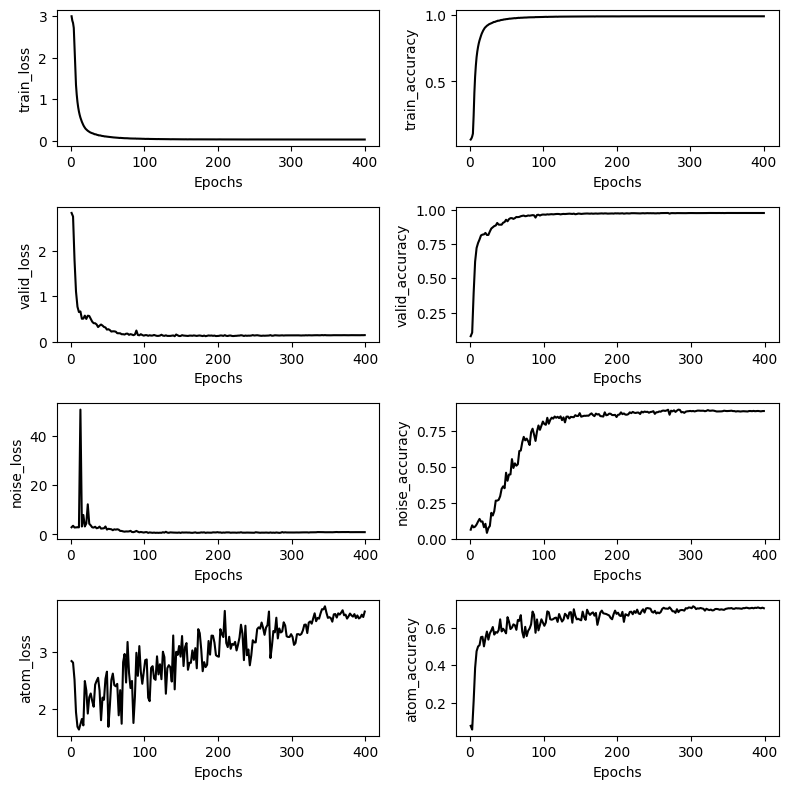

In [2]:
training_specs['ds_size'] = 500000
training_specs['folder_name'] = task_name + '-500k'
model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

### 1 million dataset

In [2]:
training_specs['ds_size'] = 1000000
training_specs['folder_name'] = task_name + '-1m'
model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: yig319 to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199]
Epoch: 1/200


Train: 100%|██████████| 556/556 [12:34<00:00,  1.36s/it]


train_loss: 2.9305, train_accuracy: 6.56%


Valid: 100%|██████████| 139/139 [01:48<00:00,  1.28it/s]


valid_loss: 2.8759, valid_accuracy: 7.91%
Model saved at epoch 0
Saved new best model at epoch 0 with valid dataset


Valid: 100%|██████████| 556/556 [07:23<00:00,  1.25it/s]


noise_loss: 2.8499, noise_accuracy: 5.89%


Valid: 100%|██████████| 556/556 [07:28<00:00,  1.24it/s]


atom_loss: 2.8239, atom_accuracy: 11.26%
Model saved at epoch 1
Epoch: 2/200


Train: 100%|██████████| 556/556 [12:07<00:00,  1.31s/it]


train_loss: 2.7909, train_accuracy: 9.26%


Valid: 100%|██████████| 139/139 [01:52<00:00,  1.24it/s]


valid_loss: 2.6102, valid_accuracy: 15.24%
Model saved at epoch 1
Saved new best model at epoch 1 with valid dataset


Valid: 100%|██████████| 556/556 [07:23<00:00,  1.25it/s]


noise_loss: 3.1855, noise_accuracy: 5.98%


Valid: 100%|██████████| 556/556 [07:23<00:00,  1.25it/s]


atom_loss: 2.7489, atom_accuracy: 11.64%
Model saved at epoch 2
Epoch: 3/200


Train: 100%|██████████| 556/556 [12:08<00:00,  1.31s/it]


train_loss: 2.0129, train_accuracy: 31.78%


Valid: 100%|██████████| 139/139 [01:51<00:00,  1.24it/s]


valid_loss: 1.3562, valid_accuracy: 53.93%
Model saved at epoch 2
Saved new best model at epoch 2 with valid dataset


Valid: 100%|██████████| 556/556 [07:31<00:00,  1.23it/s]


noise_loss: 2.8622, noise_accuracy: 4.71%


Valid: 100%|██████████| 556/556 [07:24<00:00,  1.25it/s]


atom_loss: 2.1012, atom_accuracy: 32.97%
Model saved at epoch 3
Epoch: 4/200


Train: 100%|██████████| 556/556 [12:37<00:00,  1.36s/it]


train_loss: 1.2400, train_accuracy: 57.26%


Valid: 100%|██████████| 139/139 [01:52<00:00,  1.23it/s]


valid_loss: 0.8905, valid_accuracy: 68.63%
Model saved at epoch 3
Saved new best model at epoch 3 with valid dataset


Valid: 100%|██████████| 556/556 [07:22<00:00,  1.26it/s]


noise_loss: 2.8993, noise_accuracy: 10.07%


Valid: 100%|██████████| 556/556 [07:26<00:00,  1.24it/s]


atom_loss: 1.6534, atom_accuracy: 44.09%
Model saved at epoch 4
Epoch: 5/200


Train: 100%|██████████| 556/556 [12:05<00:00,  1.31s/it]


train_loss: 0.8801, train_accuracy: 69.75%


Valid: 100%|██████████| 139/139 [01:51<00:00,  1.25it/s]


valid_loss: 0.6643, valid_accuracy: 75.47%
Model saved at epoch 4
Saved new best model at epoch 4 with valid dataset


Valid: 100%|██████████| 556/556 [07:23<00:00,  1.25it/s]


noise_loss: 2.8028, noise_accuracy: 11.96%


Valid: 100%|██████████| 556/556 [07:27<00:00,  1.24it/s]


atom_loss: 1.5977, atom_accuracy: 48.21%
Model saved at epoch 5
Epoch: 6/200


Train: 100%|██████████| 556/556 [12:13<00:00,  1.32s/it]


train_loss: 0.6801, train_accuracy: 76.56%


Valid: 100%|██████████| 139/139 [01:50<00:00,  1.26it/s]


valid_loss: 0.5375, valid_accuracy: 79.96%
Model saved at epoch 5
Saved new best model at epoch 5 with valid dataset


Valid: 100%|██████████| 556/556 [07:37<00:00,  1.21it/s]


noise_loss: 2.8627, noise_accuracy: 12.96%


Valid: 100%|██████████| 556/556 [07:26<00:00,  1.24it/s]


atom_loss: 1.6252, atom_accuracy: 50.76%
Model saved at epoch 6
Epoch: 7/200


Train: 100%|██████████| 556/556 [12:10<00:00,  1.31s/it]


train_loss: 0.5524, train_accuracy: 81.02%


Valid: 100%|██████████| 139/139 [01:52<00:00,  1.23it/s]


valid_loss: 0.5327, valid_accuracy: 79.81%
Model saved at epoch 6
Saved new best model at epoch 6 with valid dataset


Valid: 100%|██████████| 556/556 [07:26<00:00,  1.25it/s]


noise_loss: 2.9037, noise_accuracy: 12.11%


Valid: 100%|██████████| 556/556 [07:26<00:00,  1.24it/s]


atom_loss: 1.5181, atom_accuracy: 56.61%
Model saved at epoch 7
Epoch: 8/200


Train: 100%|██████████| 556/556 [12:07<00:00,  1.31s/it]


train_loss: 0.4581, train_accuracy: 84.37%


Valid: 100%|██████████| 139/139 [01:53<00:00,  1.22it/s]


valid_loss: 0.4496, valid_accuracy: 84.48%
Model saved at epoch 7
Saved new best model at epoch 7 with valid dataset


Valid: 100%|██████████| 556/556 [07:28<00:00,  1.24it/s]


noise_loss: 3.3023, noise_accuracy: 11.92%


Valid: 100%|██████████| 556/556 [07:32<00:00,  1.23it/s]


atom_loss: 1.2838, atom_accuracy: 61.12%
Model saved at epoch 8
Epoch: 9/200


Train: 100%|██████████| 556/556 [13:56<00:00,  1.50s/it]


train_loss: 0.3844, train_accuracy: 87.03%


Valid: 100%|██████████| 139/139 [02:01<00:00,  1.14it/s]


valid_loss: 0.3531, valid_accuracy: 87.38%
Model saved at epoch 8
Saved new best model at epoch 8 with valid dataset


Valid: 100%|██████████| 556/556 [07:59<00:00,  1.16it/s]


noise_loss: 2.7555, noise_accuracy: 18.06%


Valid: 100%|██████████| 556/556 [07:54<00:00,  1.17it/s]


atom_loss: 1.3539, atom_accuracy: 62.49%
Model saved at epoch 9
Epoch: 10/200


Train: 100%|██████████| 556/556 [13:47<00:00,  1.49s/it]


train_loss: 0.3264, train_accuracy: 89.00%


Valid: 100%|██████████| 139/139 [01:57<00:00,  1.19it/s]


valid_loss: 0.3620, valid_accuracy: 87.51%
Model saved at epoch 9
Saved new best model at epoch 9 with valid dataset


Valid: 100%|██████████| 556/556 [07:50<00:00,  1.18it/s]


noise_loss: 2.7014, noise_accuracy: 21.57%


Valid: 100%|██████████| 556/556 [07:50<00:00,  1.18it/s]


atom_loss: 1.6190, atom_accuracy: 60.21%
Model saved at epoch 10
Epoch: 11/200


Train: 100%|██████████| 556/556 [13:55<00:00,  1.50s/it]


train_loss: 0.2812, train_accuracy: 90.54%


Valid: 100%|██████████| 139/139 [01:59<00:00,  1.17it/s]


valid_loss: 0.3166, valid_accuracy: 89.44%
Model saved at epoch 10
Saved new best model at epoch 10 with valid dataset


Valid: 100%|██████████| 556/556 [07:55<00:00,  1.17it/s]


noise_loss: 3.2501, noise_accuracy: 20.38%


Valid: 100%|██████████| 556/556 [07:59<00:00,  1.16it/s]


atom_loss: 1.4782, atom_accuracy: 61.21%
Model saved at epoch 11
Epoch: 12/200


Train: 100%|██████████| 556/556 [13:58<00:00,  1.51s/it]


train_loss: 0.2455, train_accuracy: 91.78%


Valid: 100%|██████████| 139/139 [02:02<00:00,  1.13it/s]


valid_loss: 0.2782, valid_accuracy: 90.60%
Model saved at epoch 11
Saved new best model at epoch 11 with valid dataset


Valid: 100%|██████████| 556/556 [08:15<00:00,  1.12it/s]


noise_loss: 2.3098, noise_accuracy: 31.25%


Valid: 100%|██████████| 556/556 [08:31<00:00,  1.09it/s]


atom_loss: 1.5149, atom_accuracy: 63.93%
Model saved at epoch 12
Epoch: 13/200


Train: 100%|██████████| 556/556 [14:16<00:00,  1.54s/it]


train_loss: 0.2176, train_accuracy: 92.69%


Valid: 100%|██████████| 139/139 [02:02<00:00,  1.13it/s]


valid_loss: 0.2417, valid_accuracy: 91.67%
Model saved at epoch 12
Saved new best model at epoch 12 with valid dataset


Valid: 100%|██████████| 556/556 [08:14<00:00,  1.12it/s]


noise_loss: 2.1645, noise_accuracy: 33.85%


Valid: 100%|██████████| 556/556 [08:10<00:00,  1.13it/s]


atom_loss: 1.4661, atom_accuracy: 64.87%
Model saved at epoch 13
Epoch: 14/200


Train: 100%|██████████| 556/556 [14:06<00:00,  1.52s/it]


train_loss: 0.1955, train_accuracy: 93.44%


Valid: 100%|██████████| 139/139 [02:02<00:00,  1.14it/s]


valid_loss: 0.2604, valid_accuracy: 91.34%


Valid: 100%|██████████| 556/556 [08:10<00:00,  1.13it/s]


noise_loss: 2.3486, noise_accuracy: 33.02%


Valid: 100%|██████████| 556/556 [08:18<00:00,  1.12it/s]


atom_loss: 1.6333, atom_accuracy: 62.73%
Model saved at epoch 14
Epoch: 15/200


Train: 100%|██████████| 556/556 [14:05<00:00,  1.52s/it]


train_loss: 0.1775, train_accuracy: 94.06%


Valid: 100%|██████████| 139/139 [02:00<00:00,  1.16it/s]


valid_loss: 0.2493, valid_accuracy: 92.08%
Model saved at epoch 14
Saved new best model at epoch 14 with valid dataset


Valid: 100%|██████████| 556/556 [08:06<00:00,  1.14it/s]


noise_loss: 2.1136, noise_accuracy: 38.62%


Valid: 100%|██████████| 556/556 [08:29<00:00,  1.09it/s]


atom_loss: 1.6296, atom_accuracy: 65.42%
Model saved at epoch 15
Epoch: 16/200


Train: 100%|██████████| 556/556 [14:06<00:00,  1.52s/it]


train_loss: 0.1630, train_accuracy: 94.55%


Valid: 100%|██████████| 139/139 [02:01<00:00,  1.14it/s]


valid_loss: 0.2173, valid_accuracy: 92.42%
Model saved at epoch 15
Saved new best model at epoch 15 with valid dataset


Valid: 100%|██████████| 556/556 [07:59<00:00,  1.16it/s]


noise_loss: 1.6790, noise_accuracy: 45.98%


Valid: 100%|██████████| 556/556 [08:00<00:00,  1.16it/s]


atom_loss: 1.2378, atom_accuracy: 70.60%
Model saved at epoch 16
Epoch: 17/200


Train: 100%|██████████| 556/556 [14:01<00:00,  1.51s/it]


train_loss: 0.1482, train_accuracy: 95.07%


Valid: 100%|██████████| 139/139 [02:00<00:00,  1.15it/s]


valid_loss: 0.2853, valid_accuracy: 90.92%


Valid: 100%|██████████| 556/556 [08:00<00:00,  1.16it/s]


noise_loss: 1.7367, noise_accuracy: 46.54%


Valid: 100%|██████████| 556/556 [08:00<00:00,  1.16it/s]


atom_loss: 1.6140, atom_accuracy: 64.52%
Model saved at epoch 17
Epoch: 18/200


Train: 100%|██████████| 556/556 [14:00<00:00,  1.51s/it]


train_loss: 0.1385, train_accuracy: 95.39%


Valid: 100%|██████████| 139/139 [01:59<00:00,  1.16it/s]


valid_loss: 0.2125, valid_accuracy: 92.59%
Model saved at epoch 17
Saved new best model at epoch 17 with valid dataset


Valid: 100%|██████████| 556/556 [08:00<00:00,  1.16it/s]


noise_loss: 2.0420, noise_accuracy: 42.80%


Valid: 100%|██████████| 556/556 [07:57<00:00,  1.16it/s]


atom_loss: 1.2501, atom_accuracy: 69.10%
Model saved at epoch 18
Epoch: 19/200


Train: 100%|██████████| 556/556 [14:01<00:00,  1.51s/it]


train_loss: 0.1291, train_accuracy: 95.73%


Valid: 100%|██████████| 139/139 [01:59<00:00,  1.17it/s]


valid_loss: 0.1726, valid_accuracy: 94.25%
Model saved at epoch 18
Saved new best model at epoch 18 with valid dataset


Valid: 100%|██████████| 556/556 [07:55<00:00,  1.17it/s]


noise_loss: 1.6740, noise_accuracy: 49.27%


Valid: 100%|██████████| 556/556 [08:01<00:00,  1.16it/s]


atom_loss: 1.1464, atom_accuracy: 74.53%
Model saved at epoch 19
Epoch: 20/200


Train: 100%|██████████| 556/556 [13:56<00:00,  1.50s/it]


train_loss: 0.1211, train_accuracy: 96.01%


Valid: 100%|██████████| 139/139 [01:59<00:00,  1.16it/s]


valid_loss: 0.1694, valid_accuracy: 94.71%
Model saved at epoch 19
Saved new best model at epoch 19 with valid dataset


Valid: 100%|██████████| 556/556 [07:56<00:00,  1.17it/s]


noise_loss: 1.2660, noise_accuracy: 59.74%


Valid: 100%|██████████| 556/556 [07:55<00:00,  1.17it/s]


atom_loss: 1.4012, atom_accuracy: 71.42%
Model saved at epoch 20
Epoch: 21/200


Train: 100%|██████████| 556/556 [13:57<00:00,  1.51s/it]


train_loss: 0.1139, train_accuracy: 96.26%


Valid: 100%|██████████| 139/139 [02:01<00:00,  1.15it/s]


valid_loss: 0.1646, valid_accuracy: 94.89%
Model saved at epoch 20
Saved new best model at epoch 20 with valid dataset


Valid: 100%|██████████| 556/556 [08:02<00:00,  1.15it/s]


noise_loss: 1.6677, noise_accuracy: 53.17%


Valid: 100%|██████████| 556/556 [07:59<00:00,  1.16it/s]


atom_loss: 1.9037, atom_accuracy: 65.51%
Model saved at epoch 21
Epoch: 22/200


Train: 100%|██████████| 556/556 [13:59<00:00,  1.51s/it]


train_loss: 0.1066, train_accuracy: 96.53%


Valid: 100%|██████████| 139/139 [01:58<00:00,  1.17it/s]


valid_loss: 0.1533, valid_accuracy: 95.28%
Model saved at epoch 21
Saved new best model at epoch 21 with valid dataset


Valid: 100%|██████████| 556/556 [07:56<00:00,  1.17it/s]


noise_loss: 1.2425, noise_accuracy: 63.28%


Valid: 100%|██████████| 556/556 [08:00<00:00,  1.16it/s]


atom_loss: 1.6686, atom_accuracy: 68.84%
Model saved at epoch 22
Epoch: 23/200


Train: 100%|██████████| 556/556 [14:00<00:00,  1.51s/it]


train_loss: 0.0996, train_accuracy: 96.79%


Valid: 100%|██████████| 139/139 [01:59<00:00,  1.16it/s]


valid_loss: 0.1406, valid_accuracy: 95.57%
Model saved at epoch 22
Saved new best model at epoch 22 with valid dataset


Valid: 100%|██████████| 556/556 [07:59<00:00,  1.16it/s]


noise_loss: 1.2002, noise_accuracy: 63.67%


Valid: 100%|██████████| 556/556 [07:57<00:00,  1.16it/s]


atom_loss: 1.4129, atom_accuracy: 70.06%
Model saved at epoch 23
Epoch: 24/200


Train: 100%|██████████| 556/556 [14:02<00:00,  1.52s/it]


train_loss: 0.0956, train_accuracy: 96.90%


Valid: 100%|██████████| 139/139 [02:01<00:00,  1.15it/s]


valid_loss: 0.1298, valid_accuracy: 95.86%
Model saved at epoch 23
Saved new best model at epoch 23 with valid dataset


Valid: 100%|██████████| 556/556 [08:14<00:00,  1.12it/s]


noise_loss: 0.9558, noise_accuracy: 70.27%


Valid: 100%|██████████| 556/556 [08:17<00:00,  1.12it/s]


atom_loss: 1.4218, atom_accuracy: 72.27%
Model saved at epoch 24
Epoch: 25/200


Train: 100%|██████████| 556/556 [14:01<00:00,  1.51s/it]


train_loss: 0.0912, train_accuracy: 97.03%


Valid: 100%|██████████| 139/139 [01:59<00:00,  1.17it/s]


valid_loss: 0.1218, valid_accuracy: 96.10%
Model saved at epoch 24
Saved new best model at epoch 24 with valid dataset


Valid: 100%|██████████| 556/556 [08:05<00:00,  1.15it/s]


noise_loss: 0.9939, noise_accuracy: 68.54%


Valid: 100%|██████████| 556/556 [08:04<00:00,  1.15it/s]


atom_loss: 1.5207, atom_accuracy: 69.70%
Model saved at epoch 25
Epoch: 26/200


Train: 100%|██████████| 556/556 [14:05<00:00,  1.52s/it]


train_loss: 0.0875, train_accuracy: 97.16%


Valid: 100%|██████████| 139/139 [02:00<00:00,  1.15it/s]


valid_loss: 0.1342, valid_accuracy: 95.81%


Valid: 100%|██████████| 556/556 [08:02<00:00,  1.15it/s]


noise_loss: 1.0059, noise_accuracy: 69.44%


Valid: 100%|██████████| 556/556 [08:03<00:00,  1.15it/s]


atom_loss: 1.4241, atom_accuracy: 70.92%
Model saved at epoch 26
Epoch: 27/200


Train: 100%|██████████| 556/556 [14:09<00:00,  1.53s/it]


train_loss: 0.0850, train_accuracy: 97.25%


Valid: 100%|██████████| 139/139 [02:03<00:00,  1.13it/s]


valid_loss: 0.1269, valid_accuracy: 95.95%


Valid: 100%|██████████| 556/556 [08:17<00:00,  1.12it/s]


noise_loss: 0.8747, noise_accuracy: 71.49%


Valid: 100%|██████████| 556/556 [08:21<00:00,  1.11it/s]


atom_loss: 1.7359, atom_accuracy: 69.11%
Model saved at epoch 27
Epoch: 28/200


Train: 100%|██████████| 556/556 [14:28<00:00,  1.56s/it]


train_loss: 0.0807, train_accuracy: 97.39%


Valid: 100%|██████████| 139/139 [02:06<00:00,  1.10it/s]


valid_loss: 0.1291, valid_accuracy: 96.05%


Valid: 100%|██████████| 556/556 [08:22<00:00,  1.11it/s]


noise_loss: 0.9240, noise_accuracy: 71.96%


Valid: 100%|██████████| 556/556 [08:24<00:00,  1.10it/s]


atom_loss: 1.6697, atom_accuracy: 70.27%
Model saved at epoch 28
Epoch: 29/200


Train: 100%|██████████| 556/556 [14:35<00:00,  1.57s/it]


train_loss: 0.0785, train_accuracy: 97.43%


Valid: 100%|██████████| 139/139 [02:10<00:00,  1.07it/s]


valid_loss: 0.1346, valid_accuracy: 95.68%


Valid: 100%|██████████| 556/556 [08:36<00:00,  1.08it/s]


noise_loss: 1.0518, noise_accuracy: 70.15%


Valid: 100%|██████████| 556/556 [08:39<00:00,  1.07it/s]


atom_loss: 1.5978, atom_accuracy: 72.49%
Model saved at epoch 29
Epoch: 30/200


Train: 100%|██████████| 556/556 [14:48<00:00,  1.60s/it]


train_loss: 0.0756, train_accuracy: 97.52%


Valid: 100%|██████████| 139/139 [02:09<00:00,  1.08it/s]


valid_loss: 0.1138, valid_accuracy: 96.31%
Model saved at epoch 29
Saved new best model at epoch 29 with valid dataset


Valid: 100%|██████████| 556/556 [08:25<00:00,  1.10it/s]


noise_loss: 0.8448, noise_accuracy: 75.46%


Valid: 100%|██████████| 556/556 [08:20<00:00,  1.11it/s]


atom_loss: 1.8064, atom_accuracy: 68.13%
Model saved at epoch 30
Epoch: 31/200


Train: 100%|██████████| 556/556 [14:08<00:00,  1.53s/it]


train_loss: 0.0750, train_accuracy: 97.54%


Valid: 100%|██████████| 139/139 [02:00<00:00,  1.15it/s]


valid_loss: 0.1017, valid_accuracy: 96.69%
Model saved at epoch 30
Saved new best model at epoch 30 with valid dataset


Valid: 100%|██████████| 556/556 [07:59<00:00,  1.16it/s]


noise_loss: 0.6332, noise_accuracy: 80.80%


Valid: 100%|██████████| 556/556 [08:03<00:00,  1.15it/s]


atom_loss: 1.8329, atom_accuracy: 67.30%
Model saved at epoch 31
Epoch: 32/200


Train: 100%|██████████| 556/556 [14:01<00:00,  1.51s/it]


train_loss: 0.0733, train_accuracy: 97.60%


Valid: 100%|██████████| 139/139 [01:59<00:00,  1.16it/s]


valid_loss: 0.1048, valid_accuracy: 96.56%


Valid: 100%|██████████| 556/556 [07:56<00:00,  1.17it/s]


noise_loss: 0.6922, noise_accuracy: 79.18%


Valid: 100%|██████████| 556/556 [08:02<00:00,  1.15it/s]


atom_loss: 1.1764, atom_accuracy: 73.78%
Model saved at epoch 32
Epoch: 33/200


Train: 100%|██████████| 556/556 [14:01<00:00,  1.51s/it]


train_loss: 0.0695, train_accuracy: 97.71%


Valid: 100%|██████████| 139/139 [02:01<00:00,  1.15it/s]


valid_loss: 0.1037, valid_accuracy: 96.68%


Valid: 100%|██████████| 556/556 [08:02<00:00,  1.15it/s]


noise_loss: 0.6797, noise_accuracy: 79.90%


Valid: 100%|██████████| 556/556 [08:03<00:00,  1.15it/s]


atom_loss: 1.7077, atom_accuracy: 68.04%
Model saved at epoch 33
Epoch: 34/200


Train: 100%|██████████| 556/556 [13:59<00:00,  1.51s/it]


train_loss: 0.0685, train_accuracy: 97.73%


Valid: 100%|██████████| 139/139 [02:01<00:00,  1.14it/s]


valid_loss: 0.1003, valid_accuracy: 96.82%
Model saved at epoch 33
Saved new best model at epoch 33 with valid dataset


Valid: 100%|██████████| 556/556 [08:01<00:00,  1.16it/s]


noise_loss: 0.4386, noise_accuracy: 86.32%


Valid: 100%|██████████| 556/556 [08:02<00:00,  1.15it/s]


atom_loss: 1.9342, atom_accuracy: 69.24%
Model saved at epoch 34
Epoch: 35/200


Train: 100%|██████████| 556/556 [14:01<00:00,  1.51s/it]


train_loss: 0.0675, train_accuracy: 97.77%


Valid: 100%|██████████| 139/139 [02:00<00:00,  1.15it/s]


valid_loss: 0.0987, valid_accuracy: 96.89%
Model saved at epoch 34
Saved new best model at epoch 34 with valid dataset


Valid: 100%|██████████| 556/556 [08:02<00:00,  1.15it/s]


noise_loss: 0.5566, noise_accuracy: 84.45%


Valid: 100%|██████████| 556/556 [07:59<00:00,  1.16it/s]


atom_loss: 1.6316, atom_accuracy: 68.71%
Model saved at epoch 35
Epoch: 36/200


Train: 100%|██████████| 556/556 [14:03<00:00,  1.52s/it]


train_loss: 0.0656, train_accuracy: 97.83%


Valid: 100%|██████████| 139/139 [02:01<00:00,  1.15it/s]


valid_loss: 0.0970, valid_accuracy: 96.78%
Model saved at epoch 35
Saved new best model at epoch 35 with valid dataset


Valid: 100%|██████████| 556/556 [08:04<00:00,  1.15it/s]


noise_loss: 0.6346, noise_accuracy: 80.62%


Valid: 100%|██████████| 556/556 [08:03<00:00,  1.15it/s]


atom_loss: 1.7931, atom_accuracy: 70.24%
Model saved at epoch 36
Epoch: 37/200


Train: 100%|██████████| 556/556 [13:57<00:00,  1.51s/it]


train_loss: 0.0639, train_accuracy: 97.87%


Valid: 100%|██████████| 139/139 [02:00<00:00,  1.15it/s]


valid_loss: 0.0993, valid_accuracy: 96.94%
Model saved at epoch 36
Saved new best model at epoch 36 with valid dataset


Valid: 100%|██████████| 556/556 [07:47<00:00,  1.19it/s]


noise_loss: 0.4747, noise_accuracy: 85.39%


Valid: 100%|██████████| 556/556 [07:33<00:00,  1.23it/s]


atom_loss: 2.0616, atom_accuracy: 68.27%
Model saved at epoch 37
Epoch: 38/200


Train: 100%|██████████| 556/556 [11:55<00:00,  1.29s/it]


train_loss: 0.0620, train_accuracy: 97.94%


Valid: 100%|██████████| 139/139 [01:51<00:00,  1.25it/s]


valid_loss: 0.0858, valid_accuracy: 97.31%
Model saved at epoch 37
Saved new best model at epoch 37 with valid dataset


Valid: 100%|██████████| 556/556 [07:22<00:00,  1.26it/s]


noise_loss: 0.4901, noise_accuracy: 86.47%


Valid: 100%|██████████| 556/556 [07:23<00:00,  1.25it/s]


atom_loss: 1.6828, atom_accuracy: 73.62%
Model saved at epoch 38
Epoch: 39/200


Train: 100%|██████████| 556/556 [12:05<00:00,  1.30s/it]


train_loss: 0.0611, train_accuracy: 97.95%


Valid: 100%|██████████| 139/139 [01:50<00:00,  1.26it/s]


valid_loss: 0.0873, valid_accuracy: 97.18%


Valid: 100%|██████████| 556/556 [07:19<00:00,  1.26it/s]


noise_loss: 0.5256, noise_accuracy: 84.18%


Valid: 100%|██████████| 556/556 [07:29<00:00,  1.24it/s]


atom_loss: 1.4995, atom_accuracy: 74.68%
Model saved at epoch 39
Epoch: 40/200


Train: 100%|██████████| 556/556 [12:06<00:00,  1.31s/it]


train_loss: 0.0596, train_accuracy: 98.01%


Valid: 100%|██████████| 139/139 [01:50<00:00,  1.25it/s]


valid_loss: 0.0832, valid_accuracy: 97.37%
Model saved at epoch 39
Saved new best model at epoch 39 with valid dataset


Valid: 100%|██████████| 556/556 [07:44<00:00,  1.20it/s]


noise_loss: 0.3583, noise_accuracy: 89.02%


Valid: 100%|██████████| 556/556 [07:28<00:00,  1.24it/s]


atom_loss: 1.8218, atom_accuracy: 71.15%
Model saved at epoch 40
Epoch: 41/200


Train: 100%|██████████| 556/556 [12:05<00:00,  1.30s/it]


train_loss: 0.0576, train_accuracy: 98.08%


Valid: 100%|██████████| 139/139 [01:54<00:00,  1.22it/s]


valid_loss: 0.0918, valid_accuracy: 97.26%


Valid: 100%|██████████| 556/556 [07:41<00:00,  1.21it/s]


noise_loss: 0.4031, noise_accuracy: 88.10%


Valid: 100%|██████████| 556/556 [07:29<00:00,  1.24it/s]


atom_loss: 1.6810, atom_accuracy: 72.95%
Model saved at epoch 41
Epoch: 42/200


Train: 100%|██████████| 556/556 [12:07<00:00,  1.31s/it]


train_loss: 0.0573, train_accuracy: 98.08%


Valid: 100%|██████████| 139/139 [01:54<00:00,  1.22it/s]


valid_loss: 0.0892, valid_accuracy: 97.31%


Valid: 100%|██████████| 556/556 [07:46<00:00,  1.19it/s]


noise_loss: 0.3868, noise_accuracy: 88.87%


Valid: 100%|██████████| 556/556 [07:49<00:00,  1.18it/s]


atom_loss: 1.8667, atom_accuracy: 71.62%
Model saved at epoch 42
Epoch: 43/200


Train: 100%|██████████| 556/556 [12:45<00:00,  1.38s/it]


train_loss: 0.0559, train_accuracy: 98.13%


Valid: 100%|██████████| 139/139 [01:59<00:00,  1.16it/s]


valid_loss: 0.0843, valid_accuracy: 97.41%
Model saved at epoch 42
Saved new best model at epoch 42 with valid dataset


Valid: 100%|██████████| 556/556 [07:57<00:00,  1.17it/s]


noise_loss: 0.3941, noise_accuracy: 88.80%


Valid: 100%|██████████| 556/556 [07:54<00:00,  1.17it/s]


atom_loss: 1.6479, atom_accuracy: 73.08%
Model saved at epoch 43
Epoch: 44/200


Train: 100%|██████████| 556/556 [12:48<00:00,  1.38s/it]


train_loss: 0.0544, train_accuracy: 98.16%


Valid: 100%|██████████| 139/139 [01:57<00:00,  1.18it/s]


valid_loss: 0.0879, valid_accuracy: 97.27%


Valid: 100%|██████████| 556/556 [07:41<00:00,  1.20it/s]


noise_loss: 0.4061, noise_accuracy: 88.20%


Valid: 100%|██████████| 556/556 [07:56<00:00,  1.17it/s]


atom_loss: 1.9836, atom_accuracy: 70.95%
Model saved at epoch 44
Epoch: 45/200


Train: 100%|██████████| 556/556 [11:55<00:00,  1.29s/it]


train_loss: 0.0537, train_accuracy: 98.19%


Valid: 100%|██████████| 139/139 [01:50<00:00,  1.26it/s]


valid_loss: 0.0785, valid_accuracy: 97.56%
Model saved at epoch 44
Saved new best model at epoch 44 with valid dataset


Valid: 100%|██████████| 556/556 [07:25<00:00,  1.25it/s]


noise_loss: 0.3401, noise_accuracy: 89.72%


Valid: 100%|██████████| 556/556 [07:32<00:00,  1.23it/s]


atom_loss: 1.9454, atom_accuracy: 71.59%
Model saved at epoch 45
Epoch: 46/200


Train: 100%|██████████| 556/556 [12:09<00:00,  1.31s/it]


train_loss: 0.0520, train_accuracy: 98.24%


Valid: 100%|██████████| 139/139 [01:58<00:00,  1.18it/s]


valid_loss: 0.0803, valid_accuracy: 97.54%


Valid: 100%|██████████| 556/556 [07:32<00:00,  1.23it/s]


noise_loss: 0.3590, noise_accuracy: 89.50%


Valid: 100%|██████████| 556/556 [07:25<00:00,  1.25it/s]


atom_loss: 1.7854, atom_accuracy: 71.59%
Model saved at epoch 46
Epoch: 47/200


Train: 100%|██████████| 556/556 [12:19<00:00,  1.33s/it]


train_loss: 0.0526, train_accuracy: 98.22%


Valid: 100%|██████████| 139/139 [01:57<00:00,  1.18it/s]


valid_loss: 0.0757, valid_accuracy: 97.64%
Model saved at epoch 46
Saved new best model at epoch 46 with valid dataset


Valid: 100%|██████████| 556/556 [07:43<00:00,  1.20it/s]


noise_loss: 0.3606, noise_accuracy: 89.62%


Valid: 100%|██████████| 556/556 [07:45<00:00,  1.20it/s]


atom_loss: 1.8457, atom_accuracy: 73.88%
Model saved at epoch 47
Epoch: 48/200


Train: 100%|██████████| 556/556 [12:34<00:00,  1.36s/it]


train_loss: 0.0503, train_accuracy: 98.29%


Valid: 100%|██████████| 139/139 [01:58<00:00,  1.17it/s]


valid_loss: 0.0787, valid_accuracy: 97.60%


Valid: 100%|██████████| 556/556 [07:46<00:00,  1.19it/s]


noise_loss: 0.4365, noise_accuracy: 88.23%


Valid: 100%|██████████| 556/556 [07:49<00:00,  1.19it/s]


atom_loss: 2.1677, atom_accuracy: 70.49%
Model saved at epoch 48
Epoch: 49/200


Train: 100%|██████████| 556/556 [12:37<00:00,  1.36s/it]


train_loss: 0.0496, train_accuracy: 98.32%


Valid: 100%|██████████| 139/139 [01:56<00:00,  1.19it/s]


valid_loss: 0.0797, valid_accuracy: 97.57%


Valid: 100%|██████████| 556/556 [07:40<00:00,  1.21it/s]


noise_loss: 0.3794, noise_accuracy: 89.96%


Valid: 100%|██████████| 556/556 [07:42<00:00,  1.20it/s]


atom_loss: 1.8414, atom_accuracy: 73.08%
Model saved at epoch 49
Epoch: 50/200


Train: 100%|██████████| 556/556 [12:25<00:00,  1.34s/it]


train_loss: 0.0500, train_accuracy: 98.30%


Valid: 100%|██████████| 139/139 [01:57<00:00,  1.19it/s]


valid_loss: 0.0805, valid_accuracy: 97.59%


Valid: 100%|██████████| 556/556 [07:43<00:00,  1.20it/s]


noise_loss: 0.3432, noise_accuracy: 90.28%


Valid: 100%|██████████| 556/556 [07:41<00:00,  1.20it/s]


atom_loss: 2.1273, atom_accuracy: 70.74%
Model saved at epoch 50
Epoch: 51/200


Train: 100%|██████████| 556/556 [12:28<00:00,  1.35s/it]


train_loss: 0.0480, train_accuracy: 98.36%


Valid: 100%|██████████| 139/139 [01:58<00:00,  1.17it/s]


valid_loss: 0.0737, valid_accuracy: 97.73%
Model saved at epoch 50
Saved new best model at epoch 50 with valid dataset


Valid: 100%|██████████| 556/556 [07:30<00:00,  1.24it/s]


noise_loss: 0.3692, noise_accuracy: 89.93%


Valid: 100%|██████████| 556/556 [07:27<00:00,  1.24it/s]


atom_loss: 2.0718, atom_accuracy: 72.43%
Model saved at epoch 51
Epoch: 52/200


Train: 100%|██████████| 556/556 [12:02<00:00,  1.30s/it]


train_loss: 0.0472, train_accuracy: 98.39%


Valid: 100%|██████████| 139/139 [01:52<00:00,  1.24it/s]


valid_loss: 0.0814, valid_accuracy: 97.55%


Valid: 100%|██████████| 556/556 [07:28<00:00,  1.24it/s]


noise_loss: 0.4202, noise_accuracy: 89.20%


Valid: 100%|██████████| 556/556 [07:25<00:00,  1.25it/s]


atom_loss: 1.8624, atom_accuracy: 72.88%
Model saved at epoch 52
Epoch: 53/200


Train: 100%|██████████| 556/556 [12:10<00:00,  1.31s/it]


train_loss: 0.0473, train_accuracy: 98.38%


Valid: 100%|██████████| 139/139 [01:52<00:00,  1.23it/s]


valid_loss: 0.0734, valid_accuracy: 97.76%
Model saved at epoch 52
Saved new best model at epoch 52 with valid dataset


Valid: 100%|██████████| 556/556 [07:24<00:00,  1.25it/s]


noise_loss: 0.3523, noise_accuracy: 90.33%


Valid: 100%|██████████| 556/556 [07:31<00:00,  1.23it/s]


atom_loss: 1.9020, atom_accuracy: 73.05%
Model saved at epoch 53
Epoch: 54/200


Train: 100%|██████████| 556/556 [12:10<00:00,  1.31s/it]


train_loss: 0.0458, train_accuracy: 98.42%


Valid: 100%|██████████| 139/139 [01:52<00:00,  1.23it/s]


valid_loss: 0.0860, valid_accuracy: 97.41%


Valid: 100%|██████████| 556/556 [07:26<00:00,  1.24it/s]


noise_loss: 0.4889, noise_accuracy: 88.48%


Valid: 100%|██████████| 556/556 [07:27<00:00,  1.24it/s]


atom_loss: 1.7695, atom_accuracy: 74.42%
Model saved at epoch 54
Epoch: 55/200


Train: 100%|██████████| 556/556 [12:09<00:00,  1.31s/it]


train_loss: 0.0459, train_accuracy: 98.43%


Valid: 100%|██████████| 139/139 [01:52<00:00,  1.23it/s]


valid_loss: 0.0768, valid_accuracy: 97.70%


Valid: 100%|██████████| 556/556 [07:26<00:00,  1.24it/s]


noise_loss: 0.3868, noise_accuracy: 89.92%


Valid: 100%|██████████| 556/556 [07:28<00:00,  1.24it/s]


atom_loss: 1.7137, atom_accuracy: 74.17%
Model saved at epoch 55
Epoch: 56/200


Train: 100%|██████████| 556/556 [12:34<00:00,  1.36s/it]


train_loss: 0.0451, train_accuracy: 98.45%


Valid: 100%|██████████| 139/139 [01:50<00:00,  1.26it/s]


valid_loss: 0.0842, valid_accuracy: 97.59%


Valid: 100%|██████████| 556/556 [07:13<00:00,  1.28it/s]


noise_loss: 0.4311, noise_accuracy: 89.41%


Valid: 100%|██████████| 556/556 [07:19<00:00,  1.27it/s]


atom_loss: 1.4725, atom_accuracy: 76.13%
Model saved at epoch 56
Epoch: 57/200


Train: 100%|██████████| 556/556 [12:01<00:00,  1.30s/it]


train_loss: 0.0451, train_accuracy: 98.45%


Valid: 100%|██████████| 139/139 [01:51<00:00,  1.25it/s]


valid_loss: 0.0761, valid_accuracy: 97.71%


Valid: 100%|██████████| 556/556 [07:21<00:00,  1.26it/s]


noise_loss: 0.4025, noise_accuracy: 89.79%


Valid: 100%|██████████| 556/556 [07:22<00:00,  1.26it/s]


atom_loss: 1.6561, atom_accuracy: 75.23%
Model saved at epoch 57
Epoch: 58/200


Train: 100%|██████████| 556/556 [12:01<00:00,  1.30s/it]


train_loss: 0.0441, train_accuracy: 98.48%


Valid: 100%|██████████| 139/139 [01:50<00:00,  1.26it/s]


valid_loss: 0.0774, valid_accuracy: 97.75%


Valid: 100%|██████████| 556/556 [07:49<00:00,  1.18it/s]


noise_loss: 0.3239, noise_accuracy: 91.73%


Valid: 100%|██████████| 556/556 [08:19<00:00,  1.11it/s]


atom_loss: 1.8699, atom_accuracy: 74.52%
Model saved at epoch 58
Epoch: 59/200


Train: 100%|██████████| 556/556 [12:24<00:00,  1.34s/it]


train_loss: 0.0436, train_accuracy: 98.50%


Valid: 100%|██████████| 139/139 [01:51<00:00,  1.24it/s]


valid_loss: 0.0702, valid_accuracy: 97.88%
Model saved at epoch 58
Saved new best model at epoch 58 with valid dataset


Valid: 100%|██████████| 556/556 [07:49<00:00,  1.18it/s]


noise_loss: 0.3047, noise_accuracy: 91.86%


Valid: 100%|██████████| 556/556 [07:40<00:00,  1.21it/s]


atom_loss: 1.8181, atom_accuracy: 74.16%
Model saved at epoch 59
Epoch: 60/200


Train: 100%|██████████| 556/556 [12:10<00:00,  1.31s/it]


train_loss: 0.0429, train_accuracy: 98.52%


Valid: 100%|██████████| 139/139 [01:57<00:00,  1.19it/s]


valid_loss: 0.0756, valid_accuracy: 97.68%


Valid: 100%|██████████| 556/556 [07:53<00:00,  1.17it/s]


noise_loss: 0.2805, noise_accuracy: 92.60%


Valid: 100%|██████████| 556/556 [07:47<00:00,  1.19it/s]


atom_loss: 2.1341, atom_accuracy: 71.39%
Model saved at epoch 60
Epoch: 61/200


Train: 100%|██████████| 556/556 [12:24<00:00,  1.34s/it]


train_loss: 0.0429, train_accuracy: 98.52%


Valid: 100%|██████████| 139/139 [01:57<00:00,  1.19it/s]


valid_loss: 0.0794, valid_accuracy: 97.74%


Valid: 100%|██████████| 556/556 [07:51<00:00,  1.18it/s]


noise_loss: 0.3828, noise_accuracy: 91.10%


Valid: 100%|██████████| 556/556 [07:46<00:00,  1.19it/s]


atom_loss: 2.1959, atom_accuracy: 71.88%
Model saved at epoch 61
Epoch: 62/200


Train: 100%|██████████| 556/556 [12:12<00:00,  1.32s/it]


train_loss: 0.0421, train_accuracy: 98.55%


Valid: 100%|██████████| 139/139 [01:49<00:00,  1.27it/s]


valid_loss: 0.0711, valid_accuracy: 97.82%


Valid: 100%|██████████| 556/556 [07:24<00:00,  1.25it/s]


noise_loss: 0.3239, noise_accuracy: 91.63%


Valid: 100%|██████████| 556/556 [07:25<00:00,  1.25it/s]


atom_loss: 1.7098, atom_accuracy: 75.78%
Model saved at epoch 62
Epoch: 63/200


Train: 100%|██████████| 556/556 [12:03<00:00,  1.30s/it]


train_loss: 0.0415, train_accuracy: 98.57%


Valid: 100%|██████████| 139/139 [01:51<00:00,  1.24it/s]


valid_loss: 0.0698, valid_accuracy: 97.89%
Model saved at epoch 62
Saved new best model at epoch 62 with valid dataset


Valid: 100%|██████████| 556/556 [07:26<00:00,  1.24it/s]


noise_loss: 0.3650, noise_accuracy: 91.18%


Valid: 100%|██████████| 556/556 [07:37<00:00,  1.21it/s]


atom_loss: 2.2032, atom_accuracy: 70.35%
Model saved at epoch 63
Epoch: 64/200


Train: 100%|██████████| 556/556 [12:21<00:00,  1.33s/it]


train_loss: 0.0413, train_accuracy: 98.57%


Valid: 100%|██████████| 139/139 [01:52<00:00,  1.24it/s]


valid_loss: 0.0714, valid_accuracy: 97.87%


Valid: 100%|██████████| 556/556 [07:19<00:00,  1.27it/s]


noise_loss: 0.4540, noise_accuracy: 90.57%


Valid: 100%|██████████| 556/556 [07:20<00:00,  1.26it/s]


atom_loss: 1.9039, atom_accuracy: 72.60%
Model saved at epoch 64
Epoch: 65/200


Train: 100%|██████████| 556/556 [12:20<00:00,  1.33s/it]


train_loss: 0.0412, train_accuracy: 98.58%


Valid: 100%|██████████| 139/139 [01:52<00:00,  1.24it/s]


valid_loss: 0.0757, valid_accuracy: 97.83%


Valid: 100%|██████████| 556/556 [07:27<00:00,  1.24it/s]


noise_loss: 0.5238, noise_accuracy: 89.69%


Valid: 100%|██████████| 556/556 [07:17<00:00,  1.27it/s]


atom_loss: 1.4881, atom_accuracy: 76.04%
Model saved at epoch 65
Epoch: 66/200


Train: 100%|██████████| 556/556 [11:58<00:00,  1.29s/it]


train_loss: 0.0404, train_accuracy: 98.61%


Valid: 100%|██████████| 139/139 [01:50<00:00,  1.25it/s]


valid_loss: 0.0726, valid_accuracy: 97.84%


Valid: 100%|██████████| 556/556 [07:22<00:00,  1.26it/s]


noise_loss: 0.4461, noise_accuracy: 90.79%


Valid: 100%|██████████| 556/556 [07:30<00:00,  1.23it/s]


atom_loss: 1.6003, atom_accuracy: 74.78%
Model saved at epoch 66
Epoch: 67/200


Train: 100%|██████████| 556/556 [12:11<00:00,  1.31s/it]


train_loss: 0.0400, train_accuracy: 98.62%


Valid: 100%|██████████| 139/139 [01:52<00:00,  1.23it/s]


valid_loss: 0.0783, valid_accuracy: 97.79%


Valid: 100%|██████████| 556/556 [07:30<00:00,  1.23it/s]


noise_loss: 0.3637, noise_accuracy: 91.70%


Valid: 100%|██████████| 556/556 [07:34<00:00,  1.22it/s]


atom_loss: 2.2175, atom_accuracy: 72.07%
Model saved at epoch 67
Epoch: 68/200


Train: 100%|██████████| 556/556 [12:25<00:00,  1.34s/it]


train_loss: 0.0397, train_accuracy: 98.62%


Valid: 100%|██████████| 139/139 [01:54<00:00,  1.22it/s]


valid_loss: 0.0826, valid_accuracy: 97.49%


Valid: 100%|██████████| 556/556 [07:27<00:00,  1.24it/s]


noise_loss: 0.3426, noise_accuracy: 92.04%


Valid: 100%|██████████| 556/556 [07:31<00:00,  1.23it/s]


atom_loss: 2.5732, atom_accuracy: 69.21%
Model saved at epoch 68
Epoch: 69/200


Train: 100%|██████████| 556/556 [12:17<00:00,  1.33s/it]


train_loss: 0.0394, train_accuracy: 98.63%


Valid: 100%|██████████| 139/139 [01:55<00:00,  1.21it/s]


valid_loss: 0.0757, valid_accuracy: 97.86%


Valid: 100%|██████████| 556/556 [07:34<00:00,  1.22it/s]


noise_loss: 0.3502, noise_accuracy: 92.14%


Valid: 100%|██████████| 556/556 [07:33<00:00,  1.23it/s]


atom_loss: 2.0375, atom_accuracy: 71.93%
Model saved at epoch 69
Epoch: 70/200


Train: 100%|██████████| 556/556 [12:19<00:00,  1.33s/it]


train_loss: 0.0393, train_accuracy: 98.64%


Valid: 100%|██████████| 139/139 [01:52<00:00,  1.23it/s]


valid_loss: 0.0749, valid_accuracy: 97.90%
Model saved at epoch 69
Saved new best model at epoch 69 with valid dataset


Valid: 100%|██████████| 556/556 [07:27<00:00,  1.24it/s]


noise_loss: 0.2833, noise_accuracy: 93.04%


Valid: 100%|██████████| 556/556 [07:30<00:00,  1.23it/s]


atom_loss: 2.4376, atom_accuracy: 71.92%
Model saved at epoch 70
Epoch: 71/200


Train: 100%|██████████| 556/556 [12:14<00:00,  1.32s/it]


train_loss: 0.0389, train_accuracy: 98.64%


Valid: 100%|██████████| 139/139 [01:50<00:00,  1.25it/s]


valid_loss: 0.0782, valid_accuracy: 97.84%


Valid: 100%|██████████| 556/556 [07:25<00:00,  1.25it/s]


noise_loss: 0.3189, noise_accuracy: 92.25%


Valid: 100%|██████████| 556/556 [07:31<00:00,  1.23it/s]


atom_loss: 2.0295, atom_accuracy: 74.32%
Model saved at epoch 71
Epoch: 72/200


Train: 100%|██████████| 556/556 [12:21<00:00,  1.33s/it]


train_loss: 0.0389, train_accuracy: 98.65%


Valid: 100%|██████████| 139/139 [01:57<00:00,  1.19it/s]


valid_loss: 0.0801, valid_accuracy: 97.84%


Valid: 100%|██████████| 556/556 [07:31<00:00,  1.23it/s]


noise_loss: 0.3540, noise_accuracy: 92.25%


Valid: 100%|██████████| 556/556 [07:32<00:00,  1.23it/s]


atom_loss: 2.5331, atom_accuracy: 73.07%
Model saved at epoch 72
Epoch: 73/200


Train: 100%|██████████| 556/556 [12:19<00:00,  1.33s/it]


train_loss: 0.0383, train_accuracy: 98.67%


Valid: 100%|██████████| 139/139 [01:56<00:00,  1.19it/s]


valid_loss: 0.0782, valid_accuracy: 97.88%


Valid: 100%|██████████| 556/556 [07:27<00:00,  1.24it/s]


noise_loss: 0.3063, noise_accuracy: 92.88%


Valid: 100%|██████████| 556/556 [07:46<00:00,  1.19it/s]


atom_loss: 2.3082, atom_accuracy: 71.42%
Model saved at epoch 73
Epoch: 74/200


Train: 100%|██████████| 556/556 [12:41<00:00,  1.37s/it]


train_loss: 0.0381, train_accuracy: 98.68%


Valid: 100%|██████████| 139/139 [01:57<00:00,  1.18it/s]


valid_loss: 0.0736, valid_accuracy: 97.93%
Model saved at epoch 73
Saved new best model at epoch 73 with valid dataset


Valid: 100%|██████████| 556/556 [07:45<00:00,  1.19it/s]


noise_loss: 0.3873, noise_accuracy: 91.96%


Valid: 100%|██████████| 556/556 [07:51<00:00,  1.18it/s]


atom_loss: 2.2939, atom_accuracy: 71.65%
Model saved at epoch 74
Epoch: 75/200


Train: 100%|██████████| 556/556 [12:50<00:00,  1.39s/it]


train_loss: 0.0381, train_accuracy: 98.69%


Valid: 100%|██████████| 139/139 [02:01<00:00,  1.15it/s]


valid_loss: 0.0727, valid_accuracy: 97.93%
Model saved at epoch 74
Saved new best model at epoch 74 with valid dataset


Valid: 100%|██████████| 556/556 [07:59<00:00,  1.16it/s]


noise_loss: 0.3884, noise_accuracy: 91.48%


Valid: 100%|██████████| 556/556 [08:10<00:00,  1.13it/s]


atom_loss: 1.8929, atom_accuracy: 76.17%
Model saved at epoch 75
Epoch: 76/200


Train: 100%|██████████| 556/556 [12:48<00:00,  1.38s/it]


train_loss: 0.0376, train_accuracy: 98.69%


Valid: 100%|██████████| 139/139 [02:01<00:00,  1.15it/s]


valid_loss: 0.0798, valid_accuracy: 97.87%


Valid: 100%|██████████| 556/556 [08:05<00:00,  1.15it/s]


noise_loss: 0.3743, noise_accuracy: 92.04%


Valid: 100%|██████████| 556/556 [08:02<00:00,  1.15it/s]


atom_loss: 2.1375, atom_accuracy: 73.46%
Model saved at epoch 76
Epoch: 77/200


Train: 100%|██████████| 556/556 [12:46<00:00,  1.38s/it]


train_loss: 0.0376, train_accuracy: 98.69%


Valid: 100%|██████████| 139/139 [02:01<00:00,  1.15it/s]


valid_loss: 0.0784, valid_accuracy: 97.87%


Valid: 100%|██████████| 556/556 [07:50<00:00,  1.18it/s]


noise_loss: 0.3493, noise_accuracy: 92.33%


Valid: 100%|██████████| 556/556 [08:03<00:00,  1.15it/s]


atom_loss: 2.2150, atom_accuracy: 73.59%
Model saved at epoch 77
Epoch: 78/200


Train: 100%|██████████| 556/556 [12:55<00:00,  1.39s/it]


train_loss: 0.0372, train_accuracy: 98.71%


Valid: 100%|██████████| 139/139 [02:03<00:00,  1.13it/s]


valid_loss: 0.0788, valid_accuracy: 97.87%


Valid: 100%|██████████| 556/556 [08:00<00:00,  1.16it/s]


noise_loss: 0.3805, noise_accuracy: 91.85%


Valid: 100%|██████████| 556/556 [08:12<00:00,  1.13it/s]


atom_loss: 1.9821, atom_accuracy: 73.97%
Model saved at epoch 78
Epoch: 79/200


Train: 100%|██████████| 556/556 [12:59<00:00,  1.40s/it]


train_loss: 0.0371, train_accuracy: 98.71%


Valid: 100%|██████████| 139/139 [02:05<00:00,  1.11it/s]


valid_loss: 0.0758, valid_accuracy: 97.96%
Model saved at epoch 78
Saved new best model at epoch 78 with valid dataset


Valid: 100%|██████████| 556/556 [08:24<00:00,  1.10it/s]


noise_loss: 0.4084, noise_accuracy: 91.83%


Valid: 100%|██████████| 556/556 [08:19<00:00,  1.11it/s]


atom_loss: 2.2611, atom_accuracy: 73.13%
Model saved at epoch 79
Epoch: 80/200


Train: 100%|██████████| 556/556 [13:04<00:00,  1.41s/it]


train_loss: 0.0370, train_accuracy: 98.72%


Valid: 100%|██████████| 139/139 [02:04<00:00,  1.11it/s]


valid_loss: 0.0751, valid_accuracy: 97.93%


Valid: 100%|██████████| 556/556 [08:16<00:00,  1.12it/s]


noise_loss: 0.4711, noise_accuracy: 90.93%


Valid: 100%|██████████| 556/556 [08:24<00:00,  1.10it/s]


atom_loss: 2.3311, atom_accuracy: 73.26%
Model saved at epoch 80
Epoch: 81/200


Train: 100%|██████████| 556/556 [13:22<00:00,  1.44s/it]


train_loss: 0.0369, train_accuracy: 98.72%


Valid: 100%|██████████| 139/139 [02:05<00:00,  1.11it/s]


valid_loss: 0.0744, valid_accuracy: 97.94%


Valid: 100%|██████████| 556/556 [08:17<00:00,  1.12it/s]


noise_loss: 0.3373, noise_accuracy: 92.77%


Valid: 100%|██████████| 556/556 [08:02<00:00,  1.15it/s]


atom_loss: 2.3621, atom_accuracy: 72.32%
Model saved at epoch 81
Epoch: 82/200


Train: 100%|██████████| 556/556 [13:09<00:00,  1.42s/it]


train_loss: 0.0362, train_accuracy: 98.74%


Valid: 100%|██████████| 139/139 [02:05<00:00,  1.10it/s]


valid_loss: 0.0777, valid_accuracy: 97.93%


Valid: 100%|██████████| 556/556 [08:18<00:00,  1.11it/s]


noise_loss: 0.3950, noise_accuracy: 92.03%


Valid: 100%|██████████| 556/556 [07:59<00:00,  1.16it/s]


atom_loss: 2.3876, atom_accuracy: 73.17%
Model saved at epoch 82
Epoch: 83/200


Train: 100%|██████████| 556/556 [12:30<00:00,  1.35s/it]


train_loss: 0.0367, train_accuracy: 98.72%


Valid: 100%|██████████| 139/139 [01:59<00:00,  1.16it/s]


valid_loss: 0.0766, valid_accuracy: 97.96%


Valid: 100%|██████████| 556/556 [08:02<00:00,  1.15it/s]


noise_loss: 0.3562, noise_accuracy: 92.62%


Valid: 100%|██████████| 556/556 [08:17<00:00,  1.12it/s]


atom_loss: 2.3181, atom_accuracy: 74.02%
Model saved at epoch 83
Epoch: 84/200


Train: 100%|██████████| 556/556 [12:43<00:00,  1.37s/it]


train_loss: 0.0363, train_accuracy: 98.73%


Valid: 100%|██████████| 139/139 [02:00<00:00,  1.15it/s]


valid_loss: 0.0735, valid_accuracy: 98.03%
Model saved at epoch 83
Saved new best model at epoch 83 with valid dataset


Valid: 100%|██████████| 556/556 [07:41<00:00,  1.21it/s]


noise_loss: 0.3268, noise_accuracy: 93.18%


Valid: 100%|██████████| 556/556 [07:51<00:00,  1.18it/s]


atom_loss: 2.2059, atom_accuracy: 74.11%
Model saved at epoch 84
Epoch: 85/200


Train: 100%|██████████| 556/556 [12:26<00:00,  1.34s/it]


train_loss: 0.0360, train_accuracy: 98.75%


Valid: 100%|██████████| 139/139 [02:01<00:00,  1.15it/s]


valid_loss: 0.0813, valid_accuracy: 97.86%


Valid: 100%|██████████| 556/556 [07:45<00:00,  1.19it/s]


noise_loss: 0.3451, noise_accuracy: 92.21%


Valid: 100%|██████████| 556/556 [08:14<00:00,  1.12it/s]


atom_loss: 2.1344, atom_accuracy: 73.63%
Model saved at epoch 85
Epoch: 86/200


Train: 100%|██████████| 556/556 [12:08<00:00,  1.31s/it]


train_loss: 0.0359, train_accuracy: 98.75%


Valid: 100%|██████████| 139/139 [01:58<00:00,  1.17it/s]


valid_loss: 0.0721, valid_accuracy: 98.01%


Valid: 100%|██████████| 556/556 [08:14<00:00,  1.12it/s]


noise_loss: 0.3818, noise_accuracy: 92.08%


Valid: 100%|██████████| 556/556 [08:01<00:00,  1.15it/s]


atom_loss: 2.2232, atom_accuracy: 73.29%
Model saved at epoch 86
Epoch: 87/200


Train: 100%|██████████| 556/556 [12:39<00:00,  1.37s/it]


train_loss: 0.0360, train_accuracy: 98.75%


Valid: 100%|██████████| 139/139 [01:56<00:00,  1.19it/s]


valid_loss: 0.0791, valid_accuracy: 97.90%


Valid: 100%|██████████| 556/556 [08:02<00:00,  1.15it/s]


noise_loss: 0.2905, noise_accuracy: 93.50%


Valid: 100%|██████████| 556/556 [08:08<00:00,  1.14it/s]


atom_loss: 2.2095, atom_accuracy: 73.97%
Model saved at epoch 87
Epoch: 88/200


Train: 100%|██████████| 556/556 [12:23<00:00,  1.34s/it]


train_loss: 0.0356, train_accuracy: 98.76%


Valid: 100%|██████████| 139/139 [01:58<00:00,  1.17it/s]


valid_loss: 0.0772, valid_accuracy: 97.95%


Valid: 100%|██████████| 556/556 [07:45<00:00,  1.19it/s]


noise_loss: 0.3627, noise_accuracy: 92.51%


Valid: 100%|██████████| 556/556 [07:58<00:00,  1.16it/s]


atom_loss: 2.4648, atom_accuracy: 72.61%
Model saved at epoch 88
Epoch: 89/200


Train: 100%|██████████| 556/556 [12:59<00:00,  1.40s/it]


train_loss: 0.0355, train_accuracy: 98.76%


Valid: 100%|██████████| 139/139 [02:02<00:00,  1.13it/s]


valid_loss: 0.0744, valid_accuracy: 98.00%


Valid: 100%|██████████| 556/556 [08:00<00:00,  1.16it/s]


noise_loss: 0.3596, noise_accuracy: 92.63%


Valid: 100%|██████████| 556/556 [07:55<00:00,  1.17it/s]


atom_loss: 2.3859, atom_accuracy: 74.46%
Model saved at epoch 89
Epoch: 90/200


Train: 100%|██████████| 556/556 [12:40<00:00,  1.37s/it]


train_loss: 0.0352, train_accuracy: 98.78%


Valid: 100%|██████████| 139/139 [02:04<00:00,  1.12it/s]


valid_loss: 0.0768, valid_accuracy: 97.94%


Valid: 100%|██████████| 556/556 [07:59<00:00,  1.16it/s]


noise_loss: 0.3935, noise_accuracy: 91.69%


Valid: 100%|██████████| 556/556 [07:55<00:00,  1.17it/s]


atom_loss: 2.0860, atom_accuracy: 74.92%
Model saved at epoch 90
Epoch: 91/200


Train: 100%|██████████| 556/556 [12:41<00:00,  1.37s/it]


train_loss: 0.0351, train_accuracy: 98.78%


Valid: 100%|██████████| 139/139 [01:59<00:00,  1.16it/s]


valid_loss: 0.0746, valid_accuracy: 98.04%
Model saved at epoch 90
Saved new best model at epoch 90 with valid dataset


Valid: 100%|██████████| 556/556 [07:55<00:00,  1.17it/s]


noise_loss: 0.4450, noise_accuracy: 92.16%


Valid: 100%|██████████| 556/556 [07:52<00:00,  1.18it/s]


atom_loss: 2.3991, atom_accuracy: 74.29%
Model saved at epoch 91
Epoch: 92/200


Train: 100%|██████████| 556/556 [12:37<00:00,  1.36s/it]


train_loss: 0.0350, train_accuracy: 98.78%


Valid: 100%|██████████| 139/139 [02:00<00:00,  1.15it/s]


valid_loss: 0.0744, valid_accuracy: 98.02%


Valid: 100%|██████████| 556/556 [07:47<00:00,  1.19it/s]


noise_loss: 0.4141, noise_accuracy: 92.04%


Valid: 100%|██████████| 556/556 [07:49<00:00,  1.18it/s]


atom_loss: 1.9036, atom_accuracy: 76.92%
Model saved at epoch 92
Epoch: 93/200


Train: 100%|██████████| 556/556 [12:38<00:00,  1.36s/it]


train_loss: 0.0352, train_accuracy: 98.78%


Valid: 100%|██████████| 139/139 [01:58<00:00,  1.17it/s]


valid_loss: 0.0722, valid_accuracy: 98.05%
Model saved at epoch 92
Saved new best model at epoch 92 with valid dataset


Valid: 100%|██████████| 556/556 [08:02<00:00,  1.15it/s]


noise_loss: 0.3230, noise_accuracy: 93.33%


Valid: 100%|██████████| 556/556 [08:19<00:00,  1.11it/s]


atom_loss: 1.9732, atom_accuracy: 75.00%
Model saved at epoch 93
Epoch: 94/200


Train: 100%|██████████| 556/556 [12:59<00:00,  1.40s/it]


train_loss: 0.0351, train_accuracy: 98.78%


Valid: 100%|██████████| 139/139 [01:57<00:00,  1.19it/s]


valid_loss: 0.0764, valid_accuracy: 97.99%


Valid: 100%|██████████| 556/556 [07:35<00:00,  1.22it/s]


noise_loss: 0.3715, noise_accuracy: 92.59%


Valid: 100%|██████████| 556/556 [07:32<00:00,  1.23it/s]


atom_loss: 2.5642, atom_accuracy: 73.49%
Model saved at epoch 94
Epoch: 95/200


Train: 100%|██████████| 556/556 [12:25<00:00,  1.34s/it]


train_loss: 0.0344, train_accuracy: 98.81%


Valid: 100%|██████████| 139/139 [01:57<00:00,  1.18it/s]


valid_loss: 0.0792, valid_accuracy: 97.97%


Valid: 100%|██████████| 556/556 [07:41<00:00,  1.21it/s]


noise_loss: 0.3671, noise_accuracy: 92.86%


Valid: 100%|██████████| 556/556 [07:47<00:00,  1.19it/s]


atom_loss: 2.2125, atom_accuracy: 74.81%
Model saved at epoch 95
Epoch: 96/200


Train: 100%|██████████| 556/556 [12:24<00:00,  1.34s/it]


train_loss: 0.0347, train_accuracy: 98.81%


Valid: 100%|██████████| 139/139 [01:57<00:00,  1.19it/s]


valid_loss: 0.0758, valid_accuracy: 98.03%


Valid: 100%|██████████| 556/556 [07:54<00:00,  1.17it/s]


noise_loss: 0.3505, noise_accuracy: 93.21%


Valid: 100%|██████████| 556/556 [07:32<00:00,  1.23it/s]


atom_loss: 2.2209, atom_accuracy: 74.78%
Model saved at epoch 96
Epoch: 97/200


Train: 100%|██████████| 556/556 [12:14<00:00,  1.32s/it]


train_loss: 0.0345, train_accuracy: 98.80%


Valid: 100%|██████████| 139/139 [01:57<00:00,  1.18it/s]


valid_loss: 0.0768, valid_accuracy: 98.02%


Valid: 100%|██████████| 556/556 [07:45<00:00,  1.19it/s]


noise_loss: 0.3423, noise_accuracy: 93.03%


Valid: 100%|██████████| 556/556 [07:36<00:00,  1.22it/s]


atom_loss: 2.5327, atom_accuracy: 73.20%
Model saved at epoch 97
Epoch: 98/200


Train: 100%|██████████| 556/556 [12:20<00:00,  1.33s/it]


train_loss: 0.0343, train_accuracy: 98.81%


Valid: 100%|██████████| 139/139 [01:54<00:00,  1.22it/s]


valid_loss: 0.0766, valid_accuracy: 98.01%


Valid: 100%|██████████| 556/556 [07:26<00:00,  1.24it/s]


noise_loss: 0.3886, noise_accuracy: 92.75%


Valid: 100%|██████████| 556/556 [07:36<00:00,  1.22it/s]


atom_loss: 2.6082, atom_accuracy: 73.47%
Model saved at epoch 98
Epoch: 99/200


Train: 100%|██████████| 556/556 [12:20<00:00,  1.33s/it]


train_loss: 0.0337, train_accuracy: 98.83%


Valid: 100%|██████████| 139/139 [01:54<00:00,  1.21it/s]


valid_loss: 0.0766, valid_accuracy: 98.01%


Valid: 100%|██████████| 556/556 [07:35<00:00,  1.22it/s]


noise_loss: 0.4381, noise_accuracy: 92.23%


Valid: 100%|██████████| 556/556 [07:29<00:00,  1.24it/s]


atom_loss: 2.2728, atom_accuracy: 74.72%
Model saved at epoch 99
Epoch: 100/200


Train: 100%|██████████| 556/556 [12:10<00:00,  1.31s/it]


train_loss: 0.0342, train_accuracy: 98.82%


Valid: 100%|██████████| 139/139 [01:49<00:00,  1.27it/s]


valid_loss: 0.0774, valid_accuracy: 98.03%


Valid: 100%|██████████| 556/556 [07:23<00:00,  1.25it/s]


noise_loss: 0.3821, noise_accuracy: 92.87%


Valid: 100%|██████████| 556/556 [07:22<00:00,  1.26it/s]


atom_loss: 2.4203, atom_accuracy: 73.12%
Model saved at epoch 100
Epoch: 101/200


Train: 100%|██████████| 556/556 [12:02<00:00,  1.30s/it]


train_loss: 0.0340, train_accuracy: 98.82%


Valid: 100%|██████████| 139/139 [01:54<00:00,  1.21it/s]


valid_loss: 0.0752, valid_accuracy: 98.07%
Model saved at epoch 100
Saved new best model at epoch 100 with valid dataset


Valid: 100%|██████████| 556/556 [07:27<00:00,  1.24it/s]


noise_loss: 0.3403, noise_accuracy: 93.38%


Valid: 100%|██████████| 556/556 [07:38<00:00,  1.21it/s]


atom_loss: 2.2422, atom_accuracy: 75.53%
Model saved at epoch 101
Epoch: 102/200


Train: 100%|██████████| 556/556 [12:28<00:00,  1.35s/it]


train_loss: 0.0336, train_accuracy: 98.83%


Valid: 100%|██████████| 139/139 [02:00<00:00,  1.15it/s]


valid_loss: 0.0815, valid_accuracy: 98.01%


Valid: 100%|██████████| 556/556 [07:46<00:00,  1.19it/s]


noise_loss: 0.3719, noise_accuracy: 92.88%


Valid: 100%|██████████| 556/556 [07:43<00:00,  1.20it/s]


atom_loss: 2.5249, atom_accuracy: 75.11%
Model saved at epoch 102
Epoch: 103/200


Train: 100%|██████████| 556/556 [12:27<00:00,  1.34s/it]


train_loss: 0.0337, train_accuracy: 98.84%


Valid: 100%|██████████| 139/139 [01:58<00:00,  1.18it/s]


valid_loss: 0.0741, valid_accuracy: 98.09%
Model saved at epoch 102
Saved new best model at epoch 102 with valid dataset


Valid: 100%|██████████| 556/556 [07:40<00:00,  1.21it/s]


noise_loss: 0.3611, noise_accuracy: 92.87%


Valid: 100%|██████████| 556/556 [07:40<00:00,  1.21it/s]


atom_loss: 2.6050, atom_accuracy: 75.05%
Model saved at epoch 103
Epoch: 104/200


Train: 100%|██████████| 556/556 [12:25<00:00,  1.34s/it]


train_loss: 0.0333, train_accuracy: 98.85%


Valid: 100%|██████████| 139/139 [01:56<00:00,  1.20it/s]


valid_loss: 0.0800, valid_accuracy: 98.07%


Valid: 100%|██████████| 556/556 [07:41<00:00,  1.20it/s]


noise_loss: 0.3585, noise_accuracy: 93.23%


Valid: 100%|██████████| 556/556 [07:38<00:00,  1.21it/s]


atom_loss: 2.5366, atom_accuracy: 74.39%
Model saved at epoch 104
Epoch: 105/200


Train: 100%|██████████| 556/556 [12:14<00:00,  1.32s/it]


train_loss: 0.0336, train_accuracy: 98.83%


Valid: 100%|██████████| 139/139 [01:54<00:00,  1.21it/s]


valid_loss: 0.0808, valid_accuracy: 98.02%


Valid: 100%|██████████| 556/556 [07:35<00:00,  1.22it/s]


noise_loss: 0.4448, noise_accuracy: 92.27%


Valid: 100%|██████████| 556/556 [07:35<00:00,  1.22it/s]


atom_loss: 2.9202, atom_accuracy: 72.27%
Model saved at epoch 105
Epoch: 106/200


Train: 100%|██████████| 556/556 [12:17<00:00,  1.33s/it]


train_loss: 0.0337, train_accuracy: 98.84%


Valid: 100%|██████████| 139/139 [01:53<00:00,  1.22it/s]


valid_loss: 0.0750, valid_accuracy: 98.07%


Valid: 100%|██████████| 556/556 [07:36<00:00,  1.22it/s]


noise_loss: 0.3718, noise_accuracy: 92.99%


Valid: 100%|██████████| 556/556 [07:41<00:00,  1.20it/s]


atom_loss: 2.5144, atom_accuracy: 73.17%
Model saved at epoch 106
Epoch: 107/200


Train: 100%|██████████| 556/556 [12:17<00:00,  1.33s/it]


train_loss: 0.0333, train_accuracy: 98.85%


Valid: 100%|██████████| 139/139 [01:53<00:00,  1.22it/s]


valid_loss: 0.0780, valid_accuracy: 98.04%


Valid: 100%|██████████| 556/556 [07:32<00:00,  1.23it/s]


noise_loss: 0.4092, noise_accuracy: 92.78%


Valid: 100%|██████████| 556/556 [07:41<00:00,  1.21it/s]


atom_loss: 2.4338, atom_accuracy: 74.25%
Model saved at epoch 107
Epoch: 108/200


Train: 100%|██████████| 556/556 [12:21<00:00,  1.33s/it]


train_loss: 0.0330, train_accuracy: 98.86%


Valid: 100%|██████████| 139/139 [01:54<00:00,  1.21it/s]


valid_loss: 0.0800, valid_accuracy: 97.99%


Valid: 100%|██████████| 556/556 [07:33<00:00,  1.23it/s]


noise_loss: 0.3520, noise_accuracy: 93.24%


Valid: 100%|██████████| 556/556 [07:34<00:00,  1.22it/s]


atom_loss: 2.5177, atom_accuracy: 74.03%
Model saved at epoch 108
Epoch: 109/200


Train: 100%|██████████| 556/556 [12:14<00:00,  1.32s/it]


train_loss: 0.0331, train_accuracy: 98.85%


Valid: 100%|██████████| 139/139 [01:52<00:00,  1.24it/s]


valid_loss: 0.0790, valid_accuracy: 98.06%


Valid: 100%|██████████| 556/556 [07:36<00:00,  1.22it/s]


noise_loss: 0.3469, noise_accuracy: 93.44%


Valid: 100%|██████████| 556/556 [07:35<00:00,  1.22it/s]


atom_loss: 2.6183, atom_accuracy: 73.76%
Model saved at epoch 109
Epoch: 110/200


Train: 100%|██████████| 556/556 [12:18<00:00,  1.33s/it]


train_loss: 0.0332, train_accuracy: 98.85%


Valid: 100%|██████████| 139/139 [01:54<00:00,  1.22it/s]


valid_loss: 0.0792, valid_accuracy: 98.05%


Valid: 100%|██████████| 556/556 [07:35<00:00,  1.22it/s]


noise_loss: 0.3620, noise_accuracy: 93.16%


Valid: 100%|██████████| 556/556 [07:34<00:00,  1.22it/s]


atom_loss: 2.6996, atom_accuracy: 72.73%
Model saved at epoch 110
Epoch: 111/200


Train: 100%|██████████| 556/556 [12:16<00:00,  1.32s/it]


train_loss: 0.0325, train_accuracy: 98.87%


Valid: 100%|██████████| 139/139 [01:53<00:00,  1.22it/s]


valid_loss: 0.0824, valid_accuracy: 98.04%


Valid: 100%|██████████| 556/556 [07:33<00:00,  1.23it/s]


noise_loss: 0.3458, noise_accuracy: 93.63%


Valid: 100%|██████████| 556/556 [07:34<00:00,  1.22it/s]


atom_loss: 2.7394, atom_accuracy: 74.21%
Model saved at epoch 111
Epoch: 112/200


Train: 100%|██████████| 556/556 [12:26<00:00,  1.34s/it]


train_loss: 0.0332, train_accuracy: 98.84%


Valid: 100%|██████████| 139/139 [01:54<00:00,  1.21it/s]


valid_loss: 0.0798, valid_accuracy: 98.05%


Valid: 100%|██████████| 556/556 [07:38<00:00,  1.21it/s]


noise_loss: 0.3838, noise_accuracy: 93.20%


Valid: 100%|██████████| 556/556 [07:36<00:00,  1.22it/s]


atom_loss: 2.6180, atom_accuracy: 73.66%
Model saved at epoch 112
Epoch: 113/200


Train: 100%|██████████| 556/556 [12:17<00:00,  1.33s/it]


train_loss: 0.0326, train_accuracy: 98.88%


Valid: 100%|██████████| 139/139 [01:55<00:00,  1.20it/s]


valid_loss: 0.0783, valid_accuracy: 98.07%


Valid: 100%|██████████| 556/556 [07:34<00:00,  1.22it/s]


noise_loss: 0.3414, noise_accuracy: 93.49%


Valid: 100%|██████████| 556/556 [07:33<00:00,  1.23it/s]


atom_loss: 2.5833, atom_accuracy: 75.07%
Model saved at epoch 113
Epoch: 114/200


Train: 100%|██████████| 556/556 [12:15<00:00,  1.32s/it]


train_loss: 0.0323, train_accuracy: 98.88%


Valid: 100%|██████████| 139/139 [01:53<00:00,  1.22it/s]


valid_loss: 0.0835, valid_accuracy: 98.03%


Valid: 100%|██████████| 556/556 [07:32<00:00,  1.23it/s]


noise_loss: 0.4108, noise_accuracy: 93.11%


Valid: 100%|██████████| 556/556 [07:34<00:00,  1.22it/s]


atom_loss: 2.7890, atom_accuracy: 73.91%
Model saved at epoch 114
Epoch: 115/200


Train: 100%|██████████| 556/556 [12:18<00:00,  1.33s/it]


train_loss: 0.0327, train_accuracy: 98.86%


Valid: 100%|██████████| 139/139 [01:54<00:00,  1.22it/s]


valid_loss: 0.0783, valid_accuracy: 98.11%
Model saved at epoch 114
Saved new best model at epoch 114 with valid dataset


Valid: 100%|██████████| 556/556 [07:35<00:00,  1.22it/s]


noise_loss: 0.3348, noise_accuracy: 93.91%


Valid: 100%|██████████| 556/556 [07:40<00:00,  1.21it/s]


atom_loss: 2.6960, atom_accuracy: 74.02%
Model saved at epoch 115
Epoch: 116/200


Train: 100%|██████████| 556/556 [12:17<00:00,  1.33s/it]


train_loss: 0.0326, train_accuracy: 98.87%


Valid: 100%|██████████| 139/139 [01:54<00:00,  1.21it/s]


valid_loss: 0.0815, valid_accuracy: 98.05%


Valid: 100%|██████████| 556/556 [07:41<00:00,  1.20it/s]


noise_loss: 0.4411, noise_accuracy: 92.71%


Valid: 100%|██████████| 556/556 [07:36<00:00,  1.22it/s]


atom_loss: 2.6375, atom_accuracy: 74.94%
Model saved at epoch 116
Epoch: 117/200


Train: 100%|██████████| 556/556 [12:15<00:00,  1.32s/it]


train_loss: 0.0328, train_accuracy: 98.86%


Valid: 100%|██████████| 139/139 [01:56<00:00,  1.20it/s]


valid_loss: 0.0808, valid_accuracy: 98.04%


Valid: 100%|██████████| 556/556 [07:33<00:00,  1.23it/s]


noise_loss: 0.3790, noise_accuracy: 92.93%


Valid: 100%|██████████| 556/556 [07:33<00:00,  1.23it/s]


atom_loss: 2.9612, atom_accuracy: 73.96%
Model saved at epoch 117
Epoch: 118/200


Train: 100%|██████████| 556/556 [12:15<00:00,  1.32s/it]


train_loss: 0.0323, train_accuracy: 98.87%


Valid: 100%|██████████| 139/139 [01:53<00:00,  1.22it/s]


valid_loss: 0.0810, valid_accuracy: 98.07%


Valid: 100%|██████████| 556/556 [07:40<00:00,  1.21it/s]


noise_loss: 0.4133, noise_accuracy: 92.64%


Valid: 100%|██████████| 556/556 [07:35<00:00,  1.22it/s]


atom_loss: 2.4921, atom_accuracy: 73.94%
Model saved at epoch 118
Epoch: 119/200


Train: 100%|██████████| 556/556 [12:25<00:00,  1.34s/it]


train_loss: 0.0322, train_accuracy: 98.88%


Valid: 100%|██████████| 139/139 [01:53<00:00,  1.23it/s]


valid_loss: 0.0809, valid_accuracy: 98.11%
Model saved at epoch 118
Saved new best model at epoch 118 with valid dataset


Valid: 100%|██████████| 556/556 [07:36<00:00,  1.22it/s]


noise_loss: 0.3219, noise_accuracy: 94.01%


Valid: 100%|██████████| 556/556 [07:41<00:00,  1.21it/s]


atom_loss: 2.7476, atom_accuracy: 73.13%
Model saved at epoch 119
Epoch: 120/200


Train: 100%|██████████| 556/556 [12:31<00:00,  1.35s/it]


train_loss: 0.0323, train_accuracy: 98.87%


Valid: 100%|██████████| 139/139 [01:57<00:00,  1.18it/s]


valid_loss: 0.0801, valid_accuracy: 98.12%
Model saved at epoch 119
Saved new best model at epoch 119 with valid dataset


Valid: 100%|██████████| 556/556 [07:37<00:00,  1.21it/s]


noise_loss: 0.3920, noise_accuracy: 93.27%


Valid: 100%|██████████| 556/556 [07:40<00:00,  1.21it/s]


atom_loss: 2.4855, atom_accuracy: 74.92%
Model saved at epoch 120
Epoch: 121/200


Train: 100%|██████████| 556/556 [12:23<00:00,  1.34s/it]


train_loss: 0.0323, train_accuracy: 98.88%


Valid: 100%|██████████| 139/139 [01:54<00:00,  1.22it/s]


valid_loss: 0.0784, valid_accuracy: 98.09%


Valid: 100%|██████████| 556/556 [07:37<00:00,  1.22it/s]


noise_loss: 0.3640, noise_accuracy: 93.58%


Valid: 100%|██████████| 556/556 [07:53<00:00,  1.17it/s]


atom_loss: 2.5062, atom_accuracy: 74.81%
Model saved at epoch 121
Epoch: 122/200


Train: 100%|██████████| 556/556 [13:03<00:00,  1.41s/it]


train_loss: 0.0321, train_accuracy: 98.88%


Valid: 100%|██████████| 139/139 [02:04<00:00,  1.12it/s]


valid_loss: 0.0862, valid_accuracy: 98.02%


Valid: 100%|██████████| 556/556 [08:05<00:00,  1.15it/s]


noise_loss: 0.3352, noise_accuracy: 93.85%


Valid: 100%|██████████| 556/556 [08:11<00:00,  1.13it/s]


atom_loss: 2.8410, atom_accuracy: 72.98%
Model saved at epoch 122
Epoch: 123/200


Train: 100%|██████████| 556/556 [12:59<00:00,  1.40s/it]


train_loss: 0.0322, train_accuracy: 98.88%


Valid: 100%|██████████| 139/139 [02:03<00:00,  1.12it/s]


valid_loss: 0.0798, valid_accuracy: 98.11%


Valid: 100%|██████████| 556/556 [08:04<00:00,  1.15it/s]


noise_loss: 0.3985, noise_accuracy: 93.25%


Valid: 100%|██████████| 556/556 [08:07<00:00,  1.14it/s]


atom_loss: 2.5844, atom_accuracy: 73.93%
Model saved at epoch 123
Epoch: 124/200


Train: 100%|██████████| 556/556 [12:55<00:00,  1.40s/it]


train_loss: 0.0318, train_accuracy: 98.89%


Valid: 100%|██████████| 139/139 [02:02<00:00,  1.13it/s]


valid_loss: 0.0813, valid_accuracy: 98.12%


Valid: 100%|██████████| 556/556 [08:07<00:00,  1.14it/s]


noise_loss: 0.3759, noise_accuracy: 93.71%


Valid: 100%|██████████| 556/556 [08:03<00:00,  1.15it/s]


atom_loss: 2.8263, atom_accuracy: 73.43%
Model saved at epoch 124
Epoch: 125/200


Train: 100%|██████████| 556/556 [12:53<00:00,  1.39s/it]


train_loss: 0.0320, train_accuracy: 98.88%


Valid: 100%|██████████| 139/139 [02:02<00:00,  1.13it/s]


valid_loss: 0.0842, valid_accuracy: 98.09%


Valid: 100%|██████████| 556/556 [08:03<00:00,  1.15it/s]


noise_loss: 0.4175, noise_accuracy: 93.05%


Valid: 100%|██████████| 556/556 [08:04<00:00,  1.15it/s]


atom_loss: 2.9015, atom_accuracy: 73.70%
Model saved at epoch 125
Epoch: 126/200


Train: 100%|██████████| 556/556 [12:53<00:00,  1.39s/it]


train_loss: 0.0322, train_accuracy: 98.88%


Valid: 100%|██████████| 139/139 [02:02<00:00,  1.14it/s]


valid_loss: 0.0812, valid_accuracy: 98.12%


Valid: 100%|██████████| 556/556 [08:01<00:00,  1.15it/s]


noise_loss: 0.3933, noise_accuracy: 93.15%


Valid: 100%|██████████| 556/556 [08:08<00:00,  1.14it/s]


atom_loss: 2.7957, atom_accuracy: 74.28%
Model saved at epoch 126
Epoch: 127/200


Train: 100%|██████████| 556/556 [12:56<00:00,  1.40s/it]


train_loss: 0.0316, train_accuracy: 98.89%


Valid: 100%|██████████| 139/139 [02:01<00:00,  1.14it/s]


valid_loss: 0.0811, valid_accuracy: 98.13%
Model saved at epoch 126
Saved new best model at epoch 126 with valid dataset


Valid: 100%|██████████| 556/556 [08:07<00:00,  1.14it/s]


noise_loss: 0.4726, noise_accuracy: 92.95%


Valid: 100%|██████████| 556/556 [08:07<00:00,  1.14it/s]


atom_loss: 2.5128, atom_accuracy: 75.45%
Model saved at epoch 127
Epoch: 128/200


Train: 100%|██████████| 556/556 [12:56<00:00,  1.40s/it]


train_loss: 0.0318, train_accuracy: 98.89%


Valid: 100%|██████████| 139/139 [02:03<00:00,  1.13it/s]


valid_loss: 0.0849, valid_accuracy: 98.08%


Valid: 100%|██████████| 556/556 [08:05<00:00,  1.15it/s]


noise_loss: 0.4557, noise_accuracy: 92.91%


Valid: 100%|██████████| 556/556 [08:01<00:00,  1.15it/s]


atom_loss: 3.0663, atom_accuracy: 72.34%
Model saved at epoch 128
Epoch: 129/200


Train: 100%|██████████| 556/556 [12:56<00:00,  1.40s/it]


train_loss: 0.0320, train_accuracy: 98.88%


Valid: 100%|██████████| 139/139 [02:01<00:00,  1.14it/s]


valid_loss: 0.0827, valid_accuracy: 98.13%


Valid: 100%|██████████| 556/556 [08:06<00:00,  1.14it/s]


noise_loss: 0.3900, noise_accuracy: 93.62%


Valid: 100%|██████████| 556/556 [08:00<00:00,  1.16it/s]


atom_loss: 2.7991, atom_accuracy: 74.37%
Model saved at epoch 129
Epoch: 130/200


Train: 100%|██████████| 556/556 [12:55<00:00,  1.40s/it]


train_loss: 0.0314, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [02:03<00:00,  1.13it/s]


valid_loss: 0.0829, valid_accuracy: 98.13%


Valid: 100%|██████████| 556/556 [08:08<00:00,  1.14it/s]


noise_loss: 0.4467, noise_accuracy: 93.11%


Valid: 100%|██████████| 556/556 [08:10<00:00,  1.13it/s]


atom_loss: 2.4651, atom_accuracy: 75.80%
Model saved at epoch 130
Epoch: 131/200


Train: 100%|██████████| 556/556 [12:51<00:00,  1.39s/it]


train_loss: 0.0321, train_accuracy: 98.88%


Valid: 100%|██████████| 139/139 [02:04<00:00,  1.12it/s]


valid_loss: 0.0816, valid_accuracy: 98.11%


Valid: 100%|██████████| 556/556 [08:04<00:00,  1.15it/s]


noise_loss: 0.5644, noise_accuracy: 92.26%


Valid: 100%|██████████| 556/556 [08:09<00:00,  1.14it/s]


atom_loss: 2.7484, atom_accuracy: 74.19%
Model saved at epoch 131
Epoch: 132/200


Train: 100%|██████████| 556/556 [12:59<00:00,  1.40s/it]


train_loss: 0.0316, train_accuracy: 98.89%


Valid: 100%|██████████| 139/139 [02:03<00:00,  1.12it/s]


valid_loss: 0.0852, valid_accuracy: 98.08%


Valid: 100%|██████████| 556/556 [08:06<00:00,  1.14it/s]


noise_loss: 0.4242, noise_accuracy: 93.10%


Valid: 100%|██████████| 556/556 [08:08<00:00,  1.14it/s]


atom_loss: 2.8814, atom_accuracy: 74.51%
Model saved at epoch 132
Epoch: 133/200


Train: 100%|██████████| 556/556 [12:58<00:00,  1.40s/it]


train_loss: 0.0316, train_accuracy: 98.89%


Valid: 100%|██████████| 139/139 [02:04<00:00,  1.12it/s]


valid_loss: 0.0824, valid_accuracy: 98.16%
Model saved at epoch 132
Saved new best model at epoch 132 with valid dataset


Valid: 100%|██████████| 556/556 [08:11<00:00,  1.13it/s]


noise_loss: 0.4122, noise_accuracy: 93.44%


Valid: 100%|██████████| 556/556 [08:24<00:00,  1.10it/s]


atom_loss: 2.8999, atom_accuracy: 74.11%
Model saved at epoch 133
Epoch: 134/200


Train: 100%|██████████| 556/556 [13:06<00:00,  1.41s/it]


train_loss: 0.0316, train_accuracy: 98.89%


Valid: 100%|██████████| 139/139 [02:03<00:00,  1.12it/s]


valid_loss: 0.0869, valid_accuracy: 98.08%


Valid: 100%|██████████| 556/556 [07:49<00:00,  1.18it/s]


noise_loss: 0.4815, noise_accuracy: 92.95%


Valid: 100%|██████████| 556/556 [08:18<00:00,  1.11it/s]


atom_loss: 2.9997, atom_accuracy: 73.46%
Model saved at epoch 134
Epoch: 135/200


Train: 100%|██████████| 556/556 [13:05<00:00,  1.41s/it]


train_loss: 0.0318, train_accuracy: 98.88%


Valid: 100%|██████████| 139/139 [02:08<00:00,  1.08it/s]


valid_loss: 0.0804, valid_accuracy: 98.13%


Valid: 100%|██████████| 556/556 [08:11<00:00,  1.13it/s]


noise_loss: 0.4201, noise_accuracy: 93.20%


Valid: 100%|██████████| 556/556 [08:07<00:00,  1.14it/s]


atom_loss: 3.0031, atom_accuracy: 73.58%
Model saved at epoch 135
Epoch: 136/200


Train: 100%|██████████| 556/556 [12:55<00:00,  1.39s/it]


train_loss: 0.0312, train_accuracy: 98.90%


Valid: 100%|██████████| 139/139 [02:05<00:00,  1.11it/s]


valid_loss: 0.0885, valid_accuracy: 98.10%


Valid: 100%|██████████| 556/556 [08:16<00:00,  1.12it/s]


noise_loss: 0.4504, noise_accuracy: 93.31%


Valid: 100%|██████████| 556/556 [07:57<00:00,  1.17it/s]


atom_loss: 2.9688, atom_accuracy: 73.93%
Model saved at epoch 136
Epoch: 137/200


Train: 100%|██████████| 556/556 [12:54<00:00,  1.39s/it]


train_loss: 0.0315, train_accuracy: 98.89%


Valid: 100%|██████████| 139/139 [02:06<00:00,  1.10it/s]


valid_loss: 0.0831, valid_accuracy: 98.15%


Valid: 100%|██████████| 556/556 [08:20<00:00,  1.11it/s]


noise_loss: 0.3962, noise_accuracy: 93.71%


Valid: 100%|██████████| 556/556 [08:20<00:00,  1.11it/s]


atom_loss: 2.8683, atom_accuracy: 74.45%
Model saved at epoch 137
Epoch: 138/200


Train: 100%|██████████| 556/556 [13:09<00:00,  1.42s/it]


train_loss: 0.0310, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [02:02<00:00,  1.14it/s]


valid_loss: 0.0850, valid_accuracy: 98.14%


Valid: 100%|██████████| 556/556 [08:12<00:00,  1.13it/s]


noise_loss: 0.4909, noise_accuracy: 93.09%


Valid: 100%|██████████| 556/556 [08:11<00:00,  1.13it/s]


atom_loss: 3.0009, atom_accuracy: 74.01%
Model saved at epoch 138
Epoch: 139/200


Train: 100%|██████████| 556/556 [13:04<00:00,  1.41s/it]


train_loss: 0.0317, train_accuracy: 98.89%


Valid: 100%|██████████| 139/139 [02:03<00:00,  1.12it/s]


valid_loss: 0.0826, valid_accuracy: 98.13%


Valid: 100%|██████████| 556/556 [08:25<00:00,  1.10it/s]


noise_loss: 0.3806, noise_accuracy: 93.77%


Valid: 100%|██████████| 556/556 [08:29<00:00,  1.09it/s]


atom_loss: 2.7113, atom_accuracy: 74.59%
Model saved at epoch 139
Epoch: 140/200


Train: 100%|██████████| 556/556 [12:52<00:00,  1.39s/it]


train_loss: 0.0315, train_accuracy: 98.90%


Valid: 100%|██████████| 139/139 [01:58<00:00,  1.18it/s]


valid_loss: 0.0823, valid_accuracy: 98.12%


Valid: 100%|██████████| 556/556 [08:22<00:00,  1.11it/s]


noise_loss: 0.4383, noise_accuracy: 93.01%


Valid: 100%|██████████| 556/556 [08:11<00:00,  1.13it/s]


atom_loss: 2.8146, atom_accuracy: 73.85%
Model saved at epoch 140
Epoch: 141/200


Train: 100%|██████████| 556/556 [12:10<00:00,  1.31s/it]


train_loss: 0.0311, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:55<00:00,  1.21it/s]


valid_loss: 0.0873, valid_accuracy: 98.12%


Valid: 100%|██████████| 556/556 [08:12<00:00,  1.13it/s]


noise_loss: 0.4053, noise_accuracy: 93.79%


Valid: 100%|██████████| 556/556 [08:09<00:00,  1.13it/s]


atom_loss: 2.9475, atom_accuracy: 73.91%
Model saved at epoch 141
Epoch: 142/200


Train: 100%|██████████| 556/556 [13:08<00:00,  1.42s/it]


train_loss: 0.0312, train_accuracy: 98.90%


Valid: 100%|██████████| 139/139 [01:54<00:00,  1.22it/s]


valid_loss: 0.0882, valid_accuracy: 98.09%


Valid: 100%|██████████| 556/556 [07:33<00:00,  1.23it/s]


noise_loss: 0.3977, noise_accuracy: 93.91%


Valid: 100%|██████████| 556/556 [07:31<00:00,  1.23it/s]


atom_loss: 2.9248, atom_accuracy: 73.60%
Model saved at epoch 142
Epoch: 143/200


Train: 100%|██████████| 556/556 [12:53<00:00,  1.39s/it]


train_loss: 0.0313, train_accuracy: 98.90%


Valid: 100%|██████████| 139/139 [01:53<00:00,  1.22it/s]


valid_loss: 0.0859, valid_accuracy: 98.13%


Valid: 100%|██████████| 556/556 [07:33<00:00,  1.23it/s]


noise_loss: 0.5131, noise_accuracy: 92.76%


Valid: 100%|██████████| 556/556 [07:31<00:00,  1.23it/s]


atom_loss: 2.8508, atom_accuracy: 74.47%
Model saved at epoch 143
Epoch: 144/200


Train: 100%|██████████| 556/556 [12:05<00:00,  1.30s/it]


train_loss: 0.0313, train_accuracy: 98.90%


Valid: 100%|██████████| 139/139 [02:02<00:00,  1.13it/s]


valid_loss: 0.0858, valid_accuracy: 98.14%


Valid: 100%|██████████| 556/556 [08:29<00:00,  1.09it/s]


noise_loss: 0.4467, noise_accuracy: 93.44%


Valid: 100%|██████████| 556/556 [08:44<00:00,  1.06it/s]


atom_loss: 2.8425, atom_accuracy: 74.61%
Model saved at epoch 144
Epoch: 145/200


Train: 100%|██████████| 556/556 [12:24<00:00,  1.34s/it]


train_loss: 0.0312, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [02:08<00:00,  1.08it/s]


valid_loss: 0.0860, valid_accuracy: 98.16%


Valid: 100%|██████████| 556/556 [08:09<00:00,  1.14it/s]


noise_loss: 0.4400, noise_accuracy: 93.47%


Valid: 100%|██████████| 556/556 [08:33<00:00,  1.08it/s]


atom_loss: 2.8829, atom_accuracy: 74.25%
Model saved at epoch 145
Epoch: 146/200


Train: 100%|██████████| 556/556 [12:20<00:00,  1.33s/it]


train_loss: 0.0311, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:53<00:00,  1.23it/s]


valid_loss: 0.0838, valid_accuracy: 98.16%
Model saved at epoch 145
Saved new best model at epoch 145 with valid dataset


Valid: 100%|██████████| 556/556 [08:32<00:00,  1.09it/s]


noise_loss: 0.4144, noise_accuracy: 93.77%


Valid: 100%|██████████| 556/556 [08:19<00:00,  1.11it/s]


atom_loss: 2.8291, atom_accuracy: 74.52%
Model saved at epoch 146
Epoch: 147/200


Train: 100%|██████████| 556/556 [12:46<00:00,  1.38s/it]


train_loss: 0.0311, train_accuracy: 98.90%


Valid: 100%|██████████| 139/139 [01:59<00:00,  1.16it/s]


valid_loss: 0.0863, valid_accuracy: 98.16%


Valid: 100%|██████████| 556/556 [07:50<00:00,  1.18it/s]


noise_loss: 0.4413, noise_accuracy: 93.60%


Valid: 100%|██████████| 556/556 [08:17<00:00,  1.12it/s]


atom_loss: 2.9472, atom_accuracy: 74.54%
Model saved at epoch 147
Epoch: 148/200


Train: 100%|██████████| 556/556 [12:42<00:00,  1.37s/it]


train_loss: 0.0311, train_accuracy: 98.90%


Valid: 100%|██████████| 139/139 [02:06<00:00,  1.10it/s]


valid_loss: 0.0870, valid_accuracy: 98.13%


Valid: 100%|██████████| 556/556 [08:19<00:00,  1.11it/s]


noise_loss: 0.4506, noise_accuracy: 93.55%


Valid: 100%|██████████| 556/556 [08:11<00:00,  1.13it/s]


atom_loss: 3.0071, atom_accuracy: 73.99%
Model saved at epoch 148
Epoch: 149/200


Train: 100%|██████████| 556/556 [12:58<00:00,  1.40s/it]


train_loss: 0.0310, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [02:05<00:00,  1.11it/s]


valid_loss: 0.0877, valid_accuracy: 98.11%


Valid: 100%|██████████| 556/556 [08:28<00:00,  1.09it/s]


noise_loss: 0.4326, noise_accuracy: 93.62%


Valid: 100%|██████████| 556/556 [08:40<00:00,  1.07it/s]


atom_loss: 2.9359, atom_accuracy: 74.56%
Model saved at epoch 149
Epoch: 150/200


Train: 100%|██████████| 556/556 [13:06<00:00,  1.41s/it]


train_loss: 0.0311, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [02:12<00:00,  1.05it/s]


valid_loss: 0.0858, valid_accuracy: 98.14%


Valid: 100%|██████████| 556/556 [08:26<00:00,  1.10it/s]


noise_loss: 0.4307, noise_accuracy: 93.69%


Valid: 100%|██████████| 556/556 [08:07<00:00,  1.14it/s]


atom_loss: 2.9836, atom_accuracy: 74.24%
Model saved at epoch 150
Epoch: 151/200


Train: 100%|██████████| 556/556 [12:32<00:00,  1.35s/it]


train_loss: 0.0310, train_accuracy: 98.90%


Valid: 100%|██████████| 139/139 [02:00<00:00,  1.15it/s]


valid_loss: 0.0864, valid_accuracy: 98.17%
Model saved at epoch 150
Saved new best model at epoch 150 with valid dataset


Valid: 100%|██████████| 556/556 [07:44<00:00,  1.20it/s]


noise_loss: 0.4964, noise_accuracy: 93.22%


Valid: 100%|██████████| 556/556 [07:46<00:00,  1.19it/s]


atom_loss: 2.8049, atom_accuracy: 75.04%
Model saved at epoch 151
Epoch: 152/200


Train: 100%|██████████| 556/556 [12:25<00:00,  1.34s/it]


train_loss: 0.0310, train_accuracy: 98.90%


Valid: 100%|██████████| 139/139 [02:01<00:00,  1.14it/s]


valid_loss: 0.0879, valid_accuracy: 98.13%


Valid: 100%|██████████| 556/556 [08:08<00:00,  1.14it/s]


noise_loss: 0.4779, noise_accuracy: 93.27%


Valid: 100%|██████████| 556/556 [07:56<00:00,  1.17it/s]


atom_loss: 2.9509, atom_accuracy: 74.36%
Model saved at epoch 152
Epoch: 153/200


Train: 100%|██████████| 556/556 [12:28<00:00,  1.35s/it]


train_loss: 0.0310, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:57<00:00,  1.19it/s]


valid_loss: 0.0851, valid_accuracy: 98.18%
Model saved at epoch 152
Saved new best model at epoch 152 with valid dataset


Valid: 100%|██████████| 556/556 [07:53<00:00,  1.18it/s]


noise_loss: 0.4424, noise_accuracy: 93.72%


Valid: 100%|██████████| 556/556 [07:43<00:00,  1.20it/s]


atom_loss: 2.7830, atom_accuracy: 74.98%
Model saved at epoch 153
Epoch: 154/200


Train: 100%|██████████| 556/556 [12:33<00:00,  1.36s/it]


train_loss: 0.0310, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:58<00:00,  1.17it/s]


valid_loss: 0.0875, valid_accuracy: 98.18%


Valid: 100%|██████████| 556/556 [07:59<00:00,  1.16it/s]


noise_loss: 0.4858, noise_accuracy: 93.37%


Valid: 100%|██████████| 556/556 [08:06<00:00,  1.14it/s]


atom_loss: 2.9885, atom_accuracy: 74.06%
Model saved at epoch 154
Epoch: 155/200


Train: 100%|██████████| 556/556 [12:37<00:00,  1.36s/it]


train_loss: 0.0309, train_accuracy: 98.92%


Valid: 100%|██████████| 139/139 [01:58<00:00,  1.18it/s]


valid_loss: 0.0903, valid_accuracy: 98.15%


Valid: 100%|██████████| 556/556 [07:39<00:00,  1.21it/s]


noise_loss: 0.4758, noise_accuracy: 93.56%


Valid: 100%|██████████| 556/556 [07:48<00:00,  1.19it/s]


atom_loss: 3.0578, atom_accuracy: 74.25%
Model saved at epoch 155
Epoch: 156/200


Train: 100%|██████████| 556/556 [12:27<00:00,  1.34s/it]


train_loss: 0.0310, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:59<00:00,  1.16it/s]


valid_loss: 0.0858, valid_accuracy: 98.18%


Valid: 100%|██████████| 556/556 [07:39<00:00,  1.21it/s]


noise_loss: 0.4867, noise_accuracy: 93.43%


Valid: 100%|██████████| 556/556 [07:44<00:00,  1.20it/s]


atom_loss: 3.0492, atom_accuracy: 73.97%
Model saved at epoch 156
Epoch: 157/200


Train: 100%|██████████| 556/556 [12:33<00:00,  1.35s/it]


train_loss: 0.0308, train_accuracy: 98.92%


Valid: 100%|██████████| 139/139 [01:57<00:00,  1.19it/s]


valid_loss: 0.0857, valid_accuracy: 98.19%
Model saved at epoch 156
Saved new best model at epoch 156 with valid dataset


Valid: 100%|██████████| 556/556 [07:40<00:00,  1.21it/s]


noise_loss: 0.4926, noise_accuracy: 93.37%


Valid: 100%|██████████| 556/556 [07:39<00:00,  1.21it/s]


atom_loss: 3.0567, atom_accuracy: 74.17%
Model saved at epoch 157
Epoch: 158/200


Train: 100%|██████████| 556/556 [12:20<00:00,  1.33s/it]


train_loss: 0.0309, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:55<00:00,  1.20it/s]


valid_loss: 0.0871, valid_accuracy: 98.17%


Valid: 100%|██████████| 556/556 [07:44<00:00,  1.20it/s]


noise_loss: 0.5456, noise_accuracy: 93.07%


Valid: 100%|██████████| 556/556 [07:42<00:00,  1.20it/s]


atom_loss: 3.0473, atom_accuracy: 74.29%
Model saved at epoch 158
Epoch: 159/200


Train: 100%|██████████| 556/556 [12:24<00:00,  1.34s/it]


train_loss: 0.0308, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:56<00:00,  1.19it/s]


valid_loss: 0.0905, valid_accuracy: 98.17%


Valid: 100%|██████████| 556/556 [07:35<00:00,  1.22it/s]


noise_loss: 0.4614, noise_accuracy: 93.74%


Valid: 100%|██████████| 556/556 [07:36<00:00,  1.22it/s]


atom_loss: 3.3232, atom_accuracy: 73.54%
Model saved at epoch 159
Epoch: 160/200


Train: 100%|██████████| 556/556 [12:23<00:00,  1.34s/it]


train_loss: 0.0309, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:57<00:00,  1.19it/s]


valid_loss: 0.0865, valid_accuracy: 98.20%
Model saved at epoch 159
Saved new best model at epoch 159 with valid dataset


Valid: 100%|██████████| 556/556 [07:37<00:00,  1.22it/s]


noise_loss: 0.5059, noise_accuracy: 93.41%


Valid: 100%|██████████| 556/556 [07:36<00:00,  1.22it/s]


atom_loss: 3.1128, atom_accuracy: 74.32%
Model saved at epoch 160
Epoch: 161/200


Train: 100%|██████████| 556/556 [12:23<00:00,  1.34s/it]


train_loss: 0.0308, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:57<00:00,  1.18it/s]


valid_loss: 0.0904, valid_accuracy: 98.20%


Valid: 100%|██████████| 556/556 [07:38<00:00,  1.21it/s]


noise_loss: 0.4704, noise_accuracy: 93.70%


Valid: 100%|██████████| 556/556 [07:40<00:00,  1.21it/s]


atom_loss: 3.1416, atom_accuracy: 74.45%
Model saved at epoch 161
Epoch: 162/200


Train: 100%|██████████| 556/556 [12:26<00:00,  1.34s/it]


train_loss: 0.0308, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:58<00:00,  1.17it/s]


valid_loss: 0.0897, valid_accuracy: 98.19%


Valid: 100%|██████████| 556/556 [07:42<00:00,  1.20it/s]


noise_loss: 0.4941, noise_accuracy: 93.50%


Valid: 100%|██████████| 556/556 [07:57<00:00,  1.16it/s]


atom_loss: 3.2461, atom_accuracy: 74.06%
Model saved at epoch 162
Epoch: 163/200


Train: 100%|██████████| 556/556 [12:24<00:00,  1.34s/it]


train_loss: 0.0308, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [02:00<00:00,  1.16it/s]


valid_loss: 0.0914, valid_accuracy: 98.16%


Valid: 100%|██████████| 556/556 [07:55<00:00,  1.17it/s]


noise_loss: 0.4984, noise_accuracy: 93.44%


Valid: 100%|██████████| 556/556 [07:48<00:00,  1.19it/s]


atom_loss: 3.0878, atom_accuracy: 74.37%
Model saved at epoch 163
Epoch: 164/200


Train: 100%|██████████| 556/556 [12:23<00:00,  1.34s/it]


train_loss: 0.0310, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:59<00:00,  1.17it/s]


valid_loss: 0.0872, valid_accuracy: 98.20%


Valid: 100%|██████████| 556/556 [07:37<00:00,  1.22it/s]


noise_loss: 0.5219, noise_accuracy: 93.29%


Valid: 100%|██████████| 556/556 [07:41<00:00,  1.20it/s]


atom_loss: 3.1749, atom_accuracy: 74.76%
Model saved at epoch 164
Epoch: 165/200


Train: 100%|██████████| 556/556 [12:21<00:00,  1.33s/it]


train_loss: 0.0309, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:59<00:00,  1.17it/s]


valid_loss: 0.0895, valid_accuracy: 98.19%


Valid: 100%|██████████| 556/556 [07:42<00:00,  1.20it/s]


noise_loss: 0.5207, noise_accuracy: 93.38%


Valid: 100%|██████████| 556/556 [07:42<00:00,  1.20it/s]


atom_loss: 3.3123, atom_accuracy: 73.85%
Model saved at epoch 165
Epoch: 166/200


Train: 100%|██████████| 556/556 [12:23<00:00,  1.34s/it]


train_loss: 0.0308, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:57<00:00,  1.18it/s]


valid_loss: 0.0900, valid_accuracy: 98.18%


Valid: 100%|██████████| 556/556 [07:42<00:00,  1.20it/s]


noise_loss: 0.5162, noise_accuracy: 93.40%


Valid: 100%|██████████| 556/556 [07:57<00:00,  1.16it/s]


atom_loss: 3.3432, atom_accuracy: 73.49%
Model saved at epoch 166
Epoch: 167/200


Train: 100%|██████████| 556/556 [13:02<00:00,  1.41s/it]


train_loss: 0.0308, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [02:02<00:00,  1.13it/s]


valid_loss: 0.0902, valid_accuracy: 98.19%


Valid: 100%|██████████| 556/556 [08:12<00:00,  1.13it/s]


noise_loss: 0.5048, noise_accuracy: 93.51%


Valid: 100%|██████████| 556/556 [07:48<00:00,  1.19it/s]


atom_loss: 3.1991, atom_accuracy: 74.40%
Model saved at epoch 167
Epoch: 168/200


Train: 100%|██████████| 556/556 [12:13<00:00,  1.32s/it]


train_loss: 0.0308, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:56<00:00,  1.19it/s]


valid_loss: 0.0905, valid_accuracy: 98.18%


Valid: 100%|██████████| 556/556 [07:54<00:00,  1.17it/s]


noise_loss: 0.4412, noise_accuracy: 94.10%


Valid: 100%|██████████| 556/556 [07:46<00:00,  1.19it/s]


atom_loss: 3.2222, atom_accuracy: 74.56%
Model saved at epoch 168
Epoch: 169/200


Train: 100%|██████████| 556/556 [12:24<00:00,  1.34s/it]


train_loss: 0.0308, train_accuracy: 98.92%


Valid: 100%|██████████| 139/139 [01:53<00:00,  1.23it/s]


valid_loss: 0.0881, valid_accuracy: 98.20%


Valid: 100%|██████████| 556/556 [07:59<00:00,  1.16it/s]


noise_loss: 0.4715, noise_accuracy: 93.83%


Valid: 100%|██████████| 556/556 [07:55<00:00,  1.17it/s]


atom_loss: 3.2669, atom_accuracy: 74.23%
Model saved at epoch 169
Epoch: 170/200


Train: 100%|██████████| 556/556 [12:19<00:00,  1.33s/it]


train_loss: 0.0308, train_accuracy: 98.92%


Valid: 100%|██████████| 139/139 [01:52<00:00,  1.24it/s]


valid_loss: 0.0884, valid_accuracy: 98.20%


Valid: 100%|██████████| 556/556 [07:26<00:00,  1.24it/s]


noise_loss: 0.4738, noise_accuracy: 93.85%


Valid: 100%|██████████| 556/556 [07:26<00:00,  1.25it/s]


atom_loss: 3.2386, atom_accuracy: 74.36%
Model saved at epoch 170
Epoch: 171/200


Train: 100%|██████████| 556/556 [12:13<00:00,  1.32s/it]


train_loss: 0.0307, train_accuracy: 98.92%


Valid: 100%|██████████| 139/139 [01:52<00:00,  1.24it/s]


valid_loss: 0.0901, valid_accuracy: 98.19%


Valid: 100%|██████████| 556/556 [07:24<00:00,  1.25it/s]


noise_loss: 0.4864, noise_accuracy: 93.81%


Valid: 100%|██████████| 556/556 [08:09<00:00,  1.13it/s]


atom_loss: 3.2755, atom_accuracy: 74.17%
Model saved at epoch 171
Epoch: 172/200


Train: 100%|██████████| 556/556 [12:34<00:00,  1.36s/it]


train_loss: 0.0307, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:54<00:00,  1.21it/s]


valid_loss: 0.0889, valid_accuracy: 98.20%


Valid: 100%|██████████| 556/556 [08:04<00:00,  1.15it/s]


noise_loss: 0.5195, noise_accuracy: 93.53%


Valid: 100%|██████████| 556/556 [07:43<00:00,  1.20it/s]


atom_loss: 3.1988, atom_accuracy: 74.40%
Model saved at epoch 172
Epoch: 173/200


Train: 100%|██████████| 556/556 [12:36<00:00,  1.36s/it]


train_loss: 0.0307, train_accuracy: 98.92%


Valid: 100%|██████████| 139/139 [01:59<00:00,  1.17it/s]


valid_loss: 0.0893, valid_accuracy: 98.20%


Valid: 100%|██████████| 556/556 [07:43<00:00,  1.20it/s]


noise_loss: 0.4771, noise_accuracy: 93.83%


Valid: 100%|██████████| 556/556 [07:36<00:00,  1.22it/s]


atom_loss: 3.2742, atom_accuracy: 74.49%
Model saved at epoch 173
Epoch: 174/200


Train: 100%|██████████| 556/556 [12:17<00:00,  1.33s/it]


train_loss: 0.0307, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:53<00:00,  1.22it/s]


valid_loss: 0.0903, valid_accuracy: 98.20%


Valid: 100%|██████████| 556/556 [07:36<00:00,  1.22it/s]


noise_loss: 0.4892, noise_accuracy: 93.77%


Valid: 100%|██████████| 556/556 [07:36<00:00,  1.22it/s]


atom_loss: 3.2892, atom_accuracy: 74.22%
Model saved at epoch 174
Epoch: 175/200


Train: 100%|██████████| 556/556 [12:38<00:00,  1.36s/it]


train_loss: 0.0307, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:59<00:00,  1.16it/s]


valid_loss: 0.0912, valid_accuracy: 98.20%
Model saved at epoch 174
Saved new best model at epoch 174 with valid dataset


Valid: 100%|██████████| 556/556 [07:51<00:00,  1.18it/s]


noise_loss: 0.4763, noise_accuracy: 93.88%


Valid: 100%|██████████| 556/556 [07:44<00:00,  1.20it/s]


atom_loss: 3.2860, atom_accuracy: 74.19%
Model saved at epoch 175
Epoch: 176/200


Train: 100%|██████████| 556/556 [12:33<00:00,  1.35s/it]


train_loss: 0.0307, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:57<00:00,  1.18it/s]


valid_loss: 0.0898, valid_accuracy: 98.19%


Valid: 100%|██████████| 556/556 [07:53<00:00,  1.17it/s]


noise_loss: 0.4728, noise_accuracy: 93.94%


Valid: 100%|██████████| 556/556 [07:52<00:00,  1.18it/s]


atom_loss: 3.3007, atom_accuracy: 74.01%
Model saved at epoch 176
Epoch: 177/200


Train: 100%|██████████| 556/556 [12:34<00:00,  1.36s/it]


train_loss: 0.0307, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:56<00:00,  1.19it/s]


valid_loss: 0.0896, valid_accuracy: 98.19%


Valid: 100%|██████████| 556/556 [07:48<00:00,  1.19it/s]


noise_loss: 0.4875, noise_accuracy: 93.79%


Valid: 100%|██████████| 556/556 [07:52<00:00,  1.18it/s]


atom_loss: 3.2365, atom_accuracy: 74.62%
Model saved at epoch 177
Epoch: 178/200


Train: 100%|██████████| 556/556 [12:27<00:00,  1.34s/it]


train_loss: 0.0307, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:53<00:00,  1.22it/s]


valid_loss: 0.0890, valid_accuracy: 98.21%
Model saved at epoch 177
Saved new best model at epoch 177 with valid dataset


Valid: 100%|██████████| 556/556 [07:43<00:00,  1.20it/s]


noise_loss: 0.4788, noise_accuracy: 93.88%


Valid: 100%|██████████| 556/556 [07:36<00:00,  1.22it/s]


atom_loss: 3.2390, atom_accuracy: 74.72%
Model saved at epoch 178
Epoch: 179/200


Train: 100%|██████████| 556/556 [12:12<00:00,  1.32s/it]


train_loss: 0.0307, train_accuracy: 98.92%


Valid: 100%|██████████| 139/139 [01:51<00:00,  1.25it/s]


valid_loss: 0.0898, valid_accuracy: 98.20%


Valid: 100%|██████████| 556/556 [07:32<00:00,  1.23it/s]


noise_loss: 0.4878, noise_accuracy: 93.89%


Valid: 100%|██████████| 556/556 [07:27<00:00,  1.24it/s]


atom_loss: 3.2858, atom_accuracy: 74.54%
Model saved at epoch 179
Epoch: 180/200


Train: 100%|██████████| 556/556 [12:09<00:00,  1.31s/it]


train_loss: 0.0307, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:53<00:00,  1.23it/s]


valid_loss: 0.0894, valid_accuracy: 98.22%
Model saved at epoch 179
Saved new best model at epoch 179 with valid dataset


Valid: 100%|██████████| 556/556 [07:35<00:00,  1.22it/s]


noise_loss: 0.4756, noise_accuracy: 93.93%


Valid: 100%|██████████| 556/556 [07:32<00:00,  1.23it/s]


atom_loss: 3.2612, atom_accuracy: 74.73%
Model saved at epoch 180
Epoch: 181/200


Train: 100%|██████████| 556/556 [12:14<00:00,  1.32s/it]


train_loss: 0.0307, train_accuracy: 98.92%


Valid: 100%|██████████| 139/139 [01:52<00:00,  1.23it/s]


valid_loss: 0.0897, valid_accuracy: 98.21%


Valid: 100%|██████████| 556/556 [07:28<00:00,  1.24it/s]


noise_loss: 0.4774, noise_accuracy: 93.97%


Valid: 100%|██████████| 556/556 [07:32<00:00,  1.23it/s]


atom_loss: 3.3043, atom_accuracy: 74.68%
Model saved at epoch 181
Epoch: 182/200


Train: 100%|██████████| 556/556 [12:13<00:00,  1.32s/it]


train_loss: 0.0307, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:52<00:00,  1.23it/s]


valid_loss: 0.0902, valid_accuracy: 98.20%


Valid: 100%|██████████| 556/556 [07:33<00:00,  1.23it/s]


noise_loss: 0.4999, noise_accuracy: 93.77%


Valid: 100%|██████████| 556/556 [07:30<00:00,  1.23it/s]


atom_loss: 3.3082, atom_accuracy: 74.51%
Model saved at epoch 182
Epoch: 183/200


Train: 100%|██████████| 556/556 [12:07<00:00,  1.31s/it]


train_loss: 0.0307, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:52<00:00,  1.24it/s]


valid_loss: 0.0891, valid_accuracy: 98.21%


Valid: 100%|██████████| 556/556 [07:29<00:00,  1.24it/s]


noise_loss: 0.4871, noise_accuracy: 93.82%


Valid: 100%|██████████| 556/556 [07:31<00:00,  1.23it/s]


atom_loss: 3.3173, atom_accuracy: 74.67%
Model saved at epoch 183
Epoch: 184/200


Train: 100%|██████████| 556/556 [12:11<00:00,  1.32s/it]


train_loss: 0.0307, train_accuracy: 98.92%


Valid: 100%|██████████| 139/139 [01:51<00:00,  1.24it/s]


valid_loss: 0.0900, valid_accuracy: 98.21%


Valid: 100%|██████████| 556/556 [07:39<00:00,  1.21it/s]


noise_loss: 0.4483, noise_accuracy: 94.10%


Valid: 100%|██████████| 556/556 [07:29<00:00,  1.24it/s]


atom_loss: 3.3152, atom_accuracy: 74.93%
Model saved at epoch 184
Epoch: 185/200


Train: 100%|██████████| 556/556 [12:16<00:00,  1.33s/it]


train_loss: 0.0307, train_accuracy: 98.91%


Valid: 100%|██████████| 139/139 [01:53<00:00,  1.22it/s]


valid_loss: 0.0905, valid_accuracy: 98.21%


Valid: 100%|██████████| 556/556 [07:28<00:00,  1.24it/s]


noise_loss: 0.4675, noise_accuracy: 94.03%


Valid: 100%|██████████| 556/556 [07:32<00:00,  1.23it/s]


atom_loss: 3.3460, atom_accuracy: 74.74%
Model saved at epoch 185
Epoch: 186/200


Train: 100%|██████████| 556/556 [12:16<00:00,  1.32s/it]


train_loss: 0.0306, train_accuracy: 98.92%


Valid: 100%|██████████| 139/139 [01:54<00:00,  1.21it/s]


valid_loss: 0.0903, valid_accuracy: 98.22%
Model saved at epoch 185
Saved new best model at epoch 185 with valid dataset


Valid: 100%|██████████| 556/556 [07:33<00:00,  1.23it/s]


noise_loss: 0.4865, noise_accuracy: 93.84%


Valid:  53%|█████▎    | 293/556 [04:01<03:36,  1.21it/s]


KeyboardInterrupt: 

Error in callback <bound method _WandbInit._pause_backend of <wandb.sdk.wandb_init._WandbInit object at 0x7fe1959fcd10>> (for post_run_cell), with arguments args (<ExecutionResult object at 7fe21c89b010, execution_count=2 error_before_exec=None error_in_exec= info=<ExecutionInfo object at 7fe21bad0350, raw_cell="training_specs['ds_size'] = 1000000
training_specs.." store_history=True silent=False shell_futures=True cell_id=vscode-notebook-cell://ssh-remote%2Bm3kube.urcf.drexel.edu/mnt/scratch/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/notebooks/benchmark/combined_training-ResNet50-FPN_ResNet50.ipynb#X24sdnNjb2RlLXJlbW90ZQ%3D%3D> result=None>,),kwargs {}:


MailboxClosedError: 

### 2 million dataset

In [ ]:
training_specs['ds_size'] = 2000000
training_specs['folder_name'] = task_name + '-2m'
model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

### 5 million dataset

In [ ]:
training_specs['ds_size'] = 5000000
training_specs['folder_name'] = task_name + '-5m'
model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

## FPN-ResNet50

In [2]:
%load_ext autoreload
%autoreload 2
import torch
import torch.nn as nn
from torchvision import transforms
from torch.utils.data import DataLoader
from dl_utils.utils.dataset import viz_dataloader, split_train_valid, hdf5_dataset
from dl_utils.training.build_model import resnet50_, fpn_resnet50_classification
from dl_utils.training.trainer import Trainer, accuracy
from dl_utils.packed_functions import benchmark_task

ds_path_info = {'imagenet': '../../datasets/imagenet_v5_rot_10m_fix_vector.h5',
                'noise': '../../datasets/noise_v5_rot_1m_fix_vector.h5',
                'atom': '../../datasets/atom_v5_rot_1m_fix_vector.h5',
                'viz_dataloader': False}

training_specs = {'batch_size': 1500, 
                  'num_workers': 12, 
                  'device_ids': [4,5,6], 
                  'shuffle': True,
                  'learning_rate': 1e-3,
                  'epochs': 1000,
                  'validation_times': 200,
                  'training_image_count': 10000000*20, # 20 epochs of 10 million images of full imagenet dataset
                  'efficient_print': True,
                  'model_path': '../../models/ResNet50/',
}

config = {'loss_func': 'CrossEntropyLoss', # nn.MSELoss()
          'optimizer': 'Adam',
          'scheduler': 'OneCycleLR'}
    
wandb_specs = {'config': config,
                'project': 'Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning',
                'entity': 'yig319',
                'group': 'benchmark',
                'save_code': True,
                'resume': 'allow'}

model = resnet50_(in_channels=3, n_classes=17)
task_name = '03132025-FPN-benchmark'

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


### full size dataset - 10 million

In [ ]:
model.load_state_dict(torch.load('../../models/ResNet50/09112024-resnet50-dataset_v5_size-10m/model_epoch_20.pth', weights_only=True, map_location=torch.device('cpu')))

training_specs['epoch_start'] = 15
training_specs['ds_size'] = 10000000
training_specs['folder_name'] = '09112024-resnet50-dataset_v5_size-10m'

model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: yig319 to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


[15, 16, 17, 18, 19, 20, 21, 22, 23]
Epoch: 16/24


Train: 100%|██████████| 4522/4522 [1:47:18<00:00,  1.42s/it]


train_loss: 0.0434, train_accuracy: 98.56%


Valid: 100%|██████████| 1131/1131 [17:12<00:00,  1.10it/s]


valid_loss: 0.0430, valid_accuracy: 98.47%
Model saved at epoch 15
Saved new best model at epoch 15 with valid dataset


Valid: 100%|██████████| 557/557 [08:07<00:00,  1.14it/s]


noise_loss: 0.1400, noise_accuracy: 94.77%


Valid: 100%|██████████| 557/557 [07:57<00:00,  1.17it/s]


atom_loss: 0.6912, atom_accuracy: 84.88%
Model saved at epoch 16
Epoch: 17/24


Train: 100%|██████████| 4522/4522 [1:48:29<00:00,  1.44s/it]


train_loss: 0.0487, train_accuracy: 98.37%


Valid: 100%|██████████| 1131/1131 [17:43<00:00,  1.06it/s]


valid_loss: 0.0483, valid_accuracy: 98.28%


Valid: 100%|██████████| 557/557 [08:41<00:00,  1.07it/s]


noise_loss: 0.1848, noise_accuracy: 93.07%


Valid: 100%|██████████| 557/557 [08:34<00:00,  1.08it/s]


atom_loss: 0.7380, atom_accuracy: 83.46%
Model saved at epoch 17
Epoch: 18/24


Train: 100%|██████████| 4522/4522 [1:47:18<00:00,  1.42s/it]


train_loss: 0.0506, train_accuracy: 98.29%


Valid: 100%|██████████| 1131/1131 [16:39<00:00,  1.13it/s]


valid_loss: 0.0482, valid_accuracy: 98.30%


Valid: 100%|██████████| 557/557 [08:15<00:00,  1.12it/s]


noise_loss: 0.1707, noise_accuracy: 93.66%


Valid: 100%|██████████| 557/557 [08:19<00:00,  1.11it/s]


atom_loss: 1.0097, atom_accuracy: 79.46%
Model saved at epoch 18
Epoch: 19/24


Train: 100%|██████████| 4522/4522 [1:46:29<00:00,  1.41s/it]


train_loss: 0.0470, train_accuracy: 98.39%


Valid: 100%|██████████| 1131/1131 [16:57<00:00,  1.11it/s]


valid_loss: 0.0432, valid_accuracy: 98.45%


Valid: 100%|██████████| 557/557 [08:14<00:00,  1.13it/s]


noise_loss: 0.1613, noise_accuracy: 94.21%


Valid: 100%|██████████| 557/557 [08:15<00:00,  1.12it/s]


atom_loss: 0.6173, atom_accuracy: 84.71%
Model saved at epoch 19
Epoch: 20/24


Train: 100%|██████████| 4522/4522 [1:47:43<00:00,  1.43s/it]


train_loss: 0.0434, train_accuracy: 98.49%


Valid: 100%|██████████| 1131/1131 [16:49<00:00,  1.12it/s]


valid_loss: 0.0411, valid_accuracy: 98.51%
Model saved at epoch 19
Saved new best model at epoch 19 with valid dataset


Valid: 100%|██████████| 557/557 [08:13<00:00,  1.13it/s]


noise_loss: 0.1240, noise_accuracy: 95.47%


Valid: 100%|██████████| 557/557 [08:20<00:00,  1.11it/s]


atom_loss: 0.9196, atom_accuracy: 84.98%
Model saved at epoch 20
Epoch: 21/24


Train: 100%|██████████| 4522/4522 [1:47:46<00:00,  1.43s/it]


train_loss: 0.0400, train_accuracy: 98.59%


Valid: 100%|██████████| 1131/1131 [17:07<00:00,  1.10it/s]


valid_loss: 0.0393, valid_accuracy: 98.57%
Model saved at epoch 20
Saved new best model at epoch 20 with valid dataset


Valid: 100%|██████████| 557/557 [08:30<00:00,  1.09it/s]


noise_loss: 0.1300, noise_accuracy: 95.49%


Valid: 100%|██████████| 557/557 [08:37<00:00,  1.08it/s]


atom_loss: 0.8409, atom_accuracy: 87.20%
Model saved at epoch 21
Epoch: 22/24


Train: 100%|██████████| 4522/4522 [1:50:15<00:00,  1.46s/it]


train_loss: 0.0371, train_accuracy: 98.67%


Valid: 100%|██████████| 1131/1131 [17:39<00:00,  1.07it/s]


valid_loss: 0.0374, valid_accuracy: 98.64%
Model saved at epoch 21
Saved new best model at epoch 21 with valid dataset


Valid: 100%|██████████| 557/557 [08:25<00:00,  1.10it/s]


noise_loss: 0.1149, noise_accuracy: 96.25%


Valid: 100%|██████████| 557/557 [08:27<00:00,  1.10it/s]


atom_loss: 0.9669, atom_accuracy: 86.31%
Model saved at epoch 22
Epoch: 23/24


Train: 100%|██████████| 4522/4522 [1:46:11<00:00,  1.41s/it]


train_loss: 0.0349, train_accuracy: 98.74%


Valid: 100%|██████████| 1131/1131 [17:04<00:00,  1.10it/s]


valid_loss: 0.0368, valid_accuracy: 98.67%
Model saved at epoch 22
Saved new best model at epoch 22 with valid dataset


Valid: 100%|██████████| 557/557 [08:01<00:00,  1.16it/s]


noise_loss: 0.1342, noise_accuracy: 96.19%


Valid: 100%|██████████| 557/557 [07:45<00:00,  1.20it/s]


atom_loss: 0.9798, atom_accuracy: 88.38%
Model saved at epoch 23
Epoch: 24/24


Train:  30%|██▉       | 1345/4522 [31:29<1:14:22,  1.40s/it]


KeyboardInterrupt: 

Error in callback <bound method _WandbInit._pause_backend of <wandb.sdk.wandb_init._WandbInit object at 0x7f2283fe9950>> (for post_run_cell), with arguments args (<ExecutionResult object at 7f2287838dd0, execution_count=2 error_before_exec=None error_in_exec= info=<ExecutionInfo object at 7f2289766ed0, raw_cell="model.load_state_dict(torch.load('../../models/Res.." store_history=True silent=False shell_futures=True cell_id=vscode-notebook-cell://ssh-remote%2Bm3kube.urcf.drexel.edu/mnt/scratch/home/yichen/Understanding-Experimental-Images-by-Identifying-Symmetries-with-Deep-Learning/notebooks/benchmark/ResNet50-training.ipynb#W2sdnNjb2RlLXJlbW90ZQ%3D%3D> result=None>,),kwargs {}:


MailboxClosedError: 

In [ ]:
training_specs['ds_size'] = 10000000
training_specs['folder_name'] = task_name + '-10m'
model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

wandb: Using wandb-core as the SDK backend.  Please refer to https://wandb.me/wandb-core for more information.
wandb: Currently logged in as: yig319 to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23]
Epoch: 1/24


Train: 100%|██████████| 5426/5426 [1:46:35<00:00,  1.18s/it]


train_loss: 1.2951, train_accuracy: 56.53%


Valid: 100%|██████████| 1357/1357 [16:45<00:00,  1.35it/s]


valid_loss: 0.3474, valid_accuracy: 87.54%
Model saved at epoch 0
Saved new best model at epoch 0 with valid dataset


Valid: 100%|██████████| 668/668 [08:19<00:00,  1.34it/s]


noise_loss: 3.1376, noise_accuracy: 6.46%


Valid: 100%|██████████| 668/668 [08:28<00:00,  1.31it/s]


atom_loss: 1.4445, atom_accuracy: 59.47%
Model saved at epoch 1
Epoch: 2/24


Train: 100%|██████████| 5426/5426 [1:49:56<00:00,  1.22s/it]


train_loss: 0.2243, train_accuracy: 92.65%


Valid: 100%|██████████| 1357/1357 [17:23<00:00,  1.30it/s]


valid_loss: 0.1352, valid_accuracy: 95.44%
Model saved at epoch 1
Saved new best model at epoch 1 with valid dataset


Valid: 100%|██████████| 668/668 [08:33<00:00,  1.30it/s]


noise_loss: 1.2176, noise_accuracy: 60.22%


Valid: 100%|██████████| 668/668 [08:40<00:00,  1.28it/s]


atom_loss: 1.3839, atom_accuracy: 67.72%
Model saved at epoch 2
Epoch: 3/24


Train: 100%|██████████| 5426/5426 [1:49:02<00:00,  1.21s/it]


train_loss: 0.1101, train_accuracy: 96.56%


Valid: 100%|██████████| 1357/1357 [17:13<00:00,  1.31it/s]


valid_loss: 0.0980, valid_accuracy: 96.66%
Model saved at epoch 2
Saved new best model at epoch 2 with valid dataset


Valid: 100%|██████████| 668/668 [08:29<00:00,  1.31it/s]


noise_loss: 0.5856, noise_accuracy: 79.94%


Valid: 100%|██████████| 668/668 [08:35<00:00,  1.30it/s]


atom_loss: 1.1557, atom_accuracy: 75.88%
Model saved at epoch 3
Epoch: 4/24


Train: 100%|██████████| 5426/5426 [1:48:52<00:00,  1.20s/it]


train_loss: 0.0822, train_accuracy: 97.38%


Valid: 100%|██████████| 1357/1357 [17:21<00:00,  1.30it/s]


valid_loss: 0.0698, valid_accuracy: 97.60%
Model saved at epoch 3
Saved new best model at epoch 3 with valid dataset


Valid: 100%|██████████| 668/668 [08:30<00:00,  1.31it/s]


noise_loss: 0.3319, noise_accuracy: 88.99%


Valid: 100%|██████████| 668/668 [08:28<00:00,  1.31it/s]


atom_loss: 0.9103, atom_accuracy: 78.02%
Model saved at epoch 4
Epoch: 5/24


Train: 100%|██████████| 5426/5426 [1:47:53<00:00,  1.19s/it]


train_loss: 0.0680, train_accuracy: 97.78%


Valid: 100%|██████████| 1357/1357 [16:55<00:00,  1.34it/s]


valid_loss: 0.0601, valid_accuracy: 97.93%
Model saved at epoch 4
Saved new best model at epoch 4 with valid dataset


Valid: 100%|██████████| 668/668 [08:26<00:00,  1.32it/s]


noise_loss: 0.1927, noise_accuracy: 93.15%


Valid: 100%|██████████| 668/668 [08:36<00:00,  1.29it/s]


atom_loss: 0.9909, atom_accuracy: 80.18%
Model saved at epoch 5
Epoch: 6/24


Train: 100%|██████████| 5426/5426 [1:49:17<00:00,  1.21s/it]


train_loss: 0.0591, train_accuracy: 98.03%


Valid: 100%|██████████| 1357/1357 [17:08<00:00,  1.32it/s]


valid_loss: 0.0545, valid_accuracy: 98.10%
Model saved at epoch 5
Saved new best model at epoch 5 with valid dataset


Valid: 100%|██████████| 668/668 [08:32<00:00,  1.30it/s]


noise_loss: 0.1595, noise_accuracy: 94.21%


Valid: 100%|██████████| 668/668 [08:33<00:00,  1.30it/s]


atom_loss: 0.8893, atom_accuracy: 81.25%
Model saved at epoch 6
Epoch: 7/24


Train: 100%|██████████| 5426/5426 [1:49:14<00:00,  1.21s/it]


train_loss: 0.0530, train_accuracy: 98.21%


Valid: 100%|██████████| 1357/1357 [17:14<00:00,  1.31it/s]


valid_loss: 0.0496, valid_accuracy: 98.24%
Model saved at epoch 6
Saved new best model at epoch 6 with valid dataset


Valid: 100%|██████████| 668/668 [08:29<00:00,  1.31it/s]


noise_loss: 0.1563, noise_accuracy: 94.11%


Valid: 100%|██████████| 668/668 [08:30<00:00,  1.31it/s]


atom_loss: 1.1766, atom_accuracy: 77.31%
Model saved at epoch 7
Epoch: 8/24


Train: 100%|██████████| 5426/5426 [1:48:25<00:00,  1.20s/it]


train_loss: 0.0487, train_accuracy: 98.34%


Valid: 100%|██████████| 1357/1357 [17:10<00:00,  1.32it/s]


valid_loss: 0.0446, valid_accuracy: 98.39%
Model saved at epoch 7
Saved new best model at epoch 7 with valid dataset


Valid: 100%|██████████| 668/668 [08:32<00:00,  1.30it/s]


noise_loss: 0.1516, noise_accuracy: 94.65%


Valid: 100%|██████████| 668/668 [08:32<00:00,  1.30it/s]


atom_loss: 0.9682, atom_accuracy: 80.73%
Model saved at epoch 8
Epoch: 9/24


Train: 100%|██████████| 5426/5426 [1:48:07<00:00,  1.20s/it]


train_loss: 0.0454, train_accuracy: 98.43%


Valid: 100%|██████████| 1357/1357 [16:38<00:00,  1.36it/s]


valid_loss: 0.0461, valid_accuracy: 98.36%


Valid: 100%|██████████| 668/668 [08:16<00:00,  1.34it/s]


noise_loss: 0.1360, noise_accuracy: 95.08%


Valid: 100%|██████████| 668/668 [08:06<00:00,  1.37it/s]


atom_loss: 0.9373, atom_accuracy: 81.04%
Model saved at epoch 9
Epoch: 10/24


Train: 100%|██████████| 5426/5426 [1:46:50<00:00,  1.18s/it]


train_loss: 0.0431, train_accuracy: 98.49%


Valid: 100%|██████████| 1357/1357 [17:00<00:00,  1.33it/s]


valid_loss: 0.0415, valid_accuracy: 98.51%
Model saved at epoch 9
Saved new best model at epoch 9 with valid dataset


Valid: 100%|██████████| 668/668 [08:22<00:00,  1.33it/s]


noise_loss: 0.1319, noise_accuracy: 95.47%


Valid: 100%|██████████| 668/668 [08:21<00:00,  1.33it/s]


atom_loss: 1.0121, atom_accuracy: 81.65%
Model saved at epoch 10
Epoch: 11/24


Train: 100%|██████████| 5426/5426 [1:47:30<00:00,  1.19s/it]


train_loss: 0.0413, train_accuracy: 98.55%


Valid: 100%|██████████| 1357/1357 [16:44<00:00,  1.35it/s]


valid_loss: 0.0426, valid_accuracy: 98.48%


Valid: 100%|██████████| 668/668 [08:12<00:00,  1.36it/s]


noise_loss: 0.1273, noise_accuracy: 95.92%


Valid: 100%|██████████| 668/668 [08:09<00:00,  1.36it/s]


atom_loss: 0.9918, atom_accuracy: 81.45%
Model saved at epoch 11
Epoch: 12/24


Train:  10%|█         | 553/5426 [10:54<1:34:59,  1.17s/it]

### 1K training dataset size 

In [ ]:
training_specs['ds_size'] = 1000
training_specs['folder_name'] = task_name + '-1k'
model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

### 5k dataset

In [ ]:
training_specs['ds_size'] = 5000
training_specs['folder_name'] = task_name + '-5k'
model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

### 10K dataset

10711


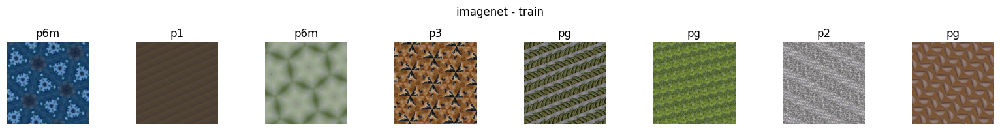

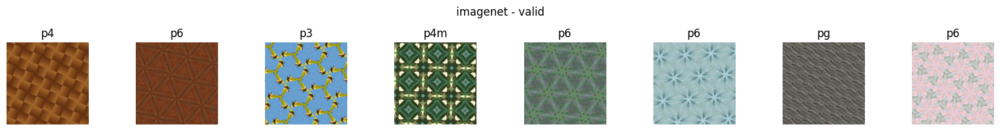

In [ ]:
training_specs['ds_size'] = 10000
training_specs['folder_name'] = task_name + '-10k'
model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

### 50k dataset

In [ ]:
training_specs['ds_size'] = 50000
training_specs['folder_name'] = task_name + '-50k'
model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

### 100K dataset

In [ ]:
training_specs['ds_size'] = 100000
training_specs['folder_name'] = task_name + '-100k'
model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

### 500K dataset

In [ ]:
training_specs['ds_size'] = 500000
training_specs['folder_name'] = task_name + '-500k'
model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

### 1 million dataset

In [ ]:
training_specs['ds_size'] = 1000000
training_specs['folder_name'] = task_name + '-1m'
model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

### 2 million dataset

In [ ]:
training_specs['ds_size'] = 2000000
training_specs['folder_name'] = task_name + '-2m'
model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)

### 5 million dataset

In [ ]:
training_specs['ds_size'] = 5000000
training_specs['folder_name'] = task_name + '-5m'
model, history = benchmark_task(task_name, model, training_specs=training_specs, ds_path_info=ds_path_info, wandb_specs=wandb_specs)